# Построение регрессии для параметра gamma
# для клеточной линии S2
### Михаль Розенвальд
13.05.20

## Данные:

**Объекты** - bins - отрезки хромосомы длина 20 000

id: chrN_start_coordinate

8430

5950 - отобранных объектов с ненулевым значений целевой переменной.

**Признаки** - эпигенетика 

*исходный файл*: "S2-DRSC.merged.binned.txt"

5950 rows


**Целевая переменная** - гамма - значение параметра

*исходный файл*: "S2_20K.flG.foundG.txt"

Значения от 0 до 10 - не расбалансировано


В этом файле:

1. data - Данные о признаках объектов - ChipSeq
2. data_scaled - Нормализация признаков - вычитаем среднее и делим на дисперсию 
3. Визуализация признаков
4. target - целевая переменная
5. findEmptyChr(), cleanDataTarget() -- отчищение данных от нулевых хромосом с отсутствующим параметром гамма
6. data_scaled_clean, target_clean - обработанные данные
7. Линейная регрессия
8. Линейная регрессия с L2 регуляризацией - Rige
9. Линейная регрессия с L1 регуляризацией - Lasso
10. Решаюшие леса


Для оценки качества использовалась класс-валидация на 5 Folds.

Рассматриваются коэффиценты моделей для выделения "значимых" признаков.

In [1]:
! ls     ../../data/epigenetics/

s2_kc_bg_scaled_18_features.csv
s2_kc_bg_scaled_18_features_2901.csv
s2_kc_bg_scaled_34_overlap_features_2901.csv


In [2]:
bioset =  None  # take all data when bioset == None
# Selecting subset of features:
# bioset = ['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac']

cell_line = 'is_kc' #'is_s2' #  'all' #  'is_bg' # 'all' # 'is_s2' # cell_line one of: 'is_s2', 'is_kc', 'is_bg',  or 'all'


data_features_path = '../../data/epigenetics/s2_kc_bg_scaled_18_features.csv'
target_path = "../../data/target/s2_kc_bg_clean_gamma_2901.csv"

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold
from sklearn import linear_model, preprocessing, ensemble

In [4]:
results_pd = pd.DataFrame(columns=['model_name', 'wMSE_test_mean', 'wMSE_test_std', 
                                   'wMSE_train_mean', 'wMSE_train_std', 'comments', 'params',
                                   'MSE_test_mean', 'MSE_test_std', 'MSE_train_mean', 'MSE_train_std', 
                                   'r2_test', 'n_splits', 'model'])
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model


In [5]:
res_dict = {
    'model_name': 'test_model',
    'wMSE_test_mean': 160, 
    'wMSE_test_std': 1, 
    'wMSE_train_mean': 16, 
    'wMSE_train_std': 3,
    'comments': 'no coms', 
    'params': 'test_params = testtest',
}


# Data

In [6]:
su_drsc = pd.read_csv(data_features_path, index_col=0)
su_drsc.head()

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589


In [7]:
su_drsc.shape

(17850, 23)

# Select features from the bioset

In [8]:
if bioset:
    su_drsc = su_drsc[bioset]
su_drsc.shape

(17850, 23)

In [9]:
su_drsc

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589
5,1,0,0,chr2L,100000,0.636797,-0.016064,-0.176933,0.642229,0.169217,...,0.793614,0.013334,-0.054968,0.347064,0.277017,-0.594765,-0.135938,0.991271,0.406406,0.343639
6,1,0,0,chr2L,120000,0.074764,-0.025722,0.146668,0.048932,0.215753,...,0.437237,-0.024372,-0.148438,0.804194,0.274420,-0.424139,0.622100,0.110407,0.529529,0.388954
7,1,0,0,chr2L,140000,0.496702,-0.175458,-0.251325,0.267109,0.027396,...,0.958440,0.170127,0.079376,0.110805,0.243425,-0.251428,0.181630,0.465191,0.312836,0.156772
8,1,0,0,chr2L,160000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,1,0,0,chr2L,180000,-0.101164,-0.047332,-0.293452,-0.091075,-0.128476,...,-0.071135,-0.229773,0.035580,-0.077755,0.356843,-0.311976,0.197046,0.869773,0.148801,-0.178991


# Target data

In [10]:
gamma_S2 = pd.read_csv(target_path, header=0, index_col=0) #None,  names=["chrN","start_coord", "gamma" ]) 
print(gamma_S2.shape)
gamma_S2.head()

(17850, 6)


,is_s2,is_kc,is_bg,chrN,start_coord,gamma
0,1,0,0,chr2L,0,0.00
1,1,0,0,chr2L,20000,3.42
2,1,0,0,chr2L,40000,3.42
3,1,0,0,chr2L,60000,1.33
4,1,0,0,chr2L,80000,1.31


# Select cell line

In [11]:
if cell_line != 'all':
    su_drsc = su_drsc[su_drsc[cell_line] == 1]
    su_drsc = su_drsc.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    su_drsc.index = np.arange(su_drsc.shape[0])

    gamma_S2 = gamma_S2[gamma_S2[cell_line] == 1]
    gamma_S2 = gamma_S2.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    gamma_S2.index = np.arange(gamma_S2.shape[0])

    
su_drsc.shape, gamma_S2.shape

((5950, 20), (5950, 3))

In [12]:
su_drsc.head()

,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,chr2L,0,-0.019850,0.038032,-0.056595,0.298637,0.000000,-0.099482,0.004689,0.177677,0.050970,0.235358,0.637254,0.019221,0.036354,-0.073005,-0.103894,0.032595,-0.124902,0.109195
1,chr2L,20000,-0.236590,0.157963,0.054756,0.503653,0.000000,-0.001772,-0.063044,0.113414,0.183057,0.213256,0.756091,-0.015072,-0.102268,-0.062634,-0.337375,-0.012044,-0.294857,-0.029815
2,chr2L,40000,-0.151475,0.077399,-0.056118,0.396535,0.154223,-0.055430,-0.028262,0.134944,0.149762,0.151227,0.600573,-0.024660,-0.030891,-0.076149,-0.254632,-0.062465,-0.196305,-0.007934
3,chr2L,60000,0.116471,0.201770,0.032706,0.870563,8.552141,0.184890,0.410352,0.643001,0.447890,-0.008040,0.118202,0.073166,0.063865,-0.263155,0.171832,0.304503,0.308834,0.299604
4,chr2L,80000,0.144870,0.058860,-0.188161,-0.382789,0.035977,-0.075821,0.360726,-0.012117,-0.207146,0.007724,-0.158474,-0.049069,-0.001108,-0.183683,0.452140,0.300934,0.019428,0.106151


In [13]:
gamma_S2.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


# Util Functions

In [14]:
def print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const):
    print('wMSE_train', np.round(np.mean(weighted_mse_train_all), 
                            decimals=2))
    print('wMSE_test', np.round(np.mean(weighted_mse_test_all), 
                          decimals=2))
    
    print('MSE_train', np.round(np.mean(MSE_train), decimals=2))
    print('MSE_test',np.round(np.mean(MSE_test), decimals=2))
    
    
    print('MAE_train', np.round(np.mean(mae_train), decimals=2))
    print('MAE_test',np.round(np.mean(mae_test), decimals=2))

    print('r2_test',np.round(np.mean(r2_test), decimals=2))

def plotData(data, ncols, nrows, method = 'hist', is_sharex=True, share_axes='y', bins=50, 
             plt_title='Histograms of data features', figsize=(20, 18), 
             cmin=None, cmax=None, min_val=None, max_val=None,
             verbose=False, fig=None, axes=None, alpha=0.6):
    if (min_val is None or  max_val is None):
        min_val, max_val = min(np.min(data)) - 3, max(np.max(data))
    if (fig is None or axes is None):
        if (share_axes == 'xy'):
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize, 
                                     sharex='all', sharey='all')
        else:
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize,
                                     sharex=is_sharex)
    fig.set_figheight(24)
    i = 0
    for row in range(nrows):
        if i >= len(data.columns):
                break      
        for col in range(ncols):
            if i >= len(data.columns):
                break
            axes[row][col].set_title(data.columns[i], fontsize=22)       
            if method == "hist":
                if (cmin is not None and  cmax is not None):
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, range=(cmin, cmax), alpha=0.6, label=plt_title) # cmin=cmin, cmax=cmax)
                else:
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, alpha=alpha, label=plt_title) # cmin=cmin, cmax=cmax)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_xlim(min_val, max_val)
                
            elif method == "original":
                axes[row][col].scatter(np.arange(0, data.shape[0]), data[[data.columns[i]]].values,)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_ylim(min_val, max_val)
                    
            if verbose:
                print(i)   
                print(data[[data.columns[i]]].mean(), data[[data.columns[i]]].std(), data[[data.columns[i]]].min(), data[[data.columns[i]]].max())
            i += 1
    plt.suptitle(plt_title, fontsize=30, y=0.92)
    # return fig, axes   



In [15]:
# find empty chromosoms: 
def findEmptyChr(data, print_info=True):
    print(data.head())

    chr_names = np.unique(data['chrN'])
    empty_chr_names = []
    num_empty_bins = 0

    for chr_i in chr_names:
        gamma_sum = sum(data[data.chrN == chr_i].gamma)
        if (print_info):
            print("---\nChr name =", chr_i)
            print("Sum of gamma values =", gamma_sum)
            print("Number of bins =", len(data[data.chrN == chr_i]))

        if (gamma_sum == 0):
            empty_chr_names.append(chr_i)
            num_empty_bins += len(data[data.chrN == chr_i])
        
    print("===")
    print("Total num of chr =", len(chr_names), "\n", chr_names)

    print("Num of empty chr =", len(empty_chr_names), "\n", empty_chr_names)

    print("Total num of chr =", len(data.index))
    print("Num of empty bins =", num_empty_bins)
    
    return(empty_chr_names, num_empty_bins)

def cleanDataTarget(data, target, print_info=True):
    ''' Remove empty (zeros) chromosomes from data and target '''
    
    empty_chr_names, num_empty_bins = findEmptyChr(target, print_info)
    return (data[~target.chrN.isin(empty_chr_names)], target[~target.chrN.isin(empty_chr_names)], empty_chr_names, num_empty_bins)


# print(sum(target[target.chrN.isin(empty_chr_names)].gamma))  # selected zero chr sum
# print(sum(target[~target.chrN.isin(empty_chr_names)].gamma))  # total sum

# target[~target.chrN.isin(empty_chr_names)]


# K-fold cross Validation

In [16]:
def train_test_KFold(X, y, model, model_name, results_pd, n_splits=10, random_state=16, shuffle=True):
    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []
    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model using the training sets
        model.fit(X_train, y_train)

        # Make predictions using the train set
        y_pred_train = model.predict(X_train)

        # Make predictions using the testing set
        y_pred = model.predict(X_test)

        MSE_train.append(mean_squared_error(y_train, y_pred_train))
        MSE_test.append(mean_squared_error(y_test, y_pred))
        r2_test.append(r2_score(y_test, y_pred))

        coefs.append(model.coef_)
        coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train, 
                                                                          y_test, 
                                                                          model)
            
        weighted_mse_test_all.append(weighted_mse_test)
        weighted_mse_train_all.append(weighted_mse_train)

    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)

    coefs = np.array(coefs)
    coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all),
          "\n MSE mean train:", np.mean(MSE_train), "\n")

    # The mean squared error
    print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), 
          "\n MSE mean test: " , np.mean(MSE_test), "\n")

    # The mean squared error
    print("Root of MSE on Test: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), 
          "\n", np.sqrt(np.mean(MSE_test)), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), 
          "\n r2_test:" , np.mean(r2_test), "\n")
    
    print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

    coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
    print(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]])
    
    res_dict = {
        'model_name': model_name,
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

    results_pd = results_pd.append(res_dict, ignore_index=True)
    results_pd
    
    return model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, results_pd

# wieghted MSE

In [17]:
def cout_errors_lin(X_train,  X_test, y_train, y_test, model):
    x_train,  x_test = X_train,  X_test
    # y_train, y_test = y_train.values, y_test.values

    # ------------PREDICTION-------------------------------------------------------------

    y_pred_test = model.predict(x_test)
    y_pred_train = model.predict(x_train)
    # y_pred_val = model.predict(x_val)

    # -------------------------------------------------------------------------

    #          TEST PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TEST PREDICTION Error")
    weighted_mse_test = weighted_mse_cout(y_true = y_test, y_pred = y_pred_test)
    rmse_test = rmse_cout(y_true = y_test, y_pred = y_pred_test)
    mae_test = mae_cout(y_true = y_test, y_pred = y_pred_test)
    print("weighted_mse_test:", weighted_mse_test, "\n\n")

    # -------------------------------------------------------------------------

    #          TRAIN PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TRAIN PREDICTION Error")
    weighted_mse_train = weighted_mse_cout(y_true = y_train, y_pred = y_pred_train)
    rmse_train = rmse_cout(y_true = y_train, y_pred = y_pred_train)
    mae_train = mae_cout(y_true = y_train, y_pred = y_pred_train)

    print("weighted_mse_train:", weighted_mse_train, "\n\n")

    # -------------------------------------------------------------------------

    #          VAL PREDICTION Error
    # -------------------------------------------------------------------------

    # # ! Count Error !
    # print(" VAL PREDICTION Error" )

    # rmse_val = rmse_cout(y_true = y_val, y_pred = y_pred_val)
    # weighted_mse_val = weighted_mse_cout(y_true = y_val, y_pred = y_pred_val)
    # mae_val = mae_cout(y_true = y_val, y_pred = y_pred_val)

    # print("rmse_val_preds:", rmse_val, "\n\n")

    # -------------------------------------------------------------------------

    # TEST Const Error

    # -------------------------------------------------------------------------


    print(" CONSTANT pred Error:" )
    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )

    weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)
    rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
    mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)
    print("weighted_mse_test_const: ", weighted_mse_test_const )


    # -------------------------------------------------------------------------
    # -------------------------------------------------------------------------

    #     ERROR by TARGET value :  

    # -------------------------------------------------------------------------


    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_plot_test_errors(model, x_test, y_test)


    mae_errors_by_grid_const, rmse_errors_by_grid_const, \
        weig_mse_errors_by_grid_const, \
            objs_by_grid_const = count_errors_by_target_grid(y_pred=const_pred_test, y_true=y_test)

    #     print(mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, objs_by_grid_const)


    return weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const
        # , \
#                 sequenc_len, overlop_len, num_epochs, BATCH_SIZE_original, \
#                 num_lstm_units, output_size, cell, \
#                 duration, \
#                 mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, \
#                 mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, \
#                 objs_by_grid_const, \
#                 history, loss_train, losss_val, mse_train_hist, mse_val_hist
        
    

In [18]:
def weighted_mse(y_true, y_pred):   
    
    diff = ( (y_true - y_pred)**2 ) * (11 - y_true)  / 11
    return  K.mean(diff)  # K.mean(K.sum(diff, axis = -1)) # 

def count_errors_by_target_grid(y_true, y_pred):
    
    if (len(y_true) != len(y_pred)) :
         return "ERROR of prediction and true size"
    
    mae_errors_by_grid = np.array([0]*11, dtype=float)
    mae_errors_by_grid
    
    rmse_errors_by_grid = np.array([0]*11, dtype=float)
    rmse_errors_by_grid
    
    weig_mse_errors_by_grid = np.array([0]*11, dtype=float)
    weig_mse_errors_by_grid
    
    objs_by_grid = np.array([0]*11, dtype=float)
    objs_by_grid

    for i in range(len(y_true)): # K.int_shape(y_true)):

    #     print(y_true[i], int(y_true[i]), np.abs(y_true[i] - y_pred[i]), errors_by_diaposone[int(y_true[i])] )
        mae_errors_by_grid[int(y_true[i])] += np.abs(y_true[i] - y_pred[i]) # (y_true[i] - y_pred[i])**2 # mse

        rmse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 # mse
        
        weig_mse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 * (11 - y_true[i]) 
       
        objs_by_grid[int(y_true[i])] += 1
      
    mae_errors_by_grid /= objs_by_grid

    rmse_errors_by_grid /= objs_by_grid
    rmse_errors_by_grid = np.sqrt(rmse_errors_by_grid)
    
    weig_mse_errors_by_grid /= objs_by_grid
        
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

def mae_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.mean(np.abs( y_true - y_pred ) )

def rmse_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.sqrt(np.mean( (y_true - y_pred)**2 ) )

def weighted_mse_cout(y_true, y_pred):
#     if ((y_pred).shape !=  y_true.shape ):
    y_pred = np.hstack(y_pred)
        
#     print(y_true, y_pred)
#     print("(y_true - y_pred) = ", (y_true - y_pred), "\n")
#     print("(y_true - y_pred)**2 = ", (y_true - y_pred)**2, "\n")
#     print("(11 - y_true) = ",(11 - y_true), "\n")
#     print("(y_true - y_pred)**2 * (11 - y_true) =  ", ((y_true - y_pred)**2) * (11 - y_true), "\n")
    
    return np.mean( ((y_true - y_pred)**2) * (11 - y_true) ) / 11 




def plot_train_res(history):
    # list all data in history
    print(history.history.keys())
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss - weighted mse')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    # summarize history for MSE
    plt.plot(history.history['mean_squared_error'])
    plt.plot(history.history['val_mean_squared_error'])
    plt.title('model mean squared error')
    plt.ylabel('mse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    

# y_range =t = np.arange(0.01, 5.0, 0.01)
# s1 = np.sin(2 * np.pi * t)
# s2 = np.exp(-t)
# s3 = np.sin(4 * np.pi * t)

def count_plot_test_errors(model, x_test, y_test):
    
    y_pred_test = model.predict(x_test)
   
    print("test sizes = ", len(y_test), len(x_test), len(y_pred_test))
#     print(count_errors_by_target_grid(y_test, y_pred_test))
#     print(mae_errors_by_grid, rmse_errors_by_grid, \
#         weig_mse_errors_by_grid, objs_by_grid )

    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_errors_by_target_grid(y_test, y_pred_test)
        
        
    y_range = np.arange(0, 11)

    # figsize=(15,15)
    f, axs = plt.subplots(figsize=(7,10))
    axs.set_ylabel('error')


    ax1 = plt.subplot(311) #, sharex=ax1)
    plt.bar(y_range, mae_errors_by_grid)
    # plt.setp(ax1.get_xticklabels(), fontsize=6)
    ax1.set_title('MAE error by target value')

    # share x only
    ax2 = plt.subplot(312)#, sharex=ax1)
    plt.bar(y_range, rmse_errors_by_grid)
    # make these tick labels invisible
    # plt.setp(ax2.get_xticklabels(), visible=False)
    ax2.set_title('RMSE error by target value')

    # share x and y
    ax3 = plt.subplot(313)#, sharex=ax1, sharey=ax1)
    plt.bar(y_range, weig_mse_errors_by_grid)

    ax3.set_title('Weighted MSE (custom) error by target value')

    # plt.xlim(0.01, 5.0)
    plt.show()
    
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

# Data standartization

In [19]:
data = su_drsc.copy()
data.shape

(5950, 20)

In [20]:
data.drop(["chrN" , "start_coord"], axis=1, inplace=True)
data.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,-0.019850,0.038032,-0.056595,0.298637,0.000000,-0.099482,0.004689,0.177677,0.050970,0.235358,0.637254,0.019221,0.036354,-0.073005,-0.103894,0.032595,-0.124902,0.109195
1,-0.236590,0.157963,0.054756,0.503653,0.000000,-0.001772,-0.063044,0.113414,0.183057,0.213256,0.756091,-0.015072,-0.102268,-0.062634,-0.337375,-0.012044,-0.294857,-0.029815
2,-0.151475,0.077399,-0.056118,0.396535,0.154223,-0.055430,-0.028262,0.134944,0.149762,0.151227,0.600573,-0.024660,-0.030891,-0.076149,-0.254632,-0.062465,-0.196305,-0.007934
3,0.116471,0.201770,0.032706,0.870563,8.552141,0.184890,0.410352,0.643001,0.447890,-0.008040,0.118202,0.073166,0.063865,-0.263155,0.171832,0.304503,0.308834,0.299604
4,0.144870,0.058860,-0.188161,-0.382789,0.035977,-0.075821,0.360726,-0.012117,-0.207146,0.007724,-0.158474,-0.049069,-0.001108,-0.183683,0.452140,0.300934,0.019428,0.106151


In [21]:
data_scaled = preprocessing.scale(data, axis=0, with_mean=True, with_std=True)
data_scaled.shape, data_scaled

((5950, 18), array([[-0.05526516,  0.17623647, -0.3827252 , ...,  0.07257786,
         -0.49043504,  0.51556867],
        [-0.88648345,  0.97782948,  0.25623235, ..., -0.02602472,
         -1.15521907, -0.11665646],
        [-0.56006128,  0.43935737, -0.37998832, ..., -0.13739944,
         -0.76972936, -0.01713819],
        ...,
        [-0.40312441, -0.38283939, -0.18166177, ..., -0.45954036,
         -0.57013914, -0.69461543],
        [-0.3406396 , -0.19082234, -0.32369045, ..., -0.31931637,
         -0.34240109, -0.39143104],
        [ 1.49338312,  2.35525213, -0.66212296, ...,  0.33419266,
          0.23627305,  0.37971   ]]))

In [22]:
data_scaled = pd.DataFrame(data_scaled)
data_scaled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-0.055265,0.176236,-0.382725,0.615836,-0.321686,-1.150007,-0.030299,0.355814,0.088574,1.892256,3.332206,0.289616,0.276073,-0.273049,-0.315416,0.072578,-0.490435,0.515569
1,-0.886483,0.977829,0.256232,0.974934,-0.321686,0.102129,-0.202139,0.218869,0.379795,1.729625,3.917137,-0.210702,-0.560819,-0.243520,-1.057711,-0.026025,-1.155219,-0.116656
2,-0.560061,0.439357,-0.379988,0.787310,-0.298974,-0.585482,-0.113895,0.264750,0.306388,1.273195,3.151659,-0.350593,-0.129901,-0.282002,-0.794650,-0.137399,-0.769729,-0.017138
3,0.467538,1.270631,0.129706,1.617598,0.937750,2.494165,0.998864,1.347437,0.963690,0.101269,0.777372,1.076657,0.442158,-0.814469,0.561191,0.673200,1.206137,1.381558
4,0.576448,0.315444,-1.137679,-0.577721,-0.316388,-0.846799,0.872964,-0.048643,-0.480513,0.217265,-0.584462,-0.706711,0.049905,-0.588185,1.452362,0.665316,0.074116,0.501726


In [23]:
data_scaled.columns = su_drsc.columns[2:]
data_scaled.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,-0.055265,0.176236,-0.382725,0.615836,-0.321686,-1.150007,-0.030299,0.355814,0.088574,1.892256,3.332206,0.289616,0.276073,-0.273049,-0.315416,0.072578,-0.490435,0.515569
1,-0.886483,0.977829,0.256232,0.974934,-0.321686,0.102129,-0.202139,0.218869,0.379795,1.729625,3.917137,-0.210702,-0.560819,-0.243520,-1.057711,-0.026025,-1.155219,-0.116656
2,-0.560061,0.439357,-0.379988,0.787310,-0.298974,-0.585482,-0.113895,0.264750,0.306388,1.273195,3.151659,-0.350593,-0.129901,-0.282002,-0.794650,-0.137399,-0.769729,-0.017138
3,0.467538,1.270631,0.129706,1.617598,0.937750,2.494165,0.998864,1.347437,0.963690,0.101269,0.777372,1.076657,0.442158,-0.814469,0.561191,0.673200,1.206137,1.381558
4,0.576448,0.315444,-1.137679,-0.577721,-0.316388,-0.846799,0.872964,-0.048643,-0.480513,0.217265,-0.584462,-0.706711,0.049905,-0.588185,1.452362,0.665316,0.074116,0.501726


## Explore features distribution

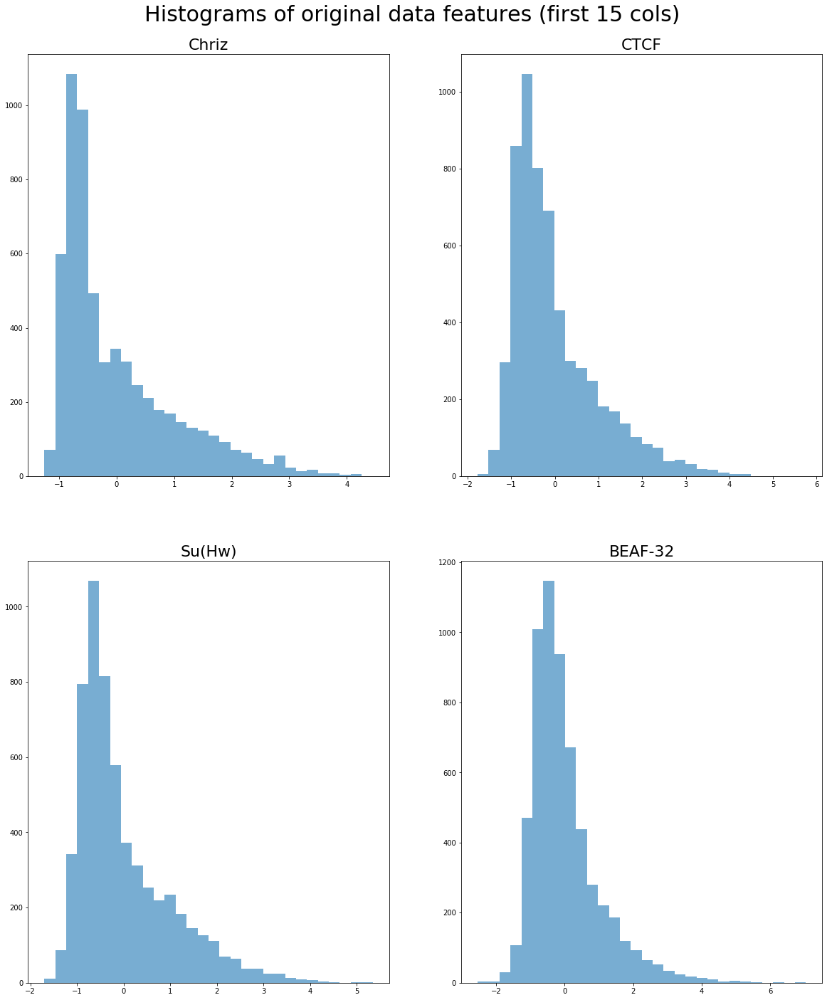

In [24]:
ncols = 2
nrows = 2
plotData(pd.DataFrame(data_scaled), ncols, nrows, bins=30, method = 'hist', is_sharex=False, plt_title='Histograms of original data features (first 15 cols)')

# target - gamma

# Explore target

In [25]:
target = gamma_S2.copy()
target.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


In [26]:
# np.unique(target.gamma)

Text(0.5, 1.0, 'gamma values for all bins')

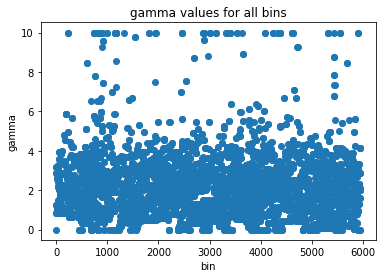

In [27]:
plt.scatter(np.arange(len(target.gamma)), target.gamma) # target
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('gamma values for all bins')

Text(0.5, 1.0, 'Distribution of gamma values for all bins')

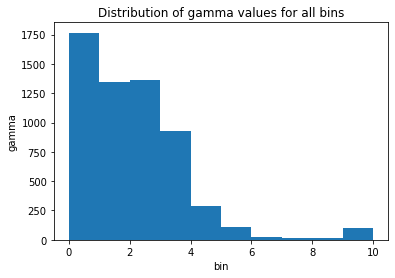

In [28]:
plt.hist(target.gamma)
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('Distribution of gamma values for all bins')

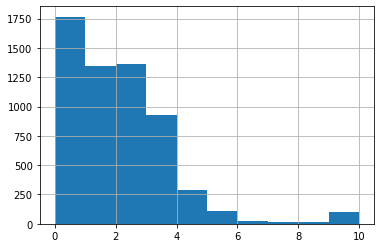

In [29]:
target.gamma.hist()

Log scale

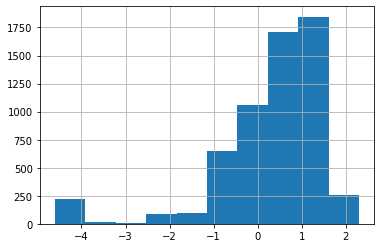

In [30]:
(np.log(0.01+target.gamma)).hist()

# Clean Data  from empty chromosomes

In [31]:
data_scaled_clean, target_clean, empty_chr_names, num_empty_bins = data_scaled, target, [], []
# cleanDataTarget(data_scaled, target)

data_scaled_clean.shape, target_clean.shape

((5950, 18), (5950, 3))

In [32]:
data_scaled_clean.head()

,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,-0.055265,0.176236,-0.382725,0.615836,-0.321686,-1.150007,-0.030299,0.355814,0.088574,1.892256,3.332206,0.289616,0.276073,-0.273049,-0.315416,0.072578,-0.490435,0.515569
1,-0.886483,0.977829,0.256232,0.974934,-0.321686,0.102129,-0.202139,0.218869,0.379795,1.729625,3.917137,-0.210702,-0.560819,-0.243520,-1.057711,-0.026025,-1.155219,-0.116656
2,-0.560061,0.439357,-0.379988,0.787310,-0.298974,-0.585482,-0.113895,0.264750,0.306388,1.273195,3.151659,-0.350593,-0.129901,-0.282002,-0.794650,-0.137399,-0.769729,-0.017138
3,0.467538,1.270631,0.129706,1.617598,0.937750,2.494165,0.998864,1.347437,0.963690,0.101269,0.777372,1.076657,0.442158,-0.814469,0.561191,0.673200,1.206137,1.381558
4,0.576448,0.315444,-1.137679,-0.577721,-0.316388,-0.846799,0.872964,-0.048643,-0.480513,0.217265,-0.584462,-0.706711,0.049905,-0.588185,1.452362,0.665316,0.074116,0.501726


In [33]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


Target distribution

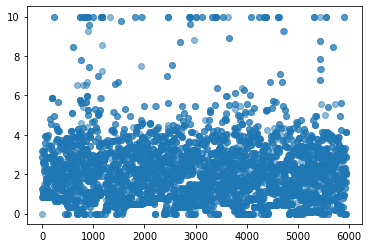

In [34]:
plt.scatter(np.arange(len(target_clean)),  target_clean.gamma, alpha=0.5)

(array([1766., 1347., 1362.,  927.,  291.,  106.,   27.,   14.,   12.,
          98.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

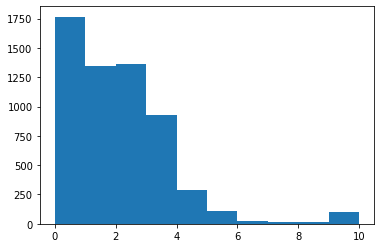

In [35]:
plt.hist(target_clean.gamma)

Log scale

(array([ 222.,    0.,   11.,    5.,   44.,  127.,  679., 1516., 2793.,
         553.]),
 array([-6.90775528, -5.98671124, -5.06566721, -4.14462317, -3.22357913,
        -2.3025351 , -1.38149106, -0.46044702,  0.46059701,  1.38164105,
         2.30268509]),
 <a list of 10 Patch objects>)

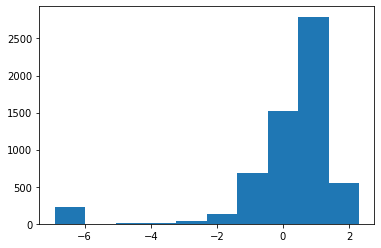

In [36]:
plt.hist(np.log(0.001 + target_clean.gamma))

In [37]:
target.shape, target.head()

((5950, 3),     chrN  start_coord  gamma
 0  chr2L            0   0.00
 1  chr2L        20000   2.85
 2  chr2L        40000   2.85
 3  chr2L        60000   0.83
 4  chr2L        80000   0.83)

# data_scaled_clean, target_clean - prossesed data

# Train Test Split

In [38]:
data = data_scaled_clean 
target = target_clean['gamma']

In [39]:
X, y = data_scaled_clean, target_clean['gamma']
X.shape, y.shape

((5950, 18), (5950,))

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=16)

X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((4165, 18), (1785, 18), (4165,), (1785,))

# Linear Regression

In [41]:
%time

# Create linear regression object
lin_reg = linear_model.LinearRegression() 

# Train the model using the training sets
lin_reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg.predict(X_test)

model = lin_reg

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.91 µs


 TEST PREDICTION Error
weighted_mse_test: 0.9629176651594556 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0242856637141509 


 CONSTANT pred Error:
weighted_mse_test_const:  1.529260633960329
test sizes =  1785 1785 1785


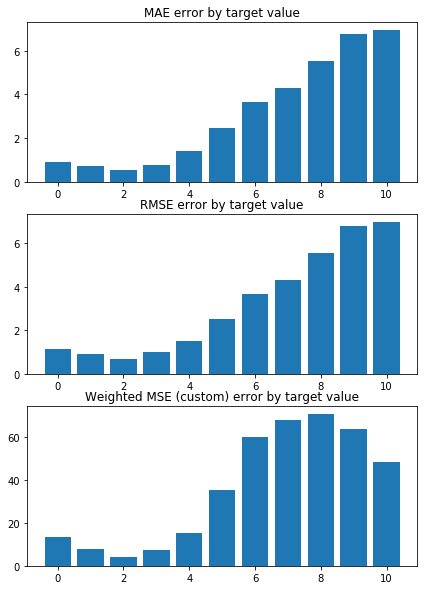

In [42]:
# Make predictions using the testing set
y_pred_train = lin_reg.predict(X_train)

weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train.values, 
                                                                          y_test.values, 
                                                                          model)

In [43]:
# The coefficients
print('Coefficients: \n', lin_reg.coef_[:20])

Coefficients: 
 [-1.04360740e-01 -9.22926469e-02  1.27557700e-01 -1.40925576e-01
  4.61164462e-03 -2.99810184e-01 -3.20775905e-01  4.38122616e-02
 -1.72138362e-01  1.85194497e-01 -3.52728354e-02  3.54009335e-04
  5.91437403e-02 -1.31049082e-01 -3.41858517e-01 -6.22596545e-01
  4.29594035e-01  8.41075589e-02]


In [44]:
coef = lin_reg.coef_

(array([1., 0., 2., 1., 4., 4., 3., 2., 0., 1.]),
 array([-0.62259655, -0.51737749, -0.41215843, -0.30693937, -0.20172031,
        -0.09650126,  0.0087178 ,  0.11393686,  0.21915592,  0.32437498,
         0.42959404]),
 <a list of 10 Patch objects>)

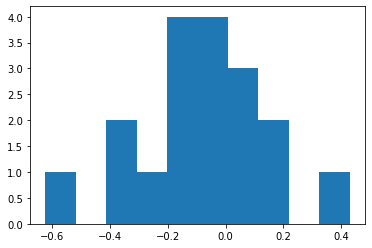

In [45]:
plt.hist(lin_reg.coef_)

Посмотрим на распределения остатков и на нормальное распределение.

(array([  1.,   0.,   0.,   0.,   0.,   1.,   1.,   0.,   2.,   5.,   5.,
         12.,  10.,  15.,  23.,  32.,  39.,  55.,  61.,  82.,  81., 127.,
        146., 158., 161., 218., 239., 247., 228., 218., 262., 272., 209.,
        177., 166., 138., 136., 108.,  79.,  76.,  52.,  40.,  41.,  26.,
         18.,  10.,  11.,   5.,   4.,   3.]),
 array([-4.37739492, -4.22817485, -4.07895479, -3.92973472, -3.78051466,
        -3.63129459, -3.48207452, -3.33285446, -3.18363439, -3.03441432,
        -2.88519426, -2.73597419, -2.58675412, -2.43753406, -2.28831399,
        -2.13909392, -1.98987386, -1.84065379, -1.69143373, -1.54221366,
        -1.39299359, -1.24377353, -1.09455346, -0.94533339, -0.79611333,
        -0.64689326, -0.49767319, -0.34845313, -0.19923306, -0.05001299,
         0.09920707,  0.24842714,  0.39764721,  0.54686727,  0.69608734,
         0.8453074 ,  0.99452747,  1.14374754,  1.2929676 ,  1.44218767,
         1.59140774,  1.7406278 ,  1.88984787,  2.03906794,  2.188288  ,
 

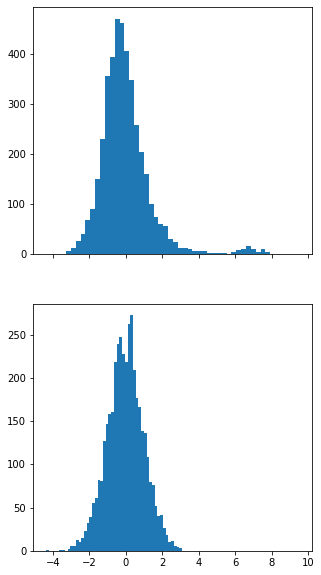

In [46]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train).values, bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

Следовательно ошибка на train имеет нормальное распределение -> модель обучается описывать данные

Значения, на которых модель возвращает наибольшую ошибку:

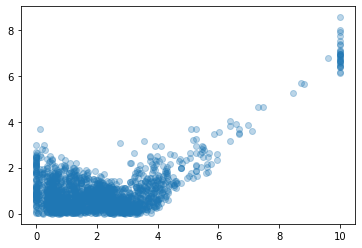

In [47]:
plt.scatter(y_test,  np.abs(y_test - y_pred) , alpha=0.3)

# Remove outlires
Посмотрим на результаты удаления объектов, для которых значение целевой переменной больше 9.

In [48]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


In [49]:
data_scaled_clean[target < 9].values

target[target < 9].values

array([0.  , 2.85, 2.85, ..., 2.03, 0.  , 0.  ])

KFold(n_splits=5, random_state=3, shuffle=True)
train_index= [   1    2    3 ... 5848 5849 5851]
 TEST PREDICTION Error
weighted_mse_test: 0.9114520095230851 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8658344747874094 


 CONSTANT pred Error:
weighted_mse_test_const:  1.451074897361999
test sizes =  1171 1171 1171


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


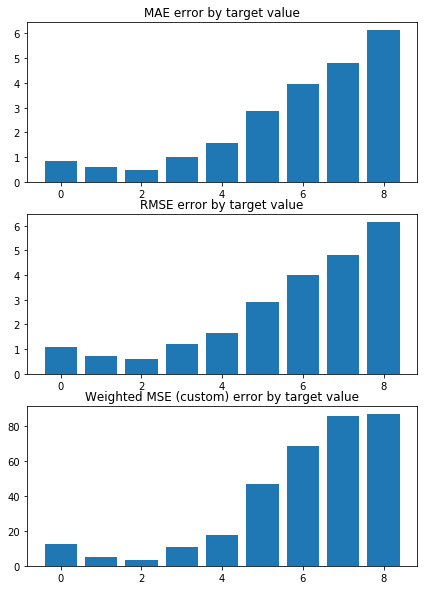

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 0.8774088703502018 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8761689490129385 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3540046096107365
test sizes =  1171 1171 1171


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


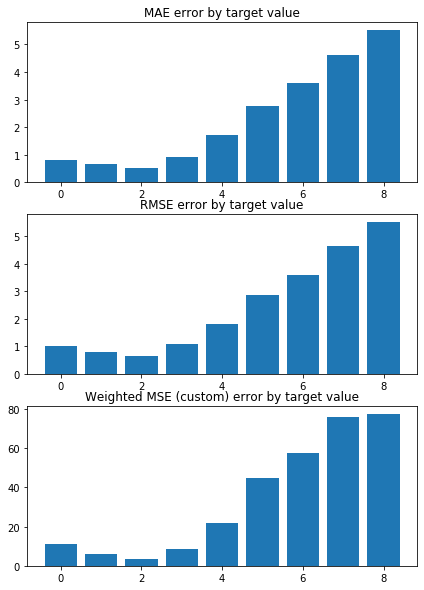

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 0.9186672234179837 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8684096574284095 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4065885595837528
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


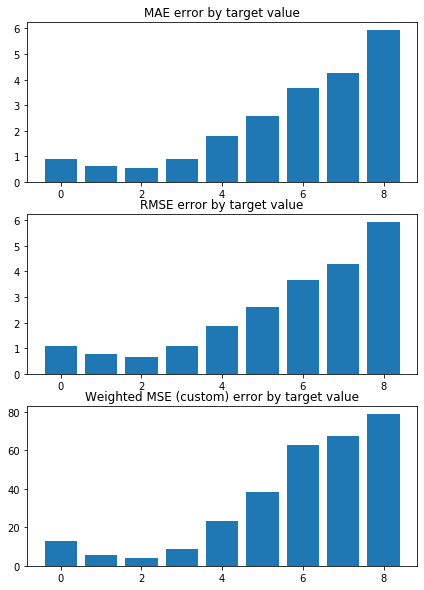

train_index= [   0    3    4 ... 5847 5848 5850]
 TEST PREDICTION Error
weighted_mse_test: 0.8056623369136461 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8997293795620677 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3523979792411716
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


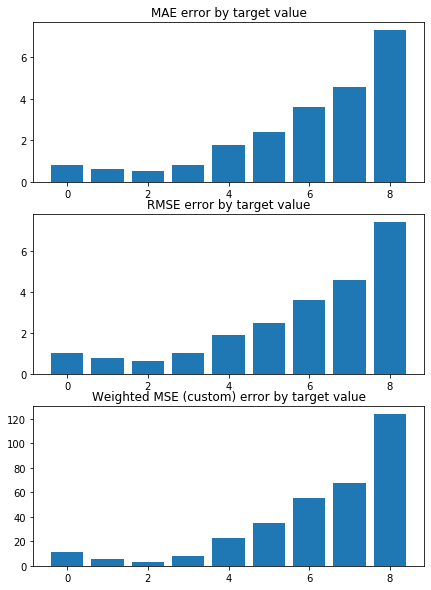

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 0.8972188020606254 


 TRAIN PREDICTION Error
weighted_mse_train: 0.8728736550209995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4243478556596576
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


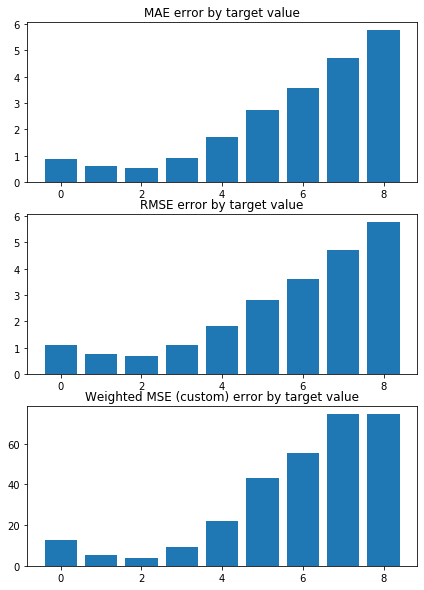

Weighted Mean squared error on Train: 0.88 
 MSE mean train: 1.2583378899392303 

Mean squared error on Test: 0.88 
 MSE mean test:  1.2660811648035823 

Root of MSE on Test: 0.94 
 1.125202721647785 

Variance score on Test: 0.04 
 r2_test: 0.35521035330564477 

wMSE_train 0.88
wMSE_test 0.88
MSE_train 1.26
MSE_test 1.27
MAE_train 0.84
MAE_test 0.85
r2_test 0.36
   H3K36me3   H4K16ac       GAF   H3K4me1  H3K36me1    Su(Hw)     Chriz  \
0 -0.418998  0.311411 -0.273084 -0.266720 -0.251299  0.167090 -0.164214   
1 -0.450094  0.290177 -0.255474 -0.246969 -0.263815  0.140231 -0.235313   
2 -0.469608  0.310111 -0.256332 -0.194319 -0.244805  0.146921 -0.206734   
3 -0.433144  0.277312 -0.275290 -0.251623 -0.254324  0.140481 -0.208965   
4 -0.453218  0.274410 -0.265332 -0.219846 -0.284223  0.143240 -0.202300   

    H3K9me2   H3K9me3   H3K4me3   H3K4me2   BEAF-32      CTCF  H3K27me3  \
0  0.140607 -0.110124 -0.093693  0.083285 -0.080784 -0.038686 -0.037678   
1  0.138507 -0.105781 -0.008138  

In [50]:
X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 
model_name = 'LR+L1_no_outliers'


lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=5, random_state=3, shuffle=True)


In [51]:
results_pd 

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.0121,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9207946942169912 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0052947139709658 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


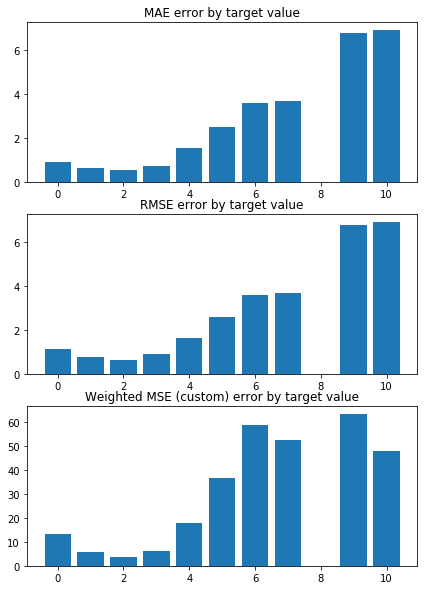

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9636326385605609 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0099787415727306 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


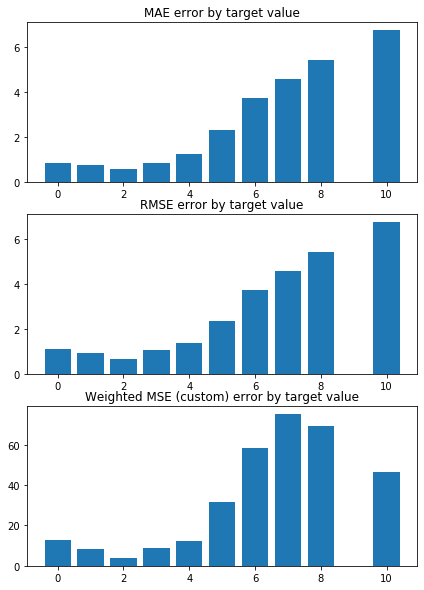

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9899108643765019 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0028070877586606 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


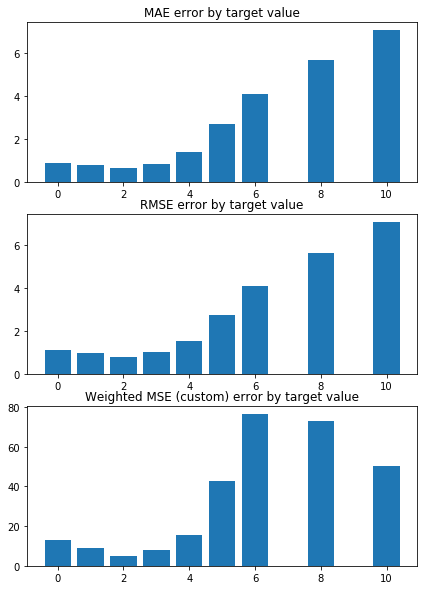

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0598734779663286 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9903170991439469 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


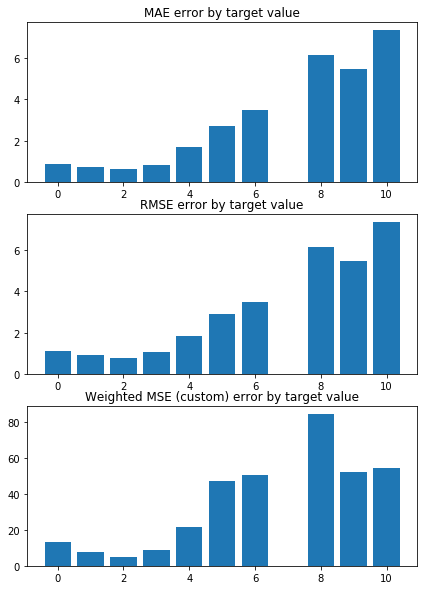

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9824384756272402 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0024322848366243 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


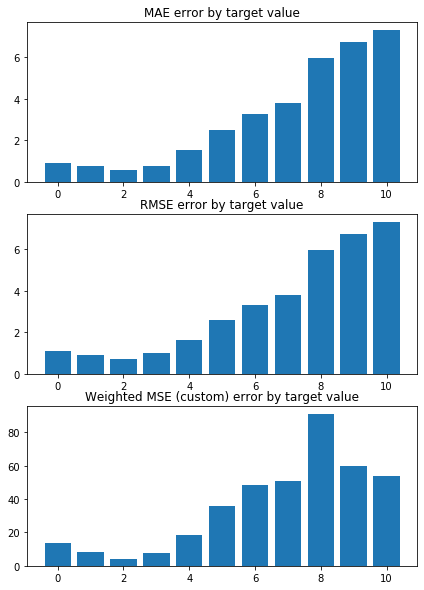

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.074025435929587 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9922696897590534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


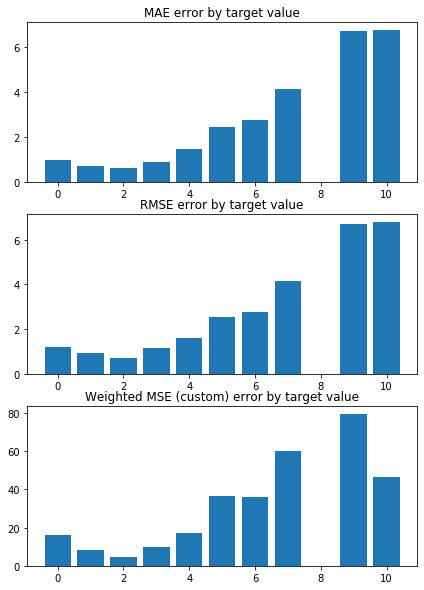

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.979877132949369 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0031022329965757 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


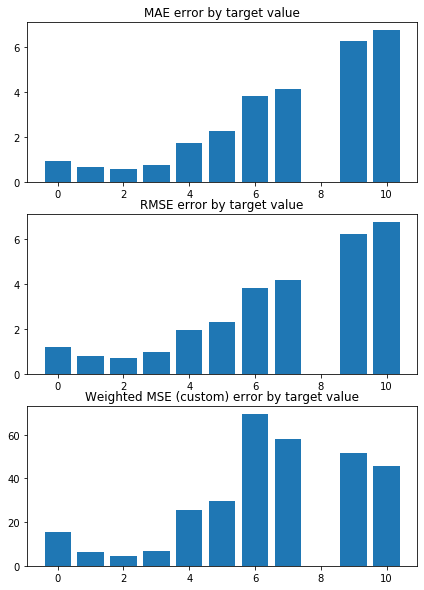

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.065803028248132 


 TRAIN PREDICTION Error
weighted_mse_train: 0.994112850950795 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


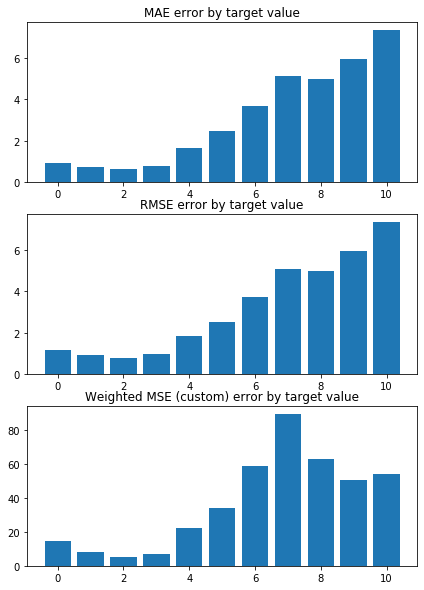

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0846201555666768 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875771971304794 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


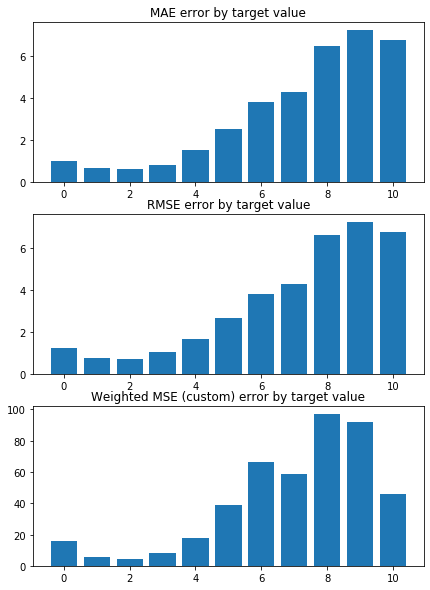

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338448457395163 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081880474286722 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


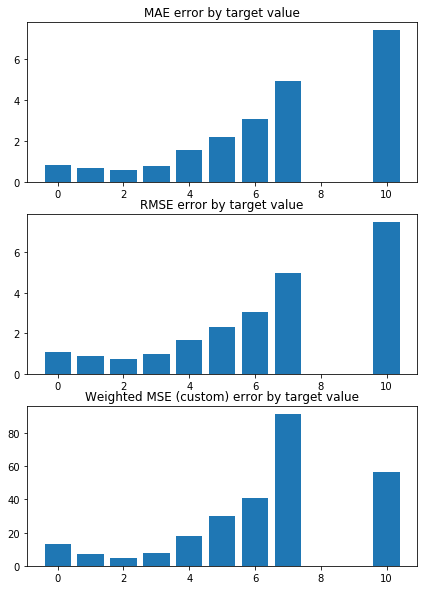

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076784477052019 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900530792800955 

Root of MSE on Test: 1.00 
 1.4457015872164267 

Variance score on Test: 0.06 
 r2_test: 0.294871896774198 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.577725  0.383409 -0.359466 -0.290118 -0.286989  0.168162 -0.164325   
1 -0.616361  0.419153 -0.336181 -0.275444 -0.314071  0.151599 -0.146317   
2 -0.597374  0.407324 -0.344197 -0.311805 -0.323021  0.160319 -0.197146   
3 -0.594079  0.389974 -0.376728 -0.274175 -0.282688  0.161526 -0.129869   
4 -0.612782  0.394975 -0.323170 -0.292868 -0.313231  0.168017 -0.127444   
5 -0.580190  0.362782 -0.338988 -0.290572 -0.292281  0.184178 -0.127902   
6 -0.589758  0.401186 -0.357072 -0.285514 -0.280753  0.178384 -0.190846   
7 -0.567009  0.402720 -0.371730 -0.29

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [52]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

In [53]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [54]:
coefs_argsort, coefs

(array([[15, 16,  6,  5, 14,  2,  8,  9, 13,  0,  3,  1, 17,  7, 10, 12,
         11,  4],
        [15, 16,  6, 14,  5,  9,  2,  8,  3, 13,  0,  1, 17, 12, 10,  7,
          4, 11],
        [15, 16,  6, 14,  5,  8,  9,  2, 13,  3,  0,  7,  1, 17, 10, 12,
         11,  4],
        [15, 16,  6, 14,  5,  9,  2, 13,  8,  0,  3,  1, 10, 17,  7, 12,
         11,  4],
        [15, 16,  6, 14,  5,  9,  2,  3, 13,  0,  8, 17,  1, 10,  7, 12,
         11,  4],
        [15, 16,  6, 14,  5,  2,  9, 13,  8,  0,  3,  1, 17,  7, 12, 10,
          4, 11],
        [15, 16,  6,  5, 14,  8,  2,  9,  3, 13,  1,  0,  7, 17, 10, 12,
          4, 11],
        [15, 16,  6, 14,  5,  8,  2,  9, 13,  0,  3, 17,  1,  7, 10, 12,
          4, 11],
        [15, 16,  6, 14,  5,  8,  9,  2, 13,  0,  3, 17,  1,  7, 10, 12,
          4, 11],
        [15, 16,  6,  5, 14,  8,  2,  9, 13,  1,  3,  0, 17,  7, 12, 10,
         11,  4]]), array([[-1.26047343e-01, -1.06315424e-01,  1.68161757e-01,
         -1.11427846e-01, -5.

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

(array([  1.,   0.,   0.,   1.,   0.,   2.,   1.,   4.,   6.,   5.,   9.,
         22.,  21.,  30.,  36.,  45.,  66.,  82.,  83., 107., 117., 174.,
        181., 186., 212., 200., 215., 237., 250., 218., 228., 186., 168.,
        175., 160., 125., 111.,  72.,  70.,  56.,  40.,  29.,  16.,  14.,
         17.,   8.,  10.,   2.,   1.,   1.]),
 array([-3.99946634, -3.85435909, -3.70925184, -3.56414459, -3.41903734,
        -3.27393009, -3.12882284, -2.98371559, -2.83860834, -2.69350109,
        -2.54839383, -2.40328658, -2.25817933, -2.11307208, -1.96796483,
        -1.82285758, -1.67775033, -1.53264308, -1.38753583, -1.24242858,
        -1.09732133, -0.95221408, -0.80710683, -0.66199958, -0.51689232,
        -0.37178507, -0.22667782, -0.08157057,  0.06353668,  0.20864393,
         0.35375118,  0.49885843,  0.64396568,  0.78907293,  0.93418018,
         1.07928743,  1.22439468,  1.36950193,  1.51460918,  1.65971644,
         1.80482369,  1.94993094,  2.09503819,  2.24014544,  2.38525269,
 

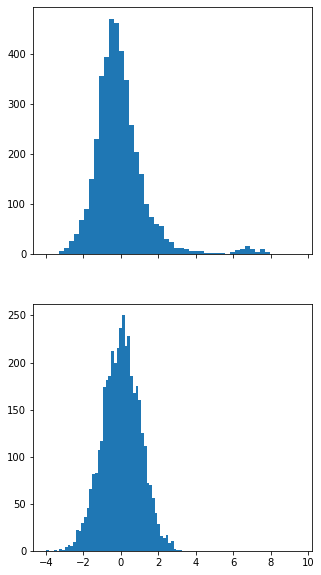

In [55]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

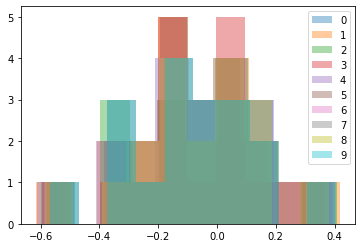

In [56]:
for i, coef_i in enumerate(coefs):
    plt.hist(coef_i, label=str(i), alpha=0.4, bins=10)
plt.legend()

(array([1., 0., 2., 1., 5., 2., 3., 3., 0., 1.]),
 array([-0.57772547, -0.48161199, -0.38549852, -0.28938504, -0.19327157,
        -0.09715809, -0.00104461,  0.09506886,  0.19118234,  0.28729582,
         0.38340929]),
 <a list of 10 Patch objects>)

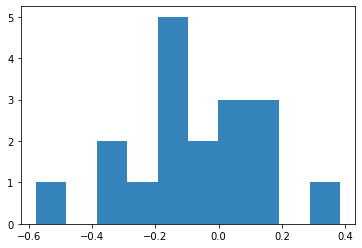

In [57]:
plt.hist(coefs[0], label=str(i), alpha=0.9, bins=10)

### Отсортированные номера выделенных признаков обычной линейной модели

In [58]:
su_drsc.columns

Index(['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190',
       'GAF', 'H3K4me1', 'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac',
       'H3K27me1', 'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac',
       'RNA-polymerase-II'],
      dtype='object')

In [59]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K36me3', 'H4K16ac', 'H3K4me1', 'GAF', 'H3K36me1', 'Su(Hw)',
       'H3K4me3', 'H3K9me2', 'H3K27me3', 'Chriz', 'BEAF-32', 'CTCF',
       'RNA-polymerase-II', 'H3K4me2', 'H3K9me3', 'H3K27me1', 'H3K27ac',
       'CP190'],
      dtype='object')

In [60]:
coefs_argsort

array([[15, 16,  6,  5, 14,  2,  8,  9, 13,  0,  3,  1, 17,  7, 10, 12,
        11,  4],
       [15, 16,  6, 14,  5,  9,  2,  8,  3, 13,  0,  1, 17, 12, 10,  7,
         4, 11],
       [15, 16,  6, 14,  5,  8,  9,  2, 13,  3,  0,  7,  1, 17, 10, 12,
        11,  4],
       [15, 16,  6, 14,  5,  9,  2, 13,  8,  0,  3,  1, 10, 17,  7, 12,
        11,  4],
       [15, 16,  6, 14,  5,  9,  2,  3, 13,  0,  8, 17,  1, 10,  7, 12,
        11,  4],
       [15, 16,  6, 14,  5,  2,  9, 13,  8,  0,  3,  1, 17,  7, 12, 10,
         4, 11],
       [15, 16,  6,  5, 14,  8,  2,  9,  3, 13,  1,  0,  7, 17, 10, 12,
         4, 11],
       [15, 16,  6, 14,  5,  8,  2,  9, 13,  0,  3, 17,  1,  7, 10, 12,
         4, 11],
       [15, 16,  6, 14,  5,  8,  9,  2, 13,  0,  3, 17,  1,  7, 10, 12,
         4, 11],
       [15, 16,  6,  5, 14,  8,  2,  9, 13,  1,  3,  0, 17,  7, 12, 10,
        11,  4]])

In [61]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,15,16,6,5,14,2,8,9,13,0,3,1,17,7,10,12,11,4
1,15,16,6,14,5,9,2,8,3,13,0,1,17,12,10,7,4,11
2,15,16,6,14,5,8,9,2,13,3,0,7,1,17,10,12,11,4
3,15,16,6,14,5,9,2,13,8,0,3,1,10,17,7,12,11,4
4,15,16,6,14,5,9,2,3,13,0,8,17,1,10,7,12,11,4
5,15,16,6,14,5,2,9,13,8,0,3,1,17,7,12,10,4,11
6,15,16,6,5,14,8,2,9,3,13,1,0,7,17,10,12,4,11
7,15,16,6,14,5,8,2,9,13,0,3,17,1,7,10,12,4,11
8,15,16,6,14,5,8,9,2,13,0,3,17,1,7,10,12,4,11
9,15,16,6,5,14,8,2,9,13,1,3,0,17,7,12,10,11,4


# !! одинаковая приоритизация 

In [62]:
def getConfIdxFrequencies(coefs_argsort, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(key, value))
        
    return featur_freq_dict

In [63]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 3)

4: 10
6: 10
11: 10
15: 10
16: 10
12: 7
10: 2
7: 1


## Explore fold with big error

train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    2    3 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5948 5949]
train_index= [   1    4    5 ... 5945 5947 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5947 5948]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]


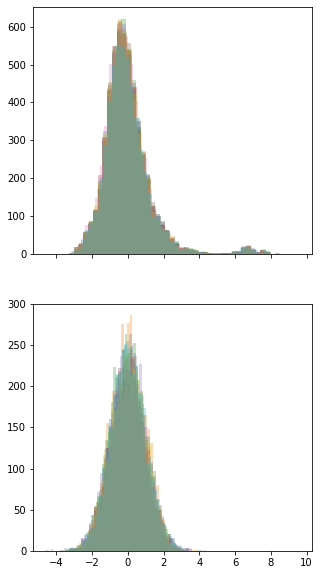

In [64]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

     # Train the model using the training sets
    model.fit(X_train, y_train)

    # Make predictions using the train set
    y_pred_train = model.predict(X_train)

    # Make predictions using the testing set
    y_pred = model.predict(X_test)

    axes[0].hist(y_train - y_pred_train, bins=50, alpha=0.3)
    axes[1].hist(np.random.randn(4000), bins=50, alpha=0.3)

# ================================================================

# Linear Regression with L1 regularization -  LASSO

$$ (1 / (2  n\_{samples}))  ||y - Xw||^2_2 + \alpha * ||w||_1 $$


In [65]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)

In [66]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso()

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

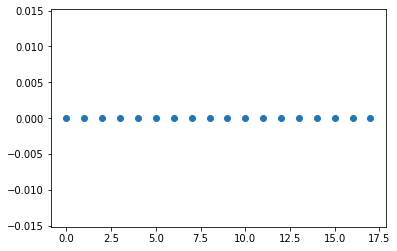

In [67]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [68]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [69]:
lin_reg_l1.coef_

array([-0., -0.,  0., -0., -0., -0., -0., -0., -0., -0., -0.,  0., -0.,
        0., -0., -0., -0., -0.])

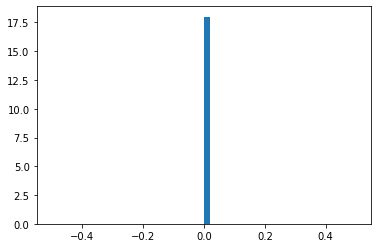

In [70]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [71]:
# f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
# axes[0].hist((y_train - y_pred_train), bins=50)
# axes[1].hist(np.random.randn(4000), bins=50)

### Cross validation
without outliers

In [72]:
# X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# # Create linear regression with L2 regularization object
# model_l1 = linear_model.Lasso(0.2)

# model_name = 'LR+L1_t<.9'

# lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
#                 weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const, \
#                 results_pd = train_test_KFold(X, y, 
#                                               model, model_name, results_pd,
#                                               n_splits=5, random_state=3, shuffle=True)
# results_pd

In [73]:
# np.mean(weighted_mse_test_all)

In [74]:
# for coef_i in coefs_l1:
#     plt.hist(coef_i, alpha=0.5)
# plt.hist(coefs_l1[0], alpha=0.5)

In [75]:
# np.sort(coefs_l1)

In [76]:
# lin_reg_l1.predict(X_test)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L 1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5233751150317654 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


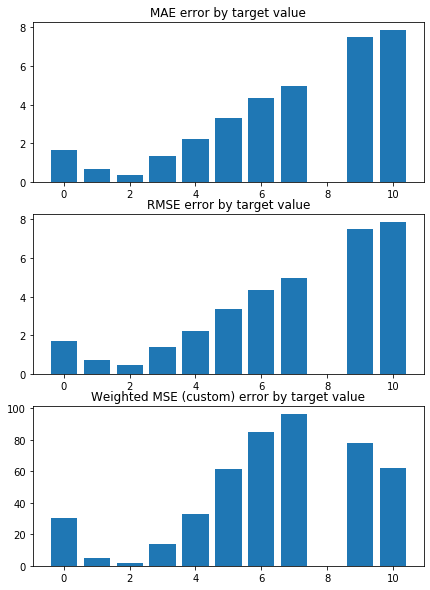

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


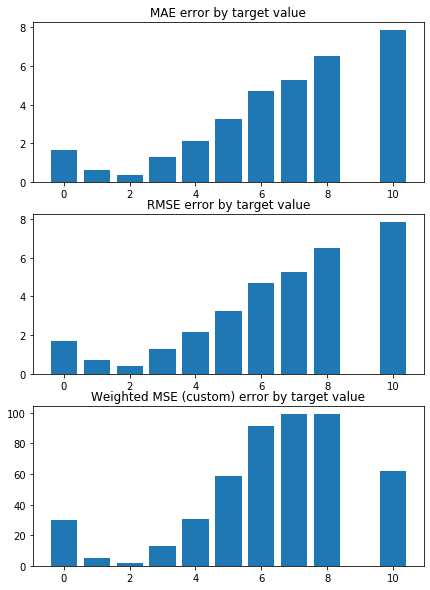

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


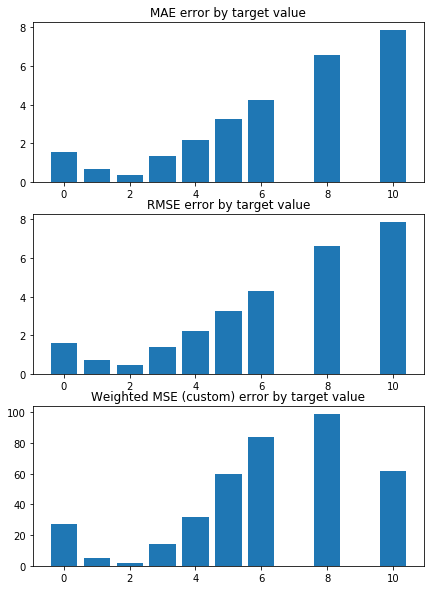

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


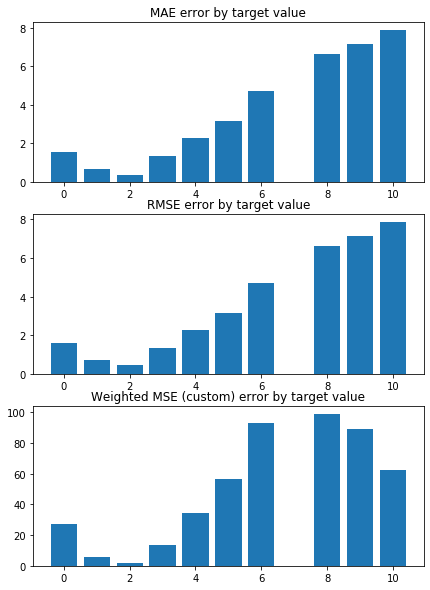

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


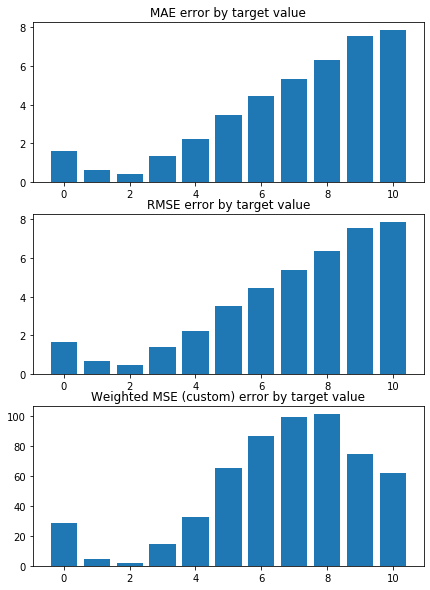

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


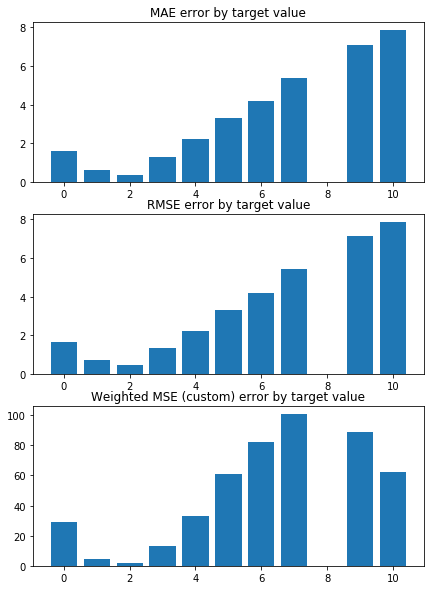

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


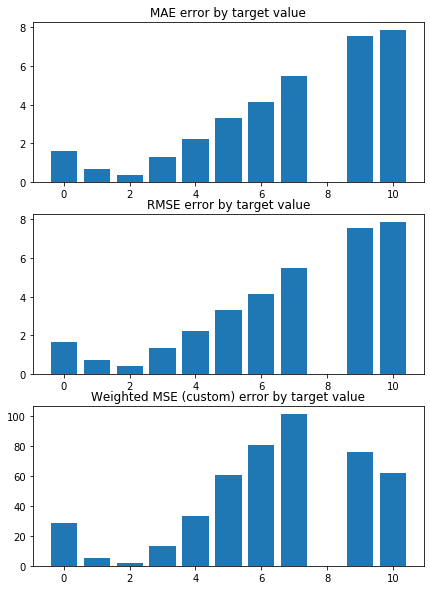

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


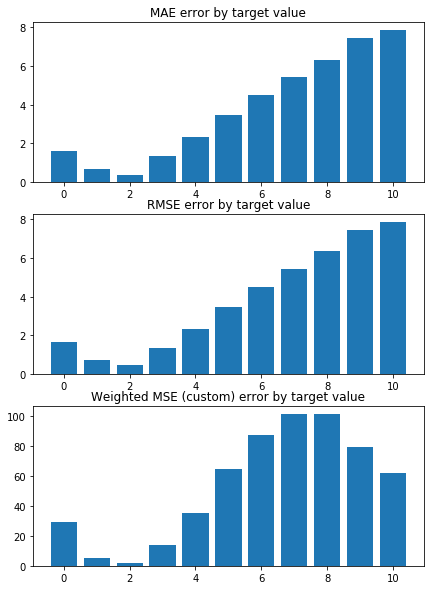

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


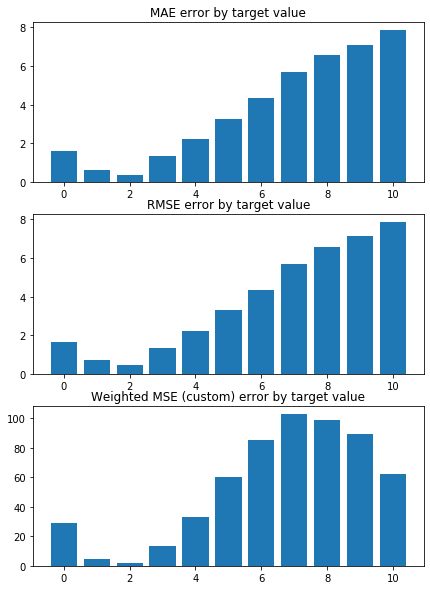

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


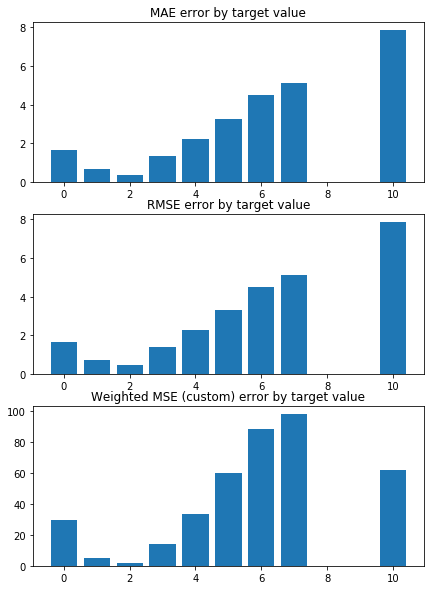

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."


In [77]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.Lasso()

model_name = 'LR+L1'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

# Fined parametrs for lasso L1

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9207946942169193 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0052947139708956 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5580.177460787563, tolerance: 1.5753001672530345
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

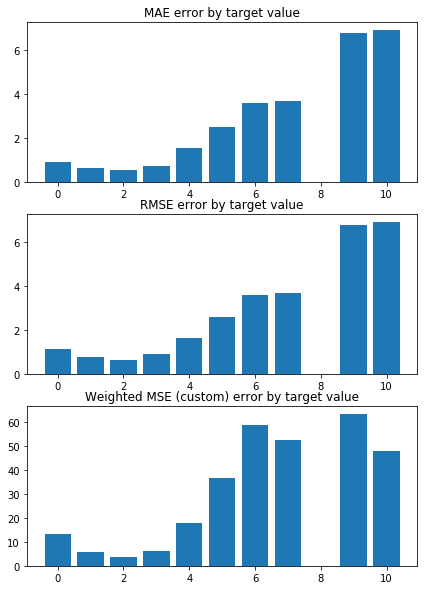

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9636326385609956 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0099787415726738 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5642.099775947289, tolerance: 1.5951549408328658
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

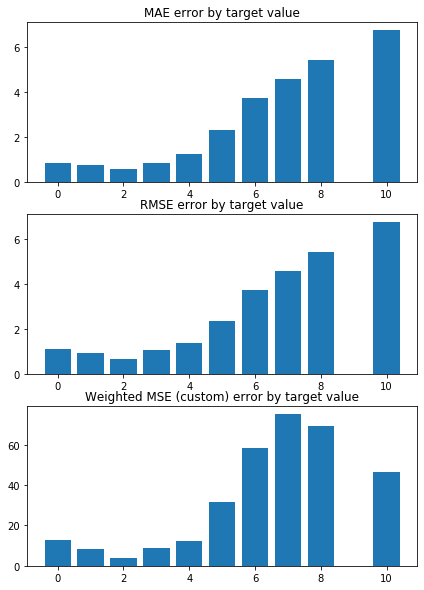

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.989910864376035 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002807087758519 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5532.50200380008, tolerance: 1.5821769354883282
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

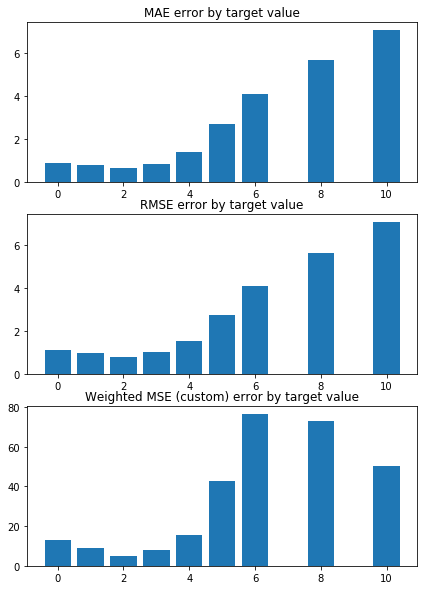

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0598734779663155 


 TRAIN PREDICTION Error
weighted_mse_train: 0.990317099143811 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5397.309586260339, tolerance: 1.5581200225471517
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

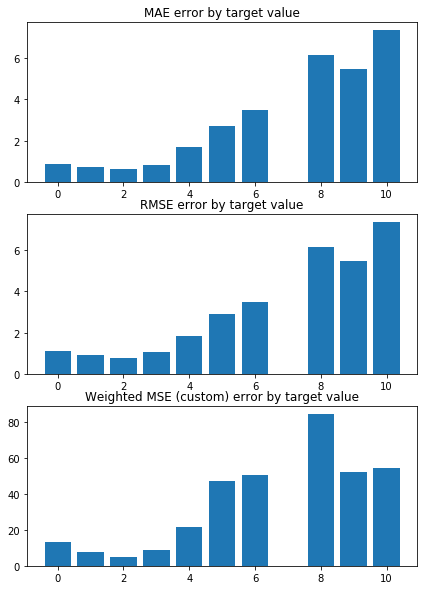

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9824384756274219 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0024322848365612 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5667.20763820735, tolerance: 1.6044926244369746
  positive)


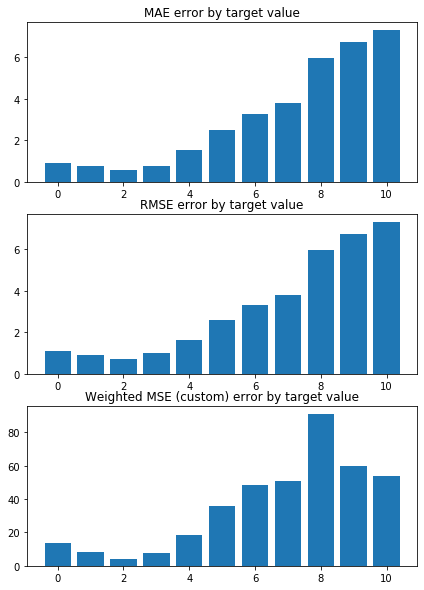

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0740254359296069 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9922696897589997 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5458.75007140212, tolerance: 1.5618709890457518
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

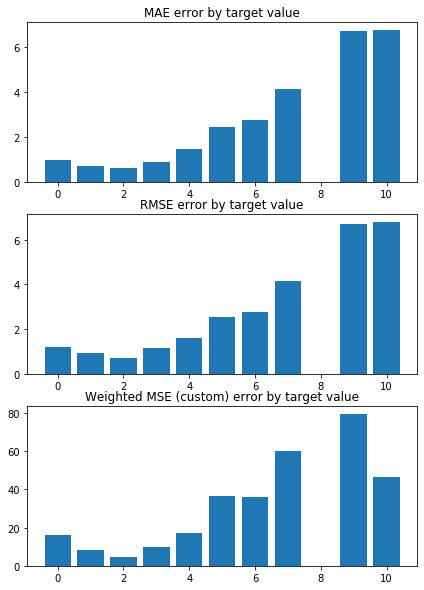

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9798771329490155 


 TRAIN PREDICTION Error
weighted_mse_train: 1.003102232996511 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5641.873242432553, tolerance: 1.6006251832941174
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

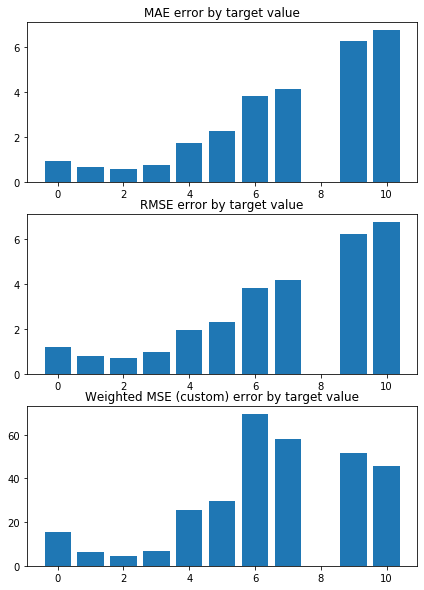

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0658030282478732 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9941128509507394 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5593.180610592562, tolerance: 1.591772067394958
  positive)


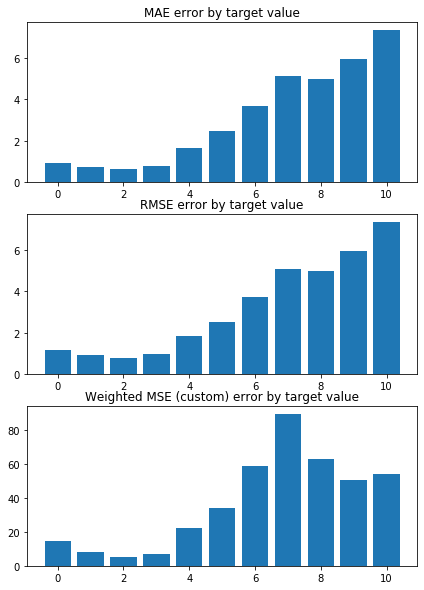

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0846201555666581 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875771971303583 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5522.002913154479, tolerance: 1.5756948114957992
  positive)


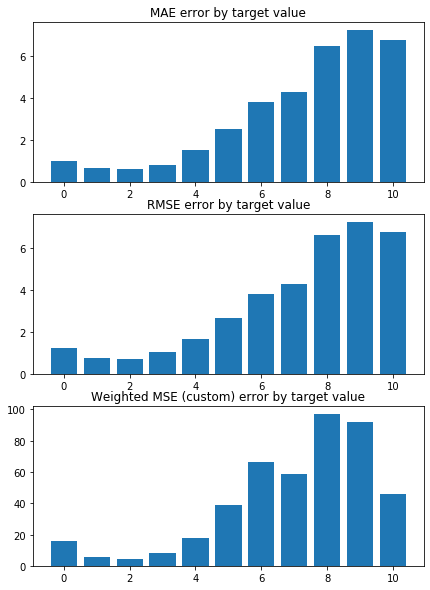

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338448457390943 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081880474285914 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5570.801070483486, tolerance: 1.5896707153314662
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

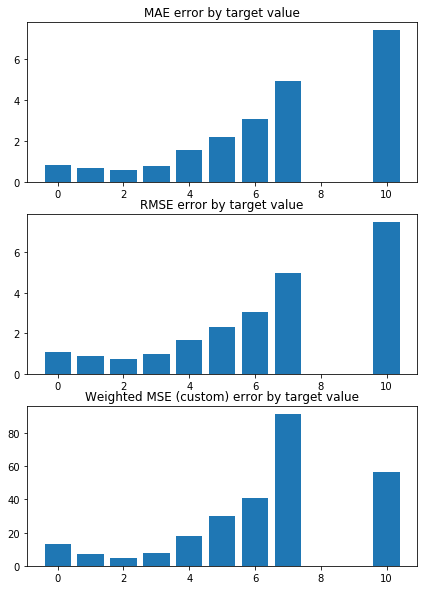

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076784477052019 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900530792800787 

Root of MSE on Test: 1.00 
 1.445701587216421 

Variance score on Test: 0.06 
 r2_test: 0.29487189677420245 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.577725  0.383409 -0.359466 -0.290118 -0.286989  0.168162 -0.164325   
1 -0.616361  0.419153 -0.336181 -0.275444 -0.314071  0.151599 -0.146317   
2 -0.597374  0.407324 -0.344197 -0.311805 -0.323021  0.160319 -0.197146   
3 -0.594079  0.389974 -0.376728 -0.274175 -0.282688  0.161526 -0.129869   
4 -0.612782  0.394975 -0.323170 -0.292868 -0.313231  0.168017 -0.127444   
5 -0.580190  0.362782 -0.338988 -0.290572 -0.292281  0.184178 -0.127902   
6 -0.589758  0.401186 -0.357072 -0.285514 -0.280753  0.178384 -0.190846   
7 -0.567009  0.402720 -0.371730 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


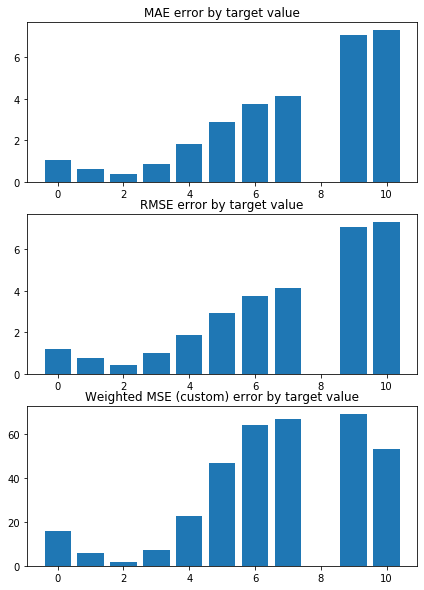

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9935001919466534 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0515745894171775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


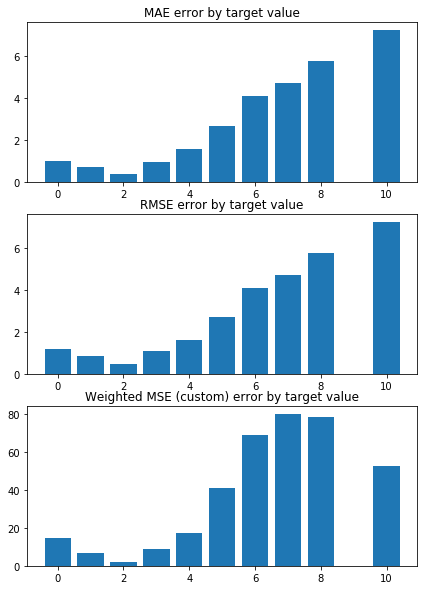

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.980940070835858 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0417681848630542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


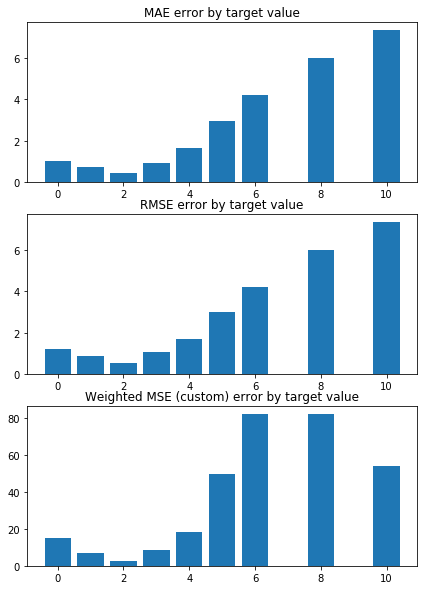

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0828687012326546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0305134361001704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


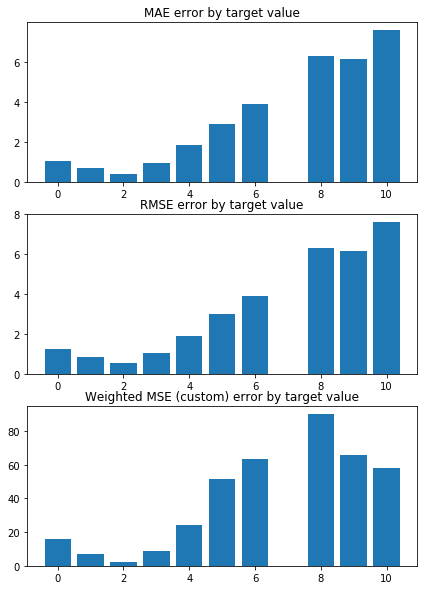

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0329019659936711 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0406686442003947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


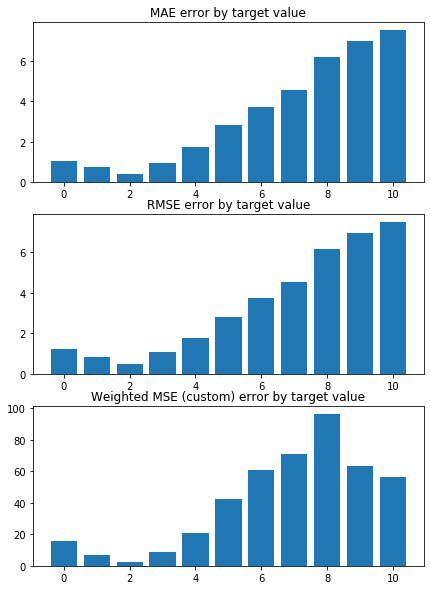

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0840870512808882 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0346174005574384 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


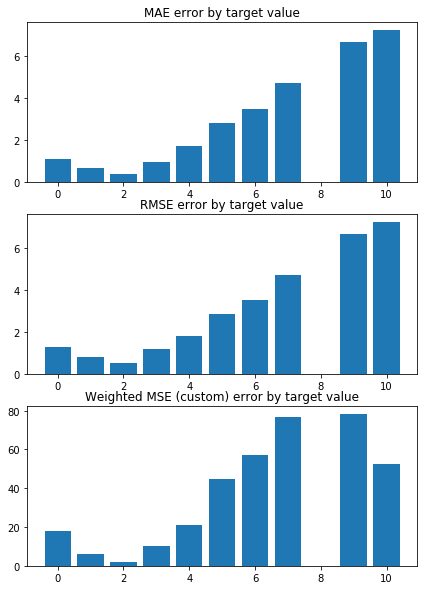

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0185158828873673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0437306390734131 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


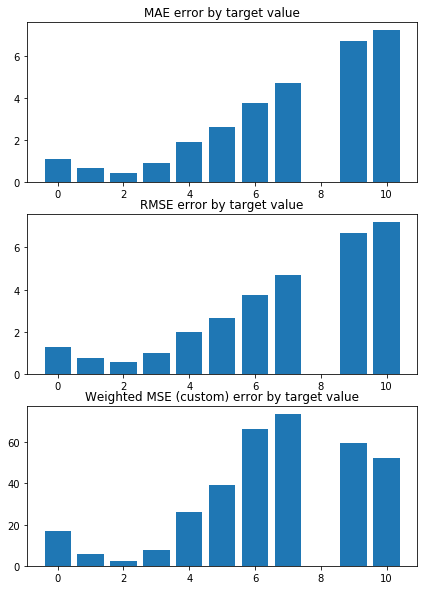

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1150508228728686 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0319821971942589 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


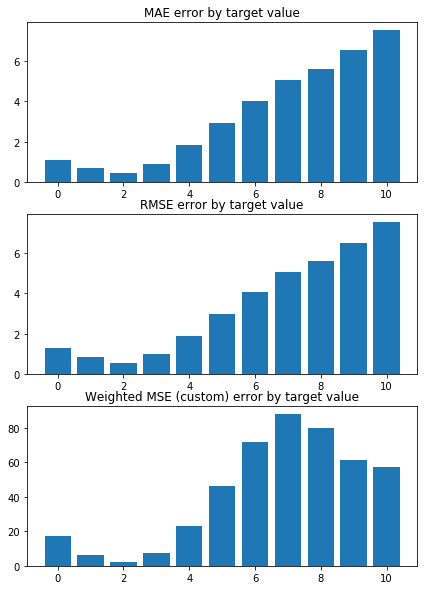

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1487508717068227 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0261687385116758 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


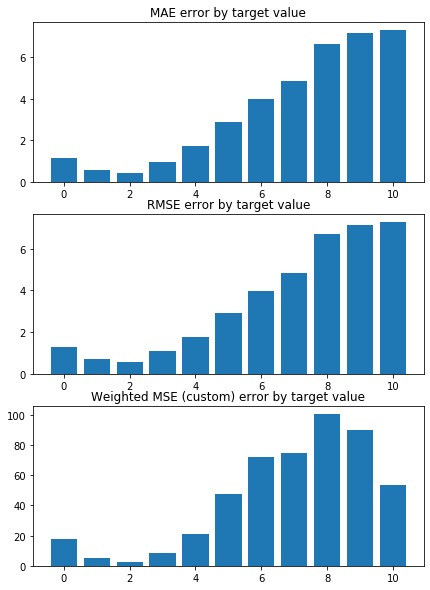

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9500278664083303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0464561293785304 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


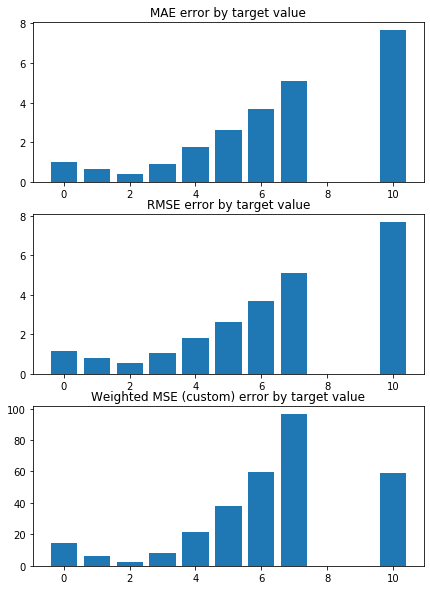

Weighted Mean squared error on Train: 1.04 
 MSE mean train: 2.222527498822653 

Mean squared error on Test: 1.04 
 MSE mean test:  2.227074987703675 

Root of MSE on Test: 1.02 
 1.492338764390872 

Variance score on Test: 0.06 
 r2_test: 0.24863487729102599 

wMSE_train 1.04
wMSE_test 1.04
MSE_train 2.22
MSE_test 2.23
MAE_train 1.01
MAE_test 0.97
r2_test 0.25
    H3K4me1  H3K36me3     Chriz      CTCF       GAF   H3K4me2  H3K36me1  \
0 -0.339689 -0.194040 -0.106285 -0.084132 -0.024967 -0.016885      -0.0   
1 -0.332580 -0.189499 -0.063467 -0.083322 -0.023082 -0.074374      -0.0   
2 -0.333473 -0.198546 -0.073950 -0.072052 -0.051764 -0.053186      -0.0   
3 -0.352891 -0.205052 -0.076430 -0.104015 -0.013177 -0.030122      -0.0   
4 -0.351794 -0.195974 -0.104568 -0.088609 -0.021992 -0.011172      -0.0   
5 -0.344789 -0.194875 -0.108205 -0.081920 -0.012296 -0.024450      -0.0   
6 -0.342733 -0.195608 -0.075043 -0.089923 -0.017596 -0.053528      -0.0   
7 -0.349698 -0.197779 -0.098954 -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


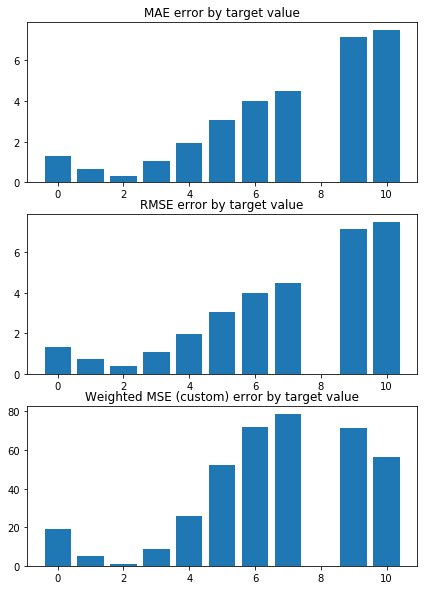

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1361983612790336 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1596605998324703 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


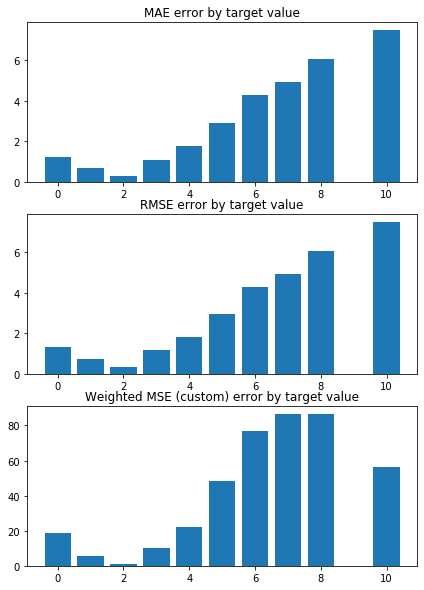

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.072598952388322 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1542208781919534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


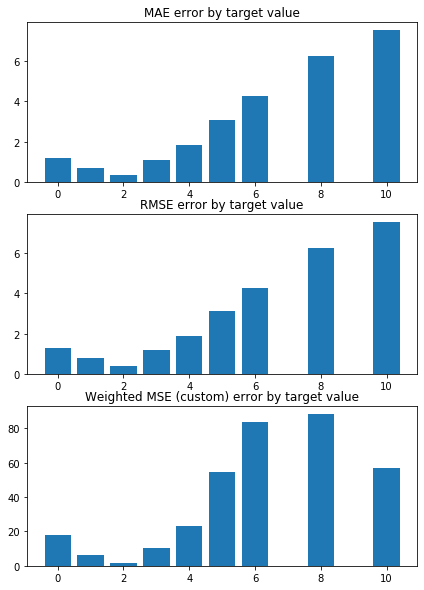

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1561755316418252 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1333684660177568 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


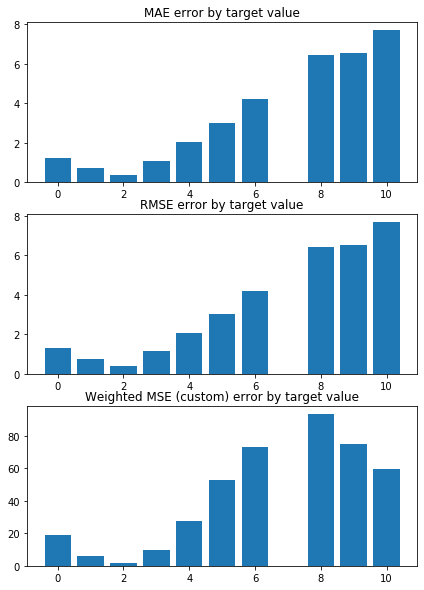

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1521698848623805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1466061164878278 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


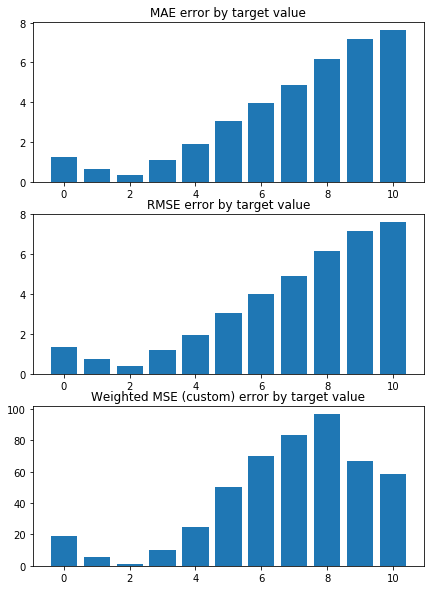

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1591455737750607 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1427909832662064 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


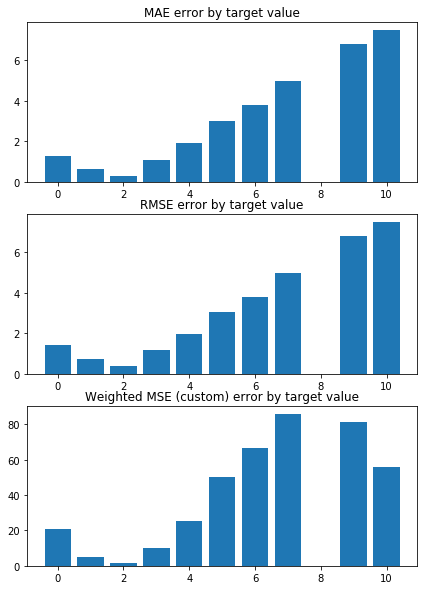

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.110165024016513 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1515073700092717 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


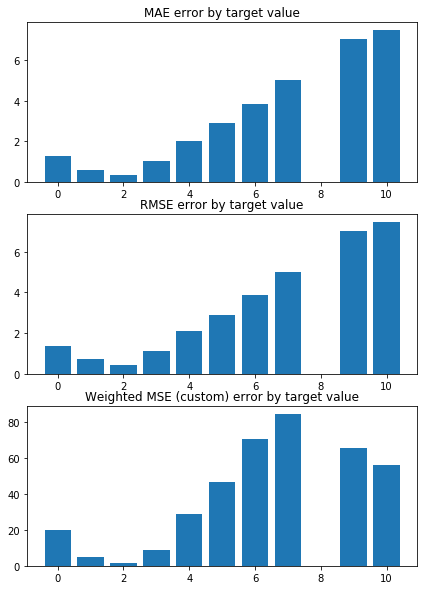

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2239945739183828 


 TRAIN PREDICTION Error
weighted_mse_train: 1.138099493335371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


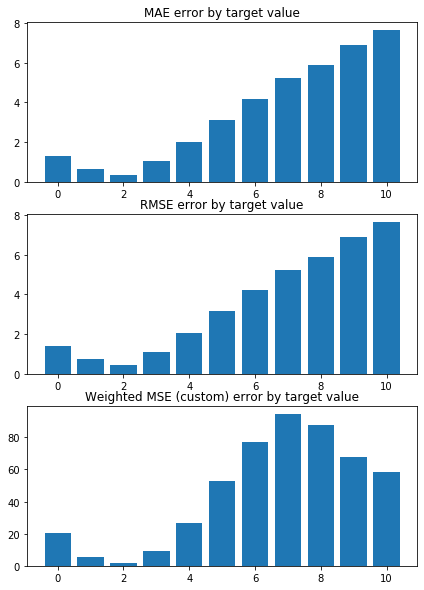

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2657523356420939 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1319120385947314 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


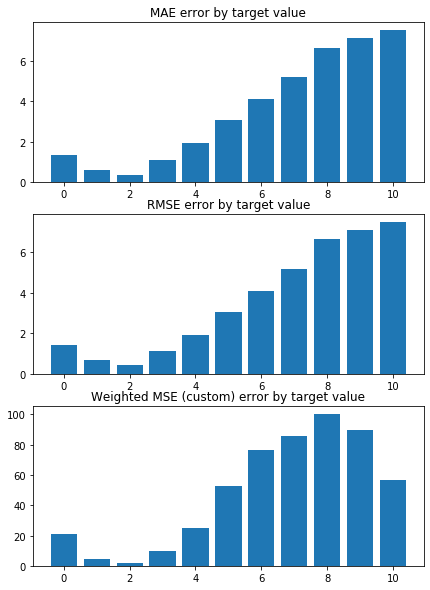

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.068812960030394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1530821959244362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


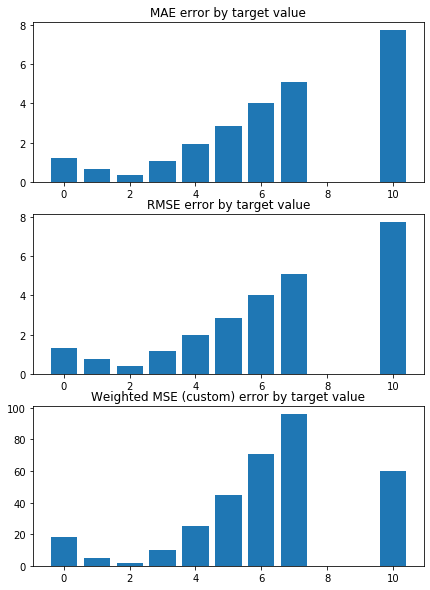

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4077287125026703 

Mean squared error on Test: 1.15 
 MSE mean test:  2.410720462302491 

Root of MSE on Test: 1.07 
 1.5526494975693939 

Variance score on Test: 0.06 
 r2_test: 0.18581202088075455 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.41
MSE_test 2.41
MAE_train 1.08
MAE_test 1.06
r2_test 0.19
    H3K4me2   H3K4me1  H3K36me3      CTCF  RNA-polymerase-II     Chriz  CP190  \
0 -0.201623 -0.128855 -0.066197 -0.029647          -0.015793 -0.011066   -0.0   
1 -0.253458 -0.123316 -0.052215 -0.007814          -0.015372 -0.000000   -0.0   
2 -0.221651 -0.121337 -0.057404 -0.020914          -0.040725 -0.000000   -0.0   
3 -0.201668 -0.142779 -0.070159 -0.043462          -0.019377 -0.000000   -0.0   
4 -0.197389 -0.133157 -0.065613 -0.043367          -0.022127 -0.001002   -0.0   
5 -0.201347 -0.121375 -0.065848 -0.029778          -0.046274 -0.000000   -0.0   
6 -0.220886 -0.135869 -0.056634 -0.027379          -0.024804 -0.000

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


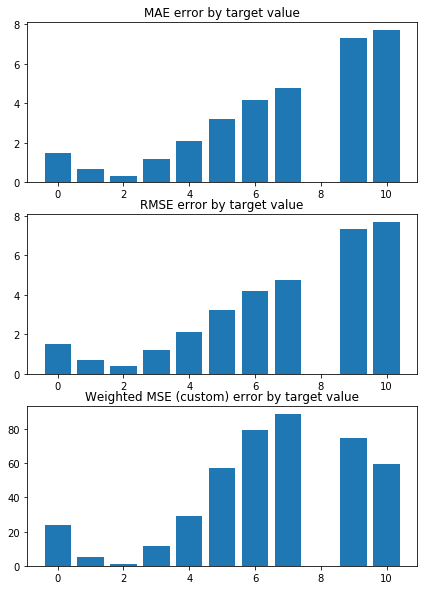

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3160390773345267 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3170368660915694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


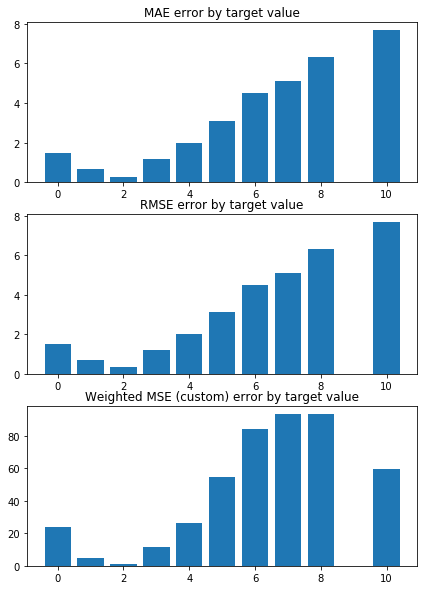

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2281315143488292 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3158610260560353 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


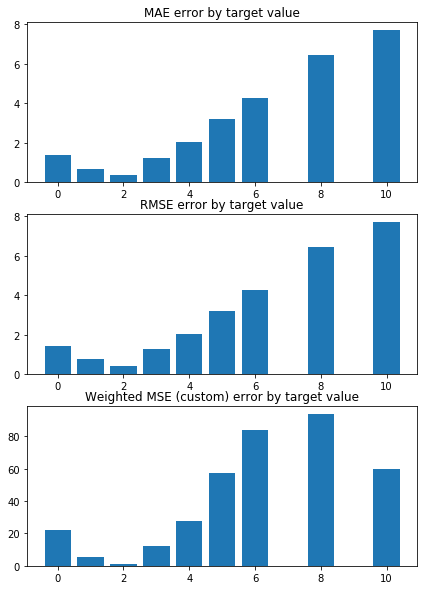

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.287493484047188 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2974362915281317 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


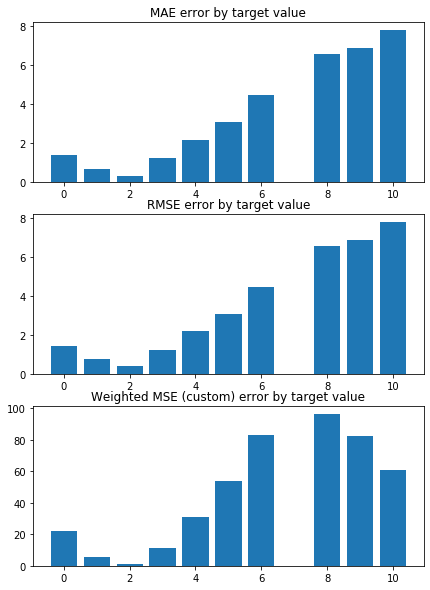

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3331546728968233 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3092919985528289 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


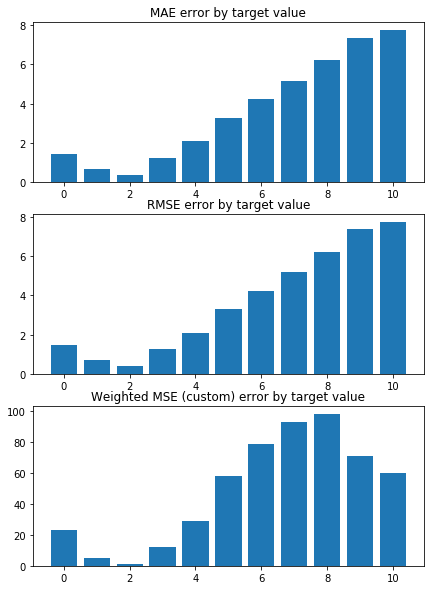

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2873194173732796 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3073399240356862 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


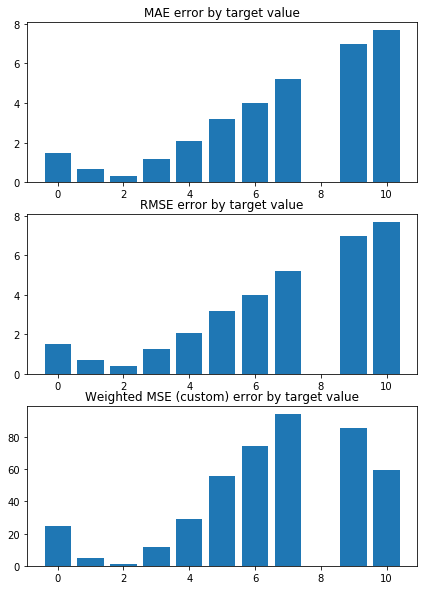

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2536660215661166 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3147598316352032 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


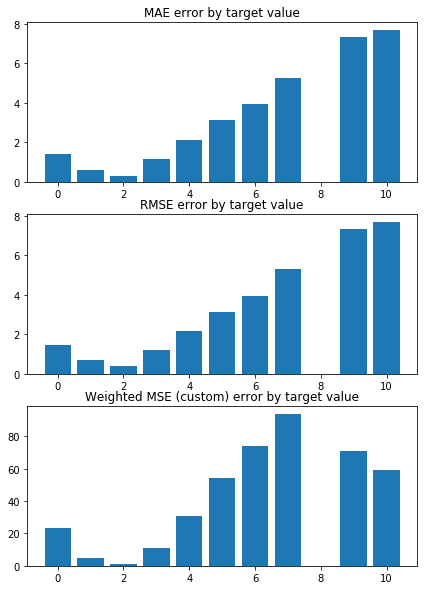

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3929667129026557 


 TRAIN PREDICTION Error
weighted_mse_train: 1.302209843115349 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


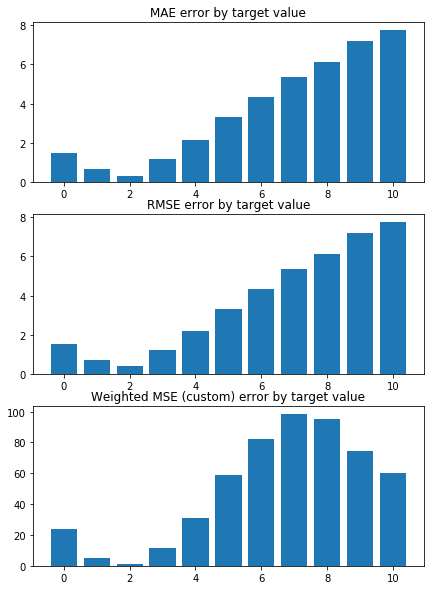

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4096904253898452 


 TRAIN PREDICTION Error
weighted_mse_train: 1.28644595787229 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


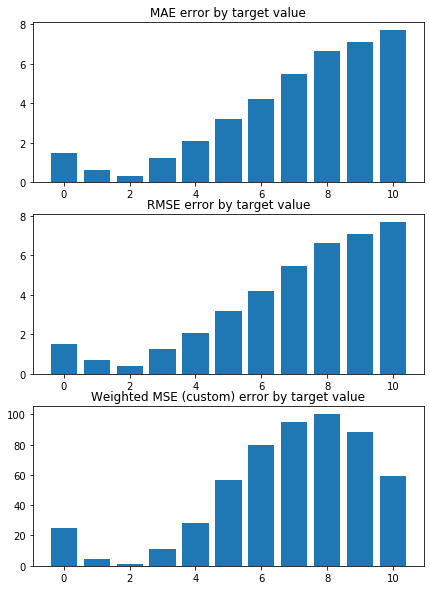

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2496568305330387 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3142764801557587 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


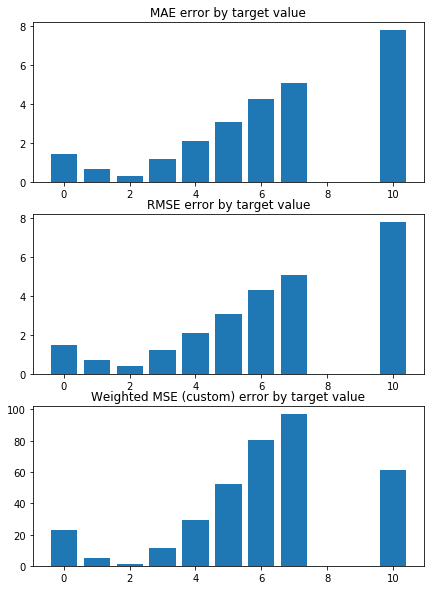

Weighted Mean squared error on Train: 1.31 
 MSE mean train: 2.651660901346319 

Mean squared error on Test: 1.31 
 MSE mean test:  2.6529001330837305 

Root of MSE on Test: 1.14 
 1.628772584826909 

Variance score on Test: 0.06 
 r2_test: 0.10305076553161738 

wMSE_train 1.31
wMSE_test 1.31
MSE_train 2.65
MSE_test 2.65
MAE_train 1.17
MAE_test 1.15
r2_test 0.1
    H3K4me2  Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.202878   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
1 -0.211449   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
2 -0.216030   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
3 -0.224406   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
4 -0.211490   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
5 -0.217716   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
6 -0.217105   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


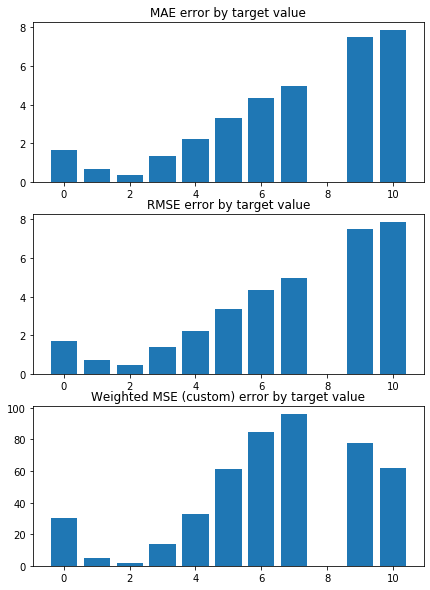

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5422317873347806 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5211177120331172 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


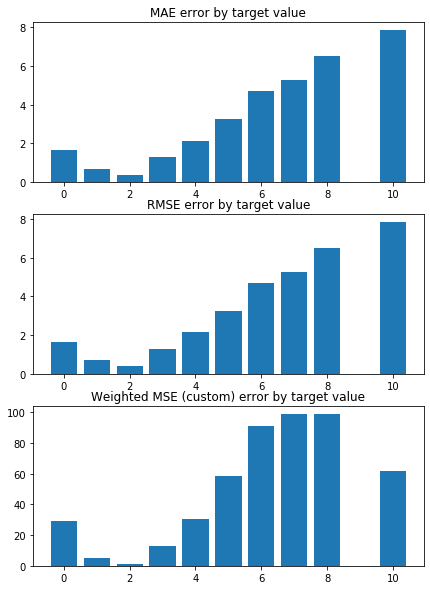

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4309392292266612 


 TRAIN PREDICTION Error
weighted_mse_train: 1.520222413001534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


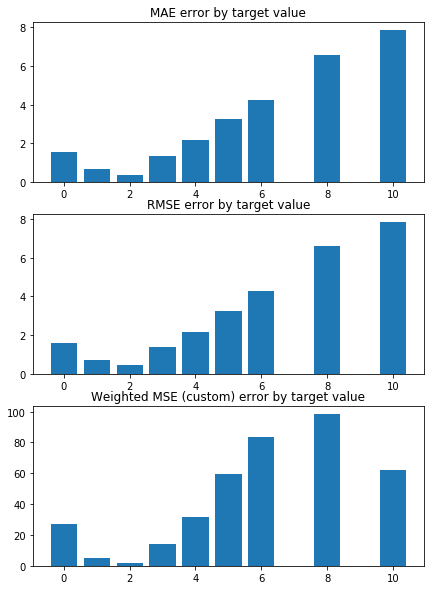

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4601077864036158 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4976821453513964 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


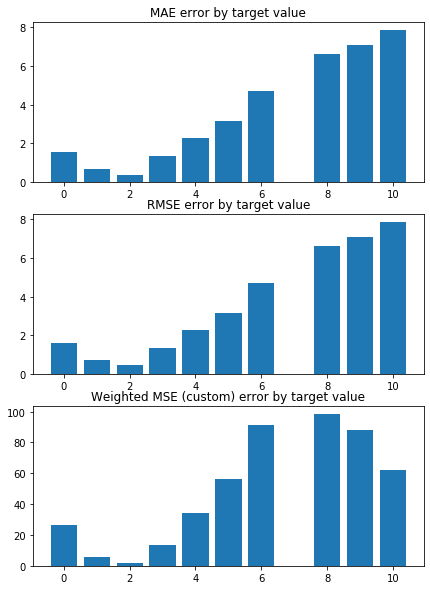

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5545984096138492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5111649588503873 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


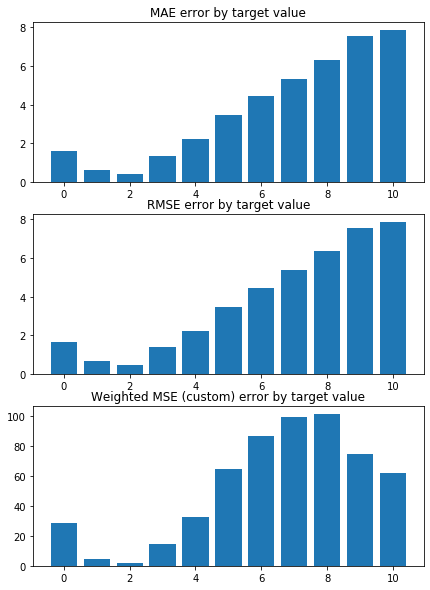

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4521363786900752 


 TRAIN PREDICTION Error
weighted_mse_train: 1.509801416788388 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


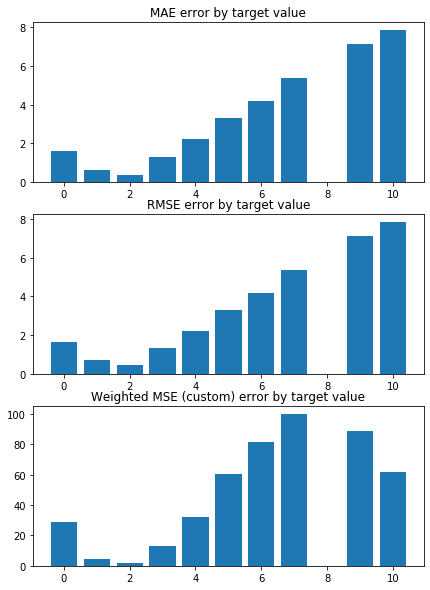

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.450308832265951 


 TRAIN PREDICTION Error
weighted_mse_train: 1.519574080699116 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


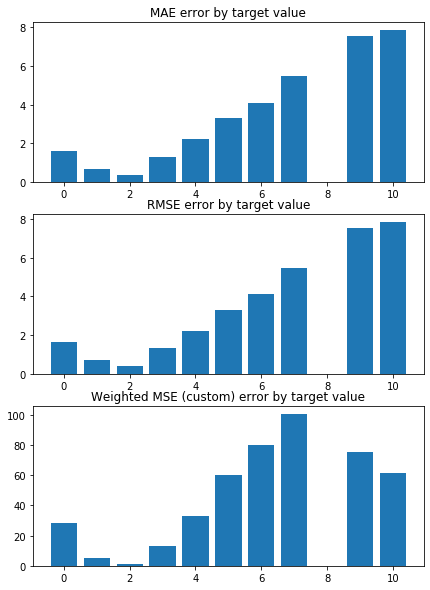

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6089792224561263 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5062382360970474 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


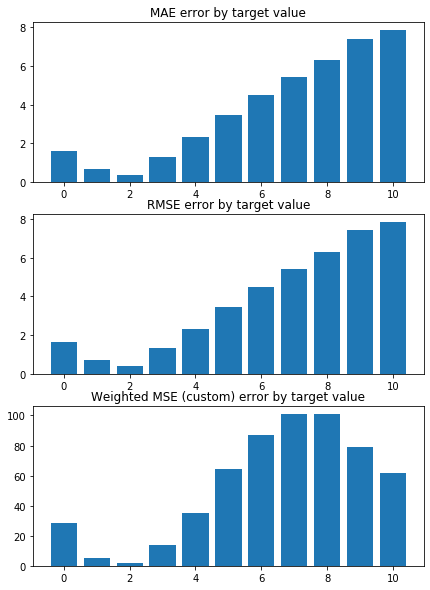

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5730747030163654 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4848776888579225 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


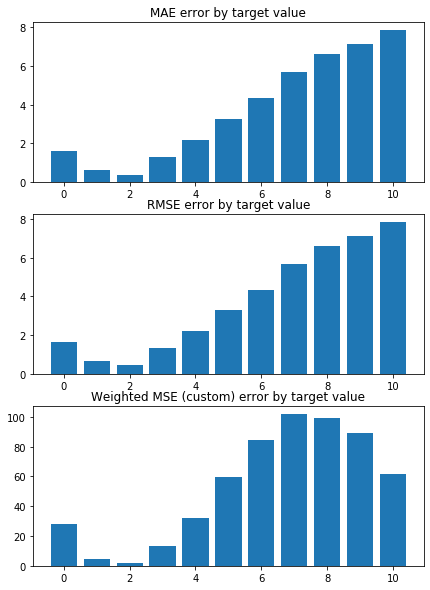

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4765403380045783 


 TRAIN PREDICTION Error
weighted_mse_train: 1.515531005220547 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


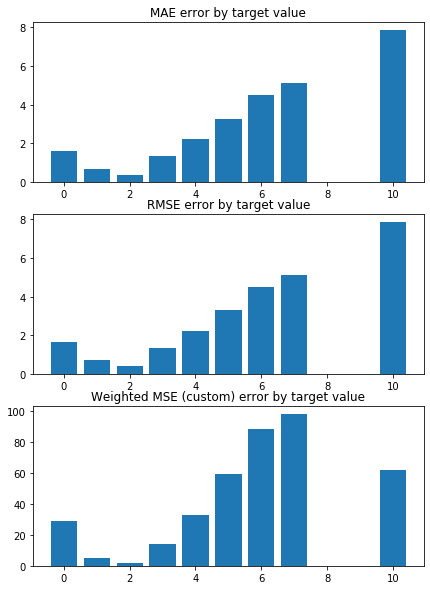

Weighted Mean squared error on Train: 1.51 
 MSE mean train: 2.9317024167899755 

Mean squared error on Test: 1.51 
 MSE mean test:  2.933357924146677 

Root of MSE on Test: 1.23 
 1.7127048561111389 

Variance score on Test: 0.06 
 r2_test: 0.007115246823823607 

wMSE_train 1.51
wMSE_test 1.51
MSE_train 2.93
MSE_test 2.93
MAE_train 1.26
MAE_test 1.25
r2_test 0.01
    H3K4me2  Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.001999   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
1 -0.010144   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
2 -0.014530   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
3 -0.025744   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
4 -0.011302   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
5 -0.019889   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
6 -0.016637   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


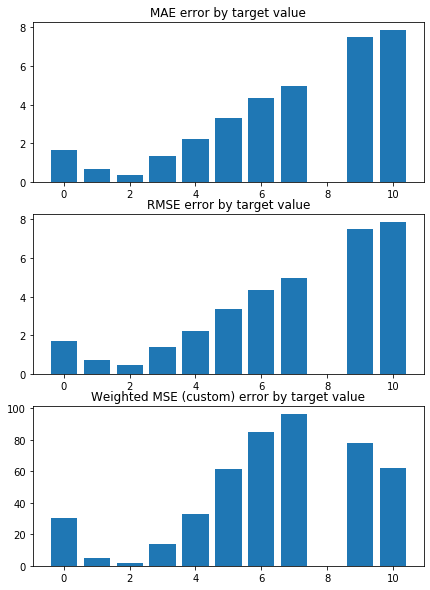

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


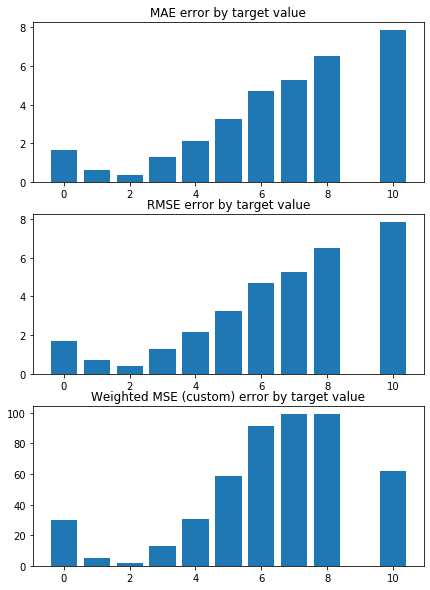

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


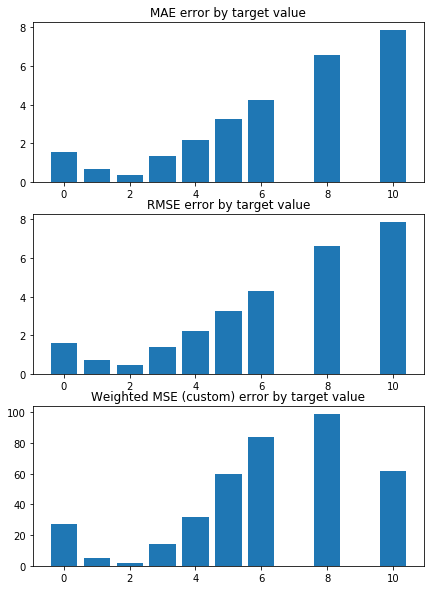

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


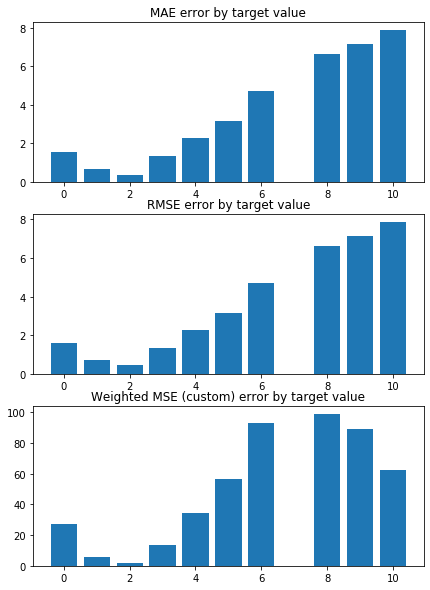

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


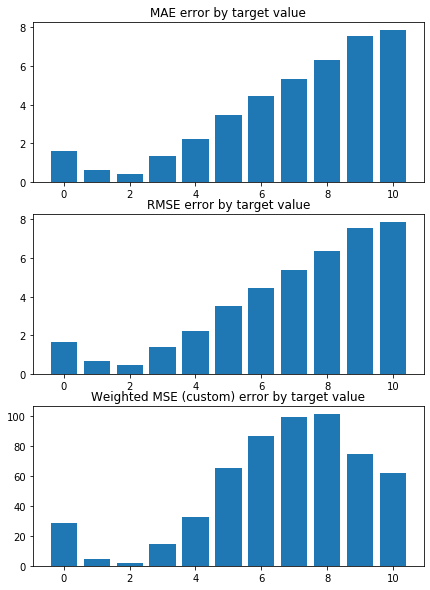

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


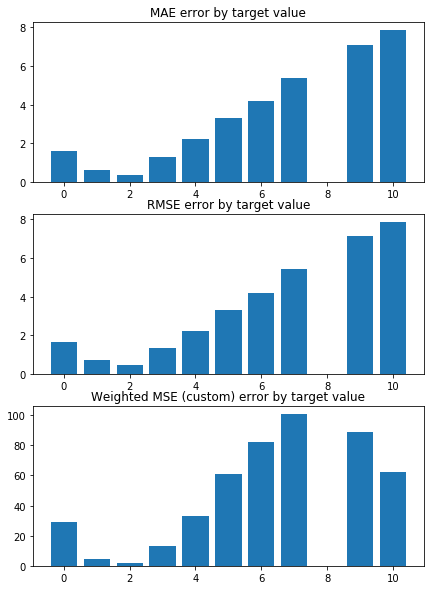

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


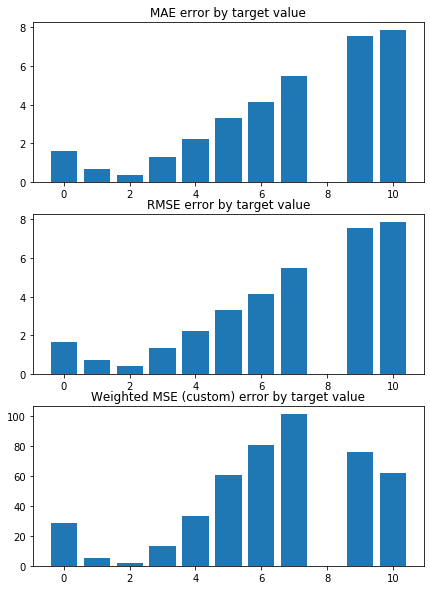

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


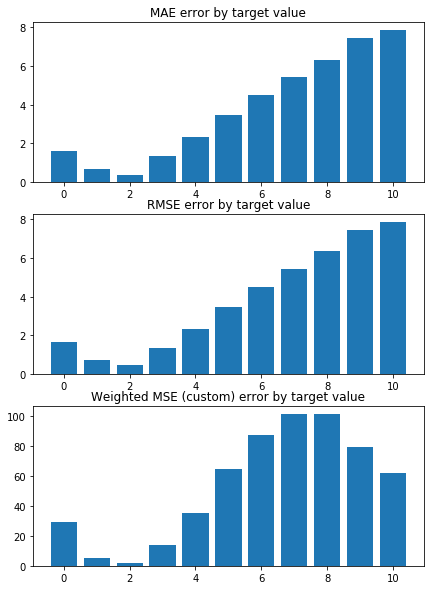

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


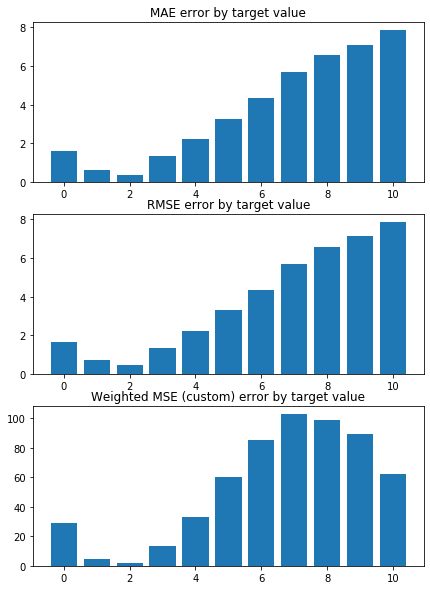

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


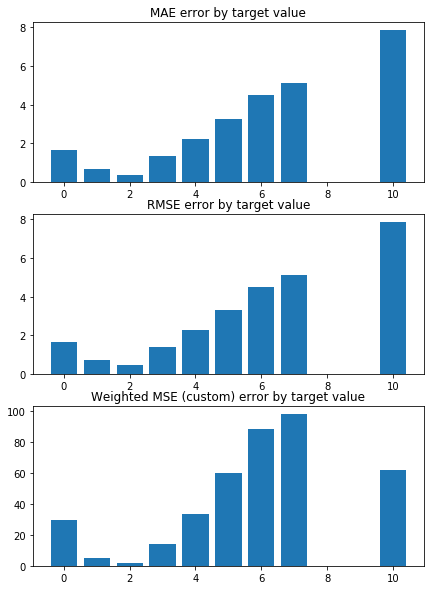

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


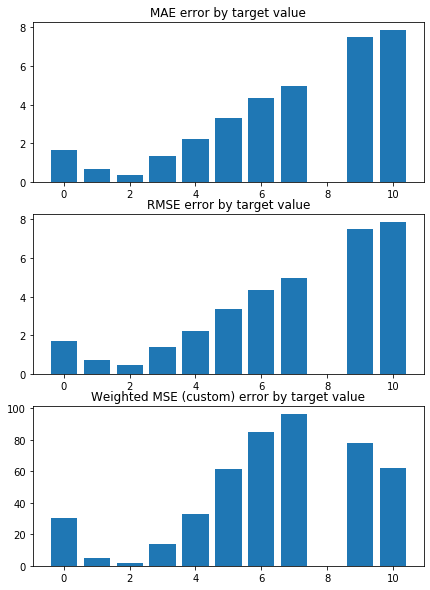

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


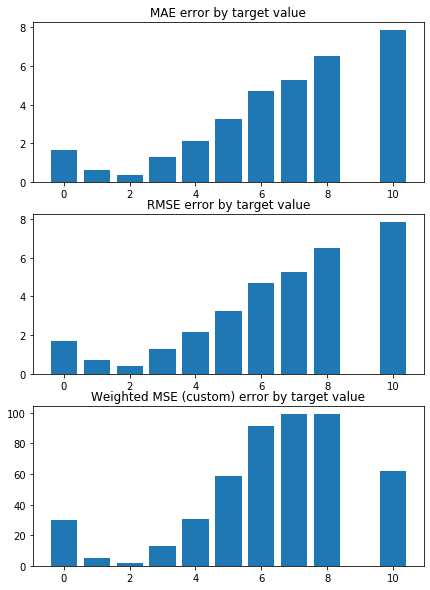

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


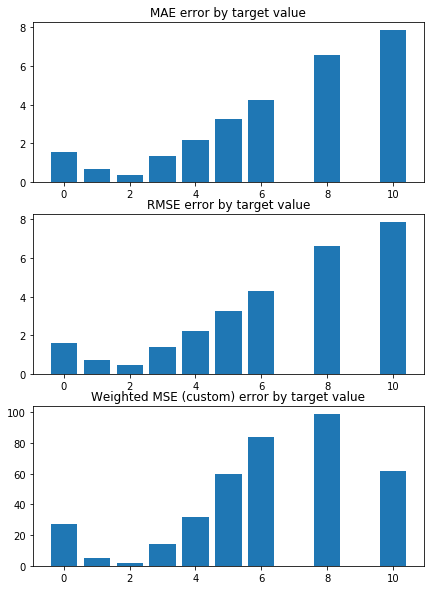

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


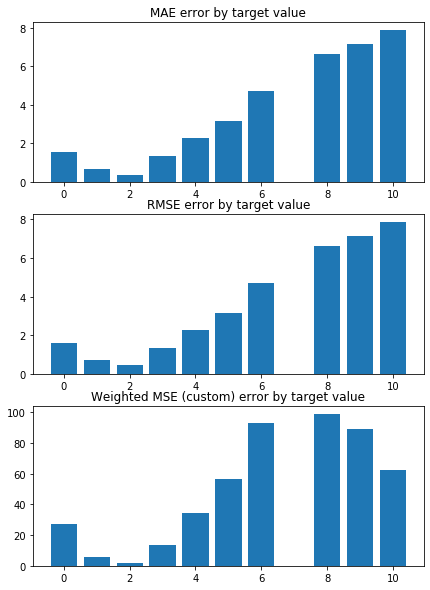

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


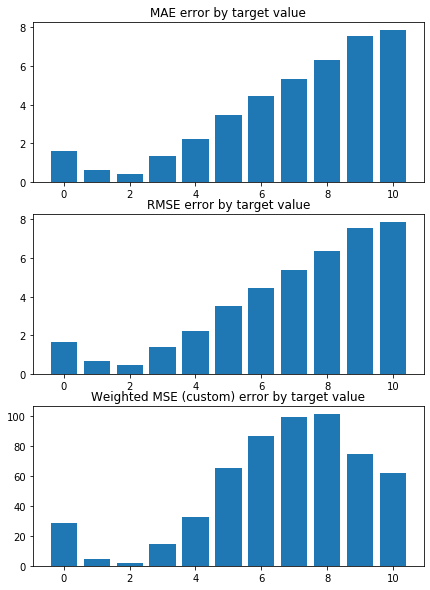

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


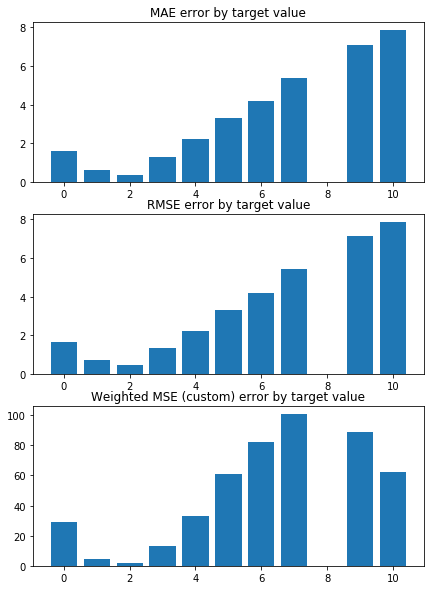

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


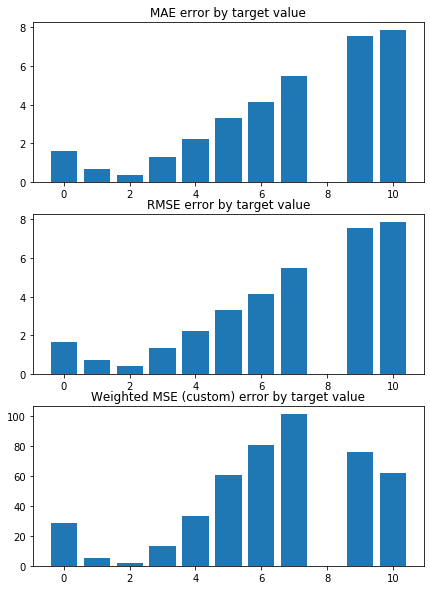

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


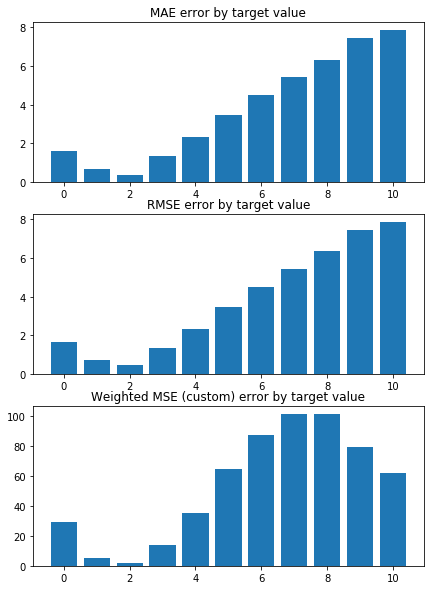

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


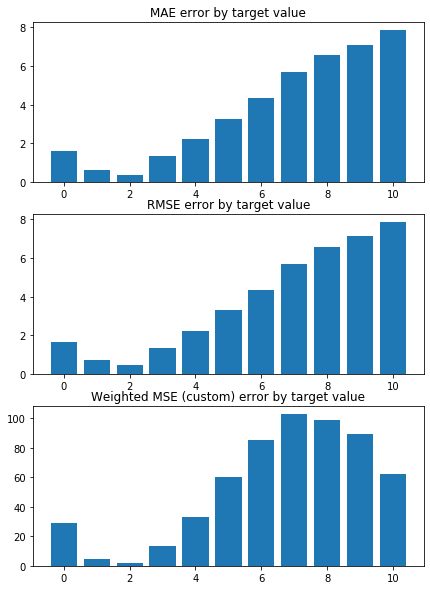

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


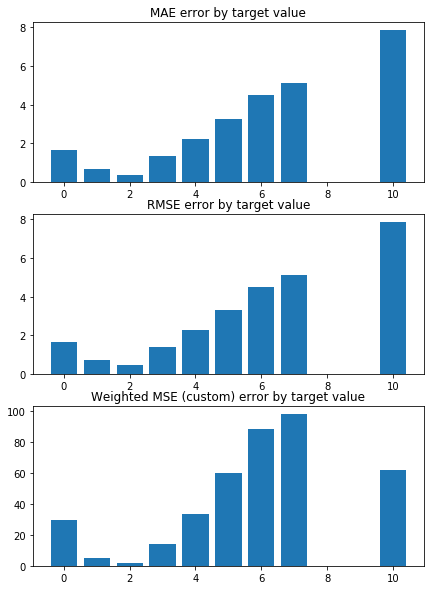

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


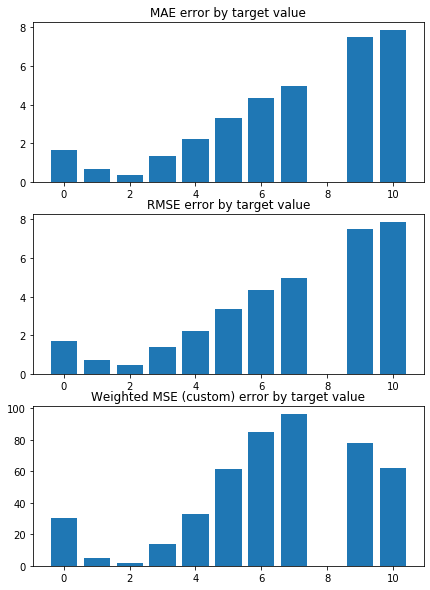

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


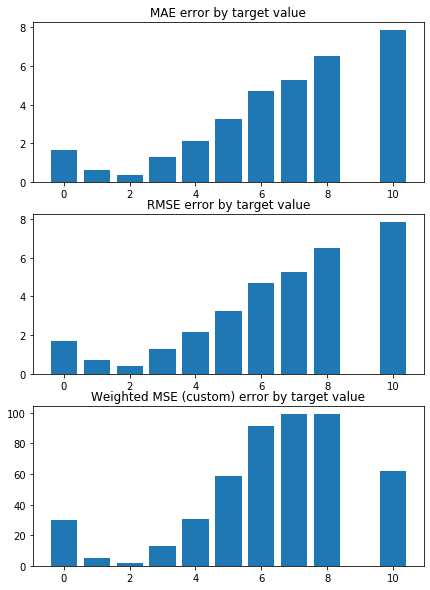

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


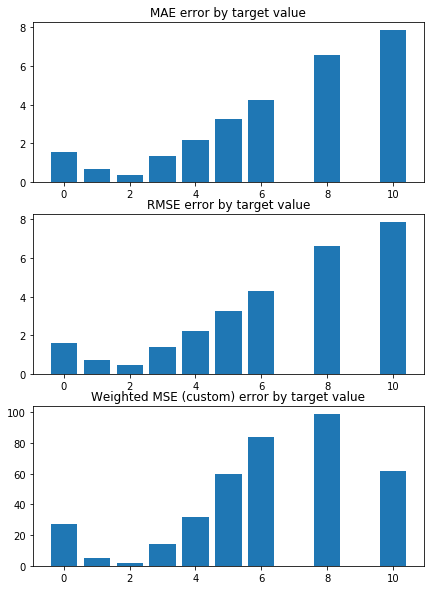

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


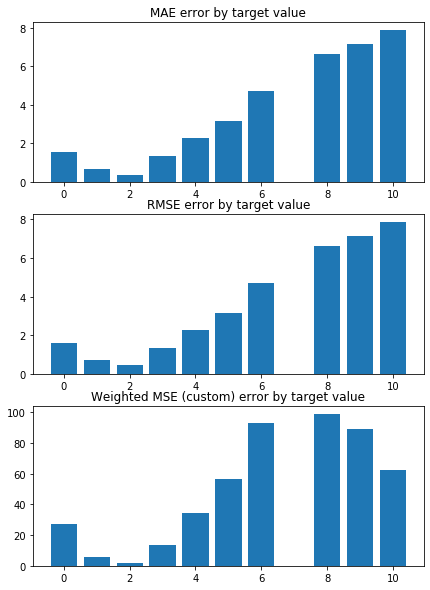

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


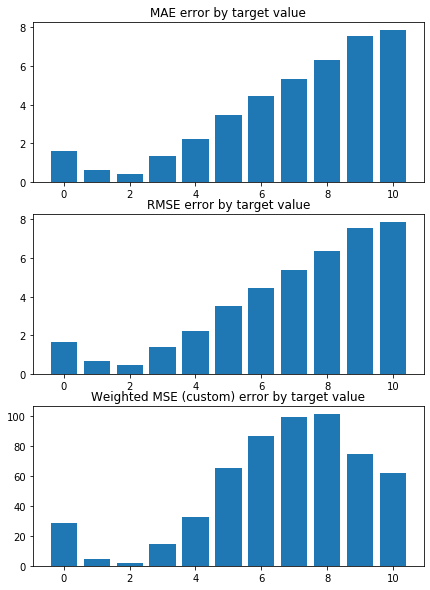

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


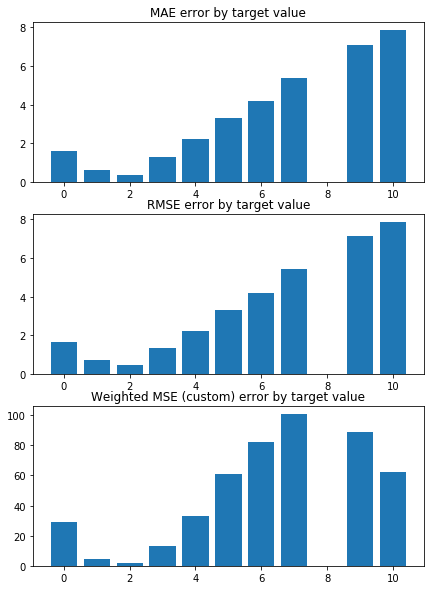

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


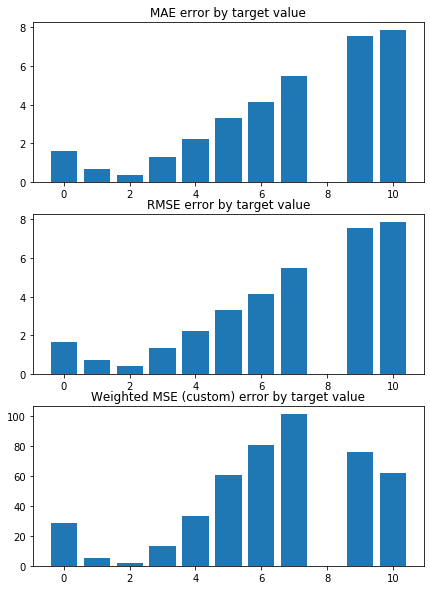

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


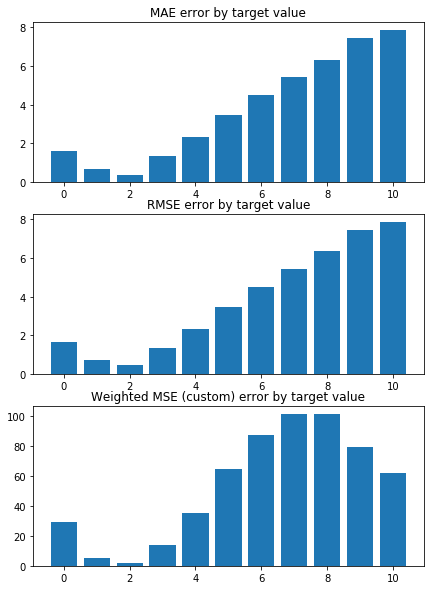

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


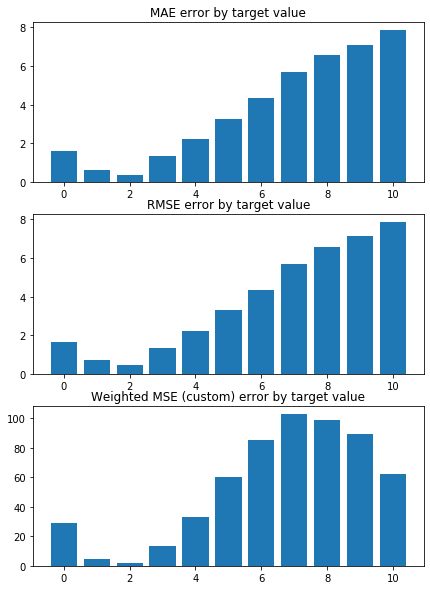

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


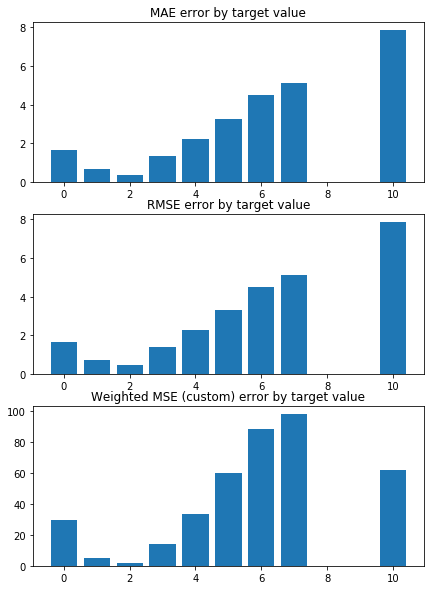

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


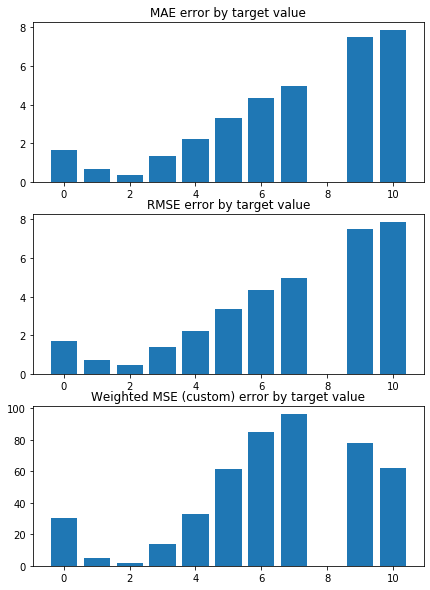

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


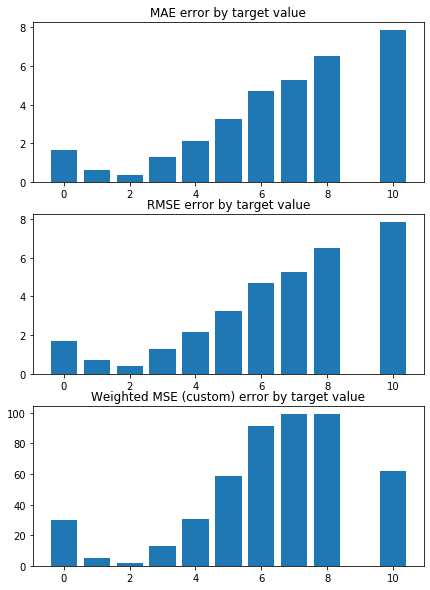

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


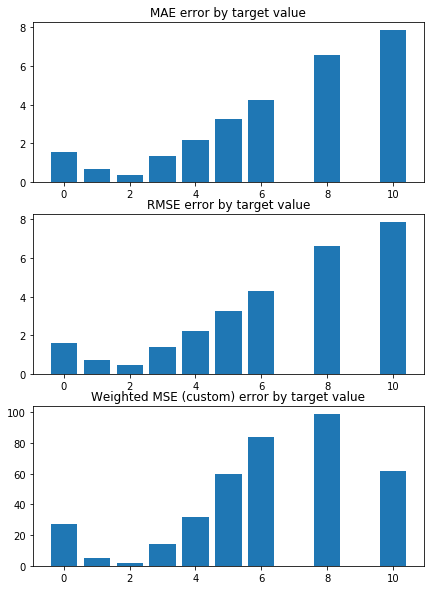

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


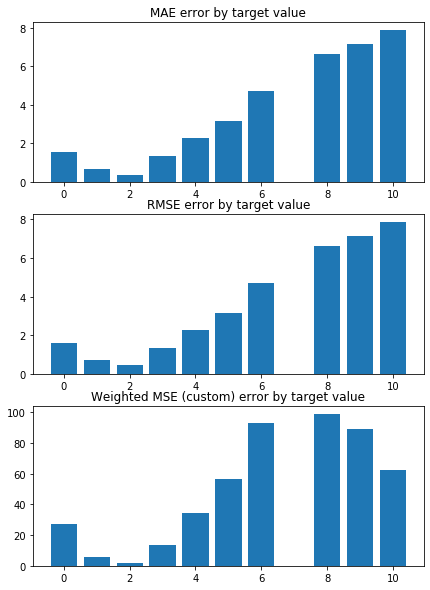

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


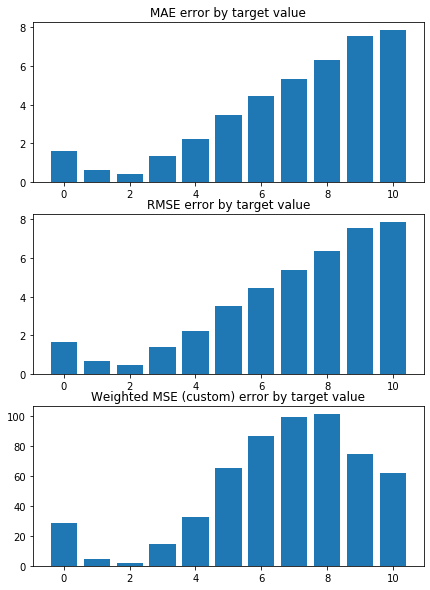

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


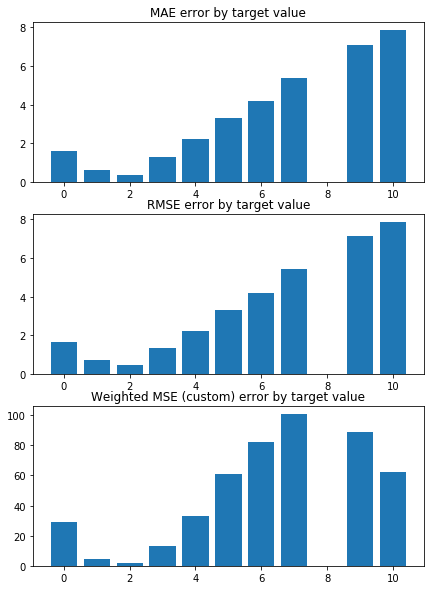

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


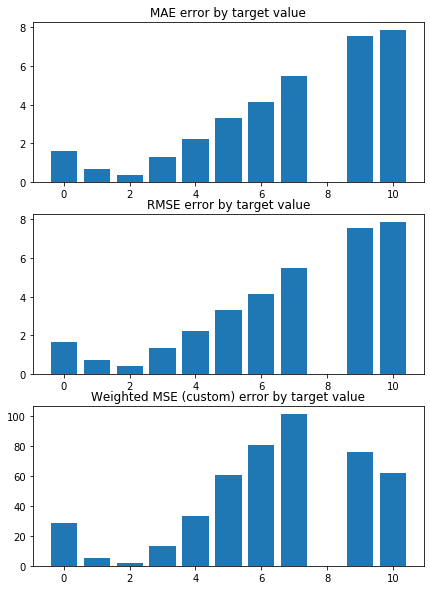

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


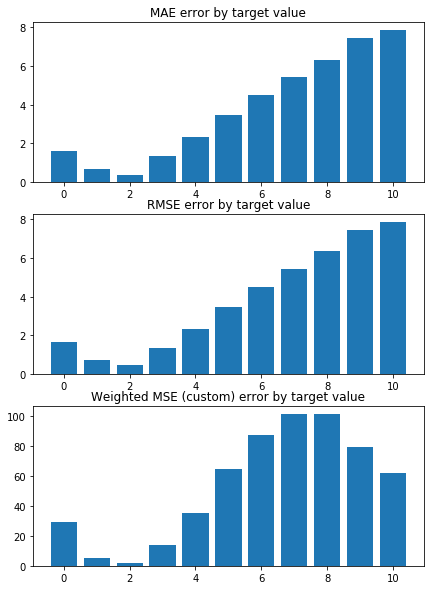

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


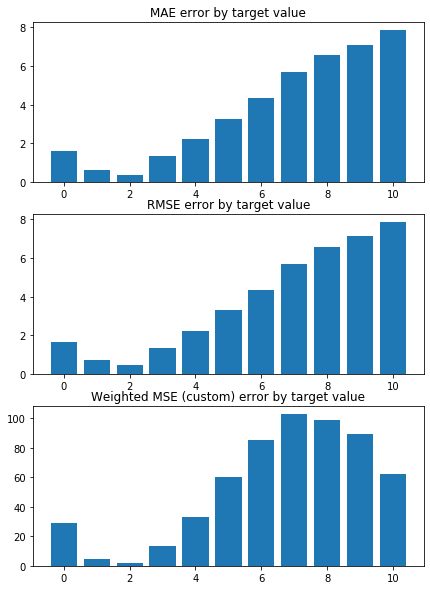

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


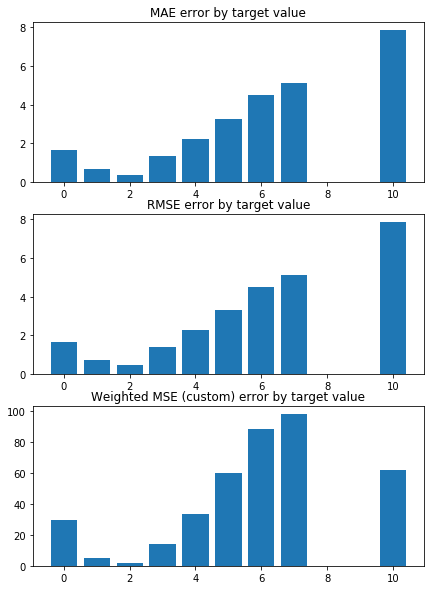

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


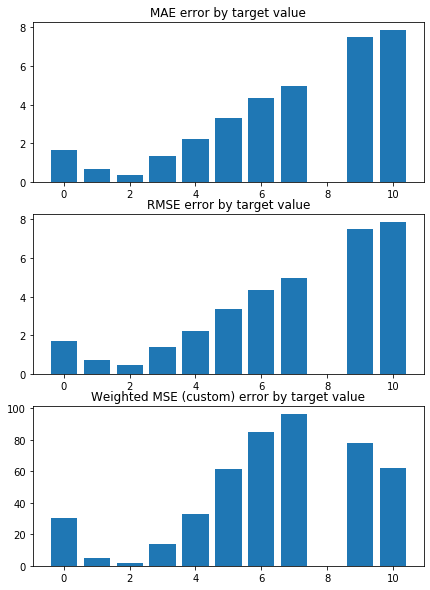

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


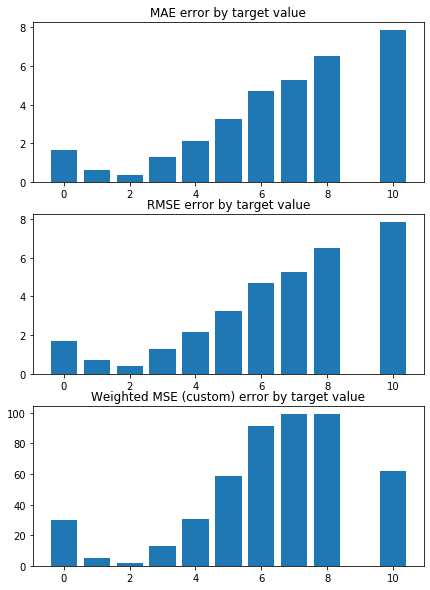

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


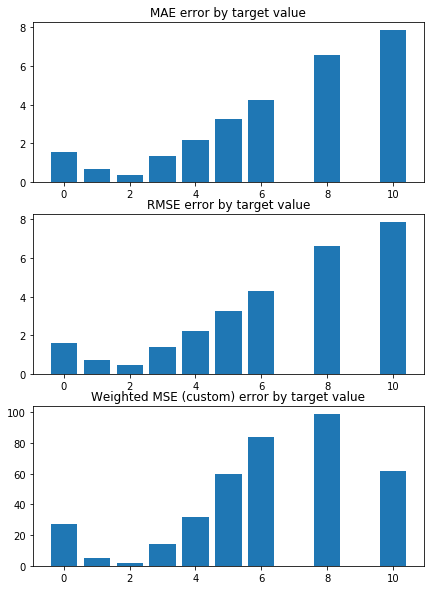

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


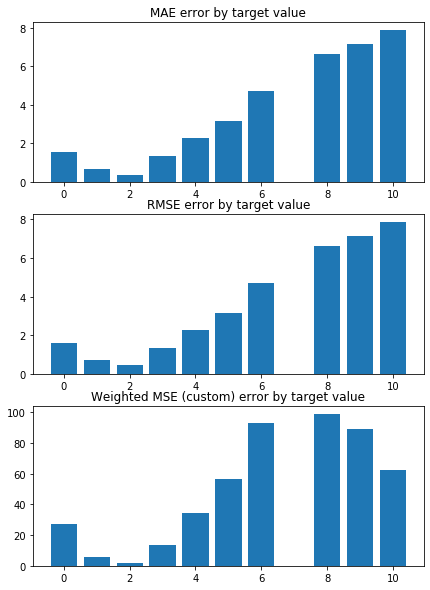

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


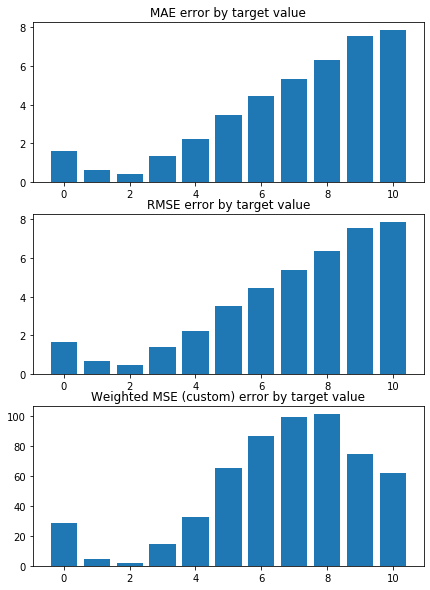

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


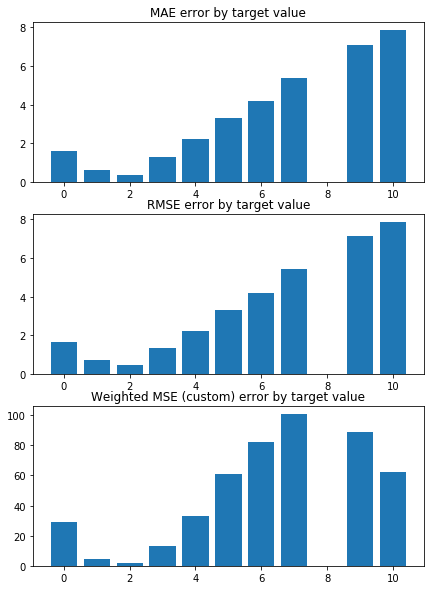

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


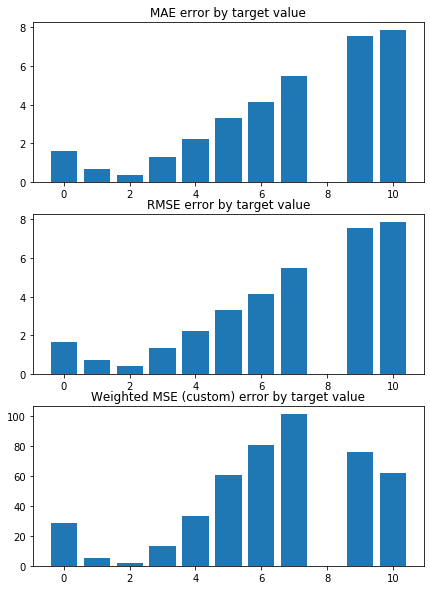

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


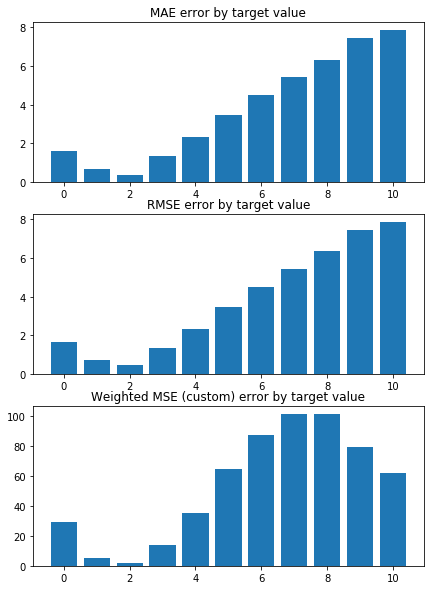

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


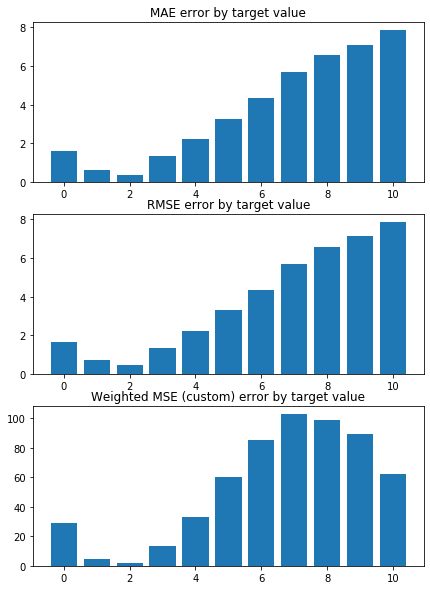

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


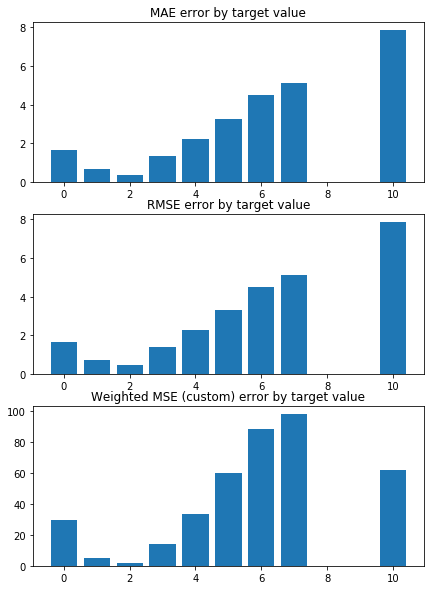

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

In [78]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 2, 0.2)
# Create linear regression object

model_name = 'LR+L1_grid'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    _ = train_test_KFold(X, y, 
                                                  model, model_name, results_pd,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)
#     results_pd
    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


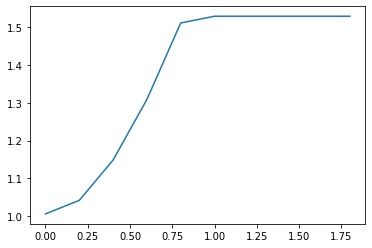

In [79]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9207946942169193 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5580.177460787563, tolerance: 1.5753001672530345
  positive)


weighted_mse_train: 1.0052947139708956 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


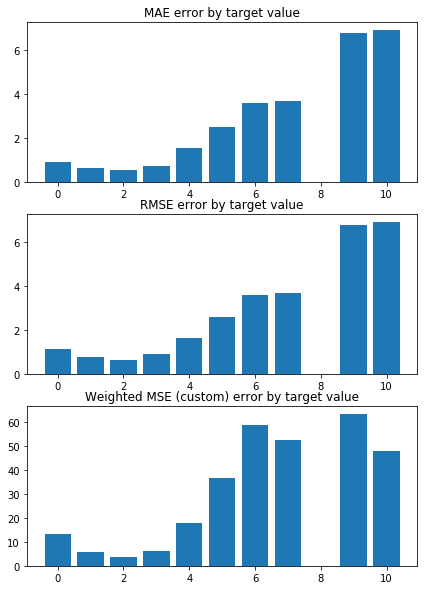

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9636326385609956 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0099787415726738 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5642.099775947289, tolerance: 1.5951549408328658
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

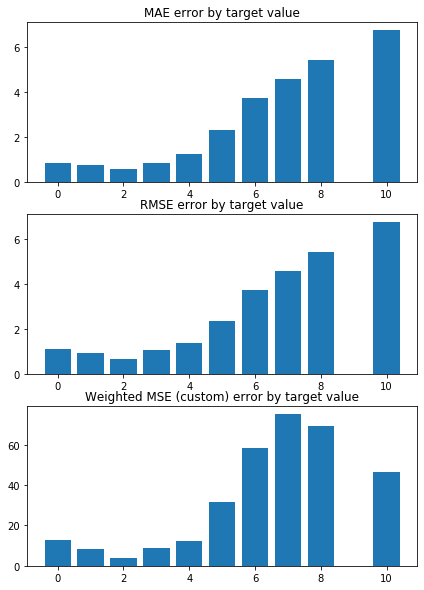

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.989910864376035 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002807087758519 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5532.50200380008, tolerance: 1.5821769354883282
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

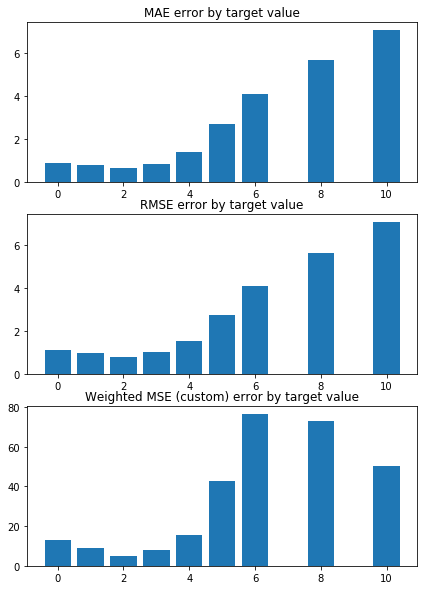

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0598734779663155 


 TRAIN PREDICTION Error
weighted_mse_train: 0.990317099143811 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5397.309586260339, tolerance: 1.5581200225471517
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

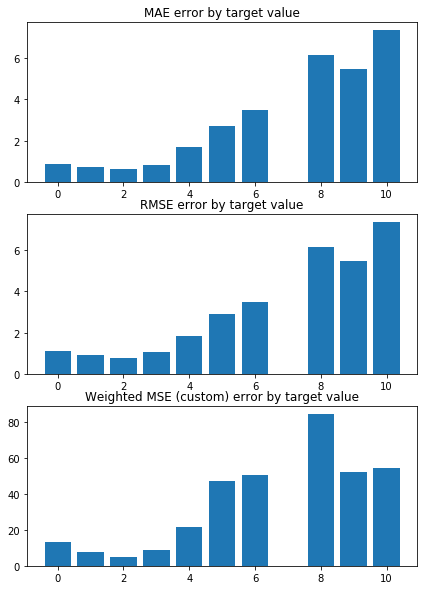

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9824384756274219 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0024322848365612 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5667.20763820735, tolerance: 1.6044926244369746
  positive)


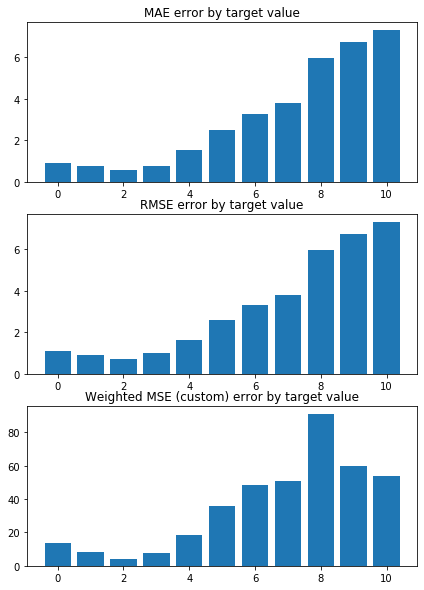

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0740254359296069 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9922696897589997 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5458.75007140212, tolerance: 1.5618709890457518
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

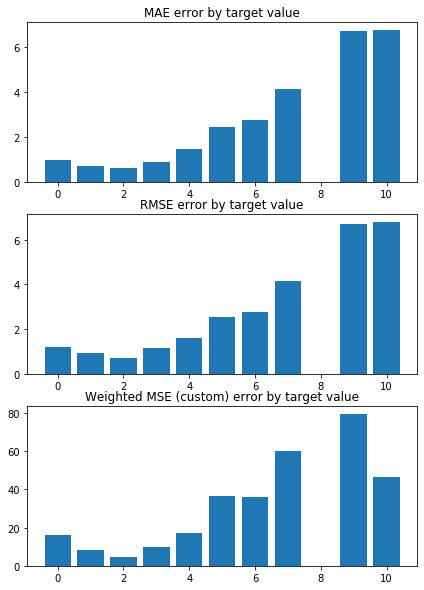

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9798771329490155 


 TRAIN PREDICTION Error
weighted_mse_train: 1.003102232996511 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5641.873242432553, tolerance: 1.6006251832941174
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

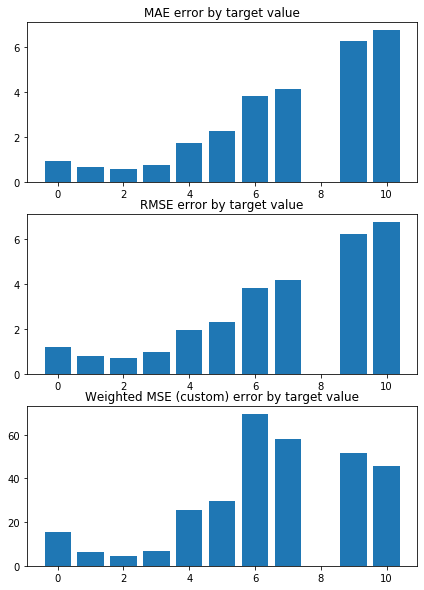

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0658030282478732 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9941128509507394 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5593.180610592562, tolerance: 1.591772067394958
  positive)


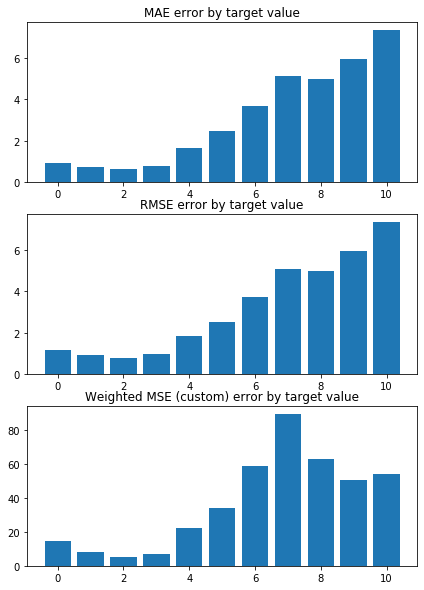

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0846201555666581 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875771971303583 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5522.002913154479, tolerance: 1.5756948114957992
  positive)


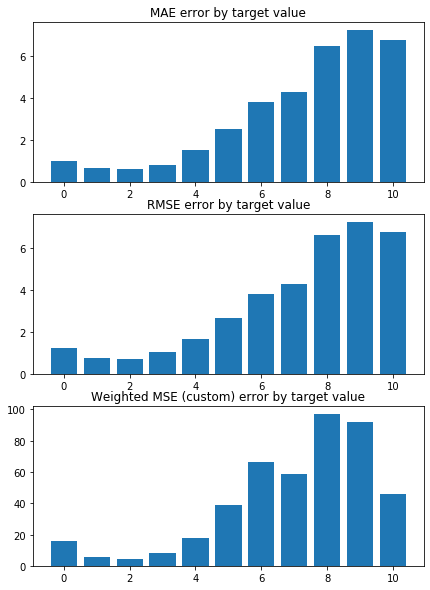

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338448457390943 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081880474285914 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5570.801070483486, tolerance: 1.5896707153314662
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

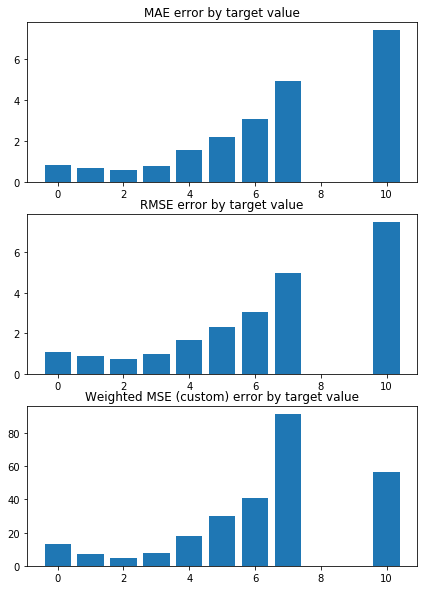

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076784477052019 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900530792800787 

Root of MSE on Test: 1.00 
 1.445701587216421 

Variance score on Test: 0.06 
 r2_test: 0.29487189677420245 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.577725  0.383409 -0.359466 -0.290118 -0.286989  0.168162 -0.164325   
1 -0.616361  0.419153 -0.336181 -0.275444 -0.314071  0.151599 -0.146317   
2 -0.597374  0.407324 -0.344197 -0.311805 -0.323021  0.160319 -0.197146   
3 -0.594079  0.389974 -0.376728 -0.274175 -0.282688  0.161526 -0.129869   
4 -0.612782  0.394975 -0.323170 -0.292868 -0.313231  0.168017 -0.127444   
5 -0.580190  0.362782 -0.338988 -0.290572 -0.292281  0.184178 -0.127902   
6 -0.589758  0.401186 -0.357072 -0.285514 -0.280753  0.178384 -0.190846   
7 -0.567009  0.402720 -0.371730 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


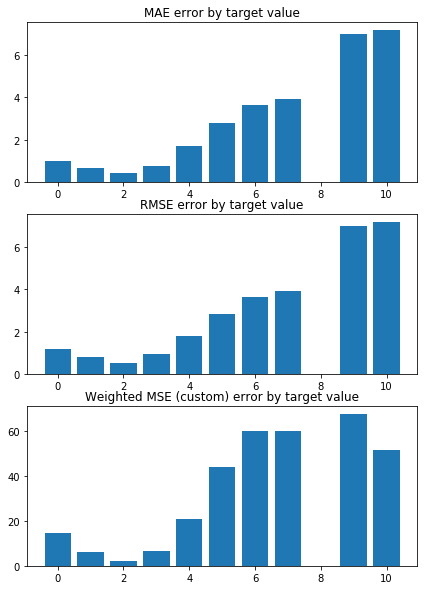

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9604930008340749 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0298745683727086 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


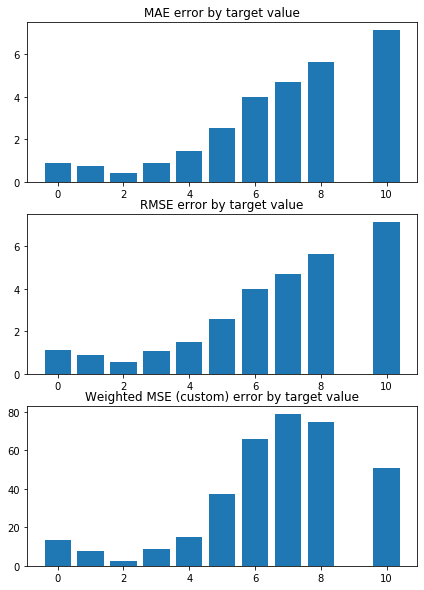

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9799820233886389 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0210689645933306 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


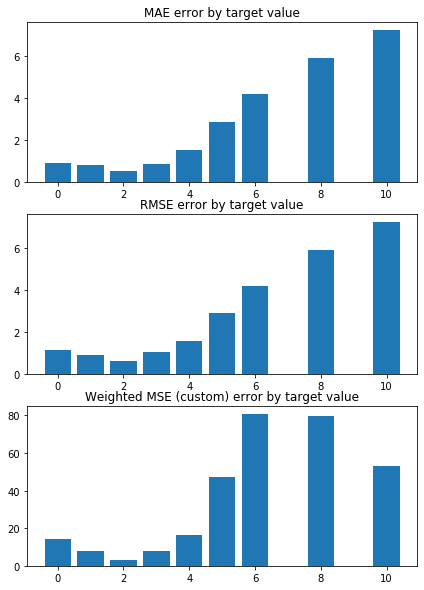

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0740474839139504 


 TRAIN PREDICTION Error
weighted_mse_train: 1.009658392468105 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


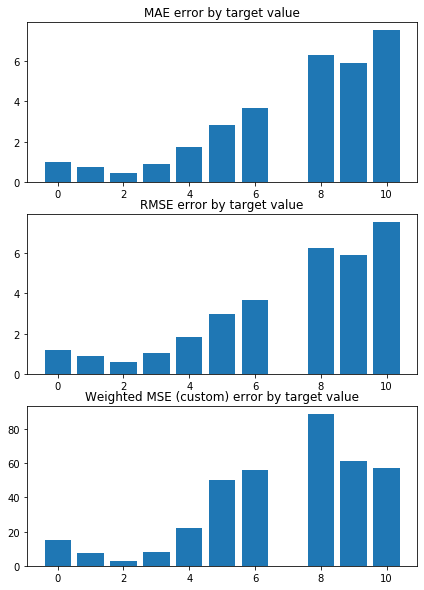

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9996149290648112 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0211050930233507 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


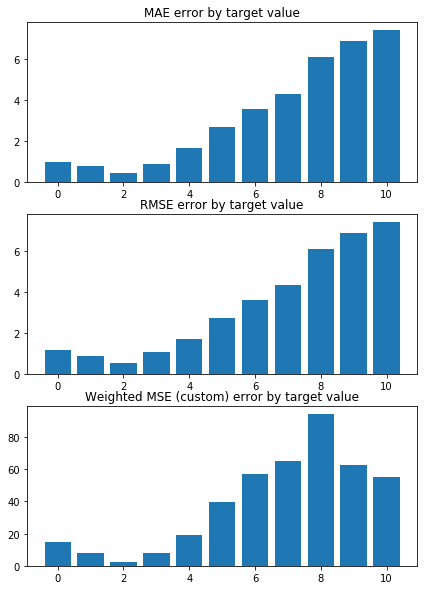

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0740740721069615 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0106491681447196 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


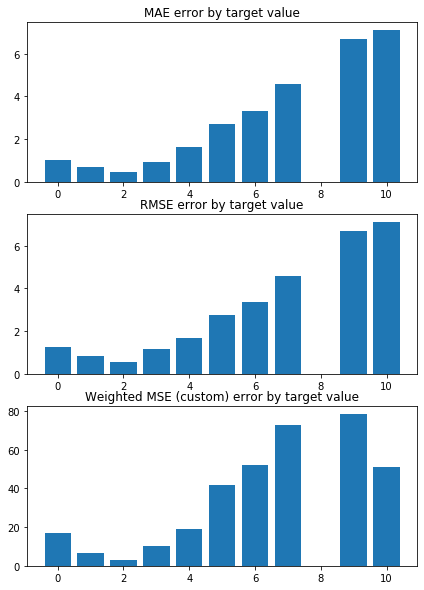

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0024026341244614 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0201558690158385 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


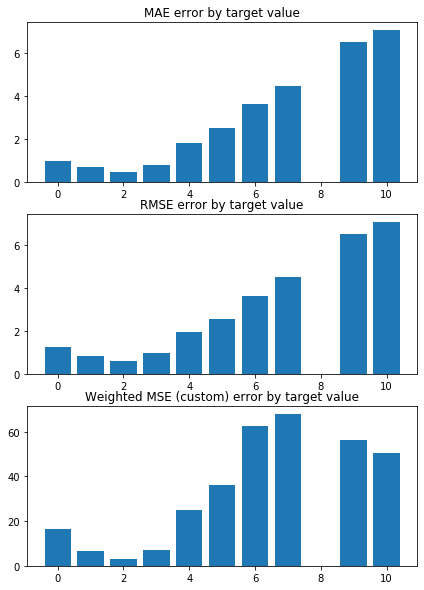

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0888996907245196 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0096704075485865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


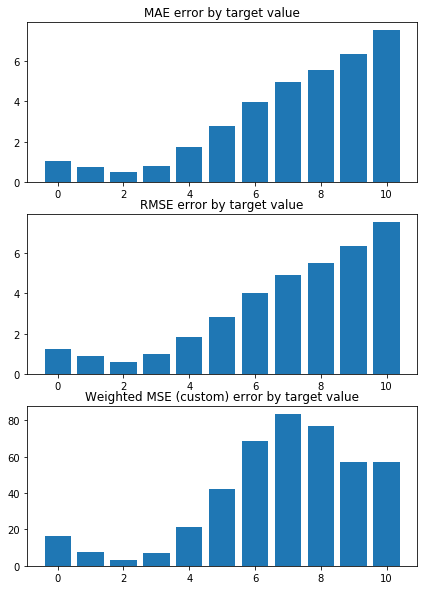

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1204286202468279 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0046943194113234 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


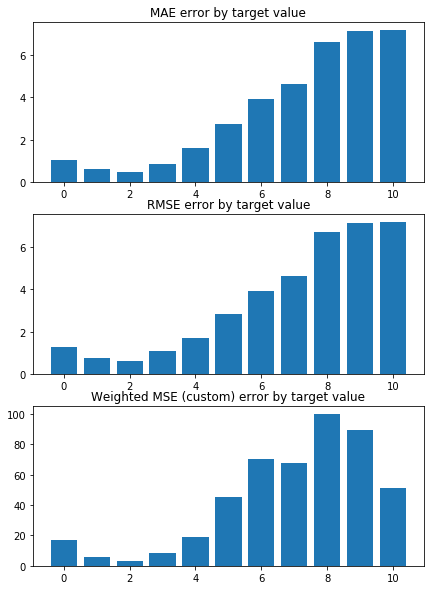

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9216979399688069 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0245252894879202 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


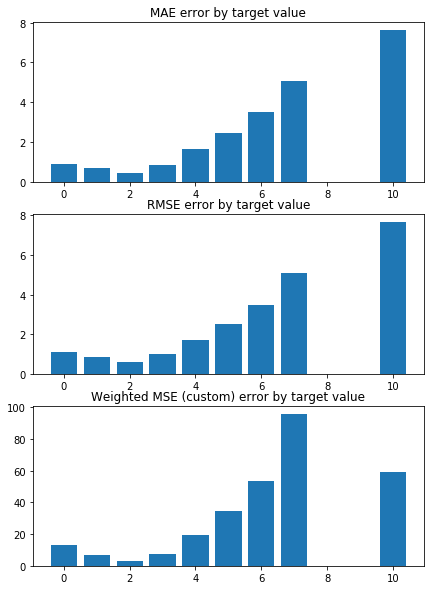

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.1680208099612237 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1724563832382824 

Root of MSE on Test: 1.01 
 1.473925501251092 

Variance score on Test: 0.06 
 r2_test: 0.26728091513133423 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 2.17
MSE_test 2.17
MAE_train 0.98
MAE_test 0.94
r2_test 0.27
    H3K4me1  H3K36me3     Chriz       GAF      CTCF    Su(Hw)  H3K36me1  \
0 -0.395114 -0.256500 -0.102675 -0.093506 -0.090768  0.005222      -0.0   
1 -0.418879 -0.259169 -0.082969 -0.086935 -0.098880  0.000000      -0.0   
2 -0.414282 -0.266115 -0.090573 -0.115641 -0.079657  0.000000      -0.0   
3 -0.417338 -0.269892 -0.079086 -0.080879 -0.108620  0.003624      -0.0   
4 -0.406934 -0.257776 -0.102227 -0.089113 -0.090294  0.001444      -0.0   
5 -0.404516 -0.258463 -0.106891 -0.088229 -0.086271  0.015769      -0.0   
6 -0.414631 -0.265092 -0.081708 -0.089638 -0.099722  0.010862      -0.0   
7 -0.406579 -0.261777 -0.096737 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


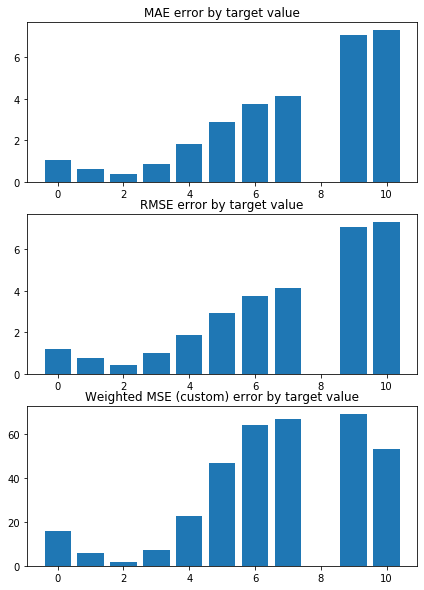

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9935001919466534 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0515745894171775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


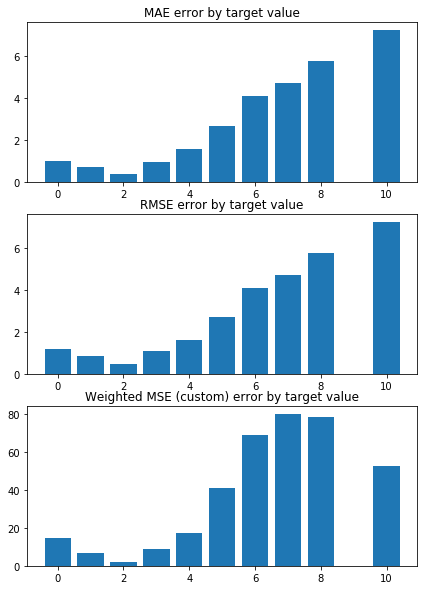

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.980940070835858 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0417681848630542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


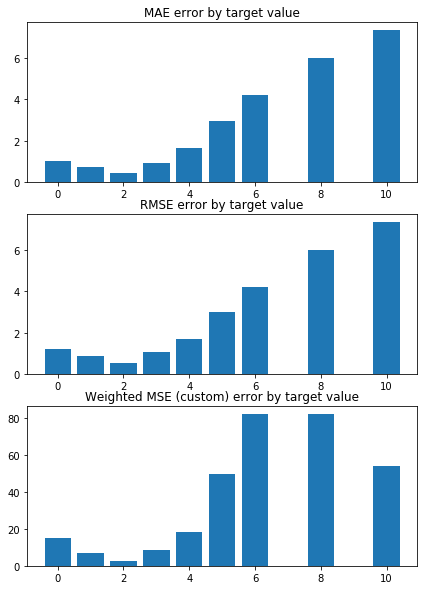

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0828687012326546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0305134361001704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


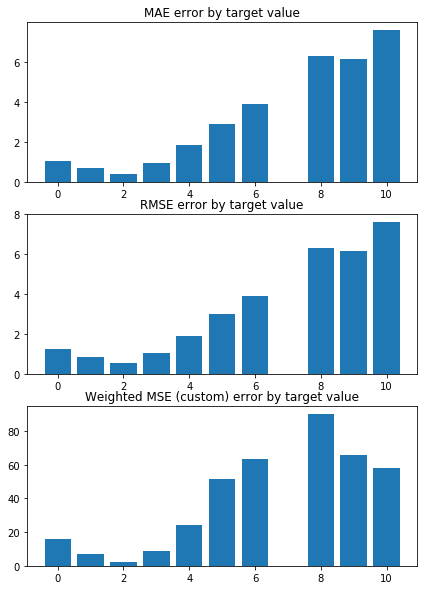

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0329019659936711 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0406686442003947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


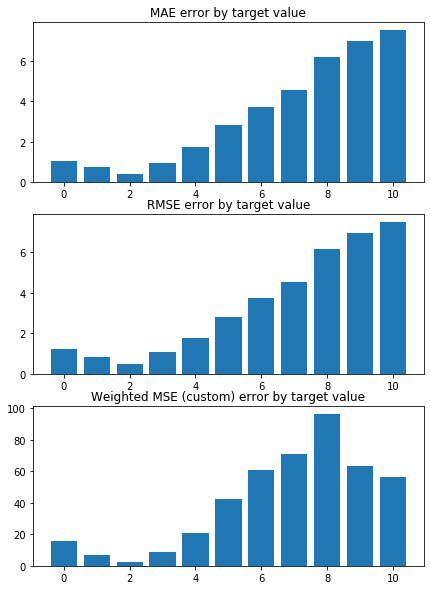

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0840870512808882 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0346174005574384 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


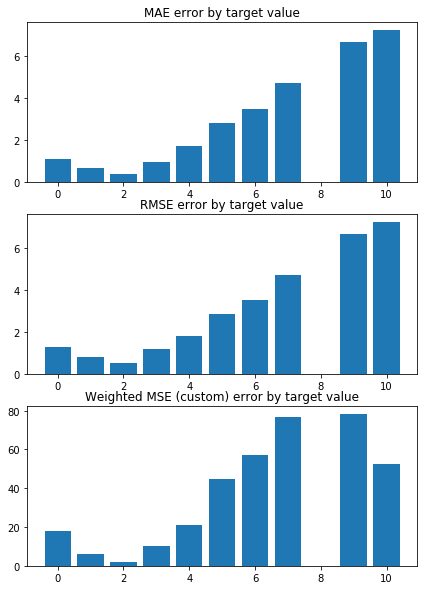

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0185158828873673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0437306390734131 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


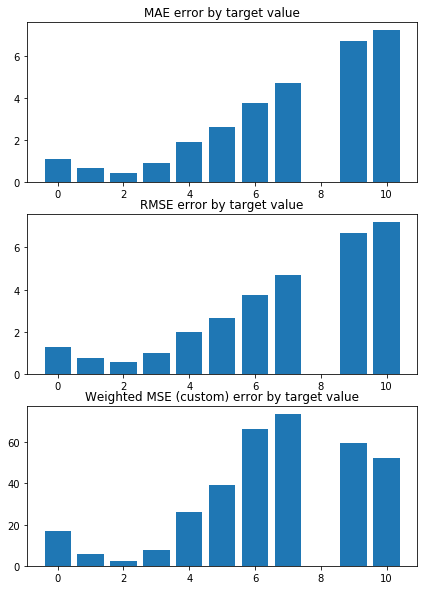

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1150508228728686 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0319821971942589 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


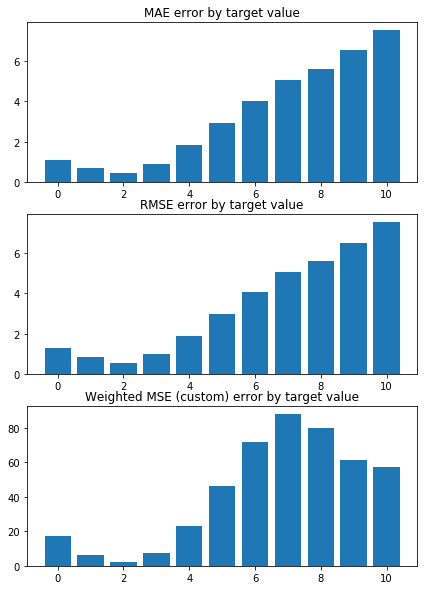

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1487508717068227 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0261687385116758 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


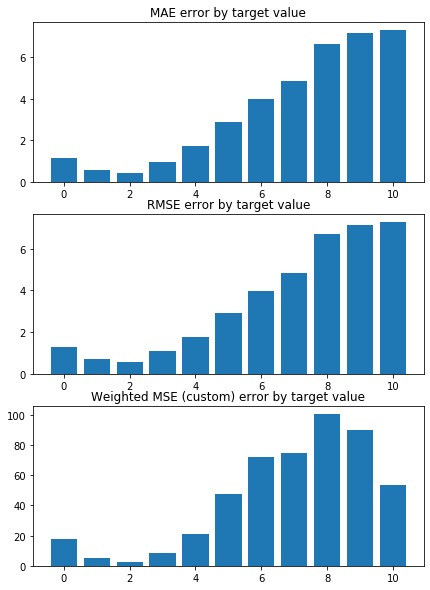

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9500278664083303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0464561293785304 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


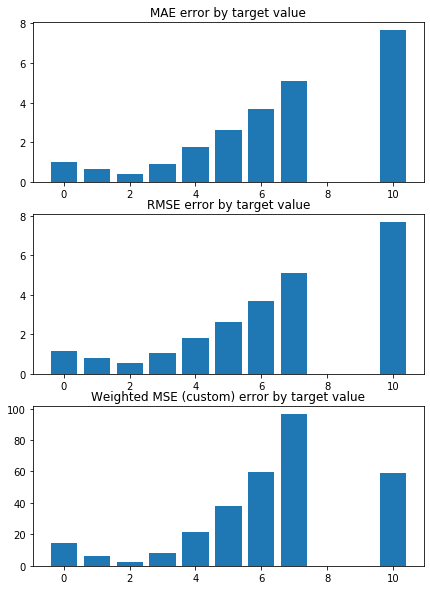

Weighted Mean squared error on Train: 1.04 
 MSE mean train: 2.222527498822653 

Mean squared error on Test: 1.04 
 MSE mean test:  2.227074987703675 

Root of MSE on Test: 1.02 
 1.492338764390872 

Variance score on Test: 0.06 
 r2_test: 0.24863487729102599 

wMSE_train 1.04
wMSE_test 1.04
MSE_train 2.22
MSE_test 2.23
MAE_train 1.01
MAE_test 0.97
r2_test 0.25
    H3K4me1  H3K36me3     Chriz      CTCF       GAF   H3K4me2  H3K36me1  \
0 -0.339689 -0.194040 -0.106285 -0.084132 -0.024967 -0.016885      -0.0   
1 -0.332580 -0.189499 -0.063467 -0.083322 -0.023082 -0.074374      -0.0   
2 -0.333473 -0.198546 -0.073950 -0.072052 -0.051764 -0.053186      -0.0   
3 -0.352891 -0.205052 -0.076430 -0.104015 -0.013177 -0.030122      -0.0   
4 -0.351794 -0.195974 -0.104568 -0.088609 -0.021992 -0.011172      -0.0   
5 -0.344789 -0.194875 -0.108205 -0.081920 -0.012296 -0.024450      -0.0   
6 -0.342733 -0.195608 -0.075043 -0.089923 -0.017596 -0.053528      -0.0   
7 -0.349698 -0.197779 -0.098954 -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


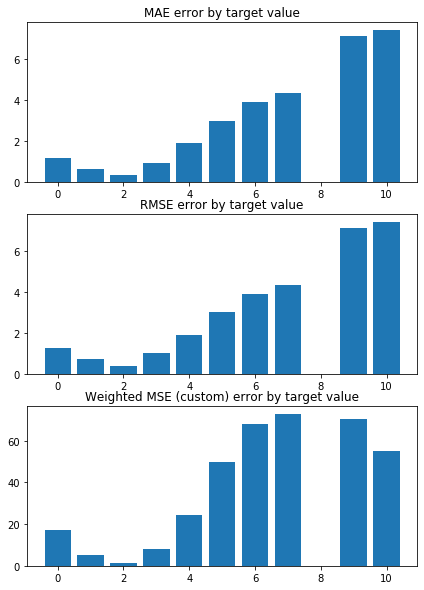

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0543269285081962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.096153337790733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


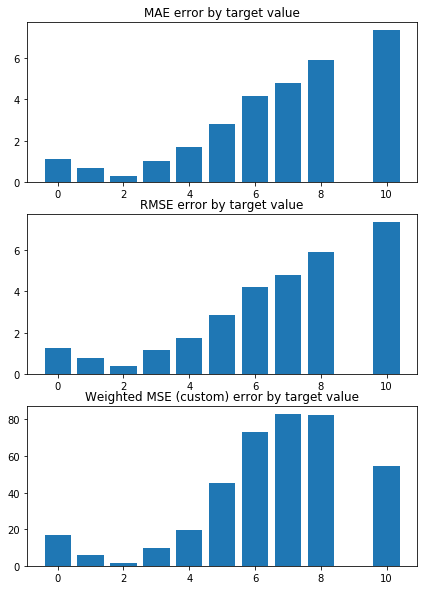

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.01323244266949 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0902128922053202 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


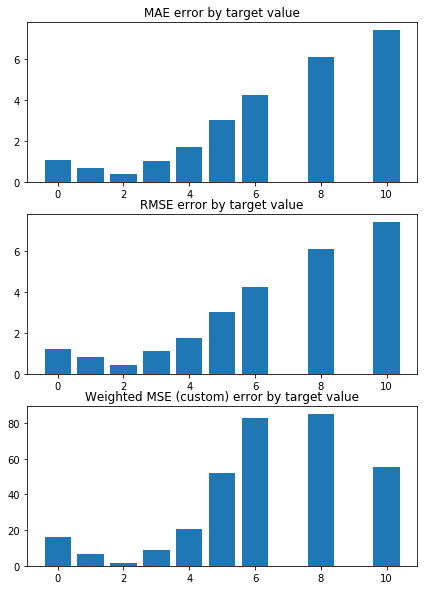

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.110826378587532 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0716187048366612 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


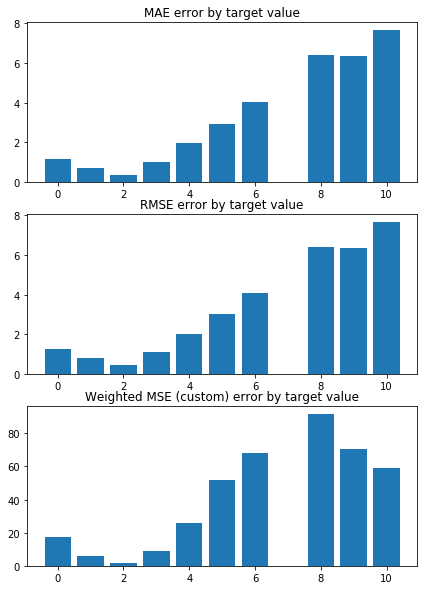

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0829666264663822 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0829254411414946 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


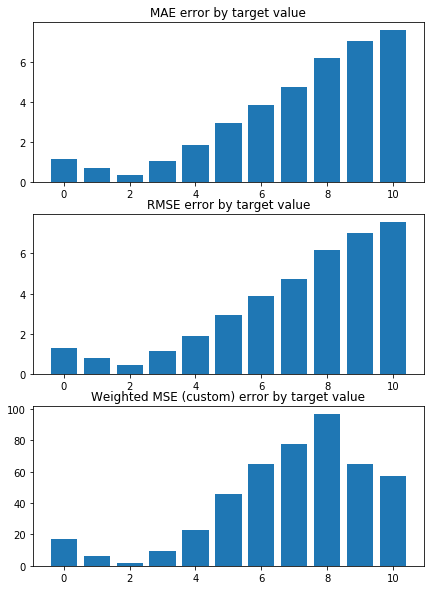

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1109743900475153 


 TRAIN PREDICTION Error
weighted_mse_train: 1.07726756500842 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


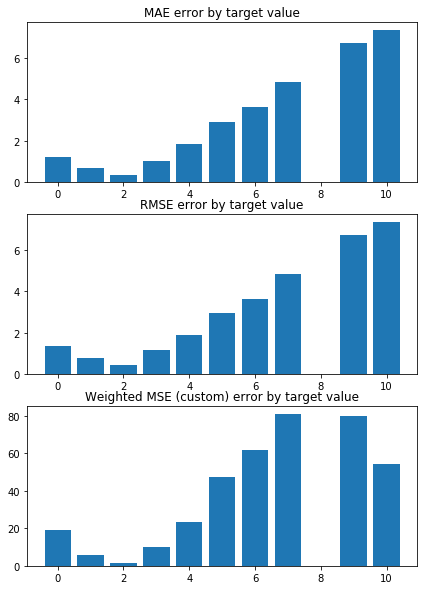

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0544567255406345 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0873692452241281 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


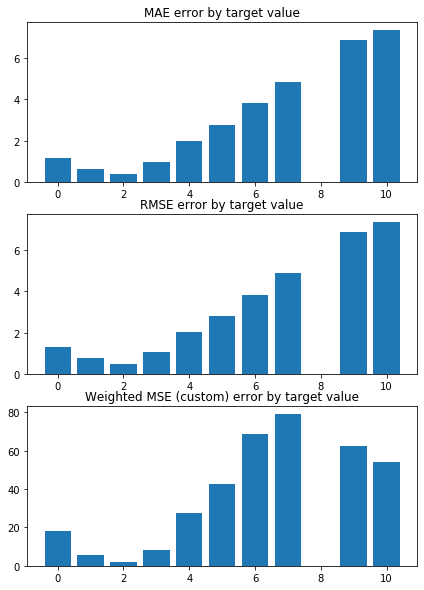

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1593813228849636 


 TRAIN PREDICTION Error
weighted_mse_train: 1.074225857417111 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


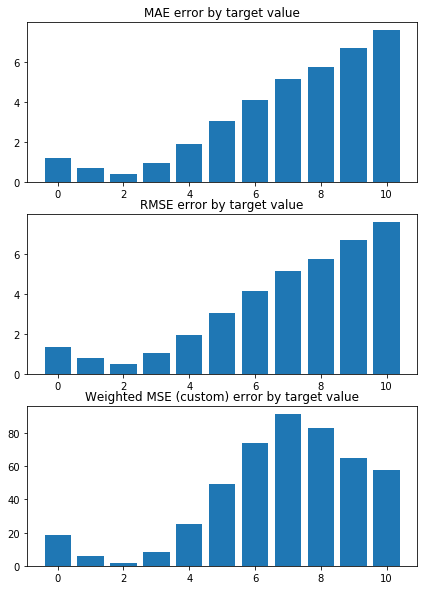

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1969621678700568 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0680639527196827 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


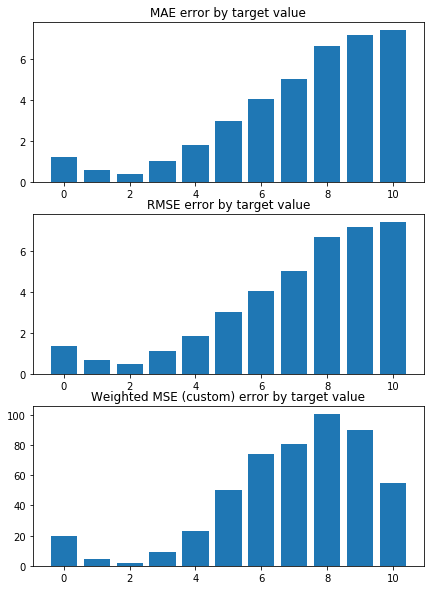

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9986672275332011 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0890332640767044 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


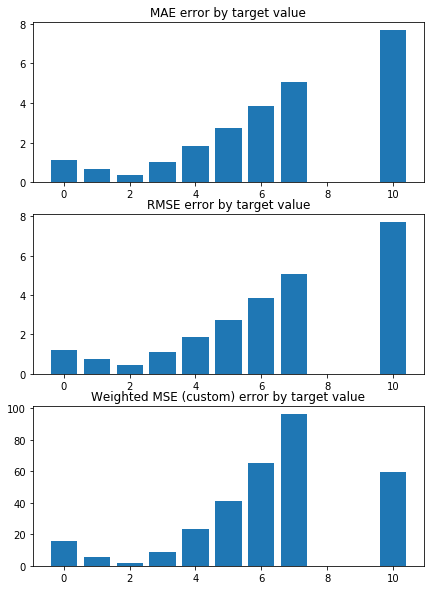

Weighted Mean squared error on Train: 1.08 
 MSE mean train: 2.302769586293462 

Mean squared error on Test: 1.08 
 MSE mean test:  2.3060550532021296 

Root of MSE on Test: 1.04 
 1.51857006858496 

Variance score on Test: 0.06 
 r2_test: 0.22160353981488418 

wMSE_train 1.08
wMSE_test 1.08
MSE_train 2.3
MSE_test 2.31
MAE_train 1.04
MAE_test 1.01
r2_test 0.22
    H3K4me1  H3K36me3   H3K4me2     Chriz      CTCF  H3K36me1  H3K27me3  \
0 -0.237633 -0.128578 -0.113073 -0.066017 -0.058577      -0.0       0.0   
1 -0.224325 -0.123701 -0.173688 -0.015935 -0.056981      -0.0       0.0   
2 -0.227767 -0.124315 -0.138287 -0.035207 -0.056505      -0.0       0.0   
3 -0.245191 -0.140406 -0.123536 -0.026242 -0.081585      -0.0       0.0   
4 -0.245152 -0.129499 -0.107593 -0.058793 -0.067452      -0.0       0.0   
5 -0.233679 -0.129152 -0.112643 -0.055454 -0.057439      -0.0       0.0   
6 -0.237199 -0.127647 -0.142696 -0.027850 -0.066237      -0.0       0.0   
7 -0.244521 -0.133991 -0.123082 -0.05

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


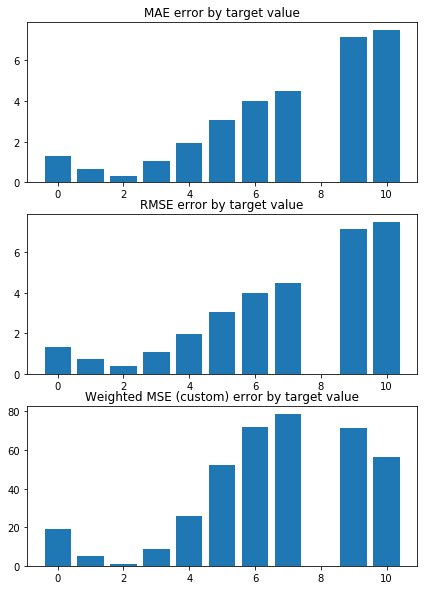

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1361983612790336 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1596605998324703 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


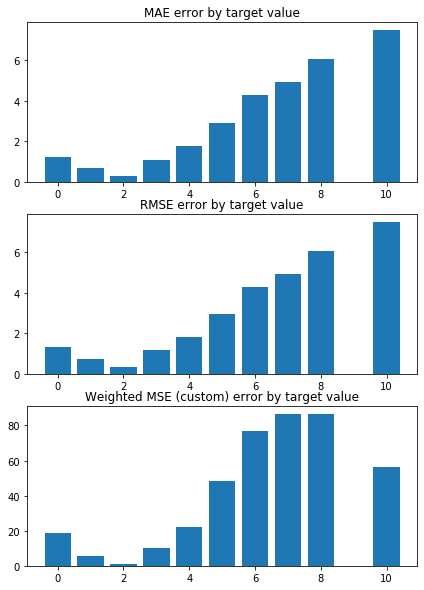

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.072598952388322 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1542208781919534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


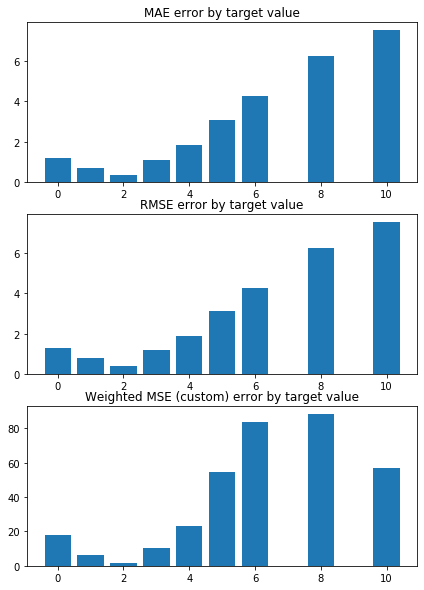

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1561755316418252 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1333684660177568 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


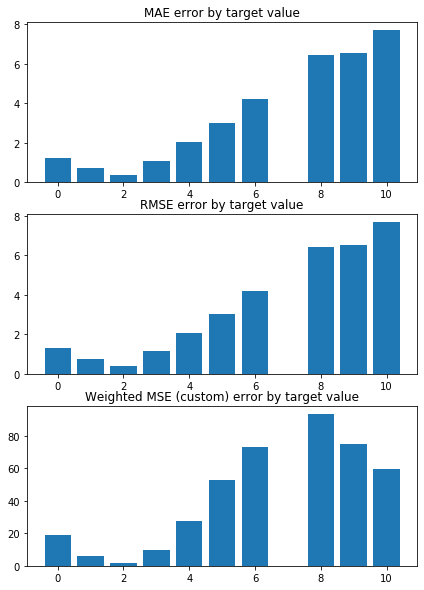

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1521698848623805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1466061164878278 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


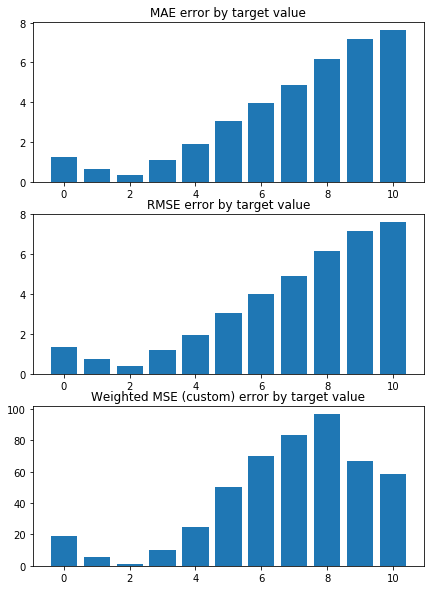

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1591455737750607 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1427909832662064 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


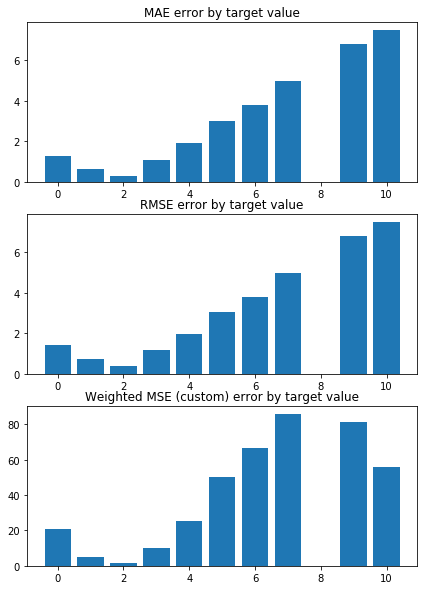

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.110165024016513 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1515073700092717 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


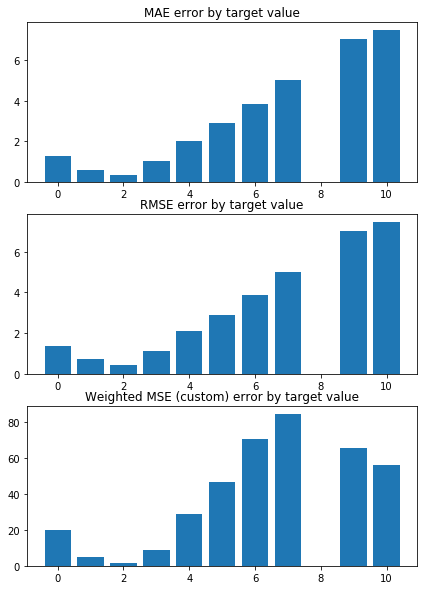

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2239945739183828 


 TRAIN PREDICTION Error
weighted_mse_train: 1.138099493335371 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


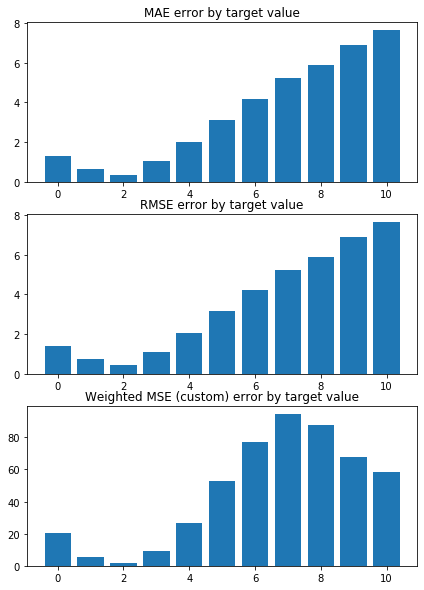

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2657523356420939 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1319120385947314 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


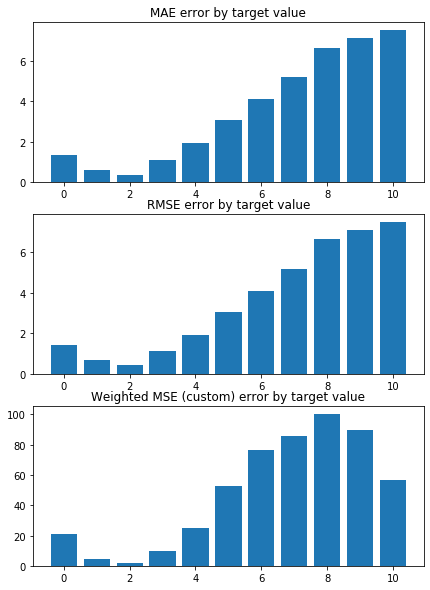

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.068812960030394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1530821959244362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


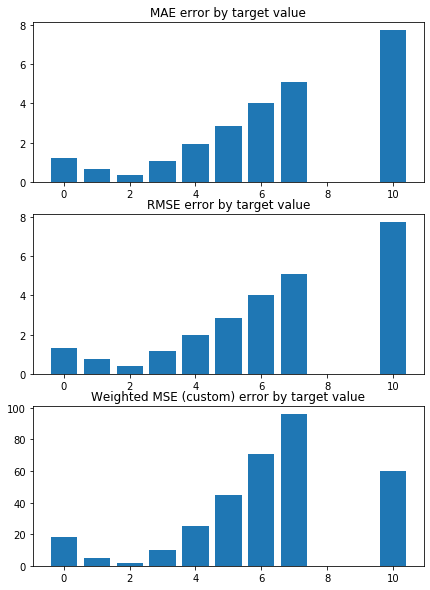

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4077287125026703 

Mean squared error on Test: 1.15 
 MSE mean test:  2.410720462302491 

Root of MSE on Test: 1.07 
 1.5526494975693939 

Variance score on Test: 0.06 
 r2_test: 0.18581202088075455 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.41
MSE_test 2.41
MAE_train 1.08
MAE_test 1.06
r2_test 0.19
    H3K4me2   H3K4me1  H3K36me3      CTCF  RNA-polymerase-II     Chriz  CP190  \
0 -0.201623 -0.128855 -0.066197 -0.029647          -0.015793 -0.011066   -0.0   
1 -0.253458 -0.123316 -0.052215 -0.007814          -0.015372 -0.000000   -0.0   
2 -0.221651 -0.121337 -0.057404 -0.020914          -0.040725 -0.000000   -0.0   
3 -0.201668 -0.142779 -0.070159 -0.043462          -0.019377 -0.000000   -0.0   
4 -0.197389 -0.133157 -0.065613 -0.043367          -0.022127 -0.001002   -0.0   
5 -0.201347 -0.121375 -0.065848 -0.029778          -0.046274 -0.000000   -0.0   
6 -0.220886 -0.135869 -0.056634 -0.027379          -0.024804 -0.000

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


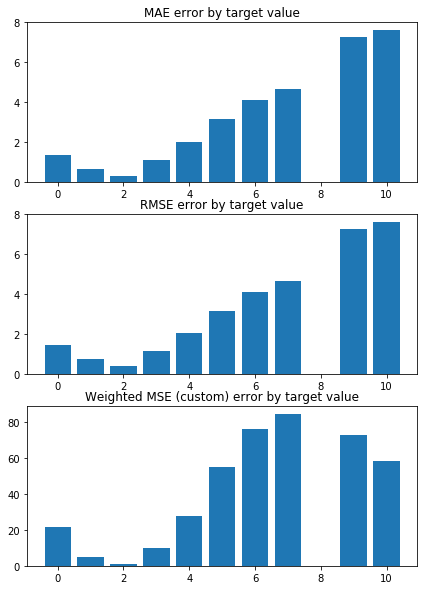

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2261289875823698 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2361843330719988 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


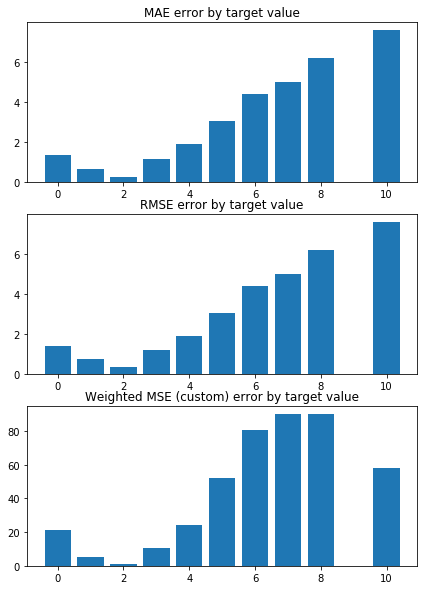

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1477510699928823 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2335312190615568 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


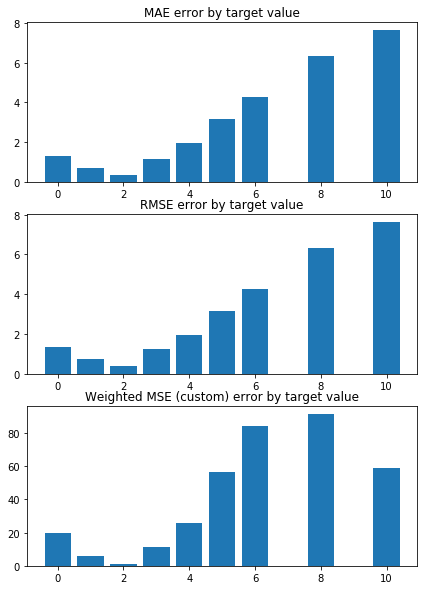

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.219714926244147 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2158133242656561 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


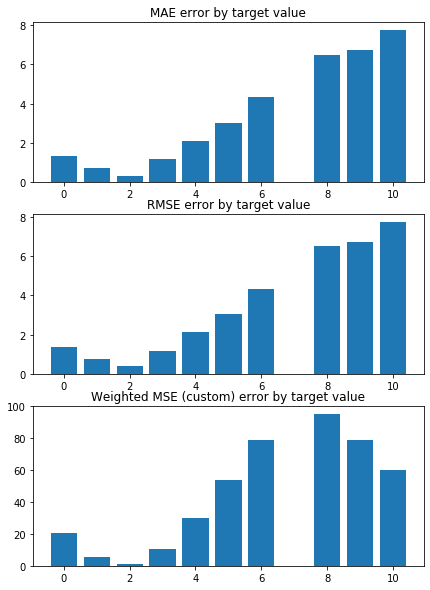

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2417781547009994 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2283211475192333 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


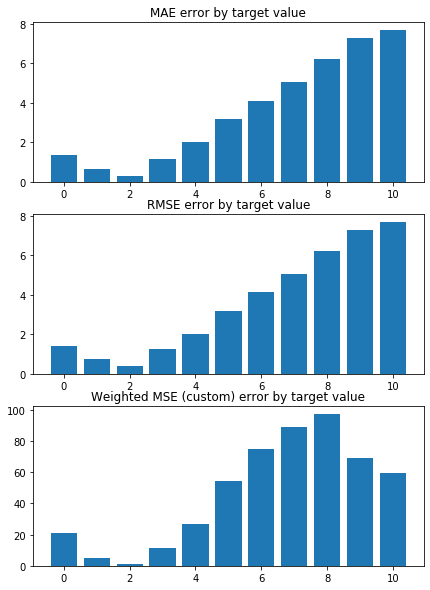

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2219628666484392 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2247170610103935 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


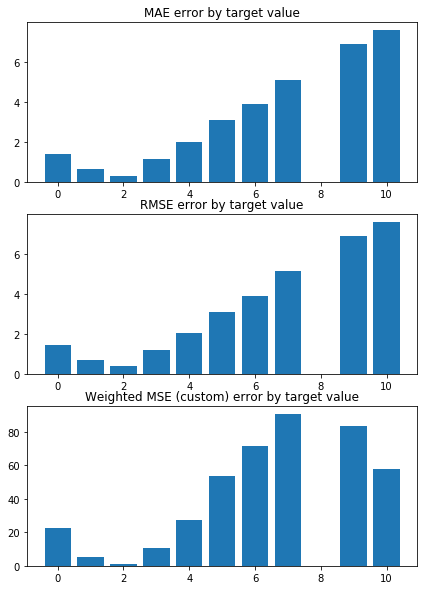

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1812200461606985 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2316135279656424 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


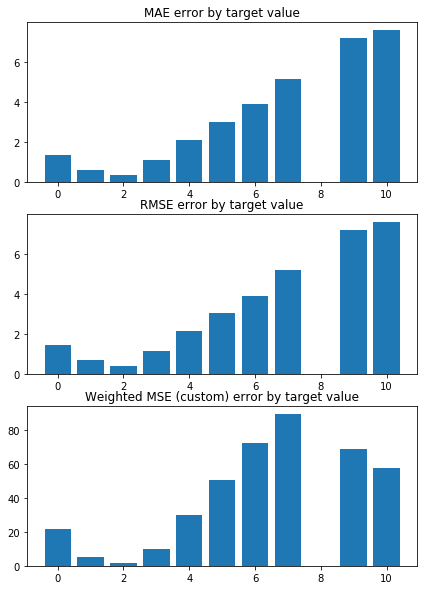

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3076429844324045 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2203781167610568 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


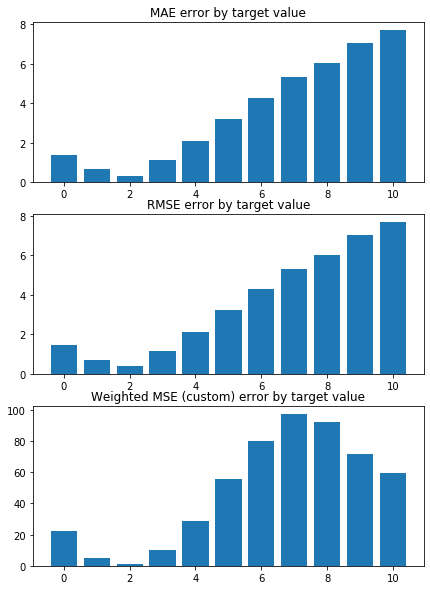

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3427893438674756 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2089636523902823 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


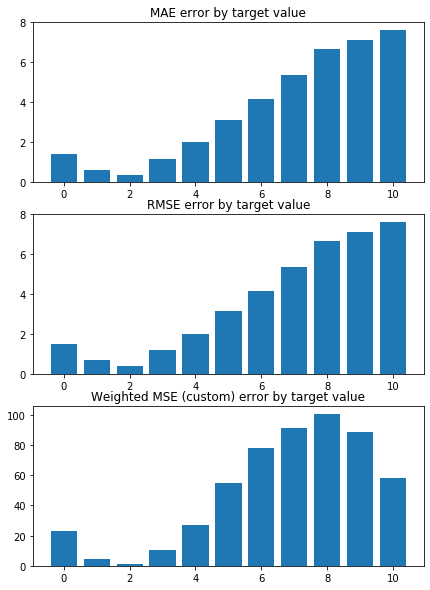

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1592842508472694 


 TRAIN PREDICTION Error
weighted_mse_train: 1.234497244605661 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


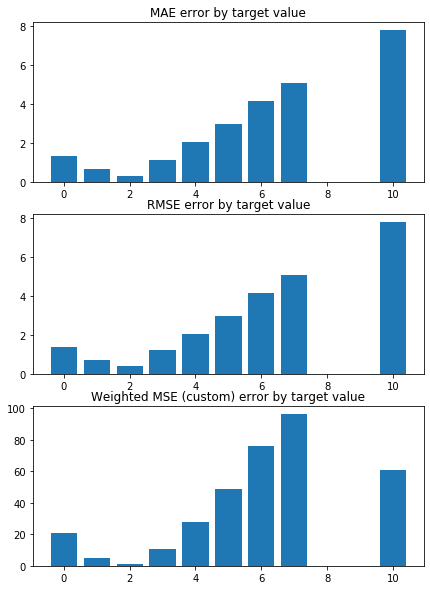

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 2.531914164425518 

Mean squared error on Test: 1.23 
 MSE mean test:  2.5338307121626933 

Root of MSE on Test: 1.11 
 1.59180109064 

Variance score on Test: 0.06 
 r2_test: 0.1437551934455506 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 2.53
MSE_test 2.53
MAE_train 1.13
MAE_test 1.11
r2_test 0.14
    H3K4me2   H3K4me1  RNA-polymerase-II  H3K36me3  H3K36me1  H3K27me3  \
0 -0.258401 -0.038190          -0.014910      -0.0      -0.0       0.0   
1 -0.275243 -0.045297          -0.000000      -0.0      -0.0       0.0   
2 -0.262384 -0.037411          -0.026151      -0.0      -0.0       0.0   
3 -0.264571 -0.050965          -0.019328      -0.0      -0.0       0.0   
4 -0.260672 -0.042569          -0.017609      -0.0      -0.0       0.0   
5 -0.252110 -0.032849          -0.041021      -0.0      -0.0       0.0   
6 -0.263291 -0.054557          -0.011362      -0.0      -0.0       0.0   
7 -0.265455 -0.046268          -0.013245      -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


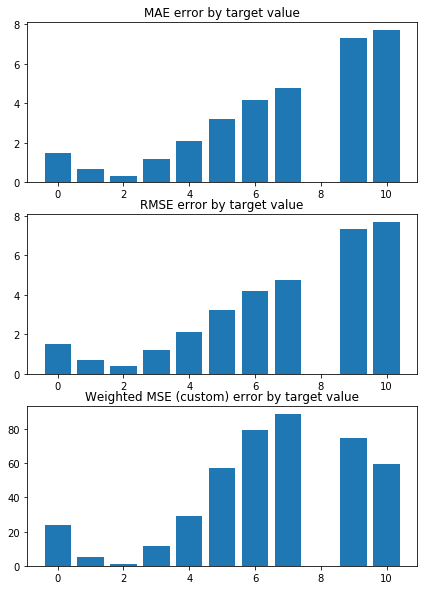

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3160390773345267 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3170368660915694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


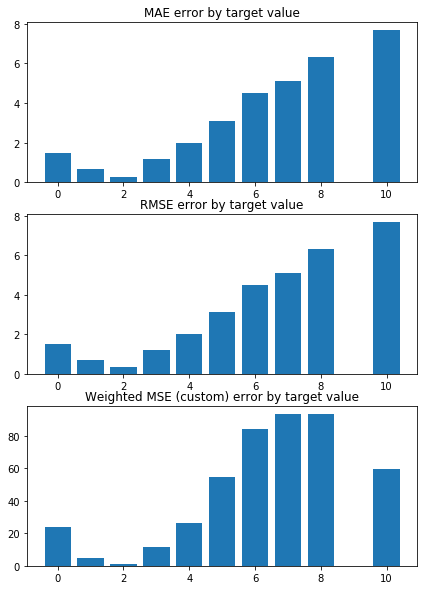

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2281315143488292 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3158610260560353 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


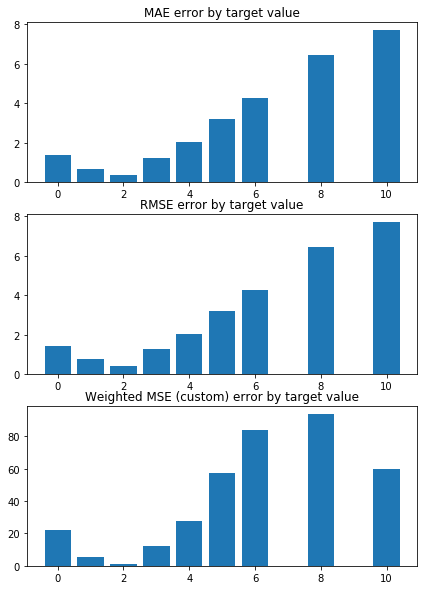

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.287493484047188 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2974362915281317 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


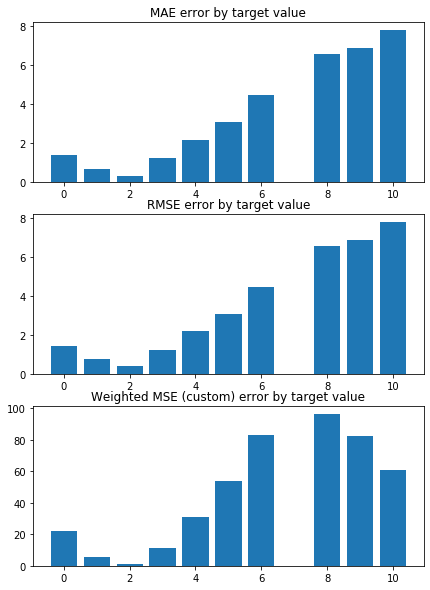

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3331546728968233 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3092919985528289 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


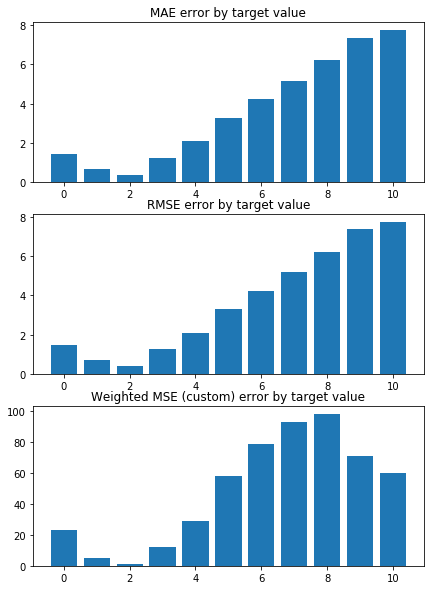

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2873194173732796 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3073399240356862 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


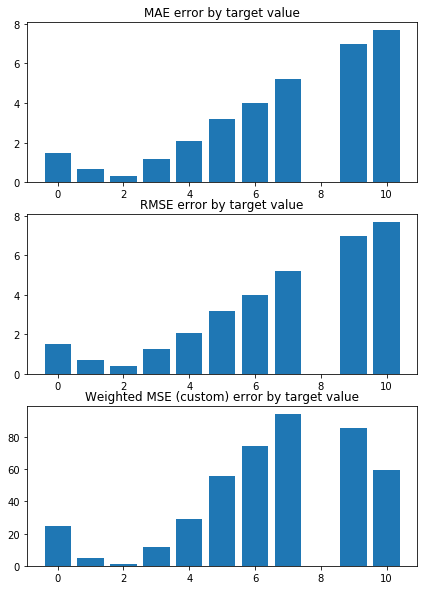

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2536660215661166 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3147598316352032 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


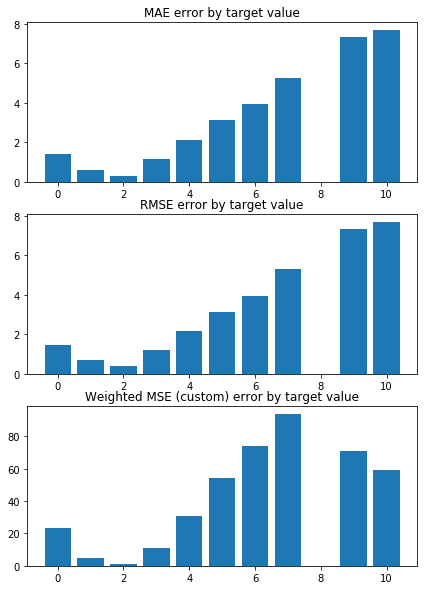

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3929667129026557 


 TRAIN PREDICTION Error
weighted_mse_train: 1.302209843115349 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


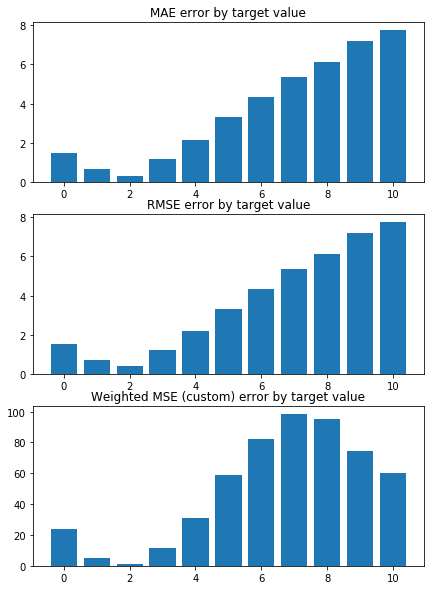

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4096904253898452 


 TRAIN PREDICTION Error
weighted_mse_train: 1.28644595787229 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


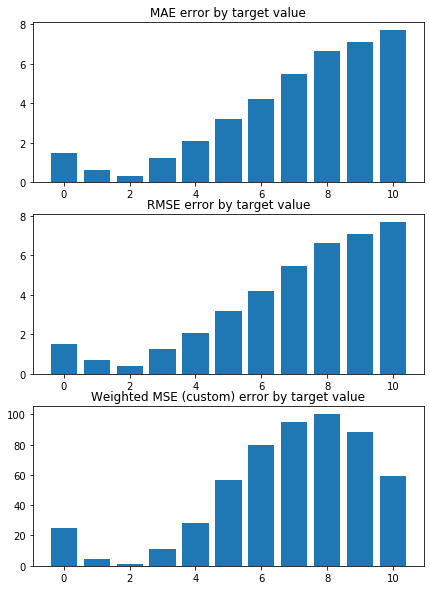

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2496568305330387 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3142764801557587 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


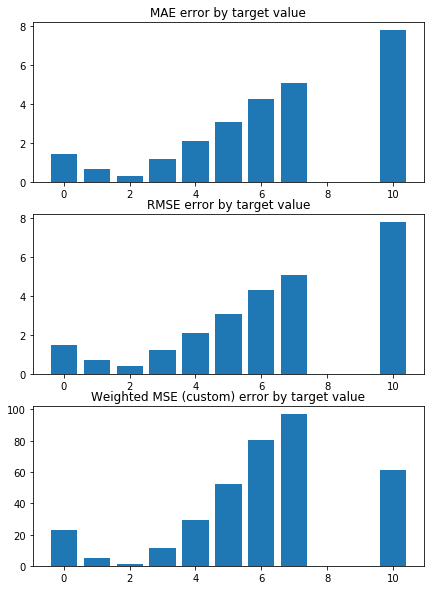

Weighted Mean squared error on Train: 1.31 
 MSE mean train: 2.651660901346319 

Mean squared error on Test: 1.31 
 MSE mean test:  2.6529001330837305 

Root of MSE on Test: 1.14 
 1.628772584826909 

Variance score on Test: 0.06 
 r2_test: 0.10305076553161738 

wMSE_train 1.31
wMSE_test 1.31
MSE_train 2.65
MSE_test 2.65
MAE_train 1.17
MAE_test 1.15
r2_test 0.1
    H3K4me2  Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.202878   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
1 -0.211449   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
2 -0.216030   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
3 -0.224406   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
4 -0.211490   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
5 -0.217716   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
6 -0.217105   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


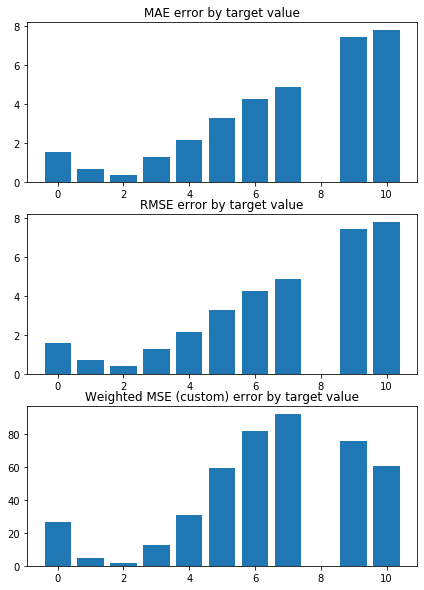

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4198412727136485 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4104511122762557 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


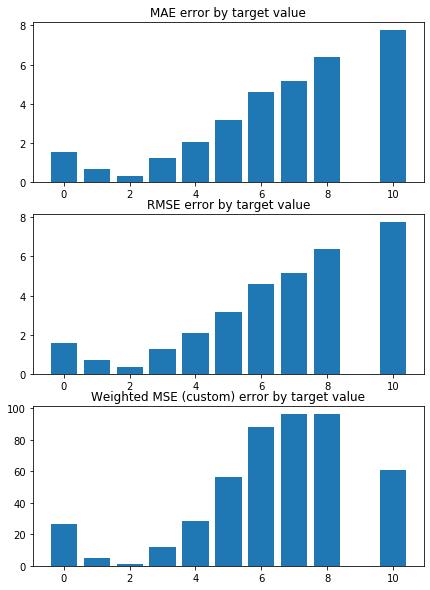

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3201957017813122 


 TRAIN PREDICTION Error
weighted_mse_train: 1.409407820973259 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


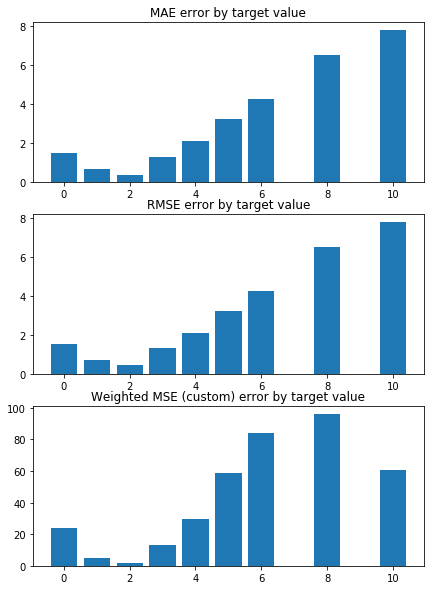

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3658658129535277 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3890441974205083 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


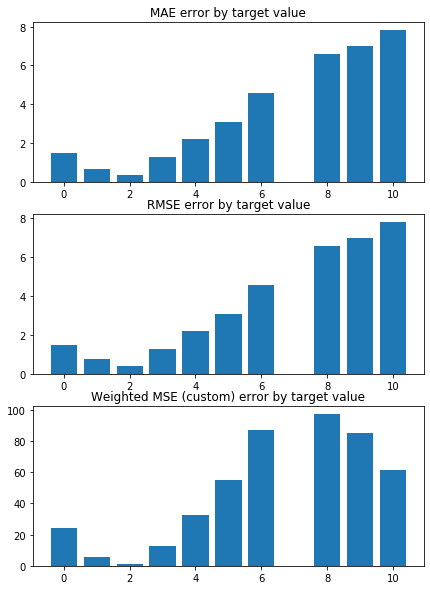

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.435140945147394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4016593863944051 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


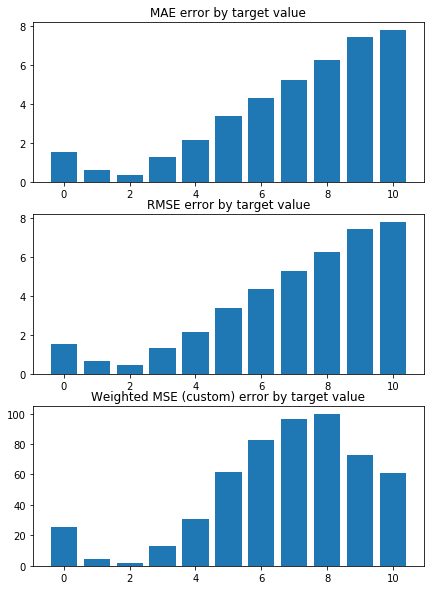

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3623258140353396 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4000794364934024 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


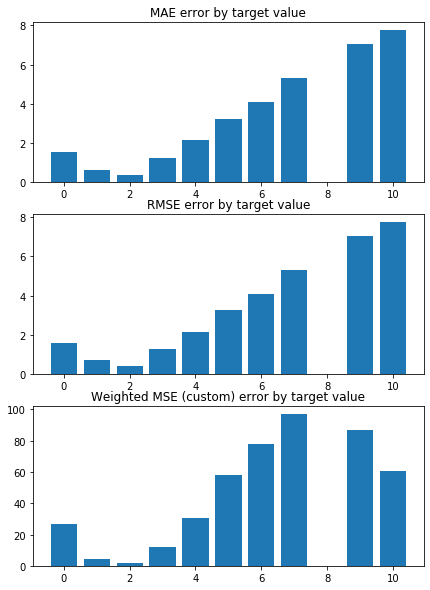

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.342825170736304 


 TRAIN PREDICTION Error
weighted_mse_train: 1.408588664255212 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


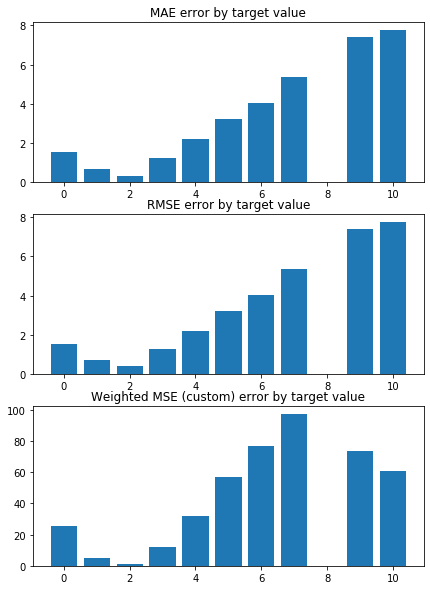

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.4916056497083992 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3955860031644034 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


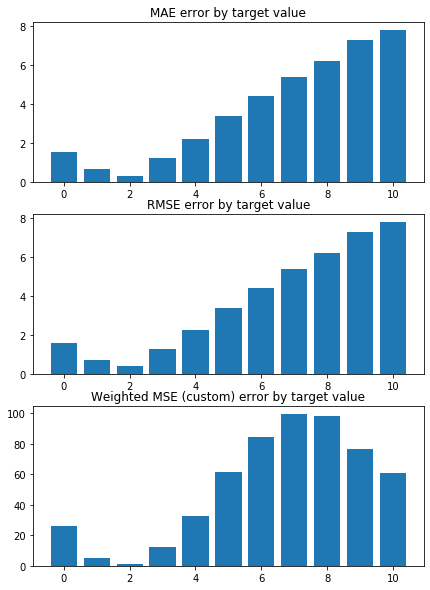

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4846756261127565 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3772224198353553 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


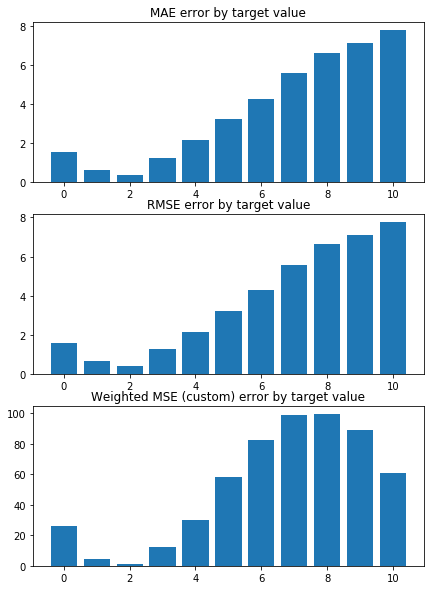

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3541850048495585 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4062898337504892 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


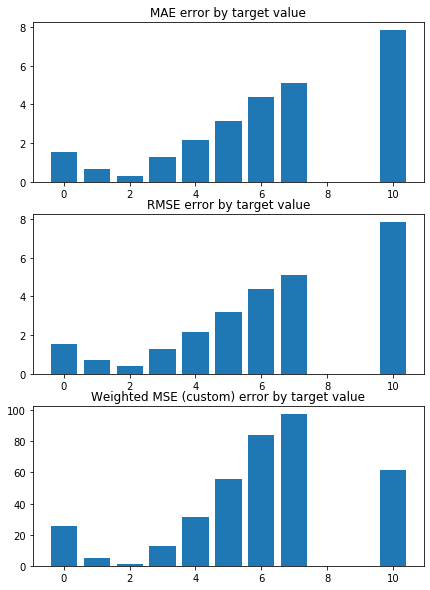

Weighted Mean squared error on Train: 1.40 
 MSE mean train: 2.7816898169406508 

Mean squared error on Test: 1.40 
 MSE mean test:  2.783116723399908 

Root of MSE on Test: 1.18 
 1.668267581474839 

Variance score on Test: 0.06 
 r2_test: 0.05851133605081996 

wMSE_train 1.4
wMSE_test 1.4
MSE_train 2.78
MSE_test 2.78
MAE_train 1.21
MAE_test 1.2
r2_test 0.06
    H3K4me2  Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.102439   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
1 -0.110797   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
2 -0.115280   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
3 -0.125075   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
4 -0.111396   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
5 -0.118802   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
6 -0.117206   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


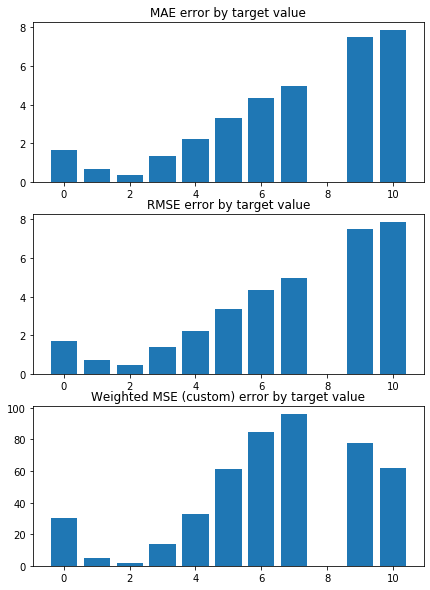

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5422317873347806 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5211177120331172 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


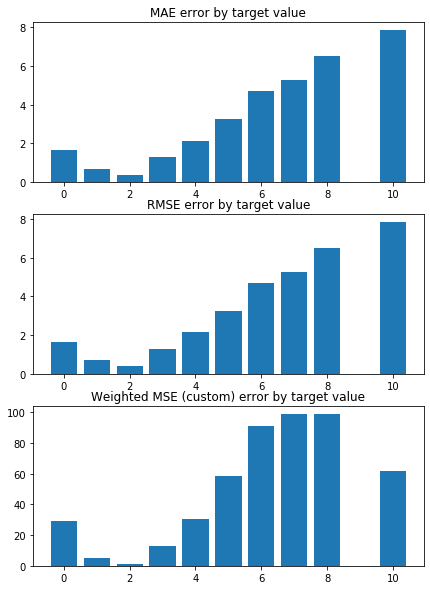

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4309392292266612 


 TRAIN PREDICTION Error
weighted_mse_train: 1.520222413001534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


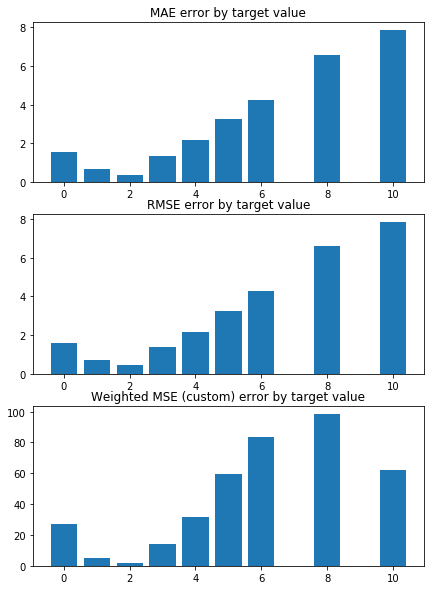

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4601077864036158 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4976821453513964 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


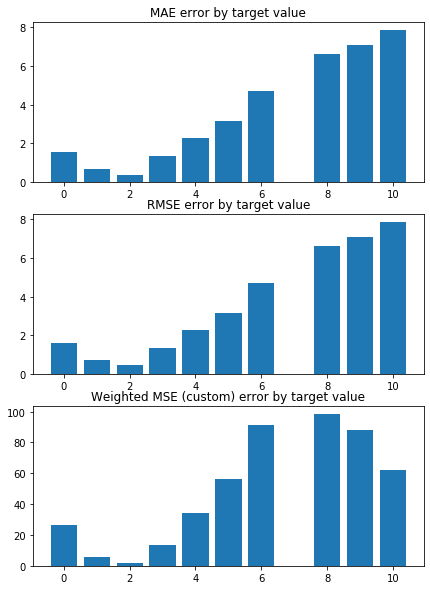

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5545984096138492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5111649588503873 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


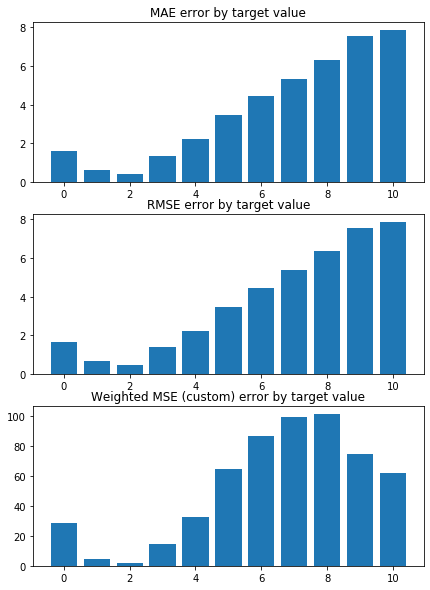

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4521363786900752 


 TRAIN PREDICTION Error
weighted_mse_train: 1.509801416788388 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


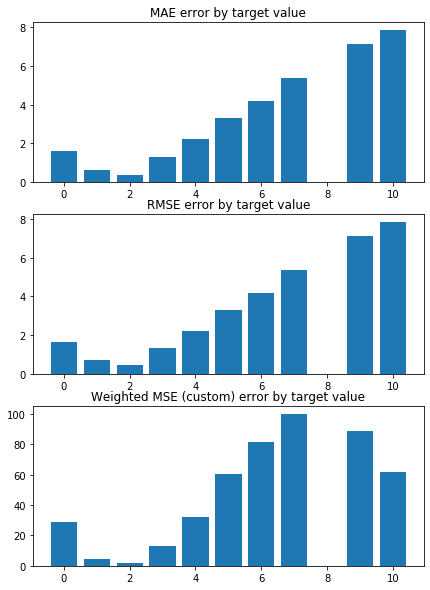

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.450308832265951 


 TRAIN PREDICTION Error
weighted_mse_train: 1.519574080699116 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


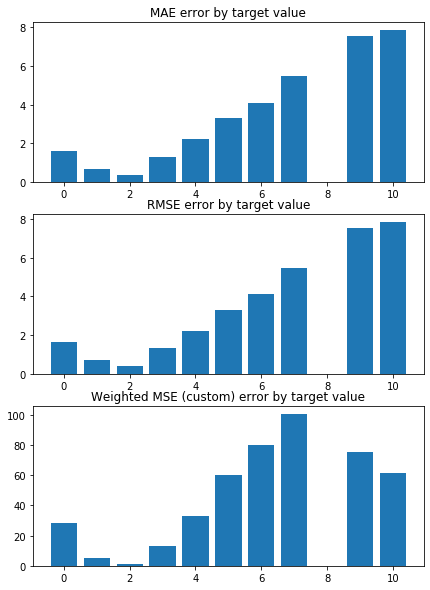

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6089792224561263 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5062382360970474 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


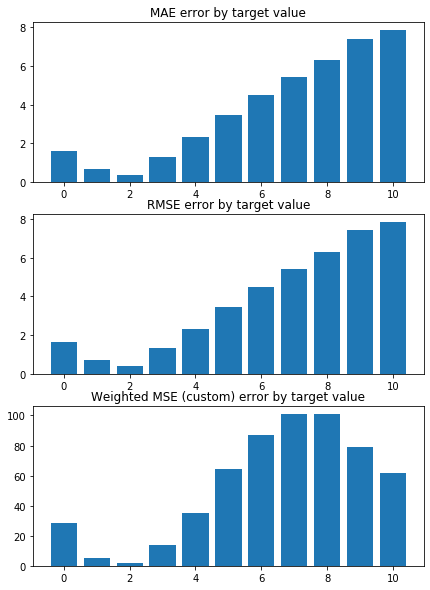

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5730747030163654 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4848776888579225 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


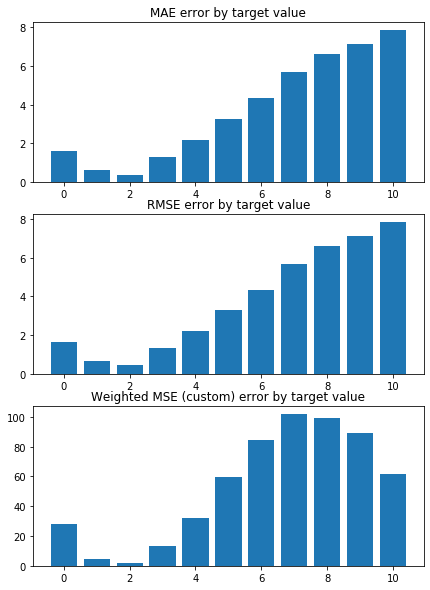

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4765403380045783 


 TRAIN PREDICTION Error
weighted_mse_train: 1.515531005220547 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


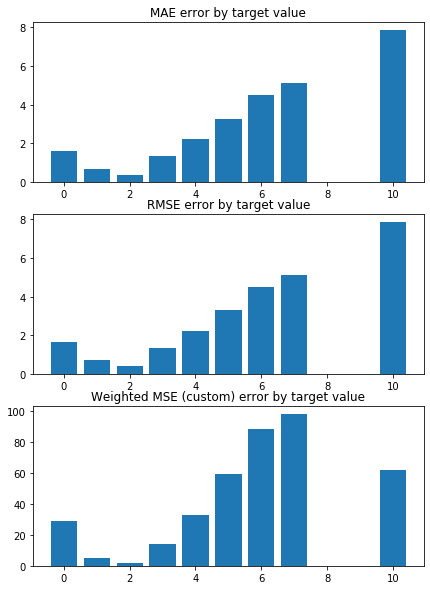

Weighted Mean squared error on Train: 1.51 
 MSE mean train: 2.9317024167899755 

Mean squared error on Test: 1.51 
 MSE mean test:  2.933357924146677 

Root of MSE on Test: 1.23 
 1.7127048561111389 

Variance score on Test: 0.06 
 r2_test: 0.007115246823823607 

wMSE_train 1.51
wMSE_test 1.51
MSE_train 2.93
MSE_test 2.93
MAE_train 1.26
MAE_test 1.25
r2_test 0.01
    H3K4me2  Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  \
0 -0.001999   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
1 -0.010144   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
2 -0.014530   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
3 -0.025744   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
4 -0.011302   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
5 -0.019889   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0   
6 -0.016637   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


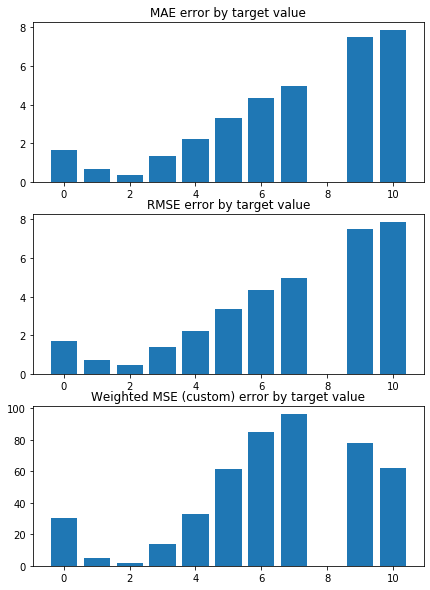

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


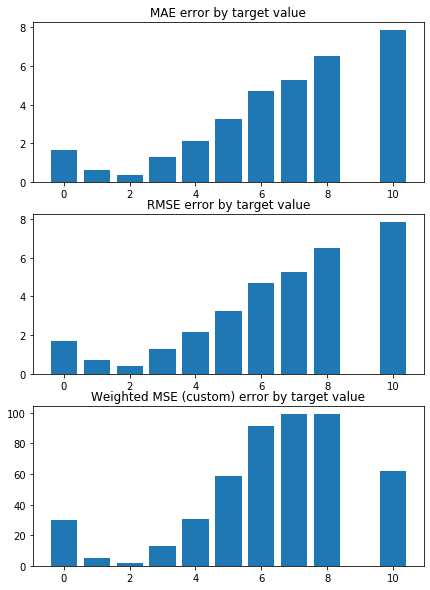

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


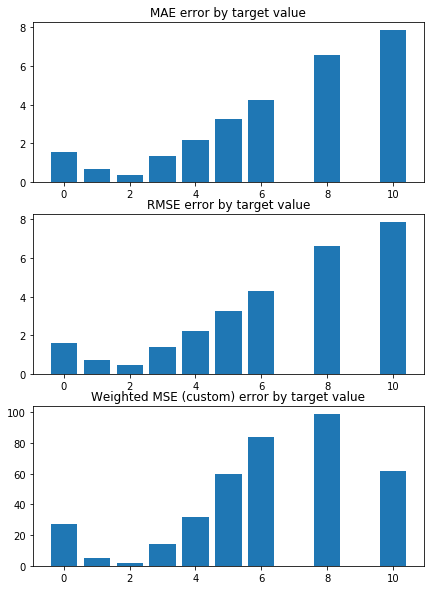

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


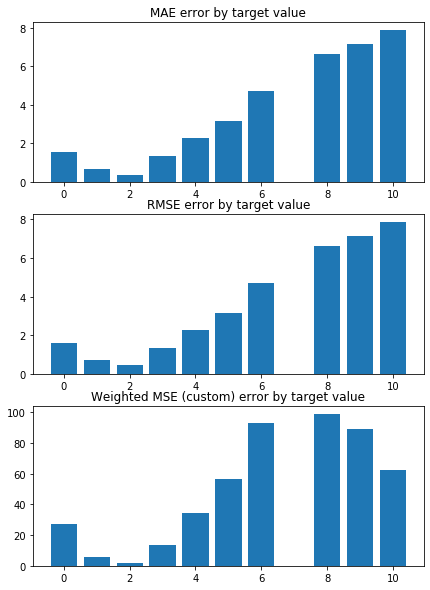

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


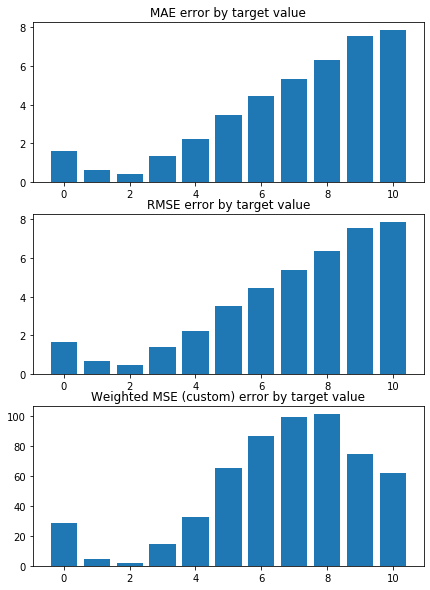

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


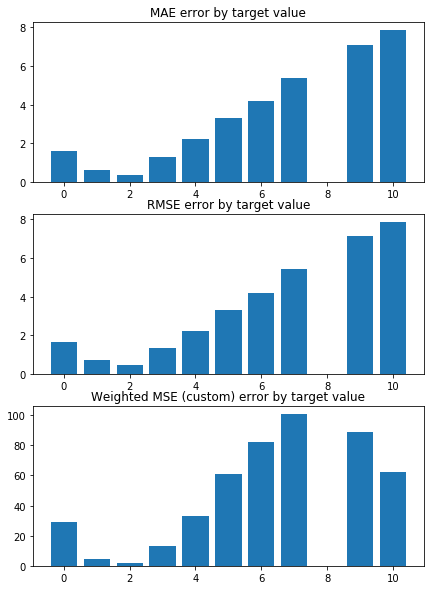

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


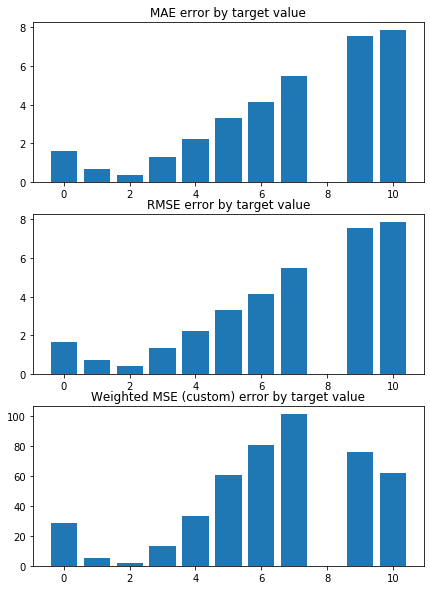

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


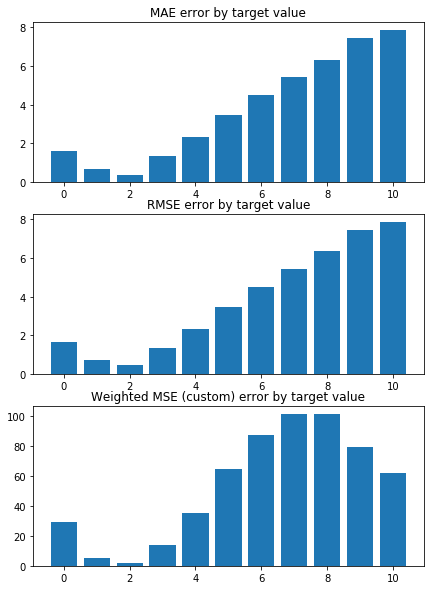

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


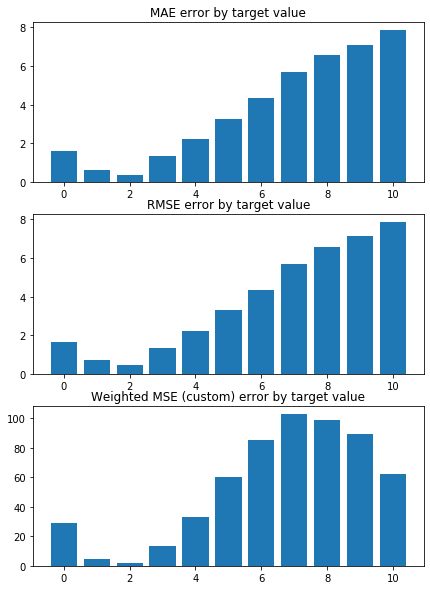

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


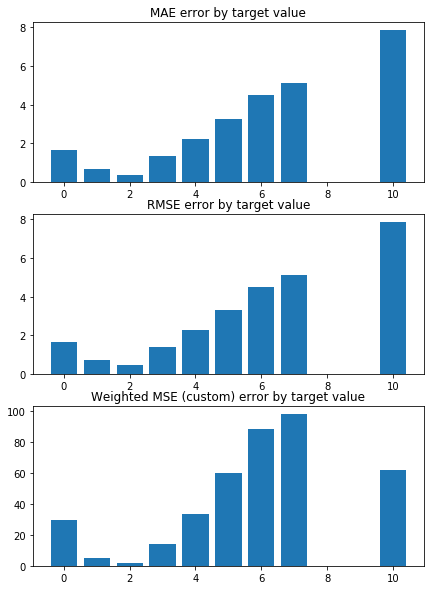

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  H3K36me3  H3K36me1  H3K27me3  H3K27me1  H3K27ac  H3K9me3  H3K9me2  \
0   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
1   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
2   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
3   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
4   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
5   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   
6   -0.0      -0.0      -0.0       0.0      -0.0      0.0     -0.0     -0.0   

In [80]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 1, 0.1)
# Create linear regression object

model_name = 'LR+L1_grid0.1-1'
n_splits = 10
random_state = 16 
shuffle = True


wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                        weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                        rmse_test, rmse_train, rmse_test_const, \
                        mae_test,    mae_train,  mae_test_const, \
                        _ = train_test_KFold(X, y, model, model_name, results_pd,
                                             n_splits=n_splits, random_state=random_state, shuffle=shuffle)


    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


In [81]:
wmse_test

[1.0054820749179934,
 1.0193690439338146,
 1.0414118615316628,
 1.0844233291564203,
 1.1481996688014329,
 1.2280950615920614,
 1.308926022605893,
 1.4018261209360954,
 1.5119086901491363,
 1.5297902635376162]

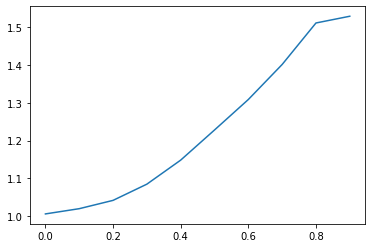

In [82]:
plt.plot(alpha_grid, wmse_test)

In [83]:
# Best alpha = 0.2

# L1 - best  score

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0074751901515142 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0431542605959534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


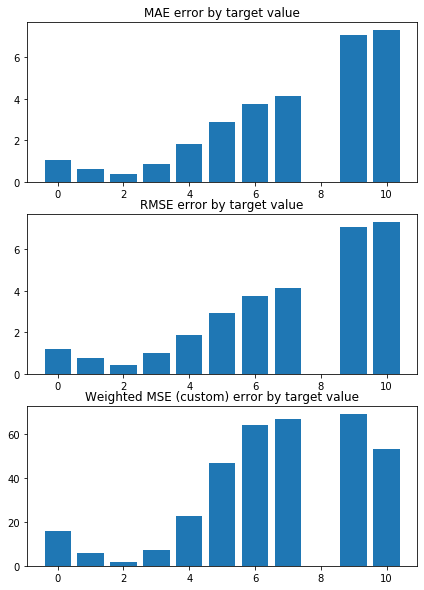

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9935001919466534 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0515745894171775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


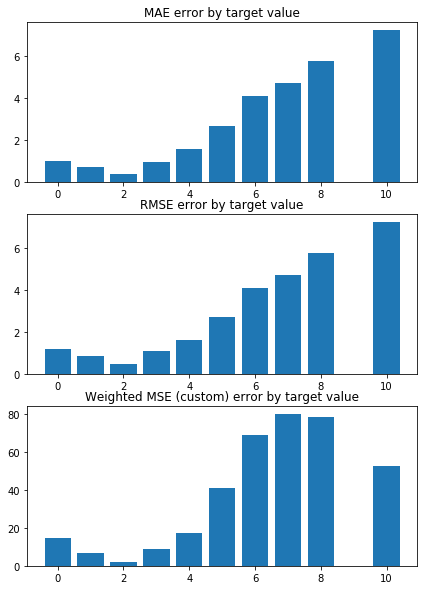

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.980940070835858 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0417681848630542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


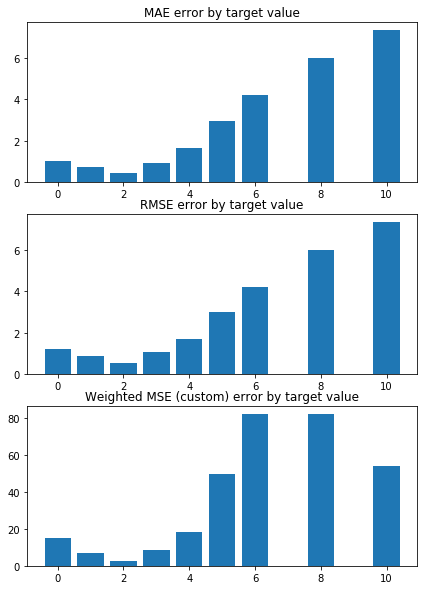

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0828687012326546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0305134361001704 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


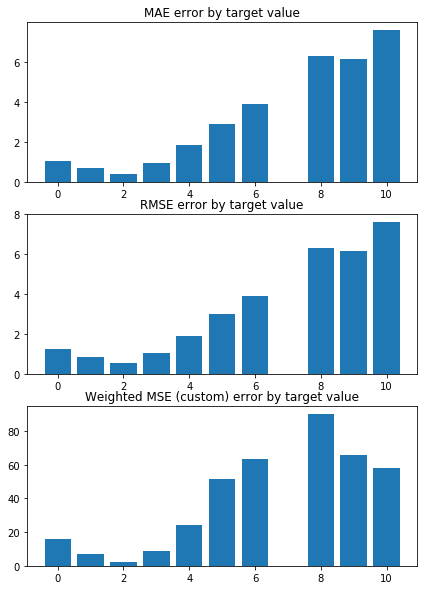

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0329019659936711 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0406686442003947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


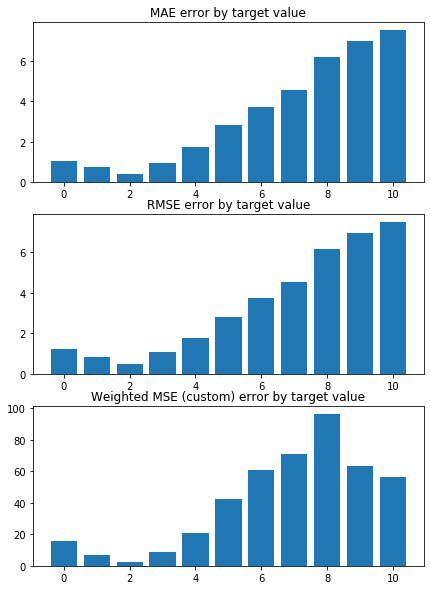

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0840870512808882 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0346174005574384 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


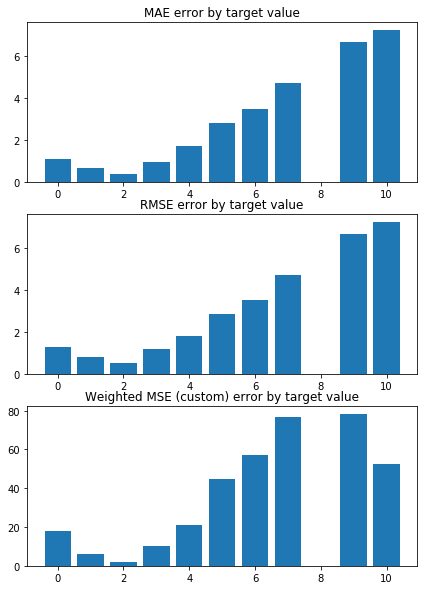

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0185158828873673 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0437306390734131 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


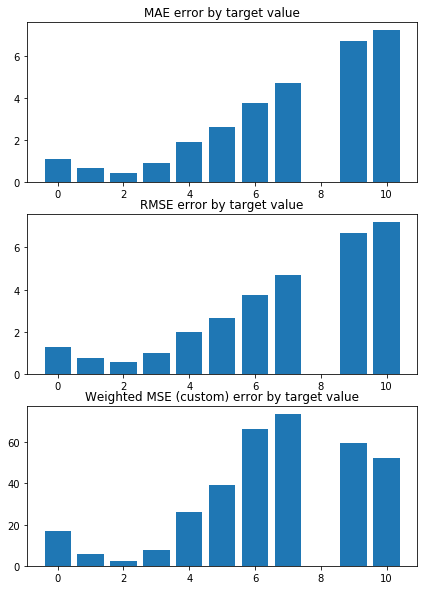

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1150508228728686 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0319821971942589 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


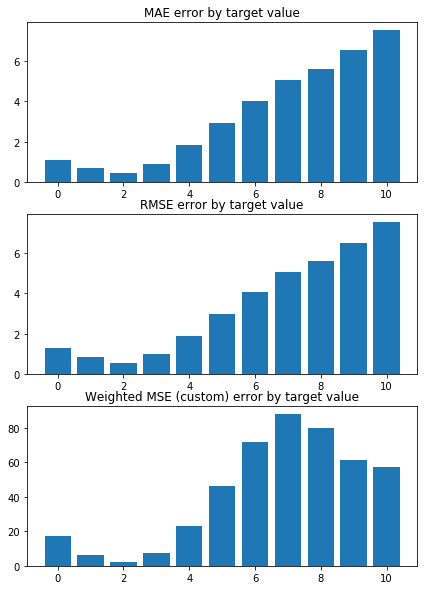

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1487508717068227 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0261687385116758 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


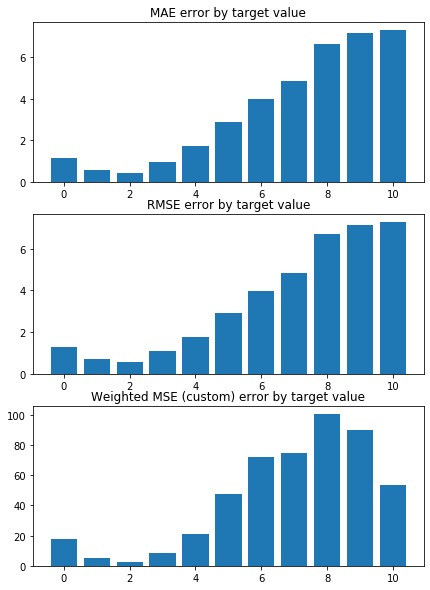

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9500278664083303 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0464561293785304 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


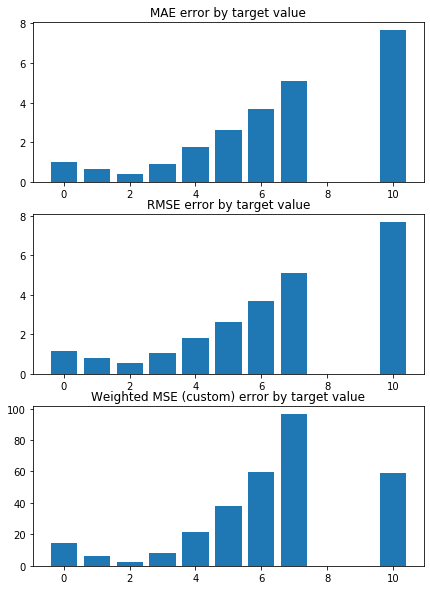

Weighted Mean squared error on Train: 1.04 
 MSE mean train: 2.222527498822653 

Mean squared error on Test: 1.04 
 MSE mean test:  2.227074987703675 

Root of MSE on Test: 1.02 
 1.492338764390872 

Variance score on Test: 0.06 
 r2_test: 0.24863487729102599 

wMSE_train 1.04
wMSE_test 1.04
MSE_train 2.22
MSE_test 2.23
MAE_train 1.01
MAE_test 0.97
r2_test 0.25
    H3K4me1  H3K36me3     Chriz      CTCF       GAF   H3K4me2  H3K36me1  \
0 -0.339689 -0.194040 -0.106285 -0.084132 -0.024967 -0.016885      -0.0   
1 -0.332580 -0.189499 -0.063467 -0.083322 -0.023082 -0.074374      -0.0   
2 -0.333473 -0.198546 -0.073950 -0.072052 -0.051764 -0.053186      -0.0   
3 -0.352891 -0.205052 -0.076430 -0.104015 -0.013177 -0.030122      -0.0   
4 -0.351794 -0.195974 -0.104568 -0.088609 -0.021992 -0.011172      -0.0   
5 -0.344789 -0.194875 -0.108205 -0.081920 -0.012296 -0.024450      -0.0   
6 -0.342733 -0.195608 -0.075043 -0.089923 -0.017596 -0.053528      -0.0   
7 -0.349698 -0.197779 -0.098954 -0.0

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."


In [84]:
# L1 - best 
model = linear_model.Lasso(alpha=0.2)


model_name = 'LR+L1_alf=0.2_spt=10'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

# wmse_test.append(np.mean(weighted_mse_test_all))
# wmse_train.append(np.mean(weighted_mse_train_all))
results_pd

In [85]:
coefs_argsort, coefs

(array([[ 6, 15,  0,  1,  5,  7, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  1,  7,  0,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  7,  5, 17,  3, 16,  9, 10, 11, 12, 13, 14,  2,
          4,  8],
        [ 6, 15,  1,  0,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  5,  7, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  7,  5, 17,  3, 16,  9, 10, 11, 12, 13, 14,  2,
          4,  8],
        [ 6, 15,  1,  0,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17],
        [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
         10, 17]]),
 array([[-0.10628532, -0.08413232,  0.        , -0.        , -0.        ,
         -0.02

In [86]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K4me1', 'H3K36me3', 'Chriz', 'CTCF', 'GAF', 'H3K4me2', 'H3K36me1',
       'H3K27me3', 'H3K27me1', 'H3K27ac', 'H3K4me3', 'H3K9me2', 'H4K16ac',
       'CP190', 'BEAF-32', 'Su(Hw)', 'H3K9me3', 'RNA-polymerase-II'],
      dtype='object')

In [87]:
coefs_argsort[:]

array([[ 6, 15,  0,  1,  5,  7, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  1,  7,  0,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  7,  5, 17,  3, 16,  9, 10, 11, 12, 13, 14,  2,
         4,  8],
       [ 6, 15,  1,  0,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  5,  7, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  7,  5, 17,  3, 16,  9, 10, 11, 12, 13, 14,  2,
         4,  8],
       [ 6, 15,  1,  0,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17],
       [ 6, 15,  0,  1,  7,  5, 14, 13, 12, 11,  8,  9, 16,  4,  3,  2,
        10, 17]])

In [88]:

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.0390634219892068 1.0414118615316628


In [89]:
su_drsc.columns[2:][coefs_argsort[0]], coefs

(Index(['H3K4me1', 'H3K36me3', 'Chriz', 'CTCF', 'GAF', 'H3K4me2', 'H3K36me1',
        'H3K27me3', 'H3K27me1', 'H3K27ac', 'H3K4me3', 'H3K9me2', 'H4K16ac',
        'CP190', 'BEAF-32', 'Su(Hw)', 'H3K9me3', 'RNA-polymerase-II'],
       dtype='object'),
 array([[-0.10628532, -0.08413232,  0.        , -0.        , -0.        ,
         -0.0249665 , -0.33968894, -0.01688494, -0.        , -0.        ,
         -0.        ,  0.        , -0.        , -0.        , -0.        ,
         -0.19404013, -0.        , -0.        ],
        [-0.06346659, -0.08332162,  0.        , -0.        , -0.        ,
         -0.02308209, -0.33257989, -0.07437416, -0.        , -0.        ,
         -0.        ,  0.        , -0.        , -0.        , -0.        ,
         -0.18949904, -0.        , -0.        ],
        [-0.07394955, -0.07205217,  0.        , -0.        , -0.        ,
         -0.05176406, -0.33347332, -0.05318641, -0.        , -0.        ,
         -0.        ,  0.        , -0.        , -0.        , 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 1

Получили наиболее влияющие признаки

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Linear Regression with L2 regularization -  Ridge

In [90]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)


In [91]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l2 = linear_model.Ridge()

# Train the model using the training sets
lin_reg_l2.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l2.predict(X_test)

Коэффициенты

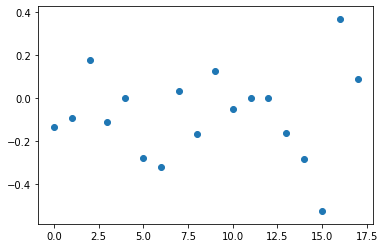

In [92]:
plt.scatter( np.arange(len(lin_reg_l2.coef_)) , lin_reg_l2.coef_)
plt.show()

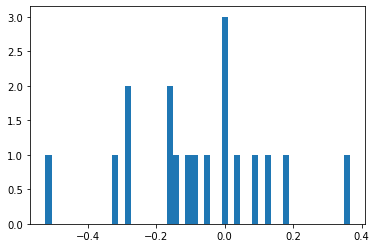

In [93]:
plt.hist(lin_reg_l2.coef_, bins=50)
plt.show()

In [94]:
# Make predictions using the testing set
y_pred_train = lin_reg_l2.predict(X_train)
# The mean squared error
print("Mean squared error on Train: %.2f"
      % mean_squared_error(y_train, y_pred_train))

# The mean squared error
print("Mean squared error on Test: %.2f"
      % mean_squared_error(y_test, y_pred))


# The mean squared error
print("Root of Mean squared error: %.2f"
      % np.sqrt(mean_squared_error(y_test, y_pred)))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y_test, y_pred))

Mean squared error on Train: 2.06
Mean squared error on Test: 2.13
Root of Mean squared error: 1.46
Variance score: 0.29


(array([  1.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,   2.,   2.,   2.,
         11.,   6.,  19.,  22.,  28.,  49.,  57.,  79.,  92., 100., 125.,
        164., 190., 189., 226., 228., 238., 250., 237., 215., 233., 222.,
        208., 166., 141., 100., 108.,  76.,  50.,  38.,  40.,  25.,  23.,
         13.,   8.,   6.,   5.,   3.,   1.]),
 array([-4.44687899, -4.29219134, -4.13750368, -3.98281603, -3.82812837,
        -3.67344072, -3.51875306, -3.36406541, -3.20937775, -3.0546901 ,
        -2.90000244, -2.74531479, -2.59062713, -2.43593948, -2.28125182,
        -2.12656417, -1.97187651, -1.81718886, -1.6625012 , -1.50781355,
        -1.35312589, -1.19843824, -1.04375059, -0.88906293, -0.73437528,
        -0.57968762, -0.42499997, -0.27031231, -0.11562466,  0.039063  ,
         0.19375065,  0.34843831,  0.50312596,  0.65781362,  0.81250127,
         0.96718893,  1.12187658,  1.27656424,  1.43125189,  1.58593955,
         1.7406272 ,  1.89531486,  2.05000251,  2.20469017,  2.35937782,
 

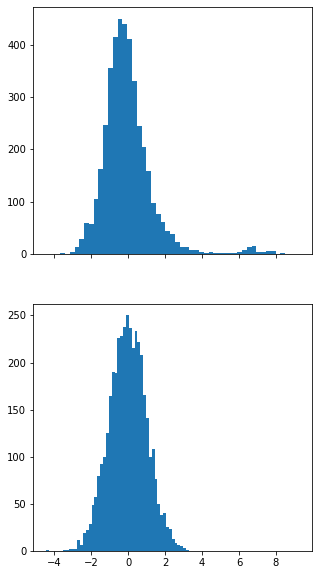

In [95]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L2


## Fined parametrs for L2

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9207946942169918 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0052947139709654 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


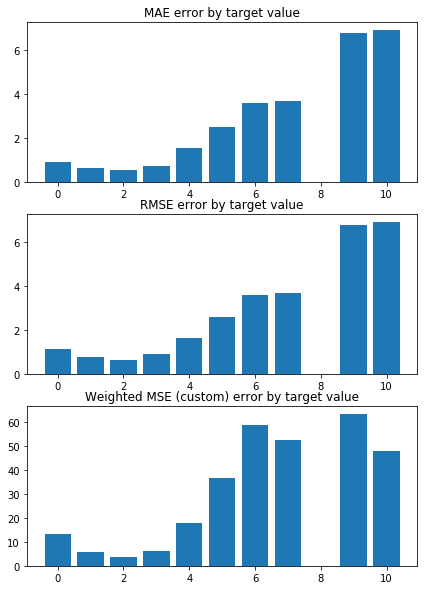

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9636326385605604 


 TRAIN PREDICTION Error
weighted_mse_train: 1.00997874157273 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


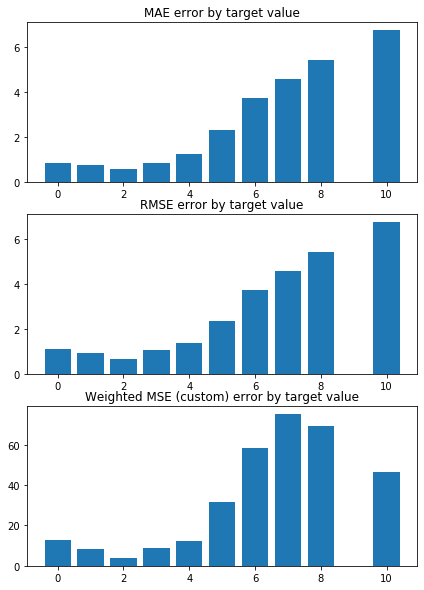

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9899108643765012 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0028070877586595 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


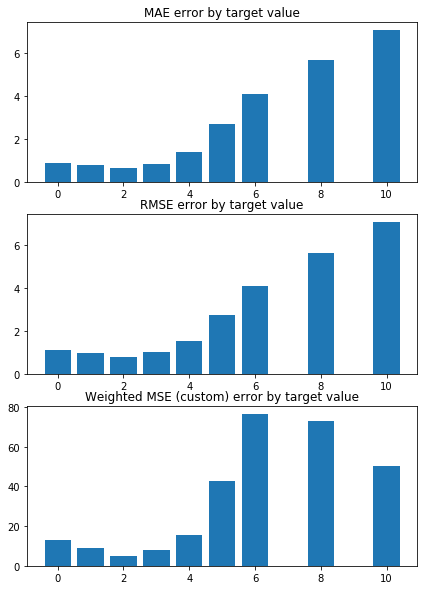

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.059873477966328 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9903170991439469 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


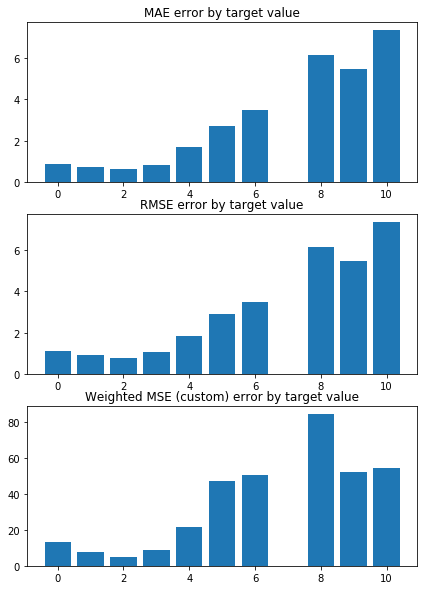

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9824384756272402 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002432284836625 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


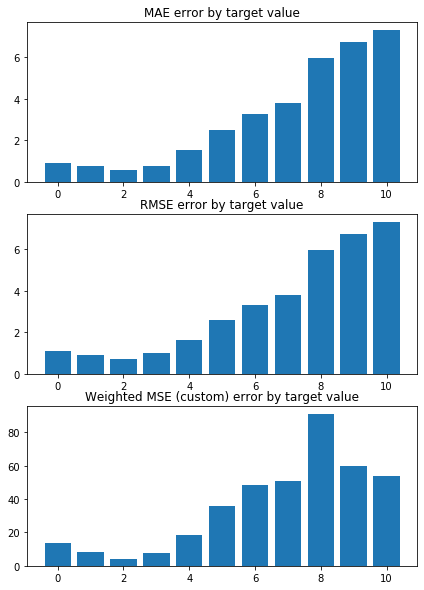

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0740254359295867 


 TRAIN PREDICTION Error
weighted_mse_train: 0.992269689759054 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


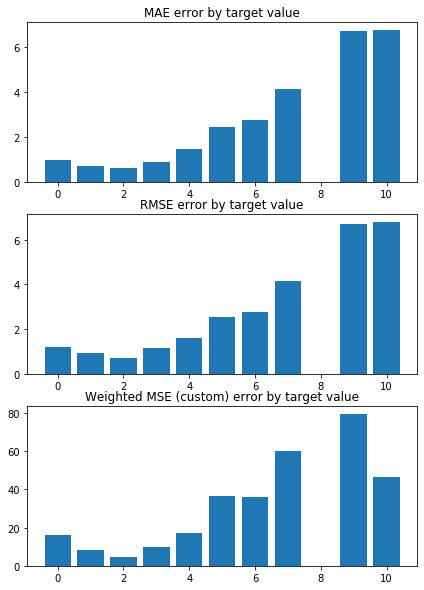

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9798771329493693 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0031022329965757 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


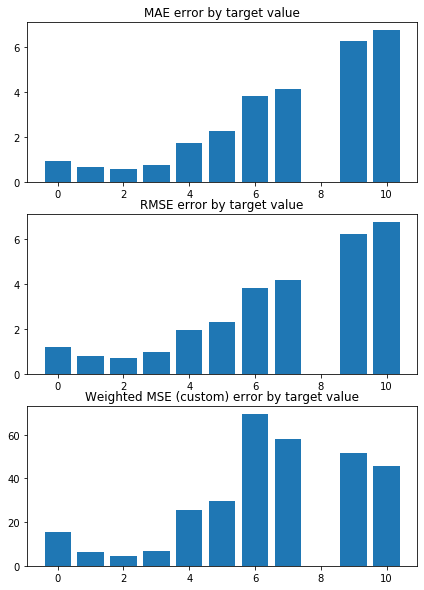

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0658030282481314 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9941128509507948 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


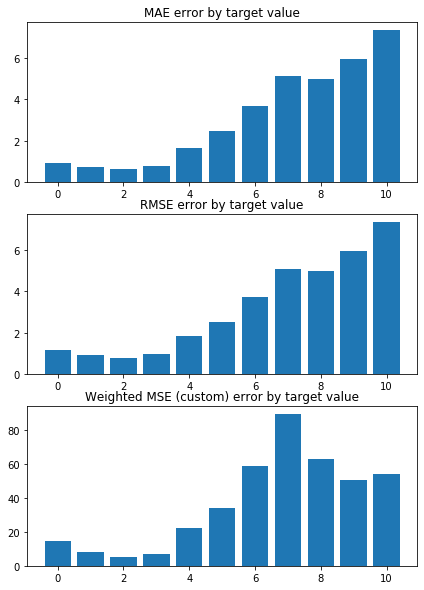

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0846201555666768 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875771971304796 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


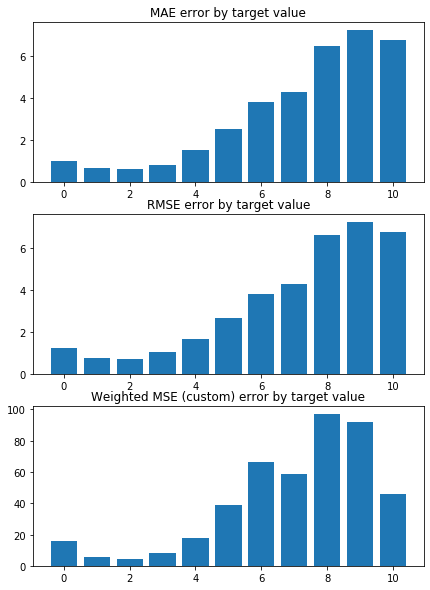

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338448457395159 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081880474286715 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


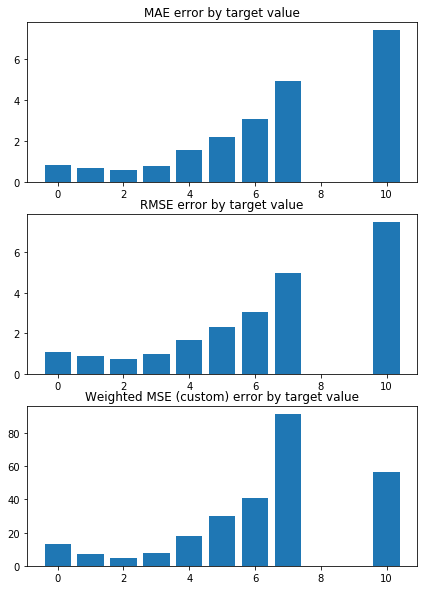

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076784477052019 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900530792800955 

Root of MSE on Test: 1.00 
 1.4457015872164267 

Variance score on Test: 0.06 
 r2_test: 0.294871896774198 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.577725  0.383409 -0.359466 -0.290118 -0.286989  0.168162 -0.164325   
1 -0.616361  0.419153 -0.336181 -0.275444 -0.314071  0.151599 -0.146317   
2 -0.597374  0.407324 -0.344197 -0.311805 -0.323021  0.160319 -0.197146   
3 -0.594079  0.389974 -0.376728 -0.274175 -0.282688  0.161526 -0.129869   
4 -0.612782  0.394975 -0.323170 -0.292868 -0.313231  0.168017 -0.127444   
5 -0.580190  0.362782 -0.338988 -0.290572 -0.292281  0.184178 -0.127902   
6 -0.589758  0.401186 -0.357072 -0.285514 -0.280753  0.178384 -0.190846   
7 -0.567009  0.402720 -0.371730 -0.29

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


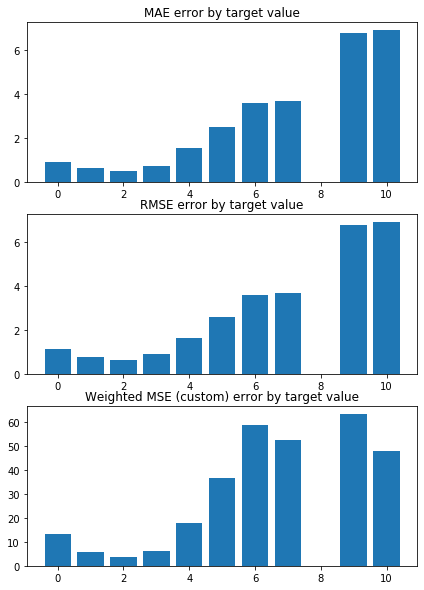

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9635023624554443 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0098994799672836 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


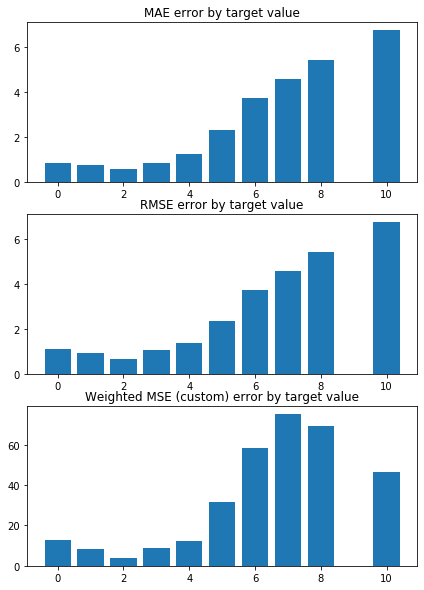

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9898029799162479 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0027226501885862 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


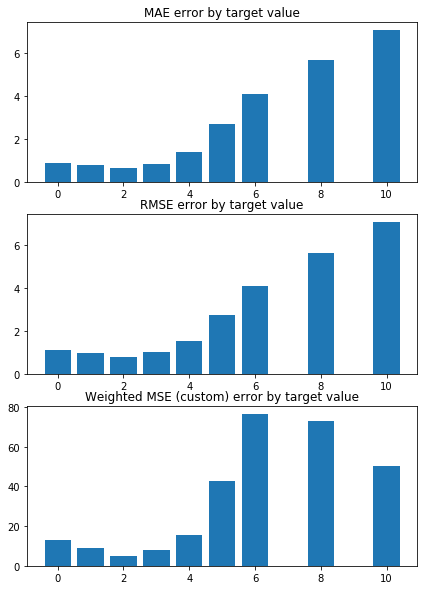

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0597648519247664 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9902418101783407 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


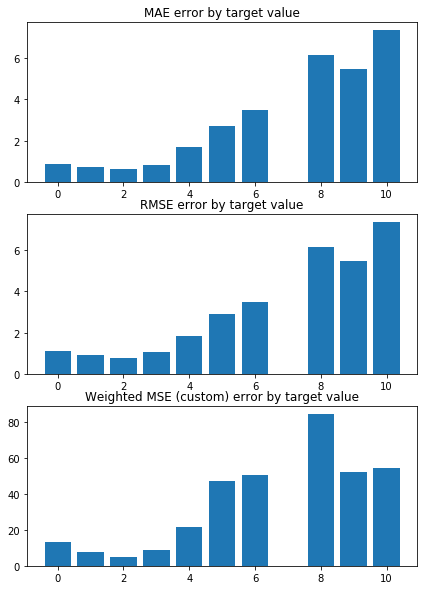

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9823351022418634 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0023526087061543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


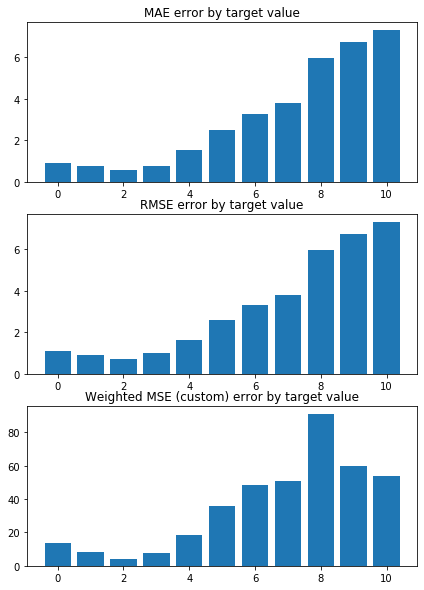

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0739839447653248 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9922025839962363 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


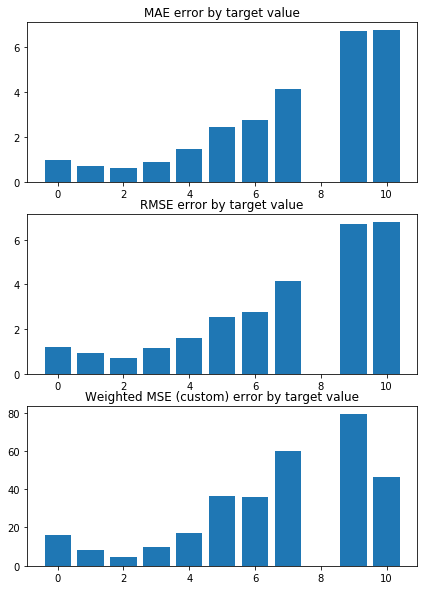

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9797957156960595 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0030241493168248 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


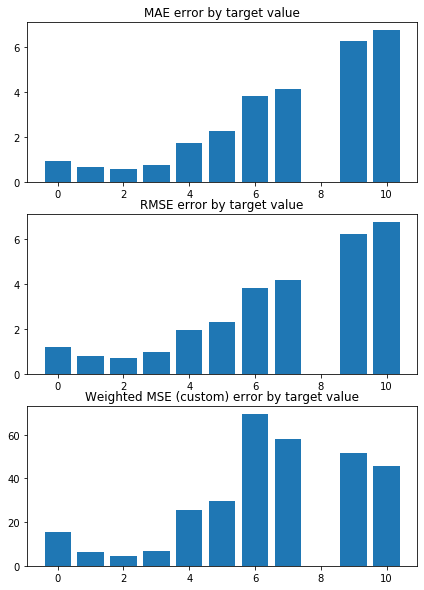

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0657241719841308 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9940337458847517 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


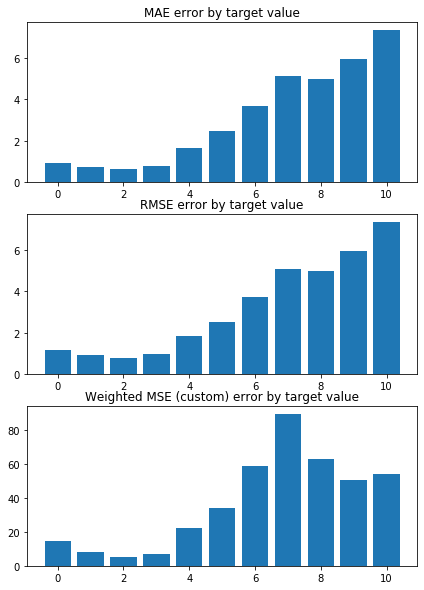

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0845806346756235 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9874989168329068 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


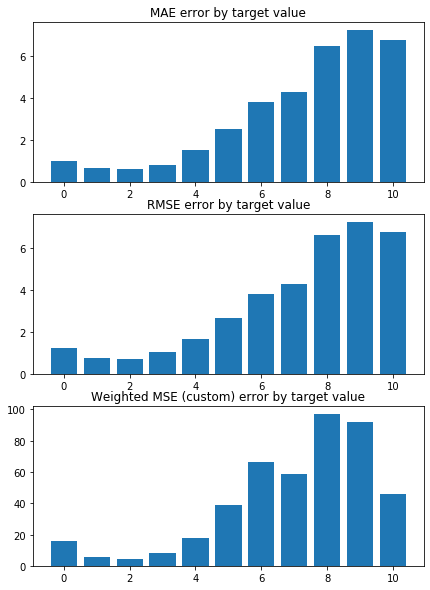

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9337157602161388 


 TRAIN PREDICTION Error
weighted_mse_train: 1.00811294081465 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


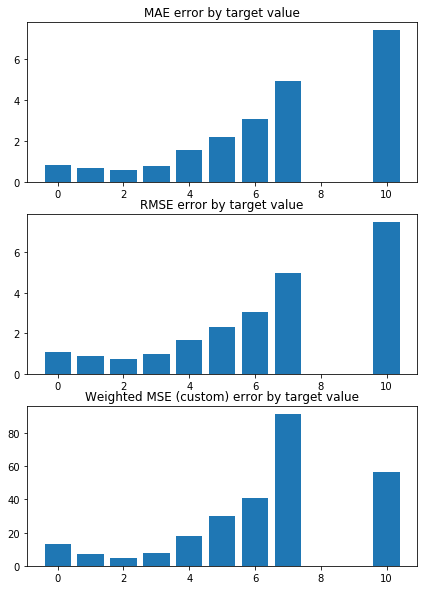

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.0767848332019154 

Mean squared error on Test: 1.01 
 MSE mean test:  2.090036266561146 

Root of MSE on Test: 1.00 
 1.4456957724781332 

Variance score on Test: 0.06 
 r2_test: 0.2948786600962353 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.576967  0.382712 -0.358563 -0.289959 -0.286374  0.168043 -0.162453   
1 -0.615448  0.418350 -0.335545 -0.275280 -0.313449  0.151488 -0.145106   
2 -0.596598  0.406582 -0.343216 -0.311621 -0.322329  0.160175 -0.194855   
3 -0.593247  0.389220 -0.375857 -0.274021 -0.282094  0.161419 -0.128311   
4 -0.611873  0.394230 -0.322488 -0.292697 -0.312607  0.167898 -0.126140   
5 -0.579404  0.362086 -0.338265 -0.290397 -0.291705  0.184048 -0.126541   
6 -0.588978  0.400461 -0.356130 -0.285336 -0.280111  0.178248 -0.188731   
7 -0.566310  0.402012 -0.370692 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


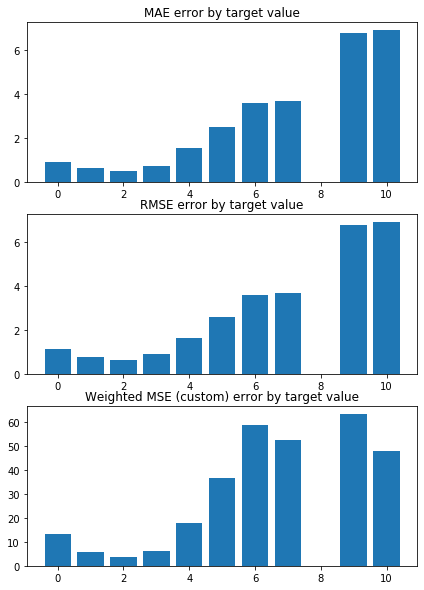

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9633726422307339 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0098211559642254 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


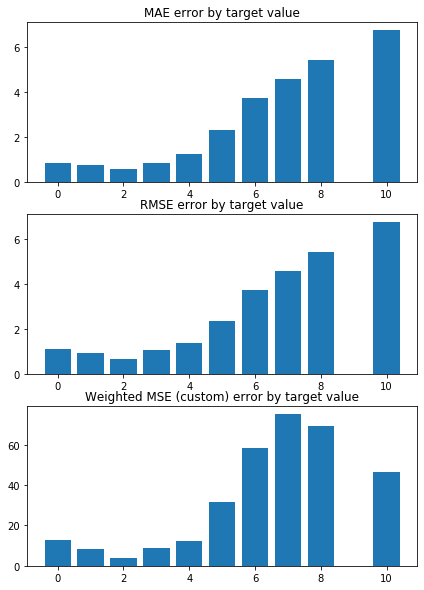

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9896971117861969 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0026394866049089 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


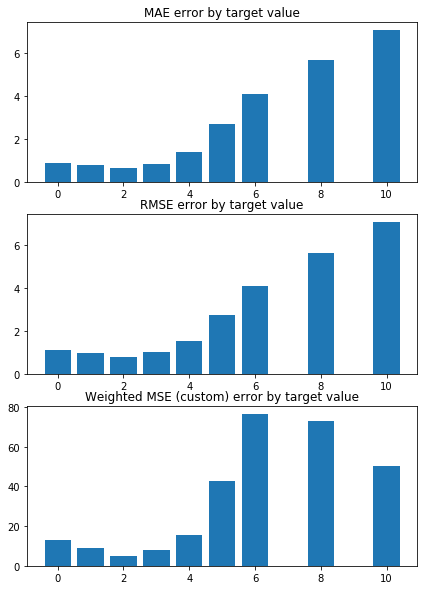

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0596571355364892 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9901675300422003 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


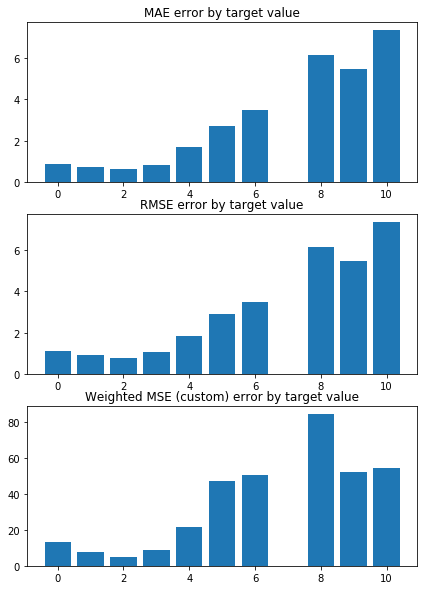

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9822324967345168 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0022738748744187 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


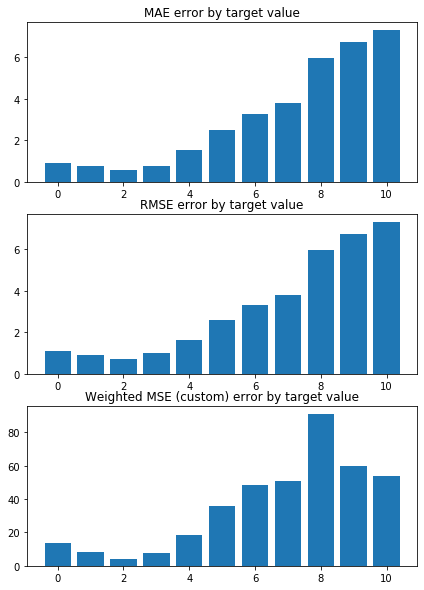

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0739429910837008 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9921362837318135 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


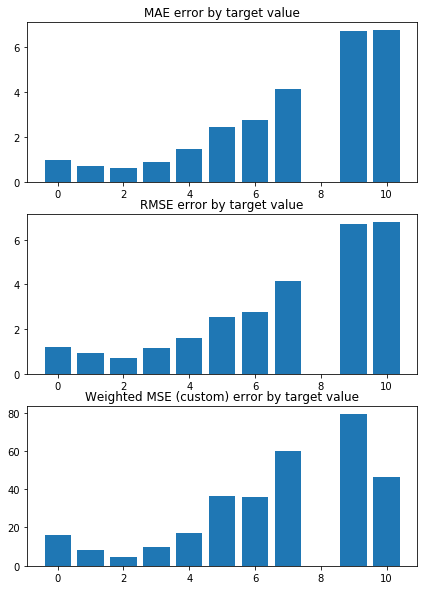

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9797161369011398 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0029471780744328 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


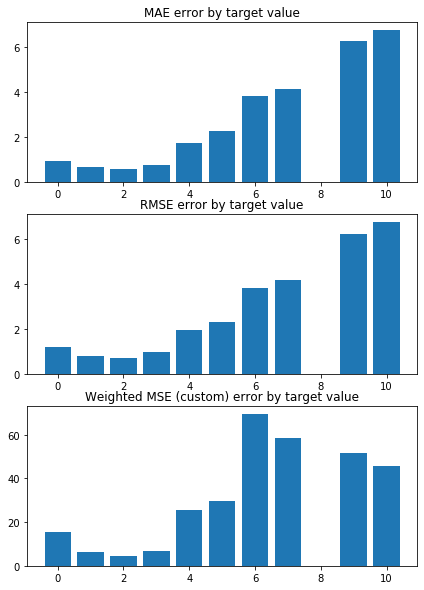

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0656471885973877 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9939558048419488 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


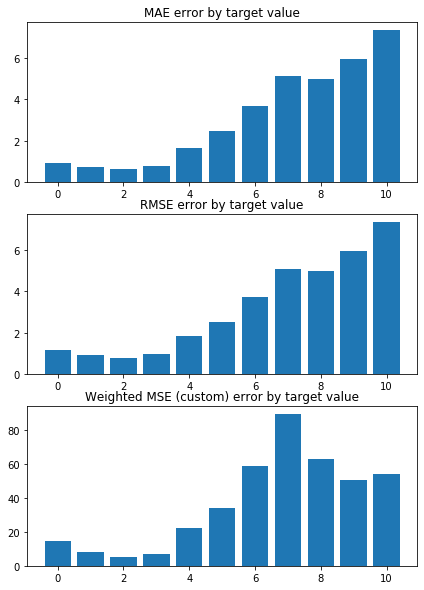

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0845421197961589 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9874217406148602 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


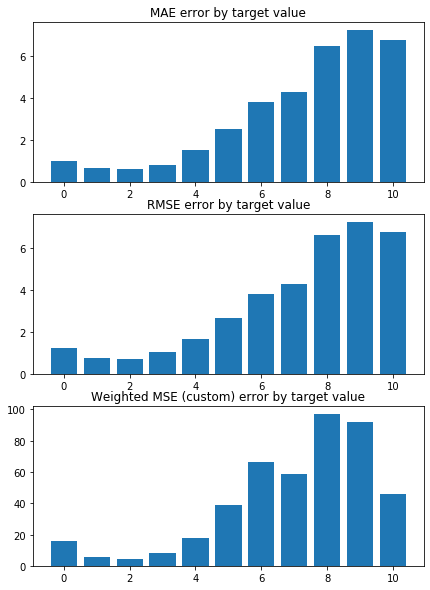

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9335883005225315 


 TRAIN PREDICTION Error
weighted_mse_train: 1.008038993459414 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


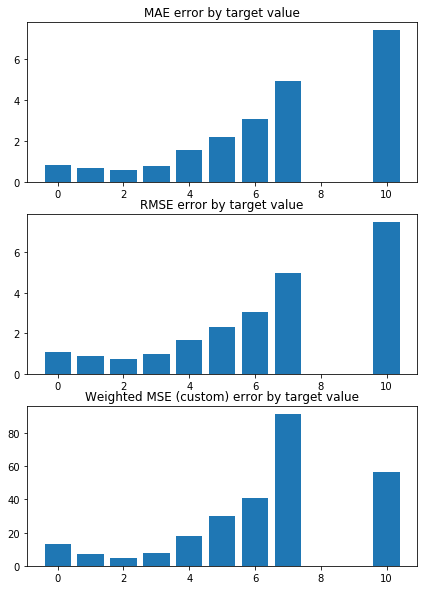

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.0767858848072773 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900203558683867 

Root of MSE on Test: 1.00 
 1.4456902696872476 

Variance score on Test: 0.06 
 r2_test: 0.2948851088605094 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.576206  0.382014 -0.357681 -0.289800 -0.285765  0.167926 -0.160643   
1 -0.614537  0.417547 -0.334922 -0.275117 -0.312833  0.151378 -0.143933   
2 -0.595820  0.405840 -0.342260 -0.311438 -0.321644  0.160033 -0.192641   
3 -0.592415  0.388467 -0.375006 -0.273867 -0.281506  0.161313 -0.126807   
4 -0.610964  0.393485 -0.321821 -0.292527 -0.311988  0.167779 -0.124881   
5 -0.578617  0.361391 -0.337557 -0.290223 -0.291135  0.183920 -0.125226   
6 -0.588197  0.399736 -0.355210 -0.285158 -0.279477  0.178114 -0.186688   
7 -0.565609  0.401303 -0.369679 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


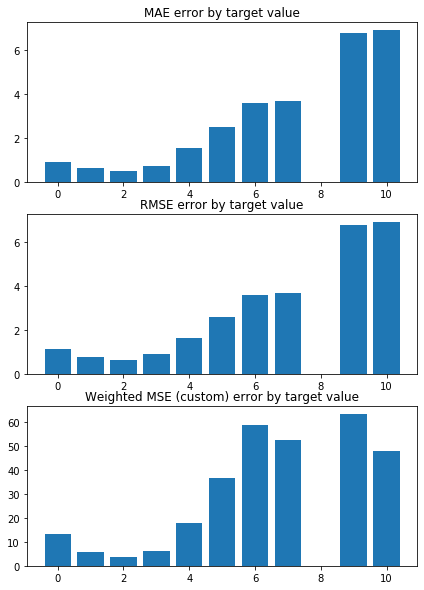

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9632434926873618 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0097437483824743 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


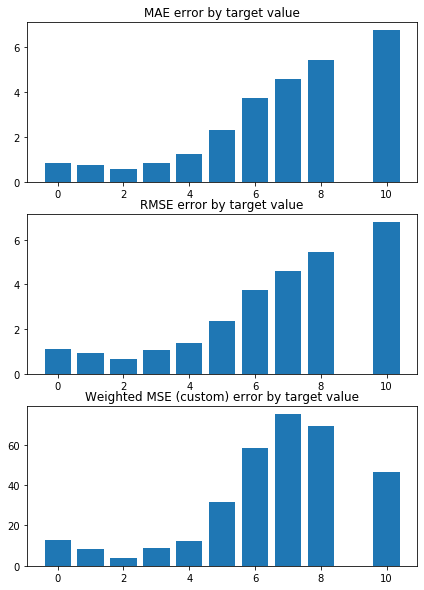

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9895931703575825 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0025575487574392 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


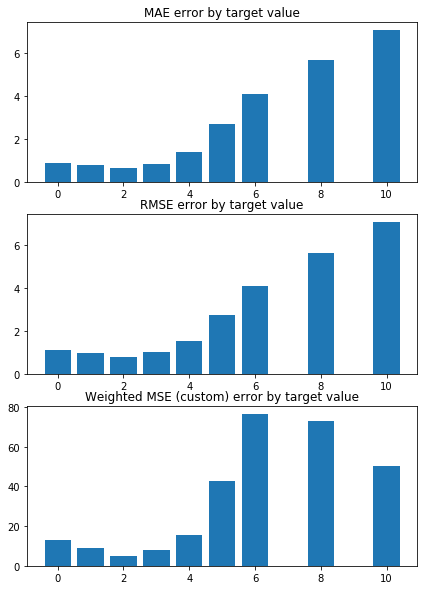

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0595503108757318 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9900942297340779 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


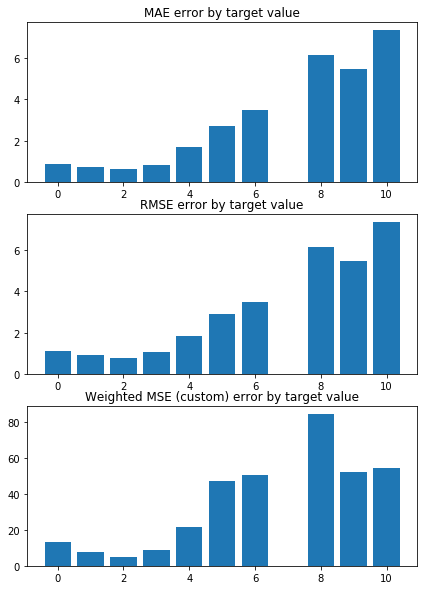

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9821306587644968 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0021960613638798 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


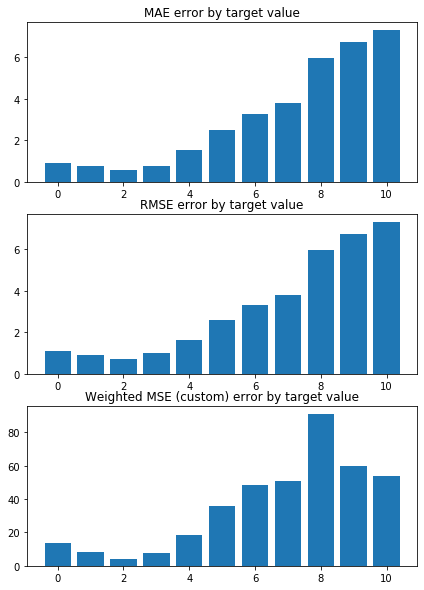

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0739025603800894 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9920707686175142 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


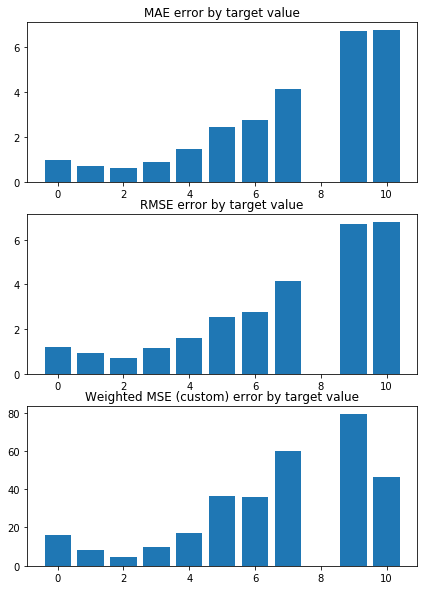

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9796383187776503 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0028712800024149 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


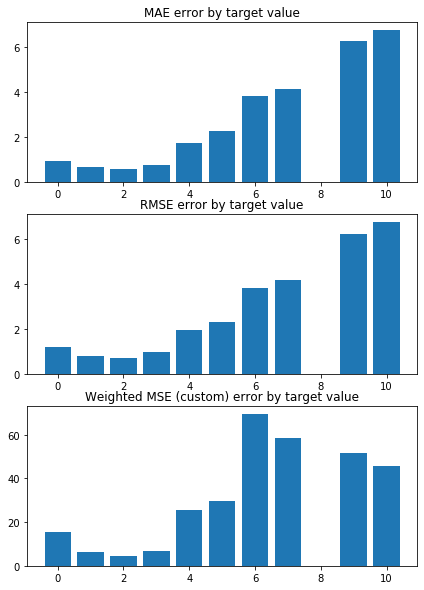

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0655719943164725 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9938789842753728 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


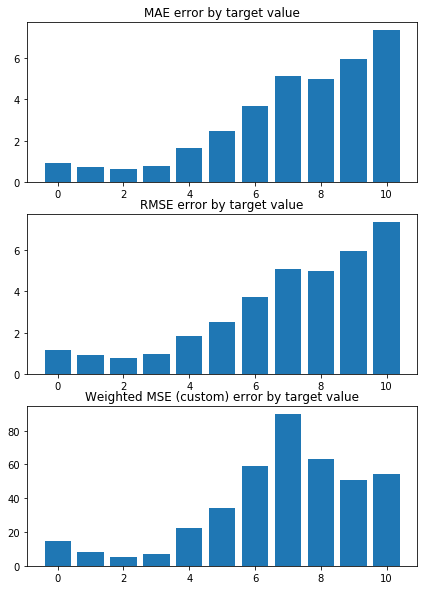

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.084504573673923 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9873456316420733 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


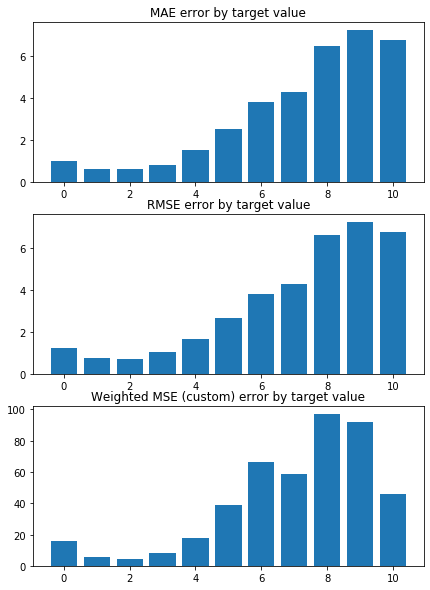

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9334624002767302 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0079661610311506 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


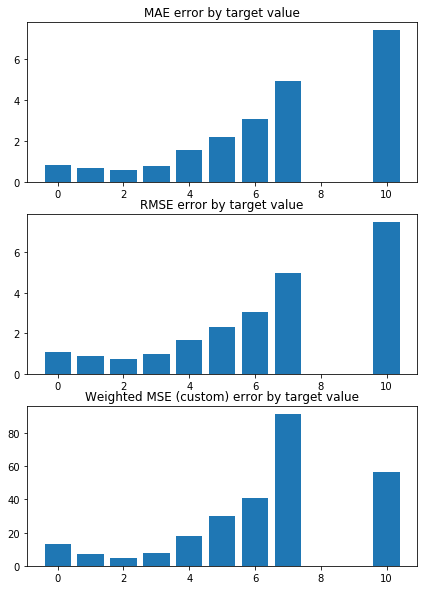

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.0767876080899286 

Mean squared error on Test: 1.01 
 MSE mean test:  2.090005315327787 

Root of MSE on Test: 1.00 
 1.4456850678234825 

Variance score on Test: 0.06 
 r2_test: 0.29489125410868167 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.575444  0.381315 -0.356818 -0.289642 -0.285162  0.167810 -0.158893   
1 -0.613626  0.416746 -0.334311 -0.274955 -0.312222  0.151268 -0.142799   
2 -0.595039  0.405096 -0.341328 -0.311255 -0.320968  0.159893 -0.190502   
3 -0.591582  0.387714 -0.374172 -0.273714 -0.280924  0.161208 -0.125355   
4 -0.610055  0.392740 -0.321167 -0.292358 -0.311375  0.167661 -0.123664   
5 -0.577830  0.360696 -0.336863 -0.290049 -0.290570  0.183792 -0.123954   
6 -0.587413  0.399010 -0.354312 -0.284981 -0.278850  0.177982 -0.184711   
7 -0.564904  0.400594 -0.368690 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


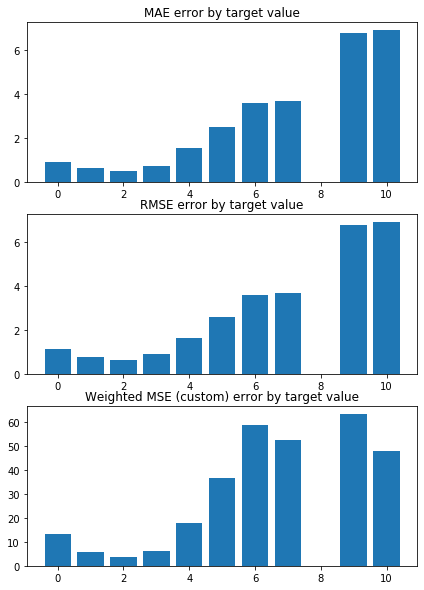

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9631149272877522 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0096672372438515 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


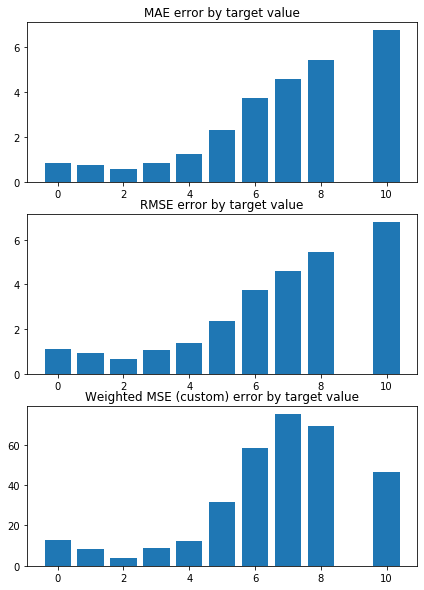

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9894910725275131 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002476792008216 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


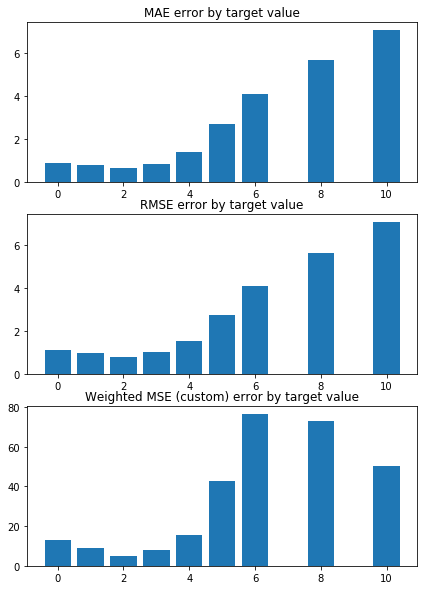

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0594443612138795 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9900218821829331 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


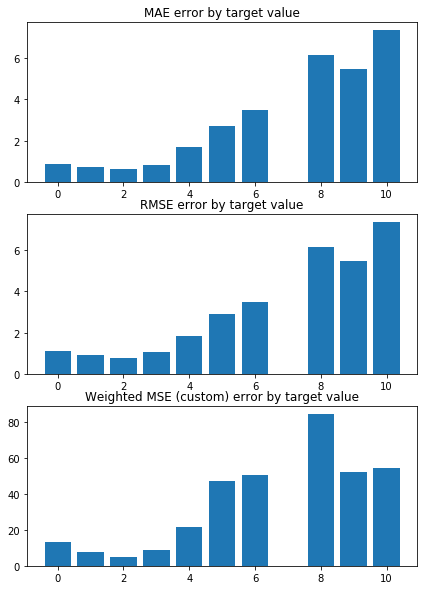

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9820295877131752 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0021191475036655 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


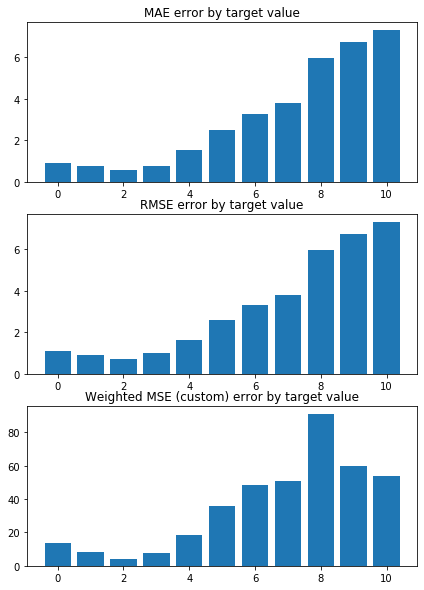

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073862639104427 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9920060195876249 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


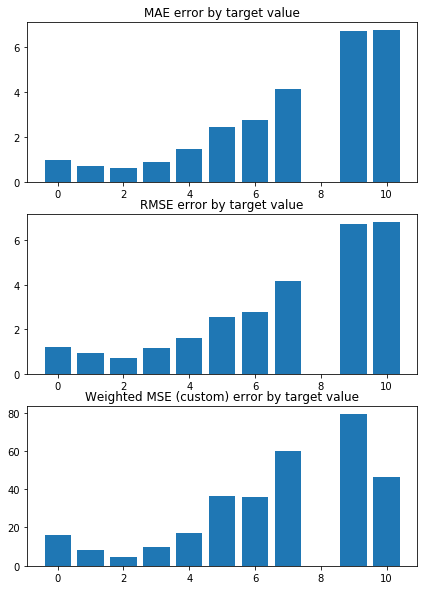

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9795621889721258 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0027964187086271 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


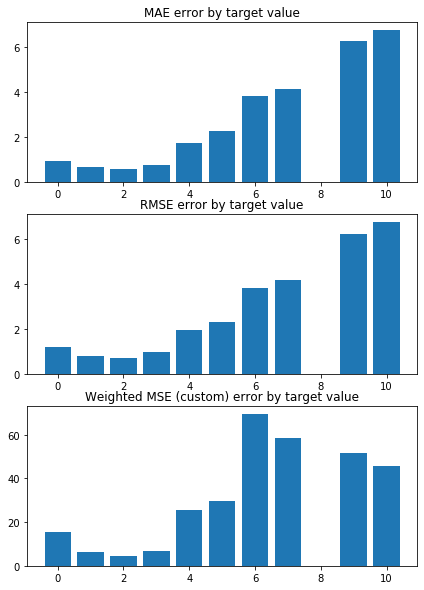

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0654985112500568 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9938032438918808 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


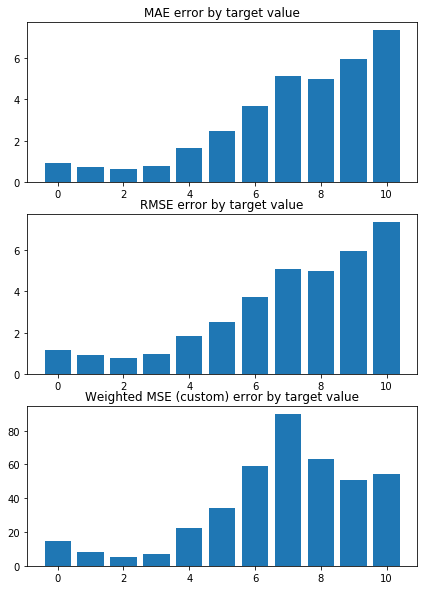

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0844679616936828 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9872705556766422 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


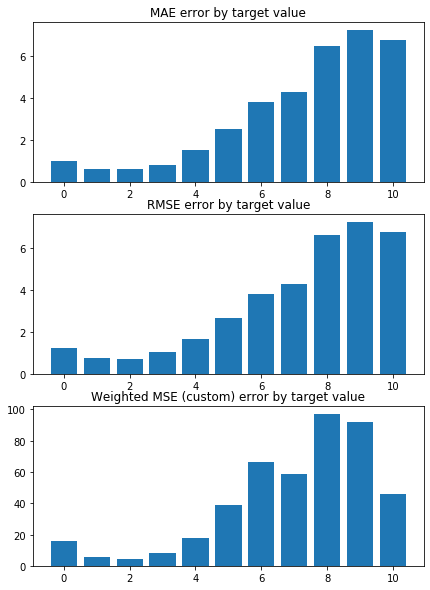

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9333379979026134 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0078944025118461 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


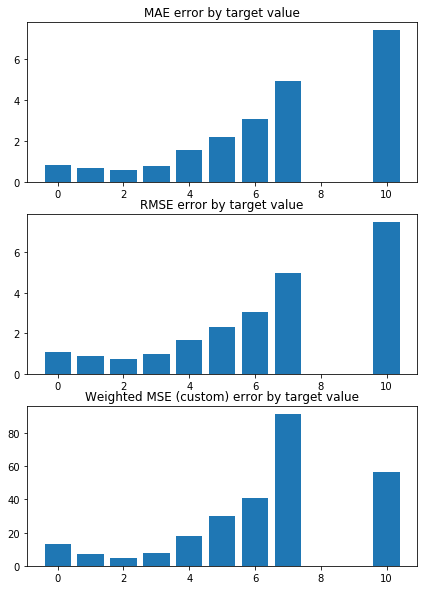

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.07678998108871 

Mean squared error on Test: 1.01 
 MSE mean test:  2.089991115396412 

Root of MSE on Test: 1.00 
 1.4456801566724267 

Variance score on Test: 0.06 
 r2_test: 0.29489710607759156 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.574680  0.380616 -0.355974 -0.289484 -0.284566  0.167695 -0.157200   
1 -0.612717  0.415945 -0.333713 -0.274793 -0.311616  0.151160 -0.141699   
2 -0.594256  0.404353 -0.340420 -0.311073 -0.320299  0.159754 -0.188433   
3 -0.590748  0.386962 -0.373356 -0.273562 -0.280349  0.161104 -0.123952   
4 -0.609147  0.391997 -0.320527 -0.292189 -0.310767  0.167544 -0.122487   
5 -0.577043  0.360002 -0.336184 -0.289876 -0.290010  0.183665 -0.122723   
6 -0.586627  0.398283 -0.353435 -0.284804 -0.278231  0.177850 -0.182799   
7 -0.564197  0.399883 -0.367724 -0.29

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


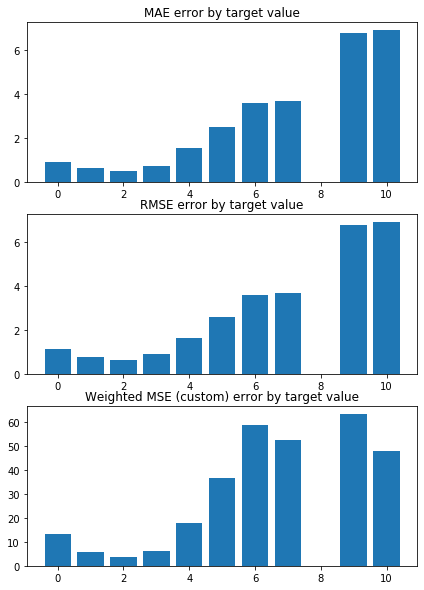

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.962986958257197 


 TRAIN PREDICTION Error
weighted_mse_train: 1.009591603665889 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


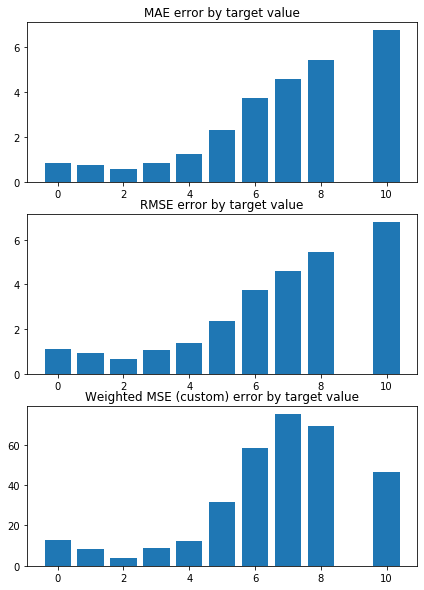

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9893907411167359 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0023971749791967 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


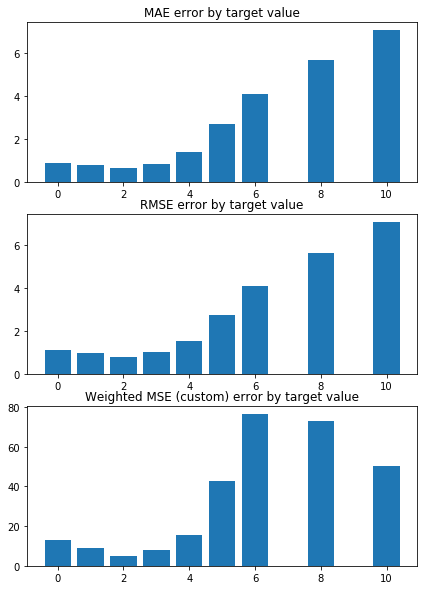

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0593392708930032 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9899504620653397 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


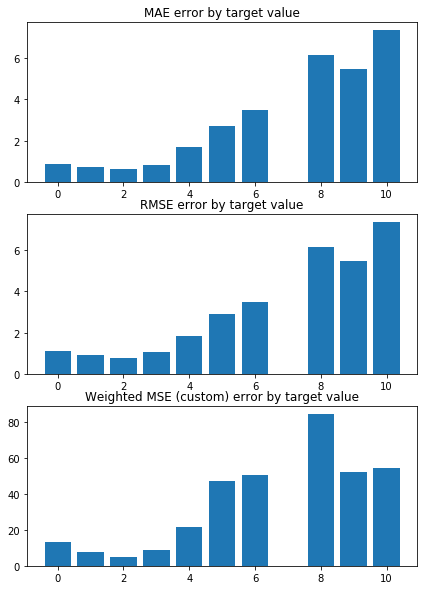

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9819292826931338 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002043113808784 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


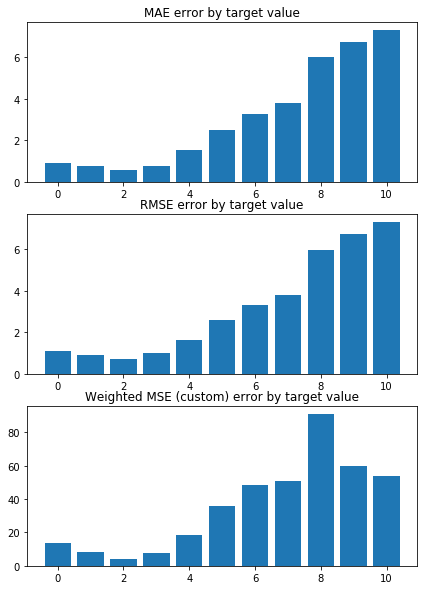

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0738232145689455 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9919420187394409 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


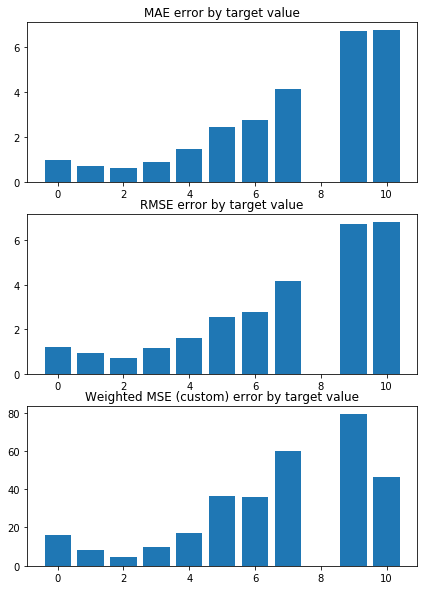

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9794876800773842 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0027225603972632 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


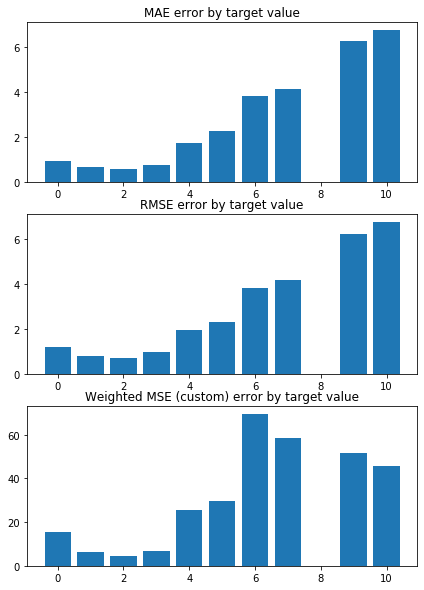

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0654266668643613 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9937285463364773 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


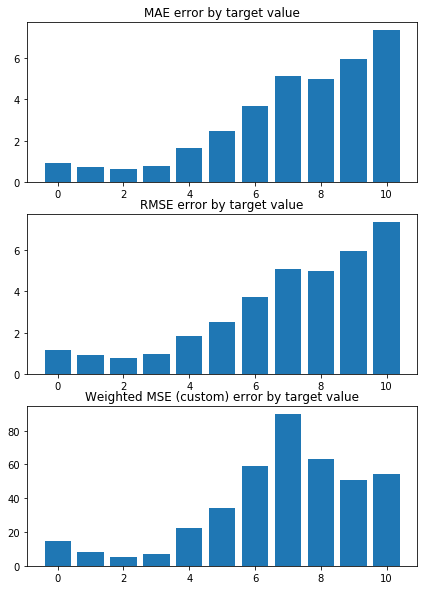

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0844322516307232 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9871964808301918 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


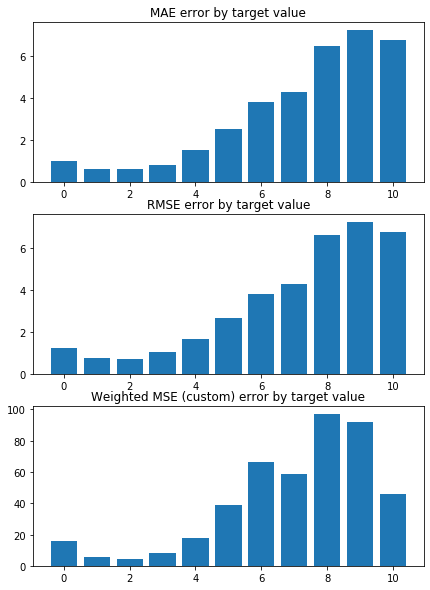

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9332150361870284 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0078236798763802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


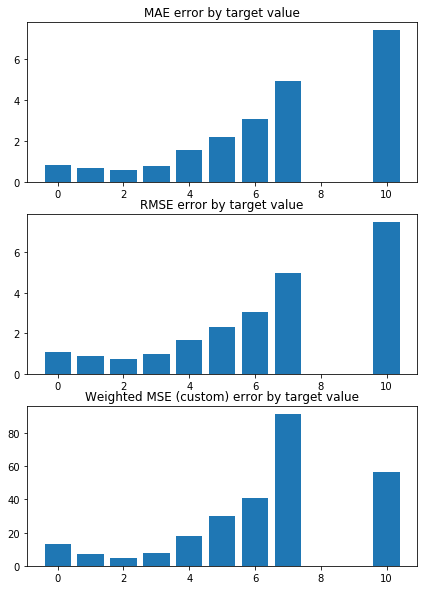

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.0767929834712247 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0899777286324053 

Root of MSE on Test: 1.00 
 1.445675526746028 

Variance score on Test: 0.06 
 r2_test: 0.2949026742784976 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.573915  0.379917 -0.355148 -0.289327 -0.283977  0.167581 -0.155560   
1 -0.611809  0.415146 -0.333126 -0.274631 -0.311015  0.151052 -0.140634   
2 -0.593472  0.403610 -0.339534 -0.310892 -0.319638  0.159616 -0.186430   
3 -0.589915  0.386211 -0.372555 -0.273411 -0.279779  0.161002 -0.122596   
4 -0.608240  0.391254 -0.319900 -0.292021 -0.310164  0.167428 -0.121349   
5 -0.576257  0.359309 -0.335517 -0.289703 -0.289455  0.183539 -0.121531   
6 -0.585840  0.397557 -0.352577 -0.284628 -0.277618  0.177720 -0.180948   
7 -0.563488  0.399171 -0.366780 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


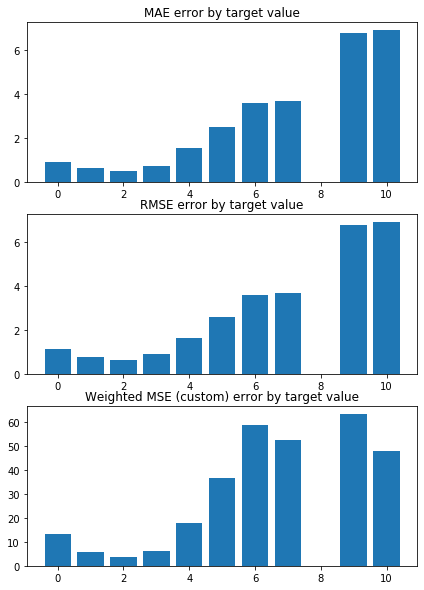

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9628595966768017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0095168297662571 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


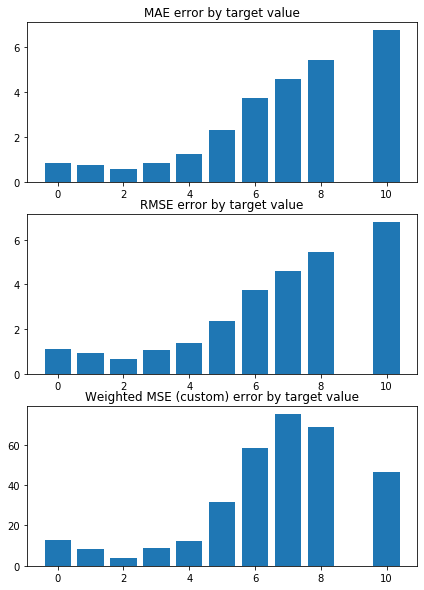

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9892921043325241 


 TRAIN PREDICTION Error
weighted_mse_train: 1.002318659239837 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


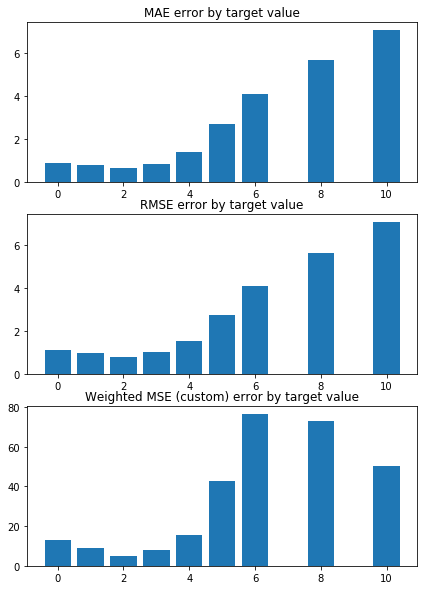

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0592350252148155 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9898799456431715 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


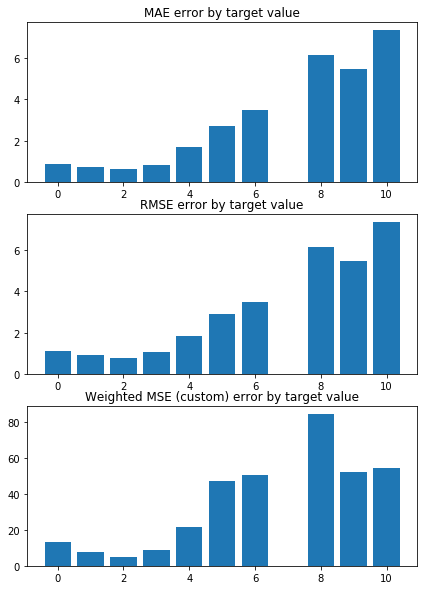

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.981829742558394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0019679418728122 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


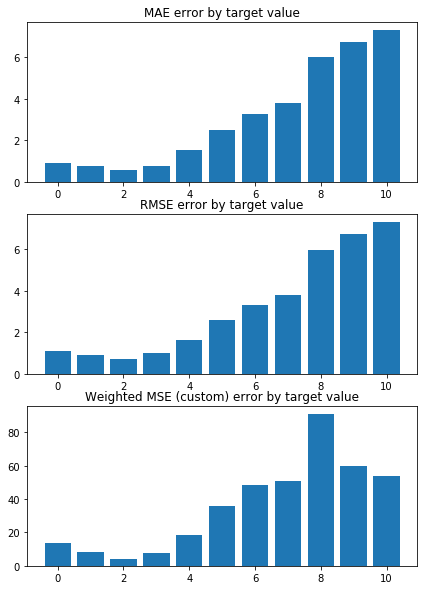

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073784274866407 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9918787492269584 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


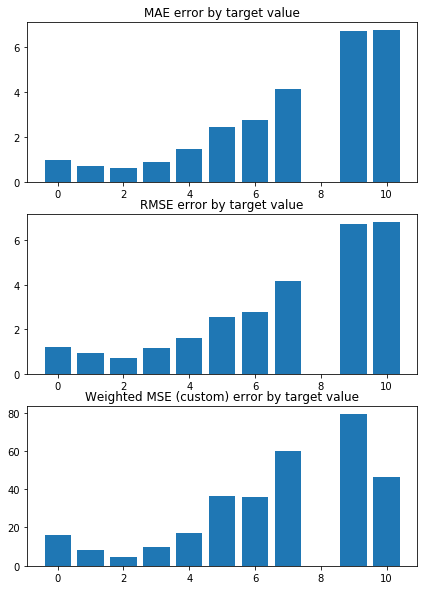

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9794147291967742 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0026496736217108 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


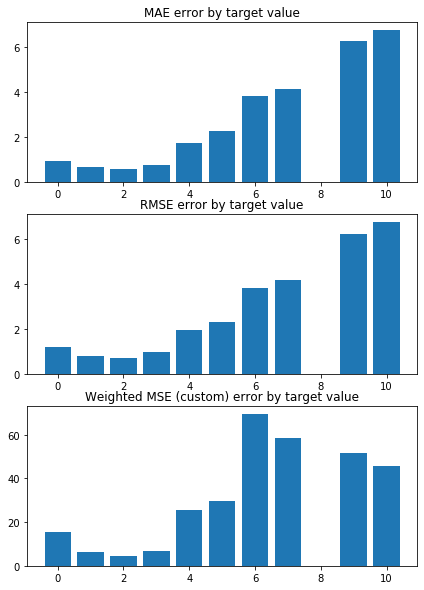

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0653563935152048 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9936548569120158 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


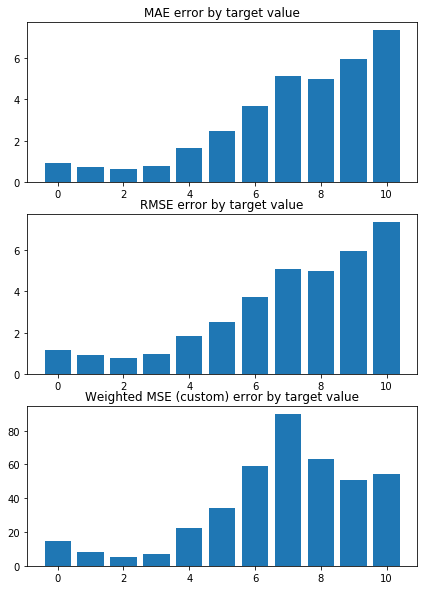

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.084397413429657 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9871233773444913 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


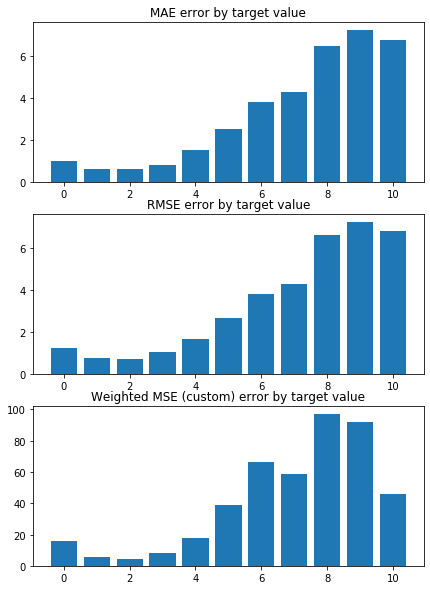

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9330934618846445 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0077539578076347 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


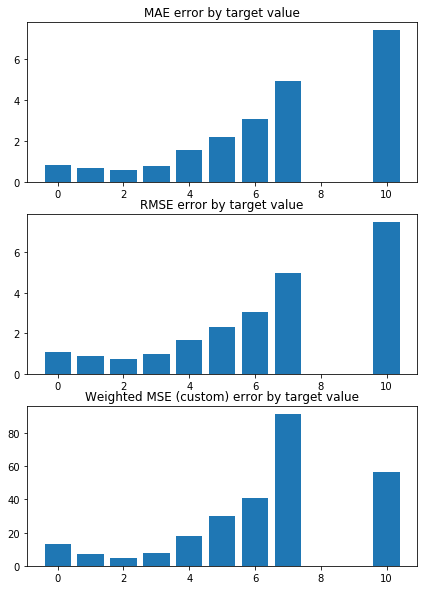

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076796596367875 

Mean squared error on Test: 1.00 
 MSE mean test:  2.0899651294913144 

Root of MSE on Test: 1.00 
 1.445671169212181 

Variance score on Test: 0.06 
 r2_test: 0.29490796756725823 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K9me2  \
0 -0.573150  0.379218 -0.354339 -0.289170 -0.283393  0.167468  0.154403   
1 -0.610902  0.414348 -0.332549 -0.274470 -0.310419  0.150945  0.180015   
2 -0.592687  0.402867 -0.338668 -0.310711 -0.318983  0.159480  0.172441   
3 -0.589082  0.385461 -0.371770 -0.273260 -0.279214  0.160900  0.195692   
4 -0.607333  0.390512 -0.319284 -0.291853 -0.309566  0.167313  0.181836   
5 -0.575470  0.358616 -0.334864 -0.289531 -0.288905  0.183415  0.142889   
6 -0.585052  0.396831 -0.351739 -0.284453 -0.277012  0.177591  0.158508   
7 -0.562777  0.398460 -0.365856 -0.29

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


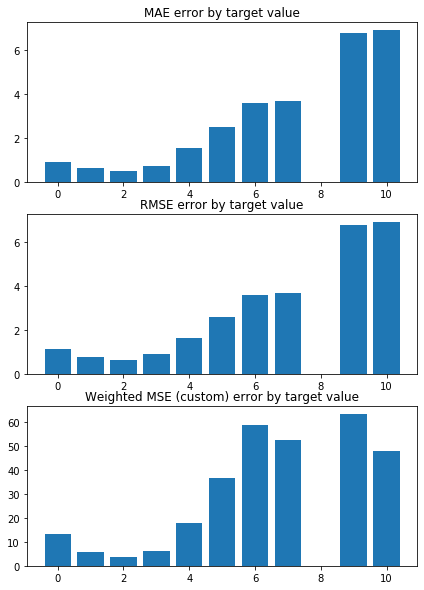

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9627328525687789 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0094428985773805 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


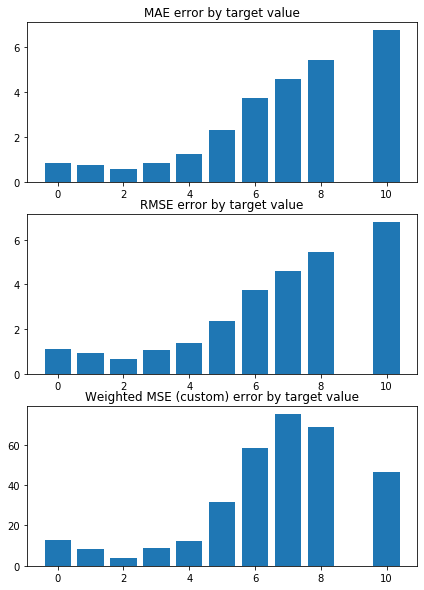

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9891950952886831 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0022412090294959 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


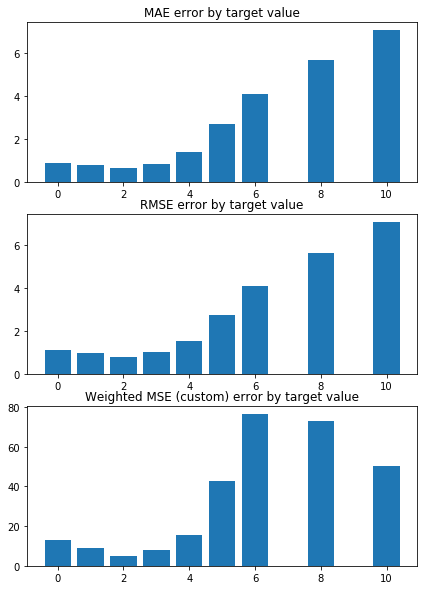

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0591316103429786 


 TRAIN PREDICTION Error
weighted_mse_train: 0.989810310619179 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


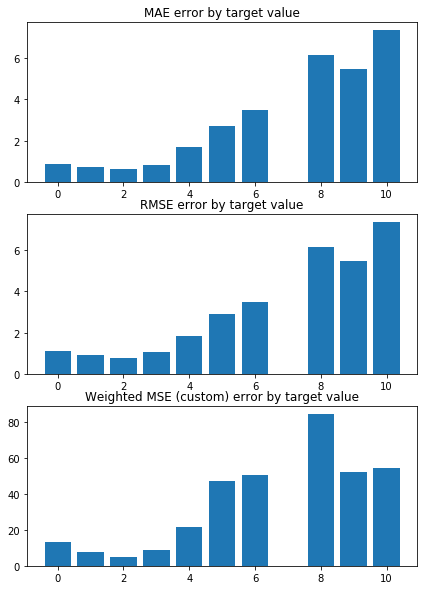

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9817309659153942 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0018936142723602 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


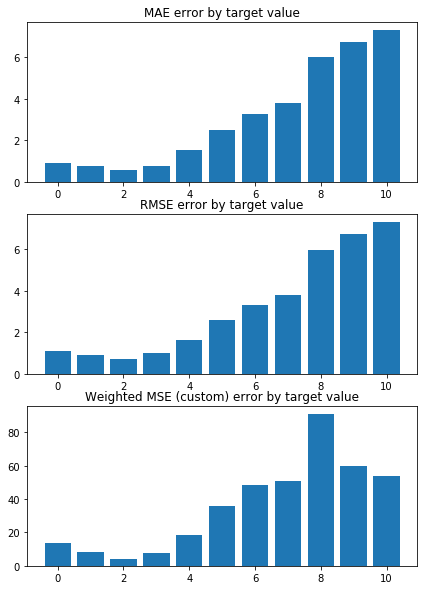

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073745808797507 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9918161951661708 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


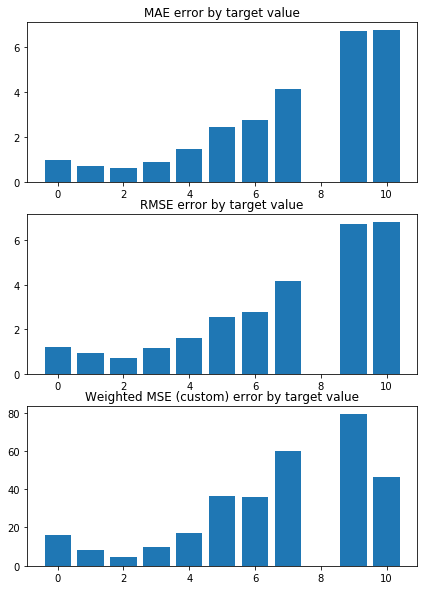

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9793432775536978 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0025777290647933 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


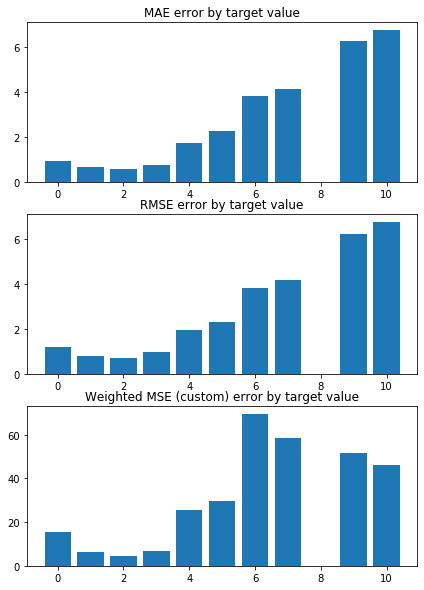

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0652876280281582 


 TRAIN PREDICTION Error
weighted_mse_train: 0.993582143329867 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


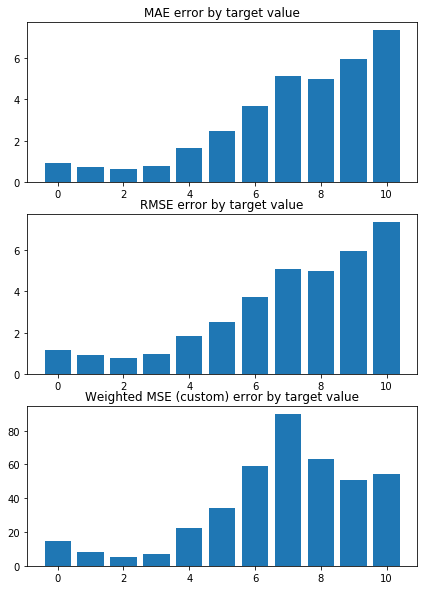

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0843634190072509 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9870512173960724 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


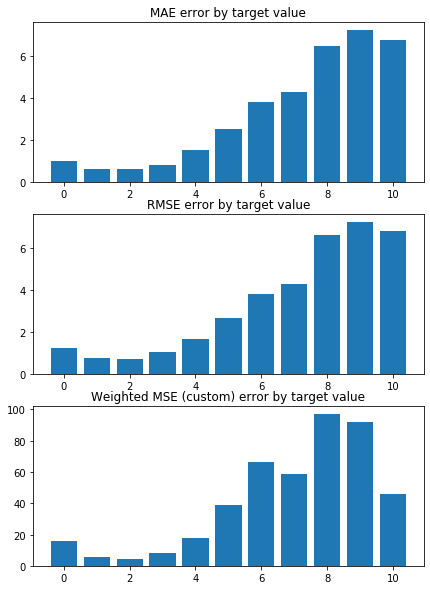

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9329732253646866 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0076852034430746 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


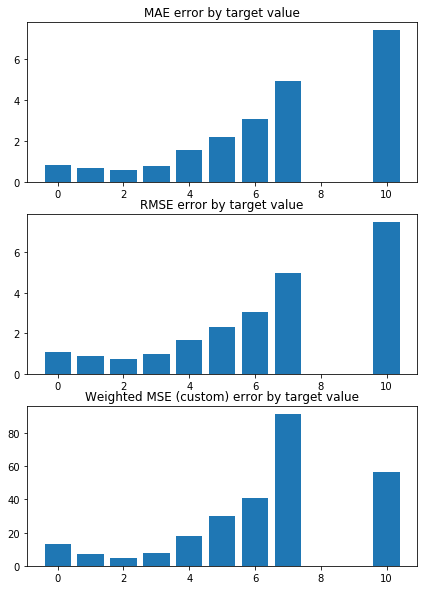

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.0768008022252697 

Mean squared error on Test: 1.00 
 MSE mean test:  2.0899532941453667 

Root of MSE on Test: 1.00 
 1.4456670758322494 

Variance score on Test: 0.06 
 r2_test: 0.2949129942066152 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K9me2  \
0 -0.572384  0.378518 -0.353546 -0.289014 -0.282814  0.167357  0.153878   
1 -0.609997  0.413551 -0.331983 -0.274310 -0.309827  0.150839  0.179432   
2 -0.591900  0.402124 -0.337823 -0.310531 -0.318336  0.159345  0.171884   
3 -0.588248  0.384711 -0.371000 -0.273109 -0.278655  0.160798  0.195054   
4 -0.606427  0.389772 -0.318681 -0.291686 -0.308973  0.167198  0.181229   
5 -0.574684  0.357924 -0.334222 -0.289360 -0.288360  0.183291  0.142384   
6 -0.584263  0.396104 -0.350919 -0.284279 -0.276413  0.177463  0.157980   
7 -0.562064  0.397747 -0.364952 -0.2

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


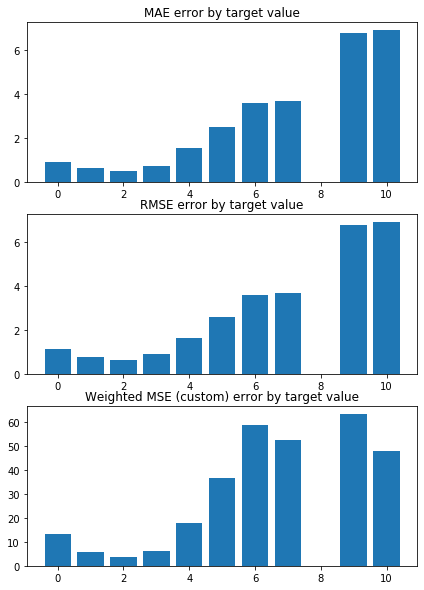

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9626067349747909 


 TRAIN PREDICTION Error
weighted_mse_train: 1.009369793969998 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


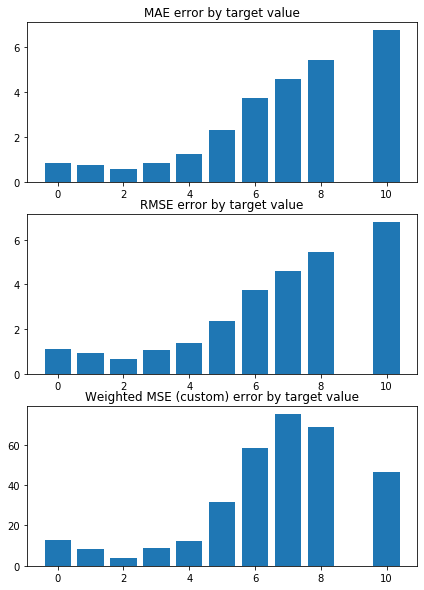

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9890996515757844 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0021647910102898 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


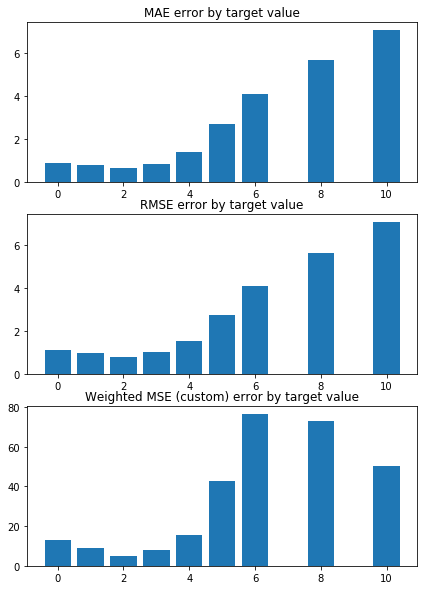

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0590290132169882 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9897415360082246 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


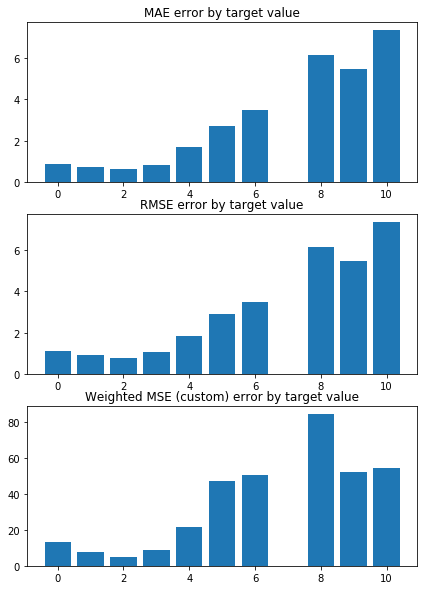

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9816329511344386 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0018201144818404 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


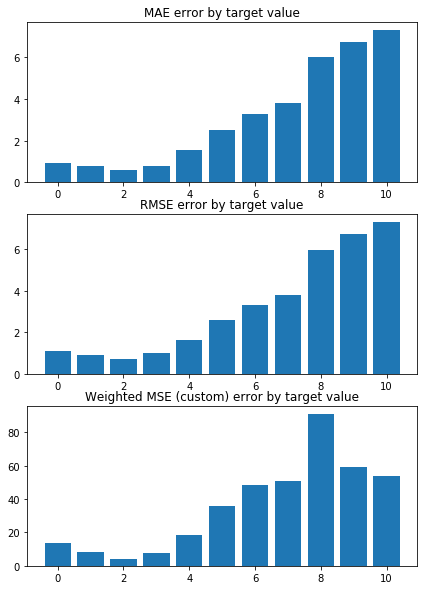

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0737078058062939 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9917543415505243 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


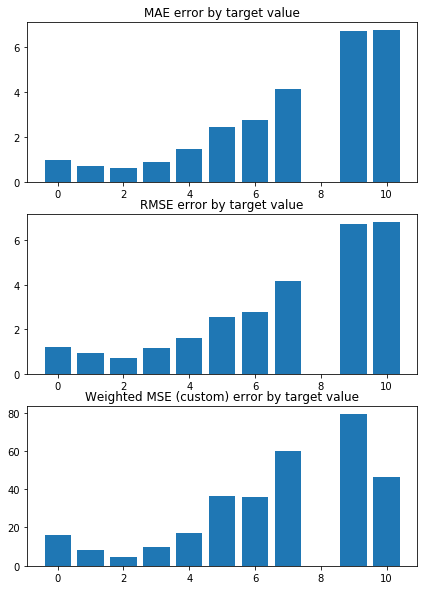

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9792732701410471 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0025066993429907 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


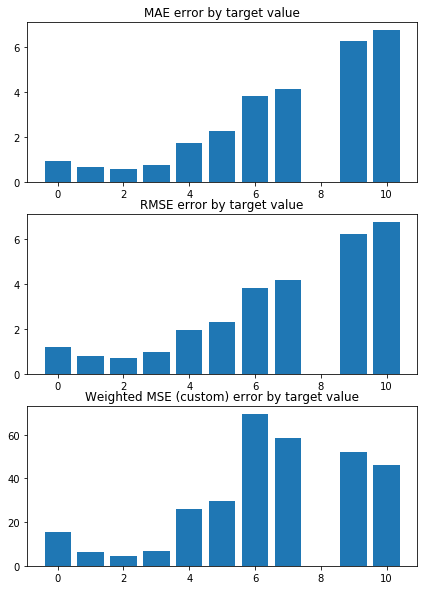

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0652203113211627 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9935103754877204 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


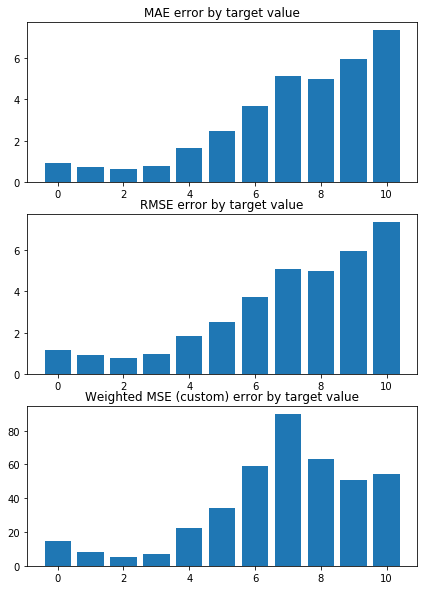

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0843302420763214 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9869799749219017 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


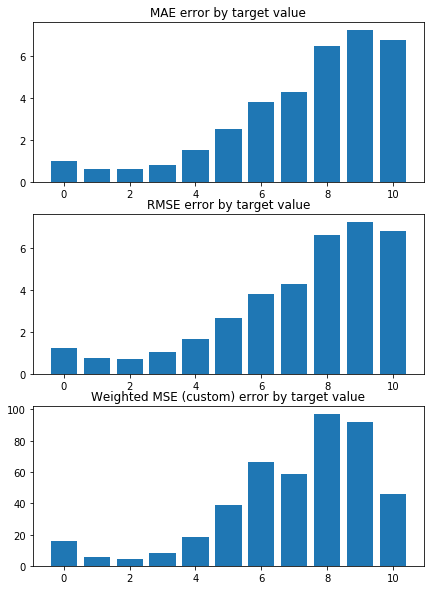

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9328542802945311 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0076173861488964 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


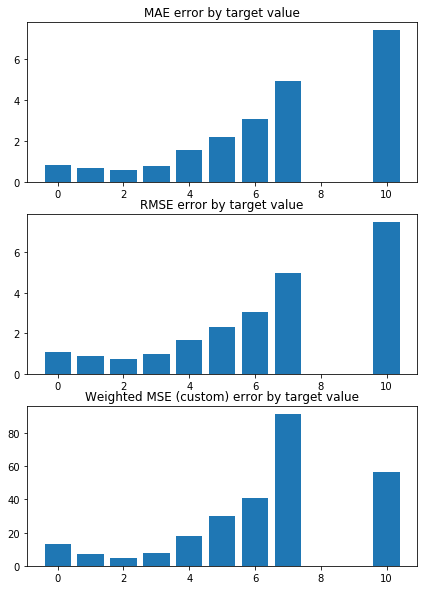

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076805584676509 

Mean squared error on Test: 1.00 
 MSE mean test:  2.0899422003228136 

Root of MSE on Test: 1.00 
 1.4456632389055253 

Variance score on Test: 0.06 
 r2_test: 0.2949177619215712 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K9me2  \
0 -0.571617  0.377819 -0.352769 -0.288859 -0.282242  0.167246  0.153355   
1 -0.609093  0.412756 -0.331427 -0.274150 -0.309240  0.150733  0.178851   
2 -0.591112  0.401381 -0.336997 -0.310351 -0.317695  0.159211  0.171329   
3 -0.587416  0.383963 -0.370244 -0.272960 -0.278101  0.160698  0.194420   
4 -0.605523  0.389032 -0.318088 -0.291519 -0.308384  0.167085  0.180625   
5 -0.573899  0.357233 -0.333592 -0.289189 -0.287820  0.183168  0.141882   
6 -0.583474  0.395378 -0.350116 -0.284105 -0.275819  0.177337  0.157454   
7 -0.561350  0.397035 -0.364068 -0.29

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


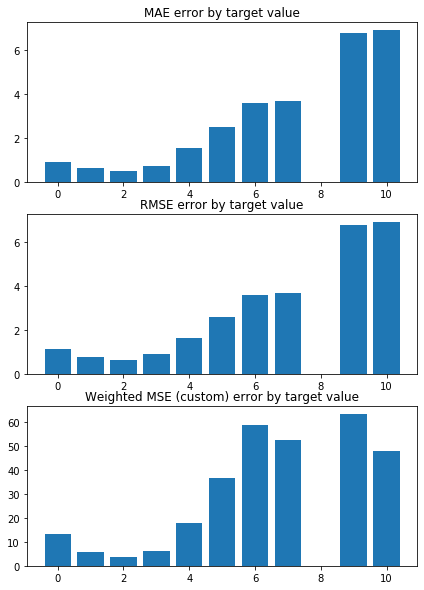

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9624812520279652 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0092975005846094 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


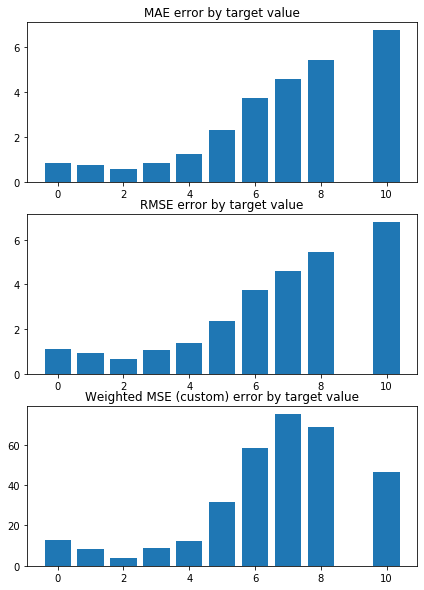

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9890057148756461 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0020893740466432 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


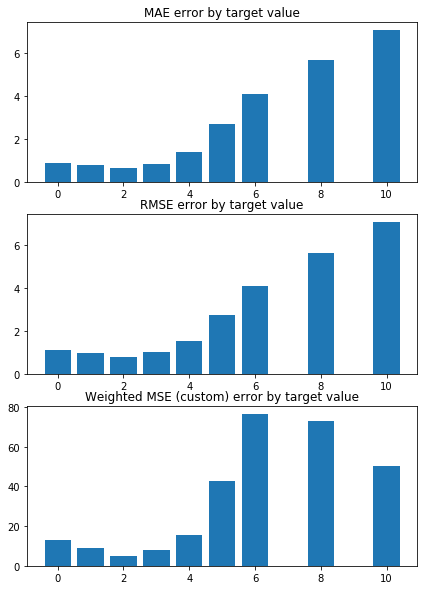

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.058927221476125 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9896736020222611 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


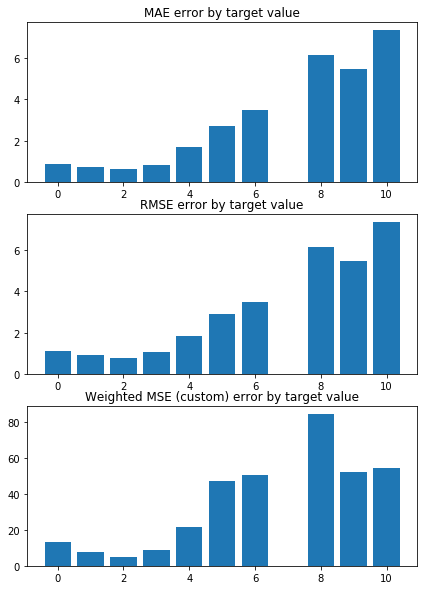

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9815356963613868 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0017474267972861 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


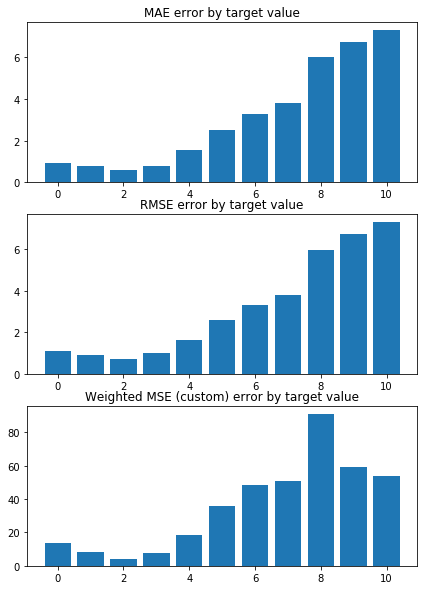

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0736702559226092 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9916931741753126 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


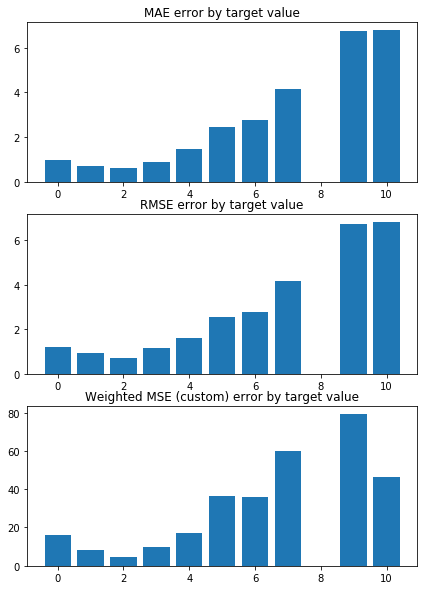

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9792046554059073 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0024365588317012 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


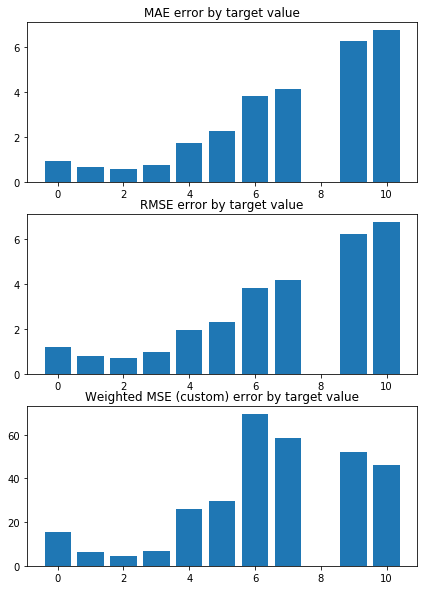

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.065154388064728 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9934395252712015 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


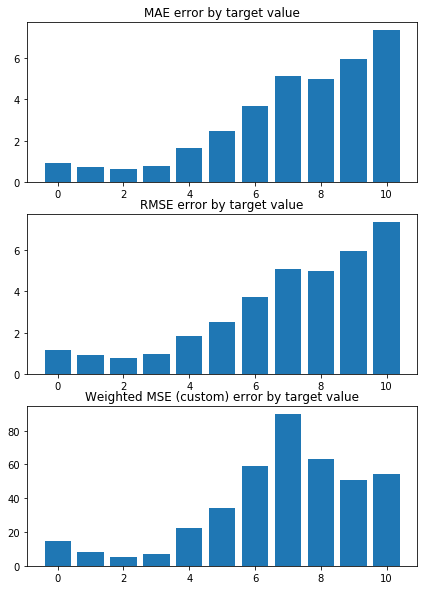

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.084297857988156 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9869096254635406 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


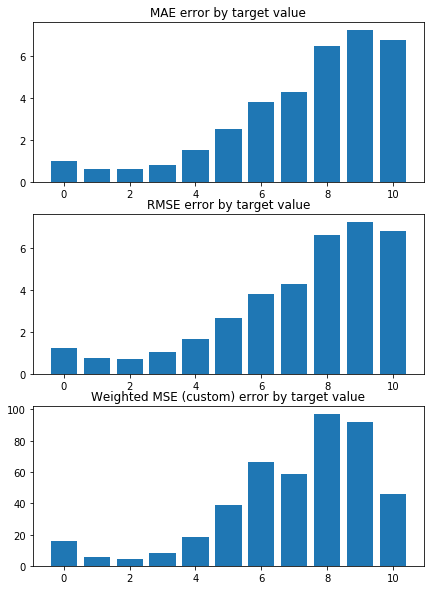

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9327365833557862 


 TRAIN PREDICTION Error
weighted_mse_train: 1.007550477318369 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


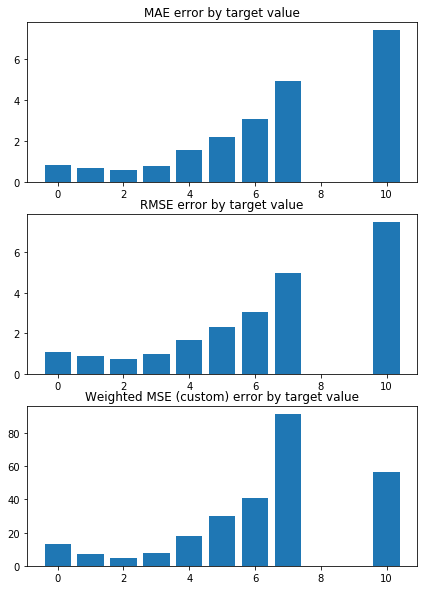

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076810928426182 

Mean squared error on Test: 1.00 
 MSE mean test:  2.0899318271648424 

Root of MSE on Test: 1.00 
 1.4456596512197615 

Variance score on Test: 0.06 
 r2_test: 0.29492227794872206 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K9me2  \
0 -0.570850  0.377120 -0.352007 -0.288704 -0.281674  0.167136  0.152834   
1 -0.608191  0.411962 -0.330880 -0.273990 -0.308657  0.150628  0.178273   
2 -0.590323  0.400638 -0.336190 -0.310172 -0.317061  0.159079  0.170776   
3 -0.586583  0.383216 -0.369501 -0.272810 -0.277552  0.160599  0.193788   
4 -0.604620  0.388293 -0.317507 -0.291353 -0.307800  0.166972  0.180023   
5 -0.573114  0.356543 -0.332973 -0.289019 -0.287284  0.183046  0.141381   
6 -0.582683  0.394652 -0.349330 -0.283932 -0.275232  0.177211  0.156930   
7 -0.560634  0.396323 -0.363201 -0.2

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.090053,0.273496,2.076784,0.030222,-,"Ridge(alpha=0, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.34664723078072357, 0.3388569208172696, 0.26...",1.005482,0.057482,0.999608,0.007477
1,2.090036,0.273523,2.076785,0.030222,-,"Ridge(alpha=1, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3466322524316614, 0.338889075060851, 0.2657...",1.005395,0.057497,0.999531,0.007476
2,2.090020,0.273550,2.076786,0.030222,-,"Ridge(alpha=2, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.34661707513085027, 0.3389210984496358, 0.26...",1.005309,0.057512,0.999455,0.007475
3,2.090005,0.273577,2.076788,0.030222,-,"Ridge(alpha=3, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.34660170771145926, 0.3389529823776771, 0.26...",1.005225,0.057526,0.999380,0.007474
4,2.089991,0.273603,2.076790,0.030222,-,"Ridge(alpha=4, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3465861583422597, 0.3389847189344267, 0.265...",1.005141,0.057541,0.999306,0.007472
5,2.089978,0.273629,2.076793,0.030222,-,"Ridge(alpha=5, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3465704345930999, 0.33901630085178347, 0.26...",1.005058,0.057556,0.999233,0.007471
6,2.089965,0.273655,2.076797,0.030222,-,"Ridge(alpha=6, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3465545434929196, 0.33904772145565143, 0.26...",1.004977,0.057570,0.999161,0.007470
7,2.089953,0.273682,2.076801,0.030222,-,"Ridge(alpha=7, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.34653849158125893, 0.339078974621583, 0.265...",1.004897,0.057585,0.999090,0.007469
8,2.089942,0.273707,2.076806,0.030222,-,"Ridge(alpha=8, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.34652228495407433, 0.3391100547341136, 0.26...",1.004817,0.057599,0.999020,0.007468
9,2.089932,0.273733,2.076811,0.030222,-,"Ridge(alpha=9, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.3465059293045665, 0.3391409566494523, 0.265...",1.004739,0.057613,0.998950,0.007467


In [96]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 10, 1)
# Create linear regression object



model_name = 'LR+L2_grid10'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

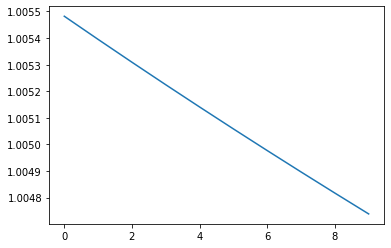

In [97]:
plt.plot(alpha_grid, wmse_test)

In [98]:
wmse_test

[1.0054820749180902,
 1.0053950420912918,
 1.0053092026075945,
 1.005224516931356,
 1.0051409482670433,
 1.0050584623022683,
 1.0049770269791478,
 1.0048966122904552,
 1.0048171900975276,
 1.0047387339673035]

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9301804350288851 


 TRAIN PREDICTION Error
weighted_mse_train: 1.003867464404936 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


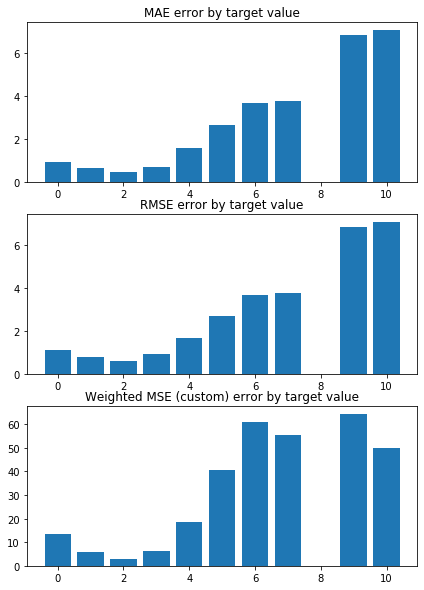

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9449505505962013 


 TRAIN PREDICTION Error
weighted_mse_train: 1.008312307591183 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


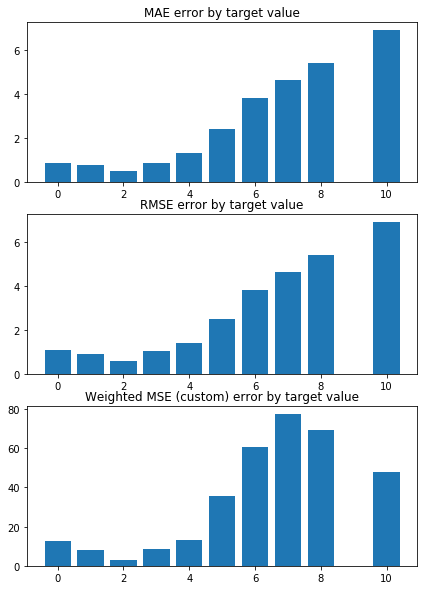

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9808077542494317 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0003029483453985 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


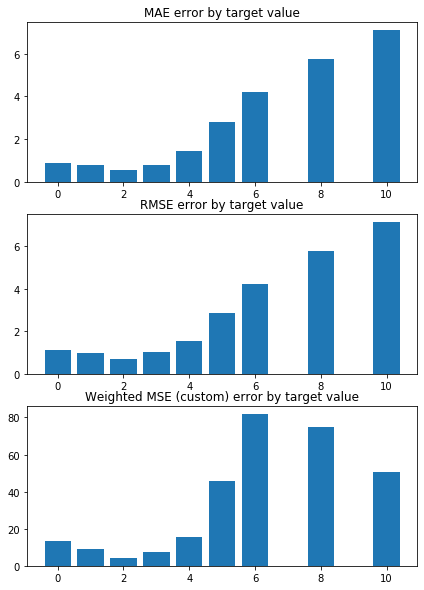

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0456421275118541 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9899075529255046 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


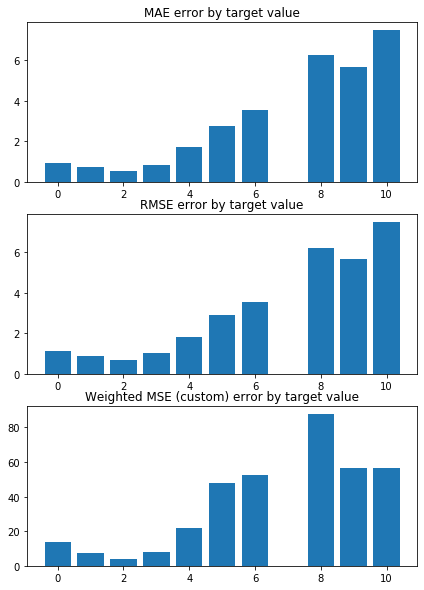

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9768338449708349 


 TRAIN PREDICTION Error
weighted_mse_train: 1.000234926573986 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


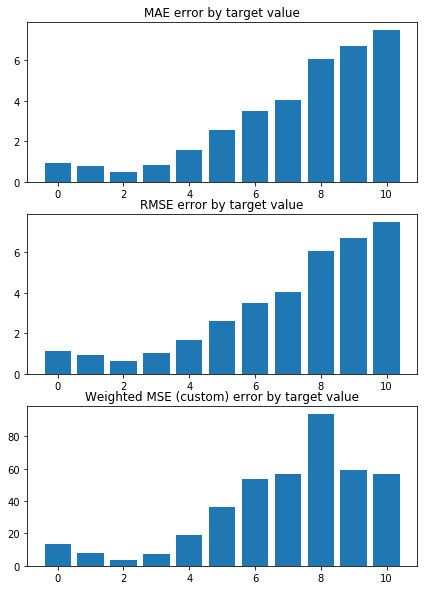

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0719643209648095 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9912837652802405 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


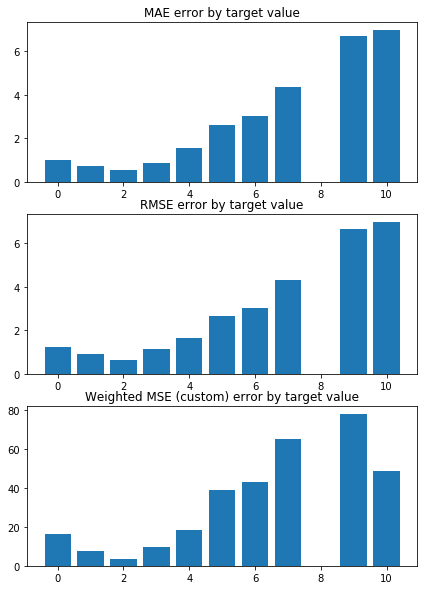

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9852167031206928 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0007442846125238 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


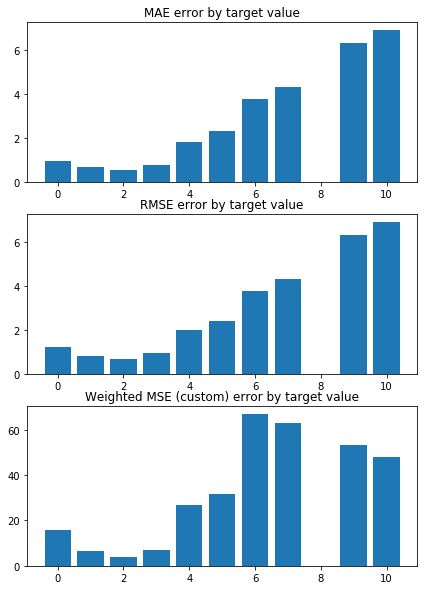

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0689227535983912 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9914739896503069 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


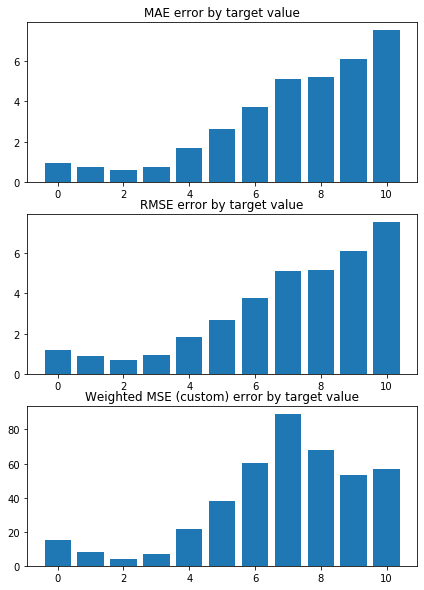

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0987775261529984 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9853256956802067 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


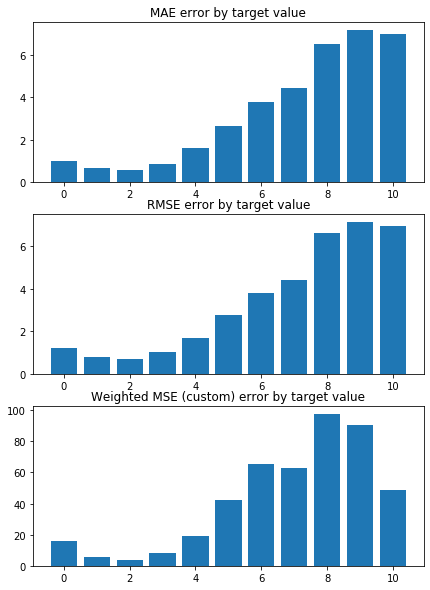

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9088556049617302 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0069354652432818 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


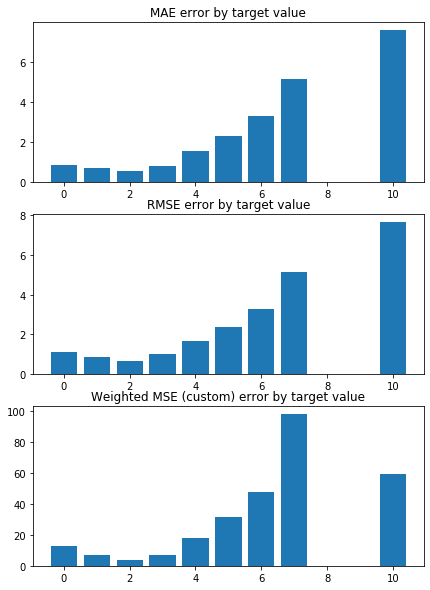

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.112344815550401 

Mean squared error on Test: 1.00 
 MSE mean test:  2.120658340961831 

Root of MSE on Test: 1.00 
 1.4562480355220504 

Variance score on Test: 0.06 
 r2_test: 0.2847589160335749 

wMSE_train 1.0
wMSE_test 1.0
MSE_train 2.11
MSE_test 2.12
MAE_train 0.97
MAE_test 0.93
r2_test 0.28
   H3K36me3       GAF   H3K4me1  H3K27me3  H3K36me1    Su(Hw)      CTCF  \
0 -0.267437 -0.202003 -0.197182 -0.128858 -0.128201  0.114715 -0.107989   
1 -0.276237 -0.191078 -0.197474 -0.136321 -0.141083  0.102086 -0.108715   
2 -0.273942 -0.215055 -0.193845 -0.137438 -0.145561  0.101713 -0.100283   
3 -0.268903 -0.191153 -0.206141 -0.136017 -0.128293  0.112280 -0.110184   
4 -0.273360 -0.201189 -0.187869 -0.140618 -0.140121  0.111983 -0.108301   
5 -0.270767 -0.197949 -0.192741 -0.131652 -0.134691  0.124751 -0.107037   
6 -0.270063 -0.194472 -0.198704 -0.134646 -0.123782  0.120263 -0.108058   
7 -0.265778 -0.201634 -0.200586 -0.133

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


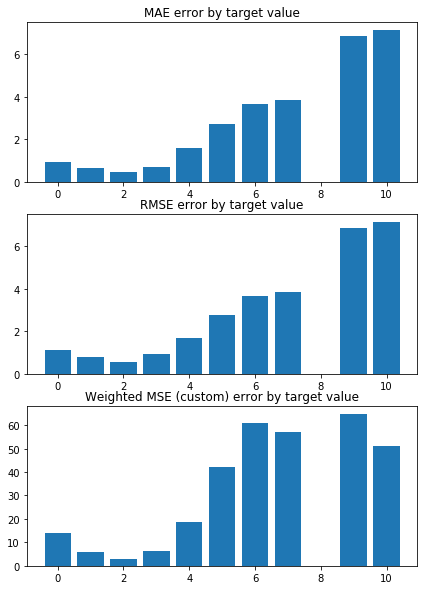

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9507349283251577 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0153413019764712 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


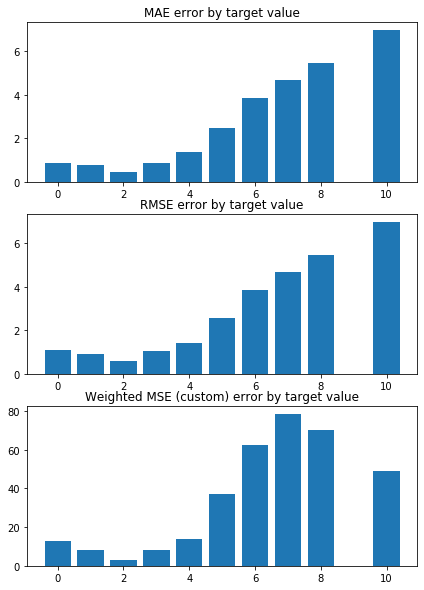

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9831199559474335 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0073939157160898 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


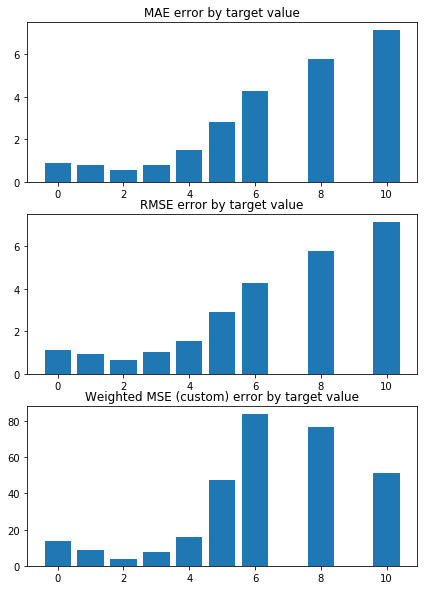

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0496876248149176 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9970196473047153 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


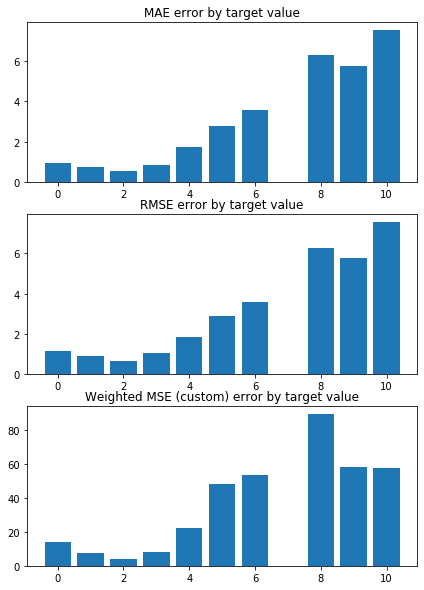

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9852553303307036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0070829707192048 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


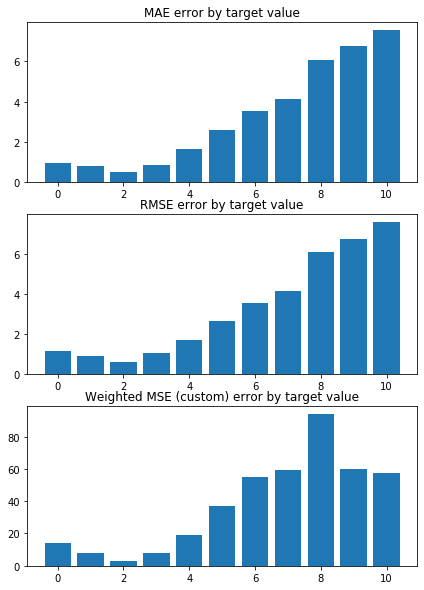

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073506050992366 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9983878947384167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


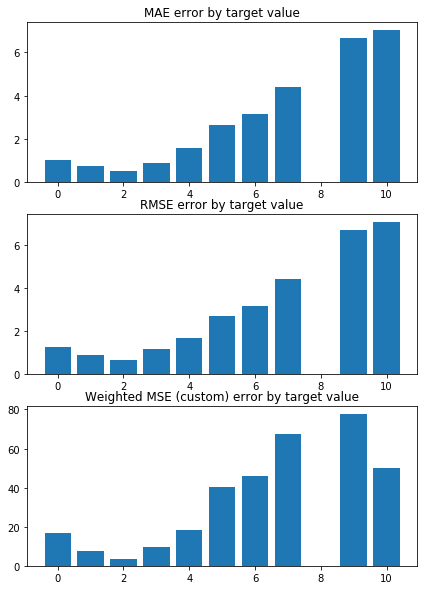

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9941224291649259 


 TRAIN PREDICTION Error
weighted_mse_train: 1.007438321901315 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


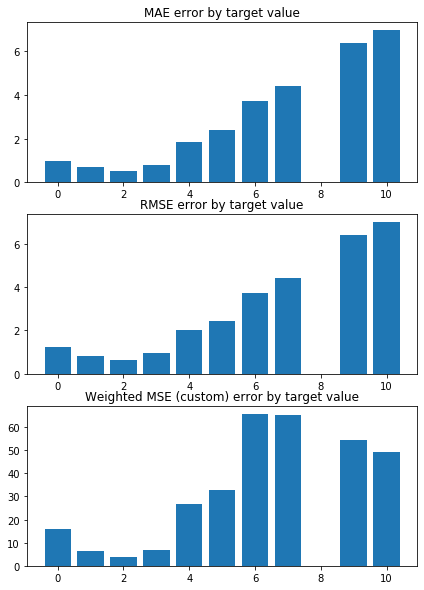

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0771528496496454 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9980536786748413 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


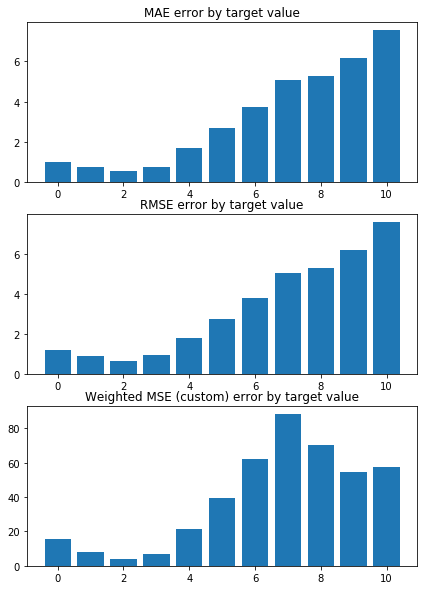

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1101675013642216 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9917114886541935 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


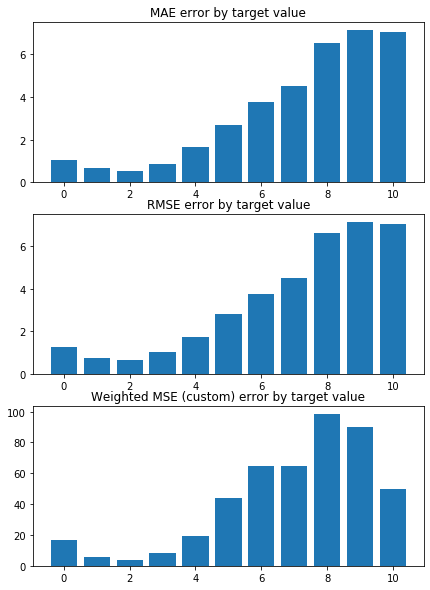

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9085510655450768 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0139862650901406 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


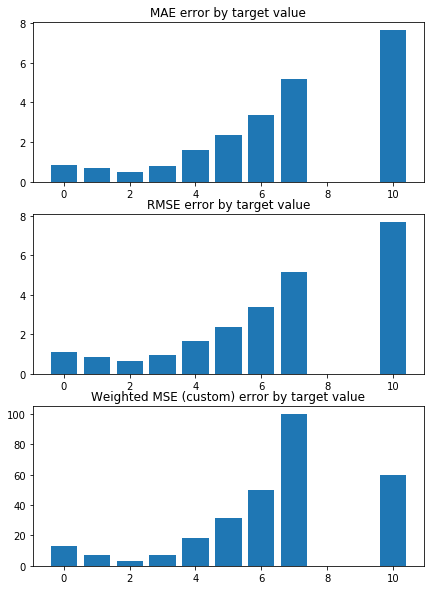

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.1356017010965713 

Mean squared error on Test: 1.01 
 MSE mean test:  2.142389267232855 

Root of MSE on Test: 1.00 
 1.4636902907489873 

Variance score on Test: 0.06 
 r2_test: 0.2774242170867092 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.14
MSE_test 2.14
MAE_train 0.98
MAE_test 0.94
r2_test 0.28
   H3K36me3       GAF   H3K4me1  H3K27me3      CTCF     Chriz  H3K36me1  \
0 -0.192662 -0.162756 -0.159681 -0.103120 -0.101094 -0.099394 -0.098007   
1 -0.196729 -0.155241 -0.161619 -0.109110 -0.101353 -0.092838 -0.107784   
2 -0.196107 -0.173659 -0.159415 -0.109639 -0.096243 -0.094877 -0.110732   
3 -0.192706 -0.154437 -0.166186 -0.108985 -0.102568 -0.094660 -0.099281   
4 -0.195361 -0.161757 -0.154905 -0.112353 -0.101506 -0.101266 -0.106434   
5 -0.195462 -0.158400 -0.157313 -0.104944 -0.100580 -0.101260 -0.103374   
6 -0.193805 -0.156364 -0.162041 -0.107102 -0.101264 -0.092728 -0.095788   
7 -0.192081 -0.161615 -0.162457 -0.1

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


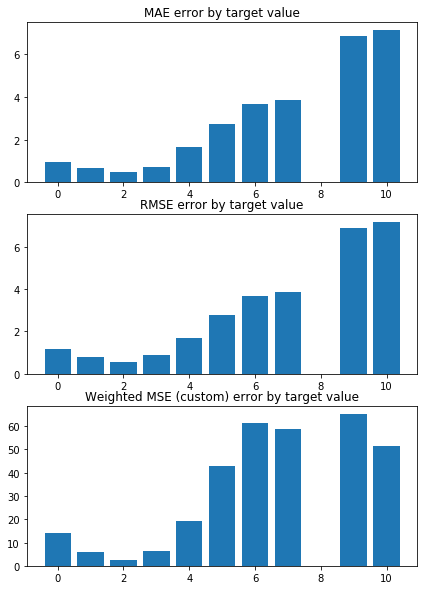

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9555549990038551 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0201907803364554 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


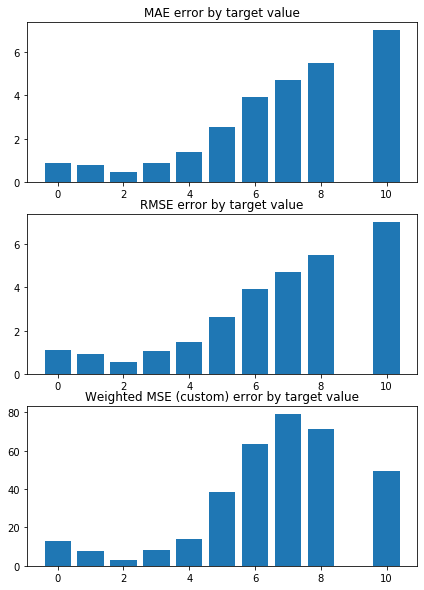

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9843856419699286 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0124435318386762 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


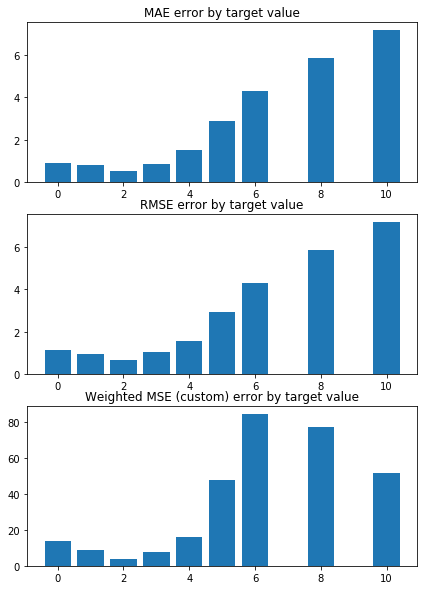

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0529353379601567 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0018388244180871 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


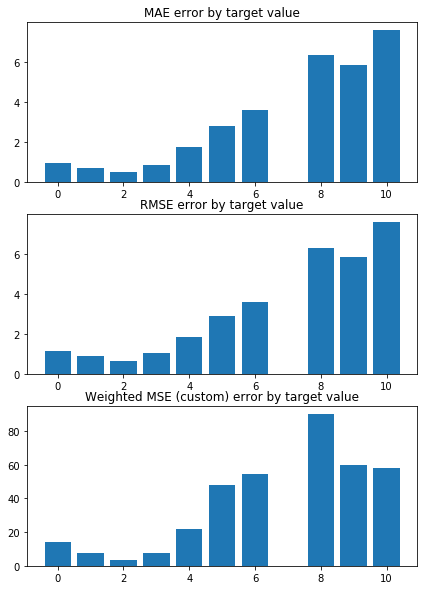

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.991460012988327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0118715903425601 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


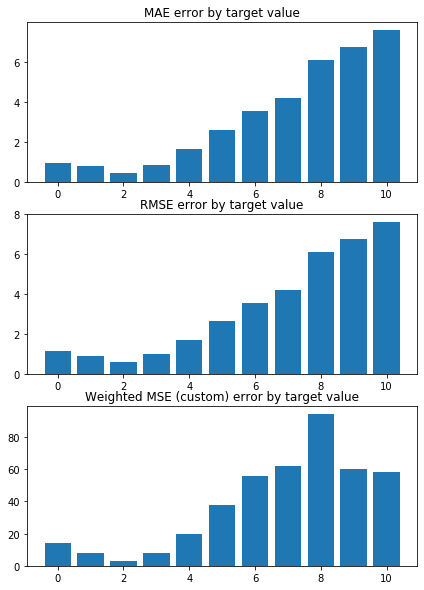

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0743495870530873 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0034963227047782 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


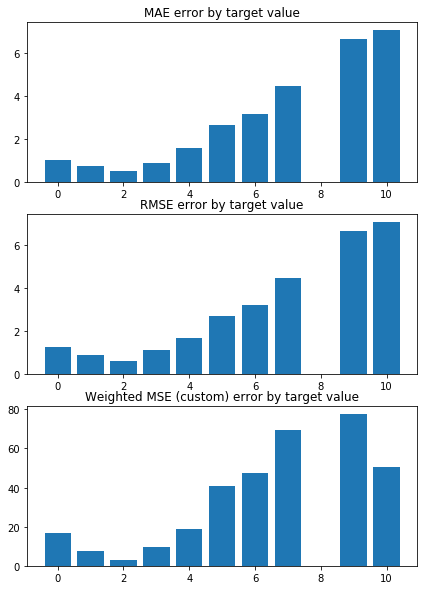

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.999451096212552 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0122186847955494 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


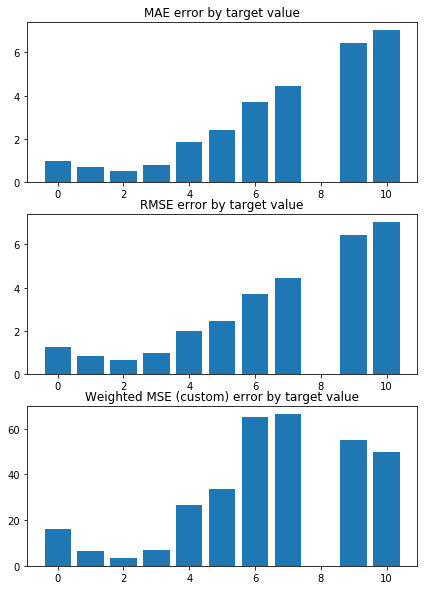

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0828722464645235 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0027492902253483 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


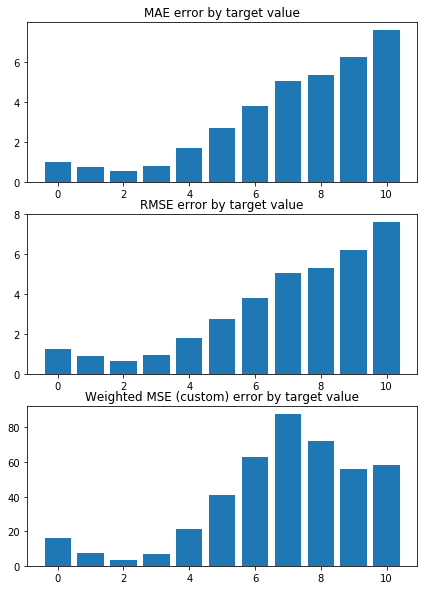

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1172489659400453 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9962060105297035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


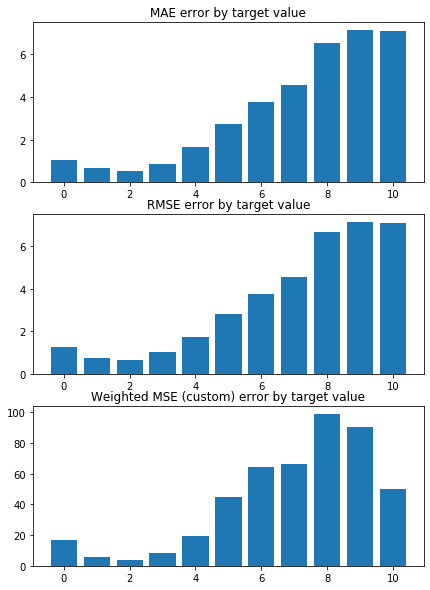

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9103653757017264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0189697122716808 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


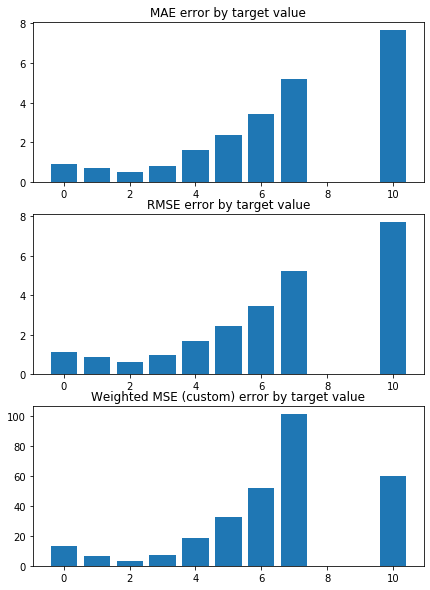

Weighted Mean squared error on Train: 1.01 
 MSE mean train: 2.151430986098384 

Mean squared error on Test: 1.01 
 MSE mean test:  2.157325028782266 

Root of MSE on Test: 1.01 
 1.468783520054016 

Variance score on Test: 0.06 
 r2_test: 0.272366731919226 

wMSE_train 1.01
wMSE_test 1.01
MSE_train 2.15
MSE_test 2.16
MAE_train 0.98
MAE_test 0.94
r2_test 0.27
   H3K36me3   H3K4me1       GAF      CTCF     Chriz  H3K36me1  H3K27me3  \
0 -0.157415 -0.140156 -0.139456 -0.095960 -0.094285 -0.084316 -0.083188   
1 -0.159610 -0.142564 -0.133878 -0.095967 -0.089044 -0.092604 -0.088258   
2 -0.159543 -0.141009 -0.149099 -0.092538 -0.090821 -0.094709 -0.088437   
3 -0.157216 -0.145518 -0.132590 -0.097177 -0.090455 -0.086068 -0.088138   
4 -0.158997 -0.137332 -0.138523 -0.096403 -0.095477 -0.091098 -0.090830   
5 -0.159771 -0.138722 -0.135237 -0.095701 -0.095849 -0.088958 -0.084479   
6 -0.158005 -0.142744 -0.134029 -0.096181 -0.089359 -0.083360 -0.086158   
7 -0.157214 -0.142632 -0.138065 -0.095

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


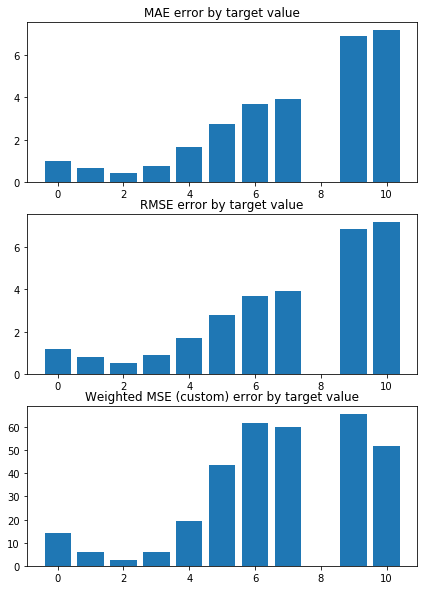

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9595267945351729 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0239287218858522 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


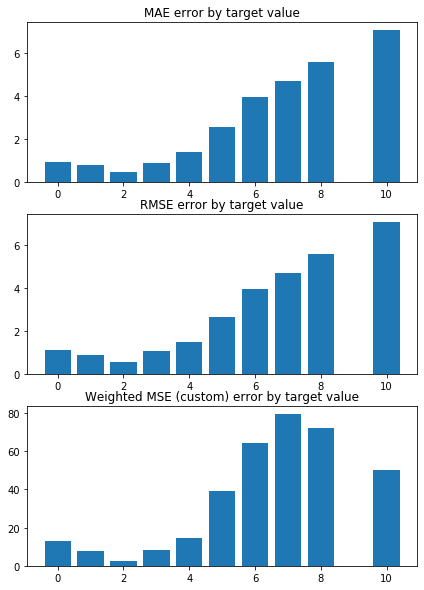

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9851620948294095 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0163775148519525 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


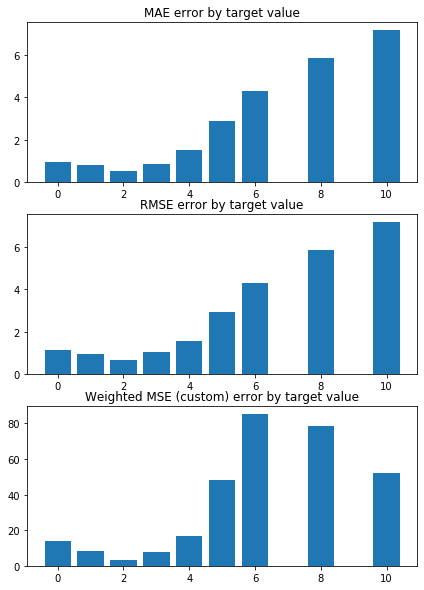

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.055451517053781 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0055044043877908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


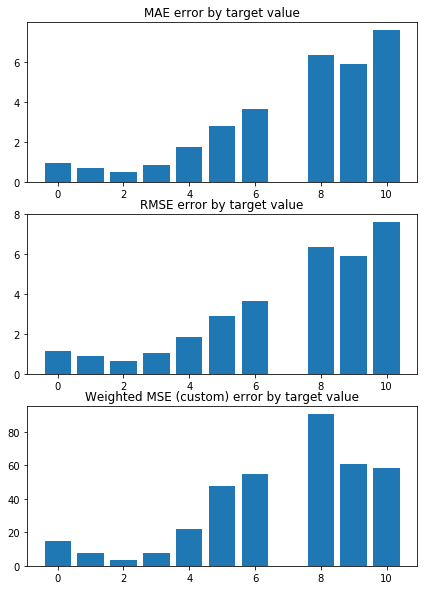

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.99645090225685 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0155614782702114 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


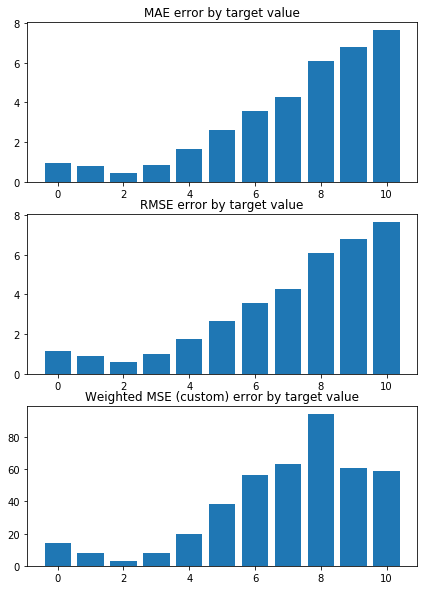

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0749732681228437 


 TRAIN PREDICTION Error
weighted_mse_train: 1.007486356393433 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


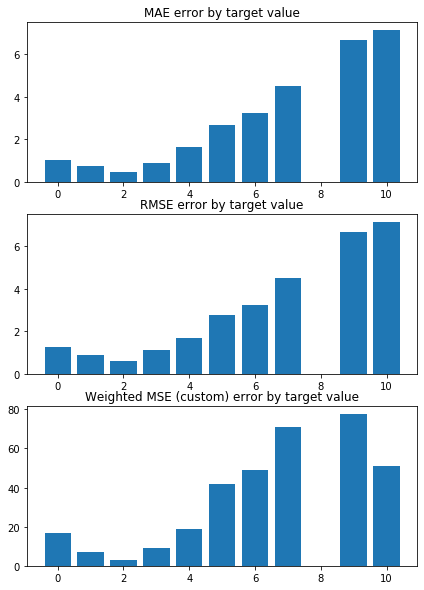

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.003036390063665 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0159526429657173 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


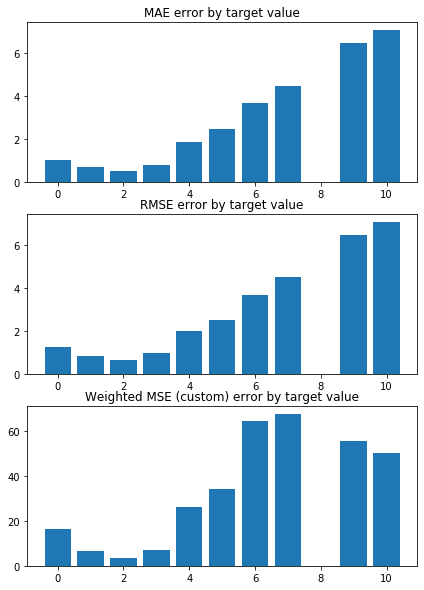

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0872708556017316 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0064053406806586 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


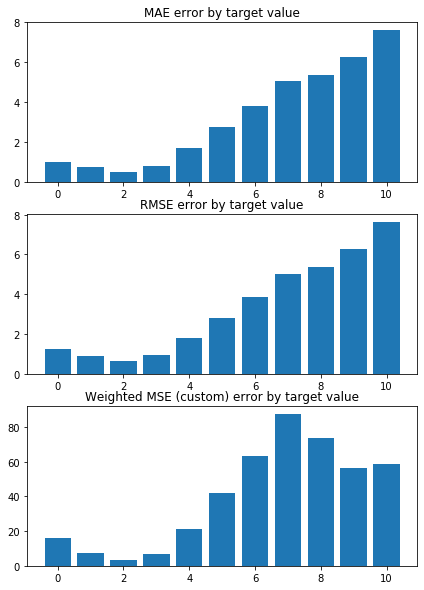

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1223641815632275 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9997073556772215 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


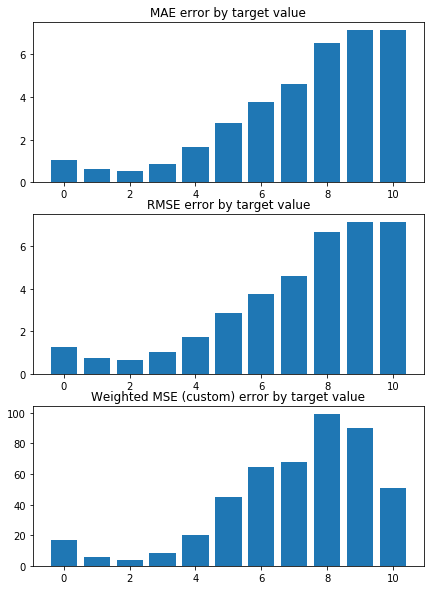

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9127428530613048 


 TRAIN PREDICTION Error
weighted_mse_train: 1.022815932397804 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


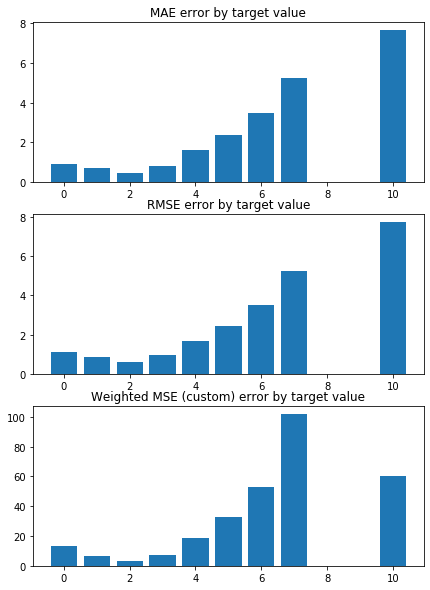

Weighted Mean squared error on Train: 1.01 
 MSE mean train: 2.1636581352096744 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1689345257867023 

Root of MSE on Test: 1.01 
 1.472730296349845 

Variance score on Test: 0.06 
 r2_test: 0.2684283653746048 

wMSE_train 1.01
wMSE_test 1.02
MSE_train 2.16
MSE_test 2.17
MAE_train 0.98
MAE_test 0.94
r2_test 0.27
   H3K36me3   H3K4me1       GAF      CTCF     Chriz  H3K36me1   H3K4me2  \
0 -0.136557 -0.127486 -0.123671 -0.091892 -0.090263 -0.076154 -0.074297   
1 -0.137798 -0.130035 -0.119295 -0.091757 -0.085814 -0.083492 -0.079915   
2 -0.137985 -0.128840 -0.132396 -0.089331 -0.087424 -0.085077 -0.078060   
3 -0.136362 -0.132160 -0.117767 -0.093006 -0.087065 -0.078117 -0.075980   
4 -0.137604 -0.125712 -0.122830 -0.092357 -0.091095 -0.081937 -0.073813   
5 -0.138597 -0.126575 -0.119680 -0.091793 -0.091602 -0.080290 -0.074796   
6 -0.136877 -0.130130 -0.118981 -0.092146 -0.086312 -0.075974 -0.078017   
7 -0.136541 -0.129765 -0.122199 -0.

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


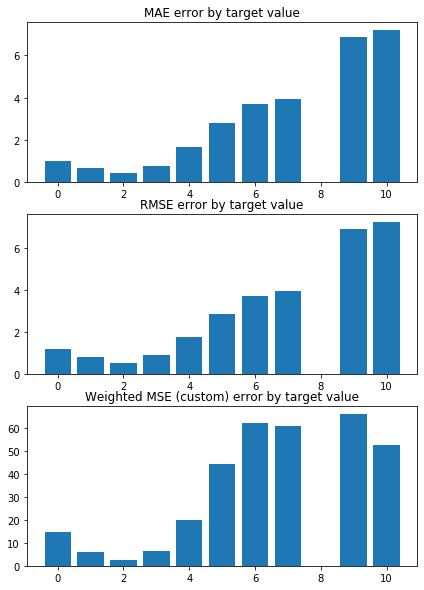

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9630290233860402 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0270884611037856 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


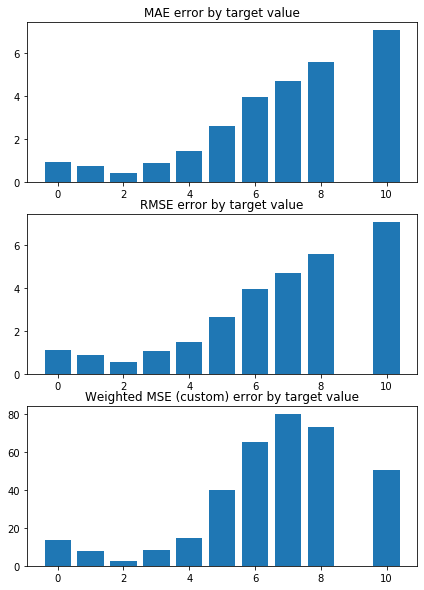

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.985765976186076 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0197095209364972 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


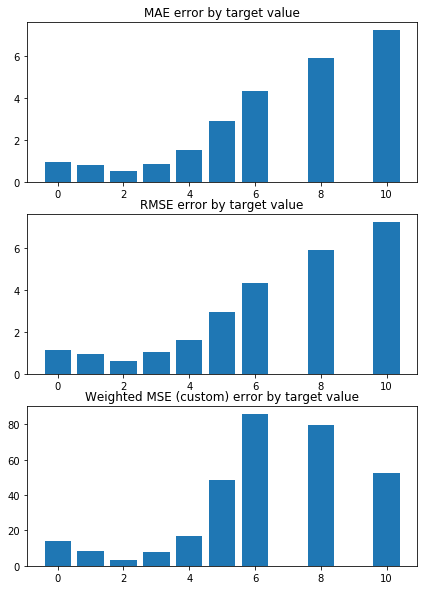

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0575197165361543 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0085712573004817 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


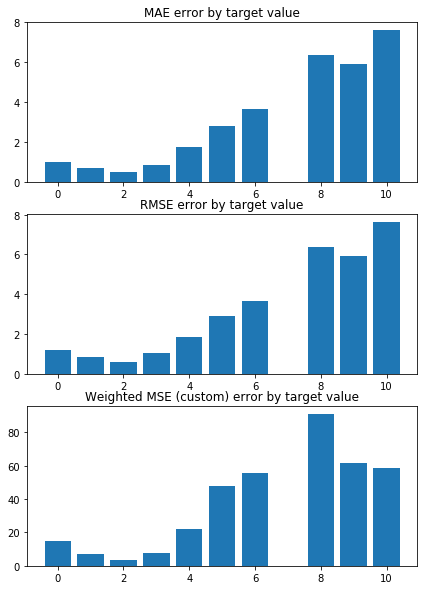

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0007798786626434 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0186643299953517 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


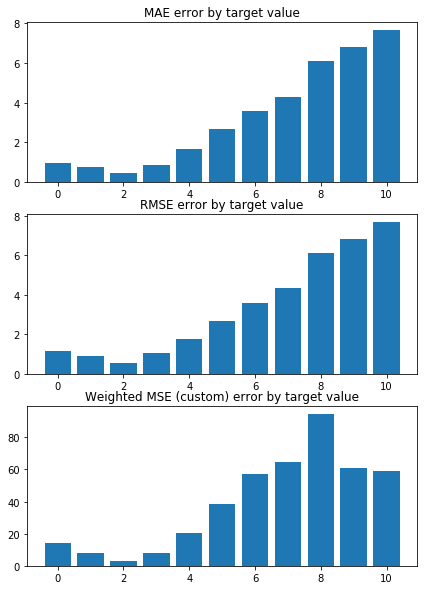

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0755590518905256 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0108613036629275 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


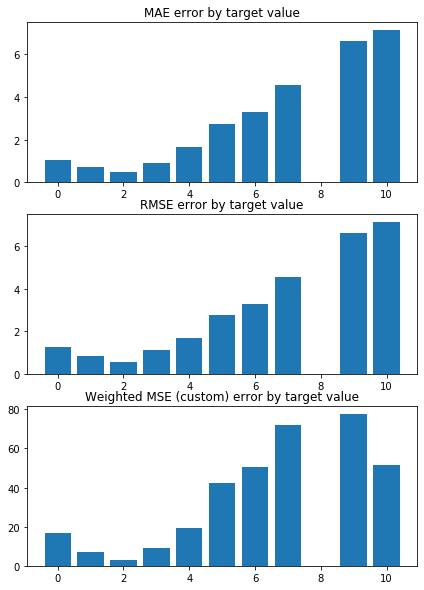

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.005707276703449 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0191268452060838 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


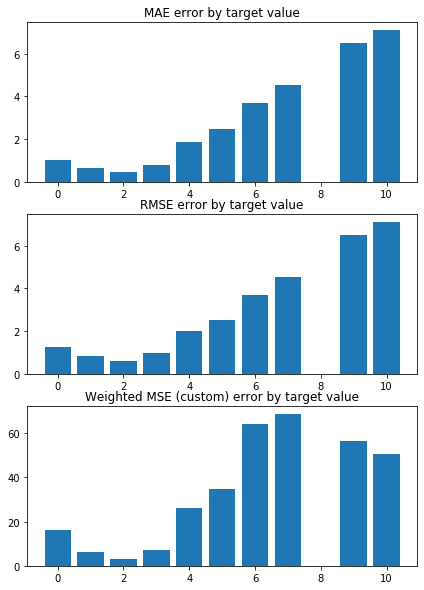

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0909416866435007 


 TRAIN PREDICTION Error
weighted_mse_train: 1.009502082842098 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


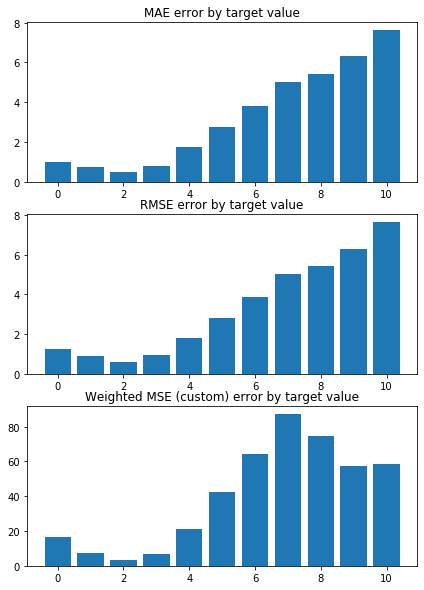

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1264577548232635 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0026868198286436 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


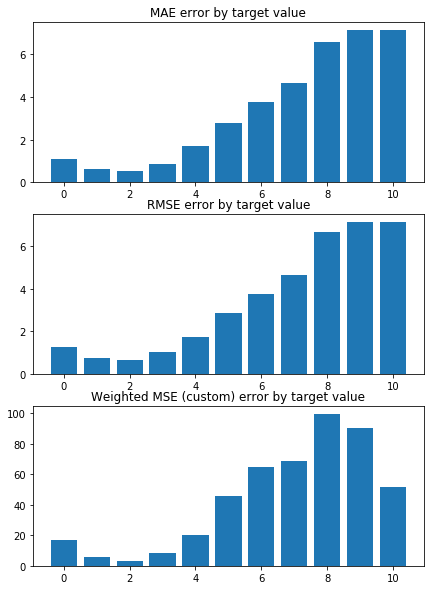

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9153556195844893 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0260414214458424 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


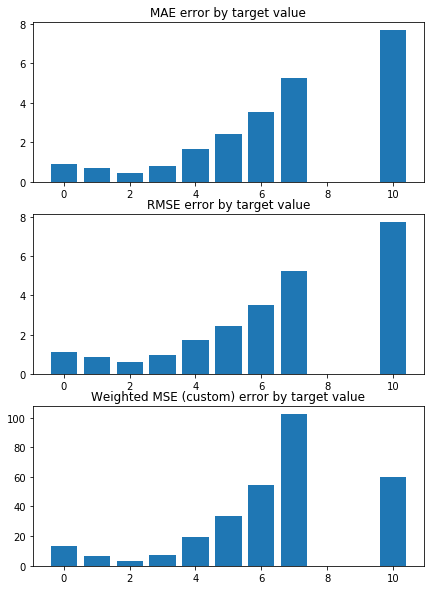

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.1738423392838904 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1786553627213605 

Root of MSE on Test: 1.01 
 1.4760268841458684 

Variance score on Test: 0.06 
 r2_test: 0.2651263977833256 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 2.17
MSE_test 2.18
MAE_train 0.99
MAE_test 0.94
r2_test 0.27
   H3K36me3   H3K4me1       GAF      CTCF     Chriz   H3K4me2   H3K4me3  \
0 -0.122608 -0.118302 -0.112098 -0.088496 -0.086911 -0.074728 -0.072873   
1 -0.123297 -0.120865 -0.108528 -0.088276 -0.083001 -0.079562 -0.075246   
2 -0.123625 -0.119896 -0.120098 -0.086511 -0.084499 -0.078086 -0.074981   
3 -0.122481 -0.122503 -0.106891 -0.089571 -0.084189 -0.076308 -0.071459   
4 -0.123359 -0.117163 -0.111347 -0.088981 -0.087531 -0.074432 -0.072070   
5 -0.124420 -0.117719 -0.108350 -0.088505 -0.088086 -0.075296 -0.071621   
6 -0.122779 -0.120936 -0.107982 -0.088776 -0.083595 -0.078011 -0.075235   
7 -0.122700 -0.120433 -0.110616 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


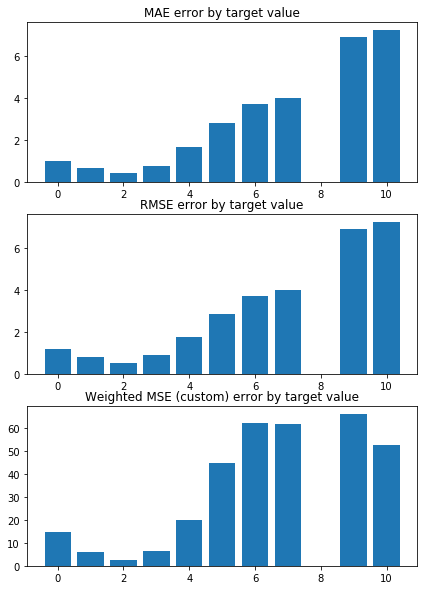

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9662892043871024 


 TRAIN PREDICTION Error
weighted_mse_train: 1.029938035707834 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


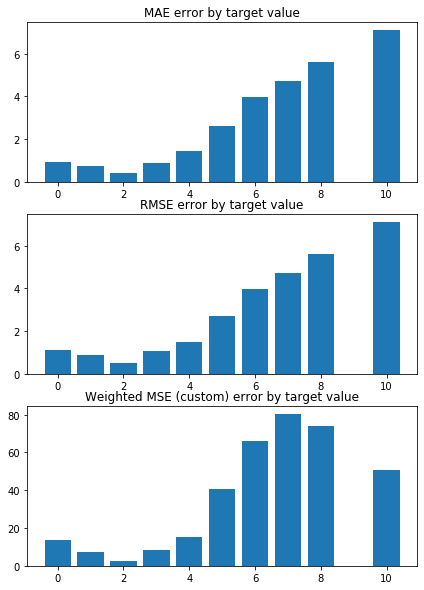

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9863537396799149 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0227091228486933 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


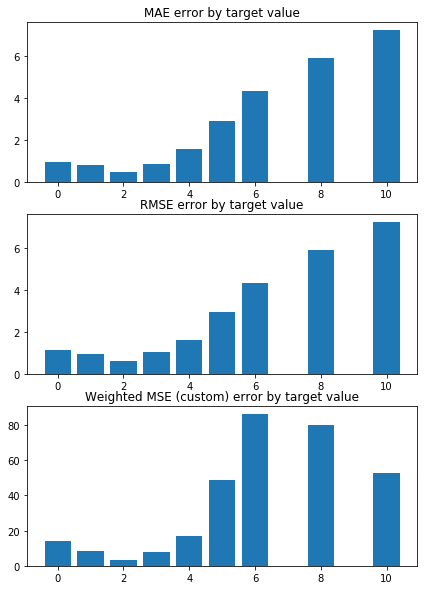

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0593279104664626 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0113183139335802 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


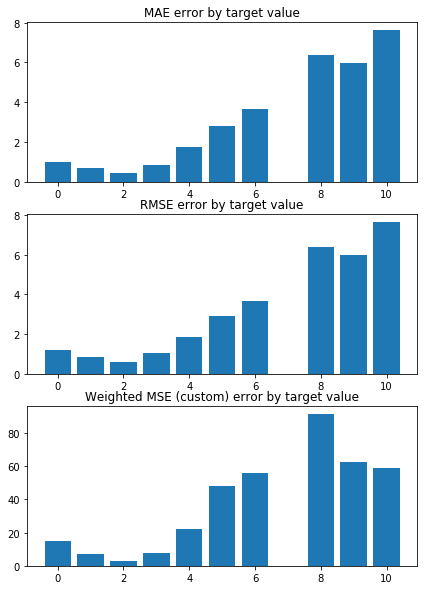

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0047313880957078 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0214459913957754 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


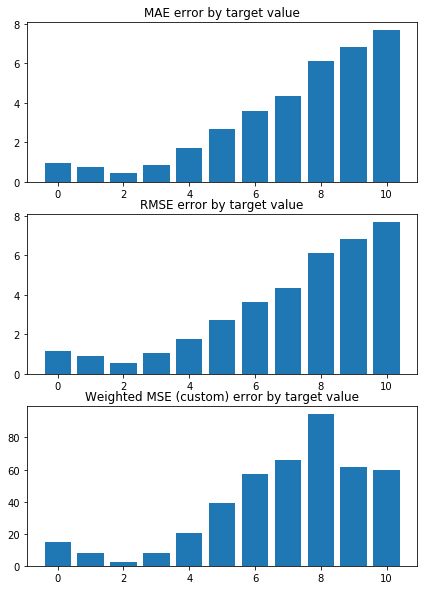

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0761857780120438 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0138906723152337 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


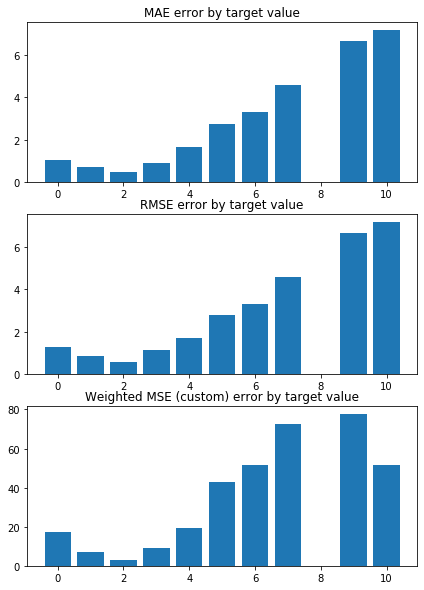

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0078768439805288 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0219975673731163 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


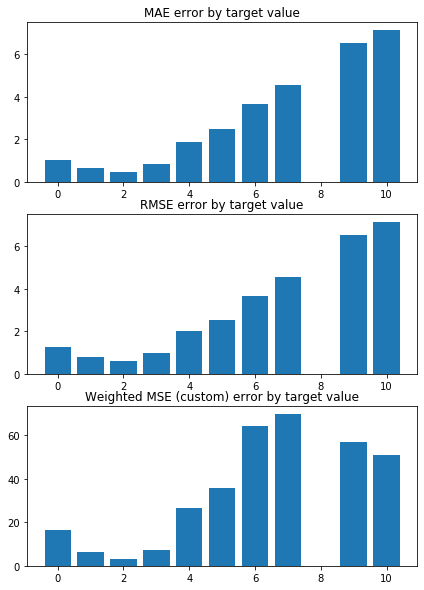

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.094195959322719 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0122937754716106 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


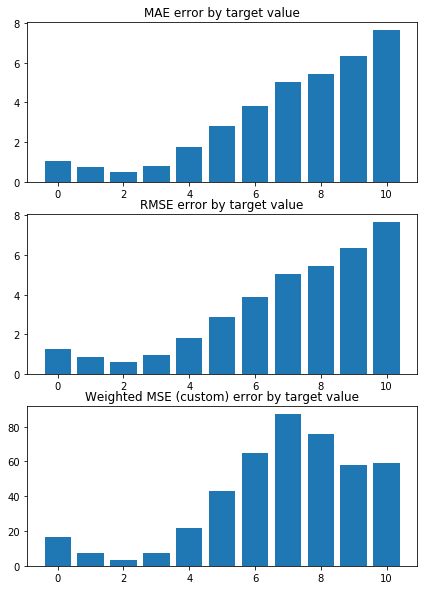

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.129974273506904 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0053869051360091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


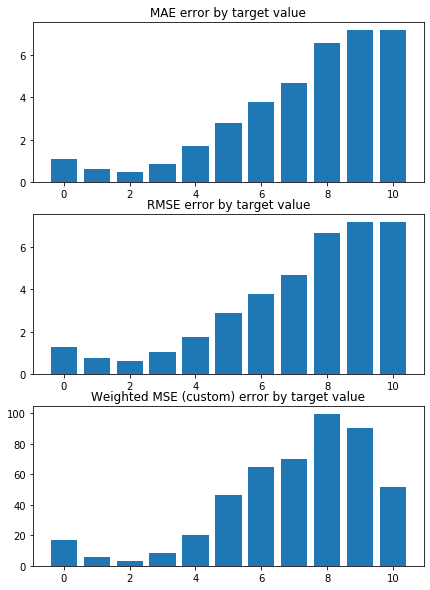

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9181083908256931 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0289200964259764 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


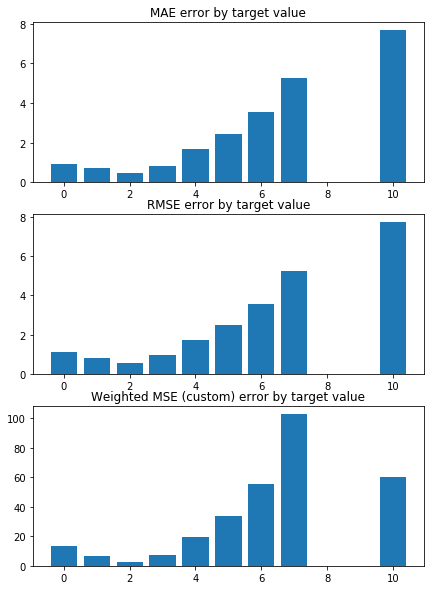

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.1827510266864927 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1871988631117443 

Root of MSE on Test: 1.01 
 1.4789181394221063 

Variance score on Test: 0.06 
 r2_test: 0.26222140043663705 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 2.18
MSE_test 2.19
MAE_train 0.99
MAE_test 0.95
r2_test 0.26
   H3K36me3   H3K4me1       GAF      CTCF     Chriz   H3K4me2   H3K4me3  \
0 -0.112522 -0.111183 -0.103154 -0.085561 -0.084018 -0.074566 -0.072248   
1 -0.112866 -0.113705 -0.100157 -0.085288 -0.080506 -0.078832 -0.074248   
2 -0.113279 -0.112890 -0.110557 -0.083989 -0.081924 -0.077624 -0.074131   
3 -0.112476 -0.115033 -0.098484 -0.086628 -0.081673 -0.076086 -0.071152   
4 -0.113091 -0.110460 -0.102483 -0.086066 -0.084507 -0.074405 -0.071560   
5 -0.114163 -0.110823 -0.099639 -0.085651 -0.085072 -0.075188 -0.071270   
6 -0.112604 -0.113779 -0.099496 -0.085865 -0.081157 -0.077535 -0.074281   
7 -0.112684 -0.113195 -0.101694 -

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


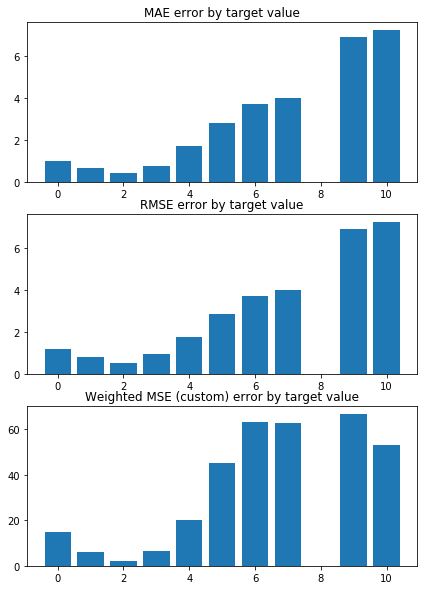

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9694362488540637 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0326232145053074 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


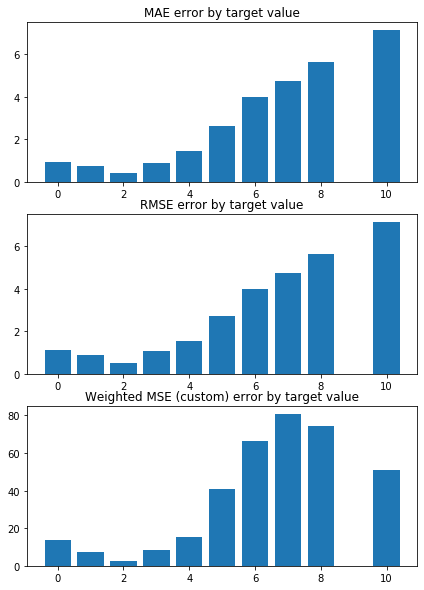

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.98700506349888 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0255267385408375 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


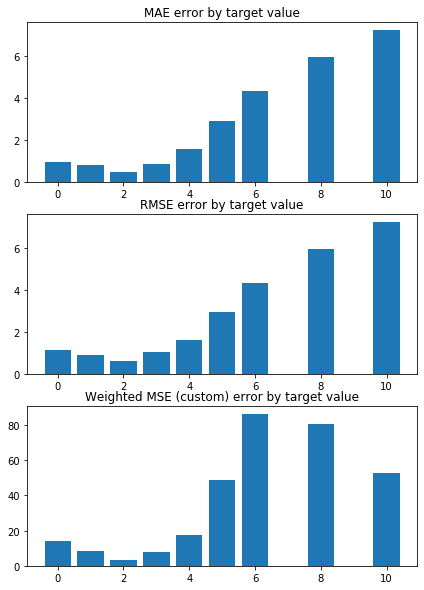

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0609937306950958 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0138977679064187 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


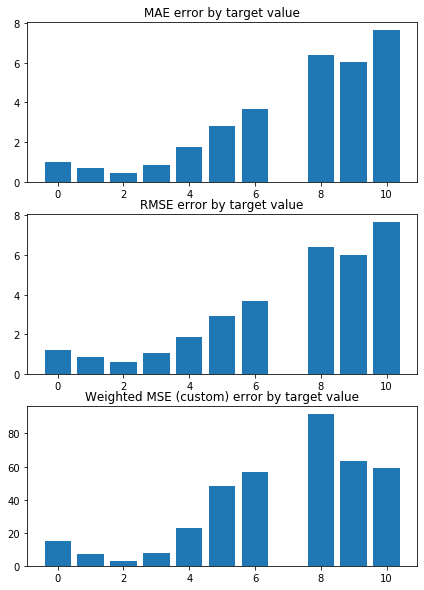

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.008462582940354 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0240542623737416 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


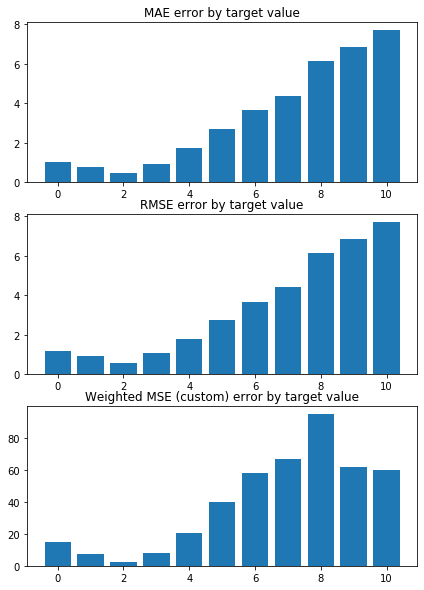

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.076890717568181 


 TRAIN PREDICTION Error
weighted_mse_train: 1.016726917855234 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


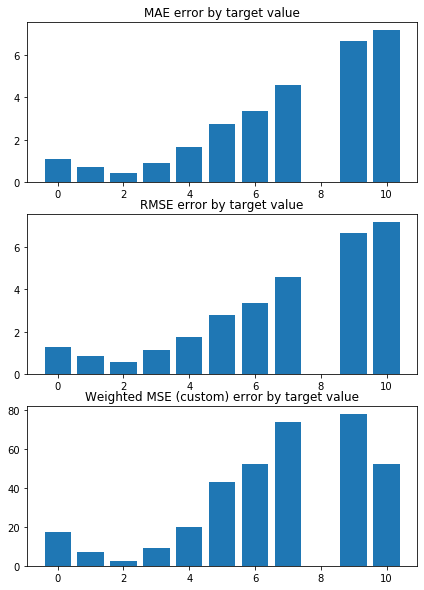

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0097712412634423 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0247077299770502 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


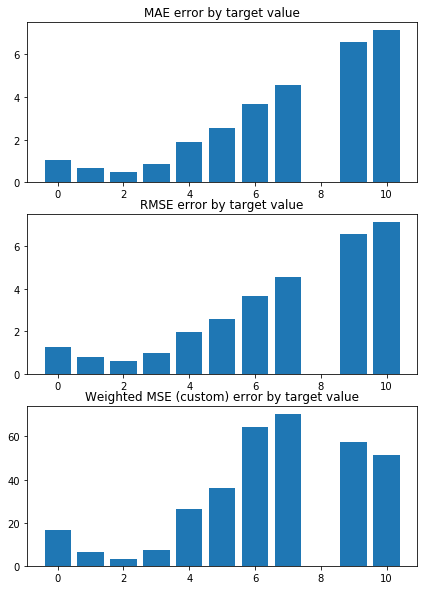

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.097209986979738 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0149228634130198 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


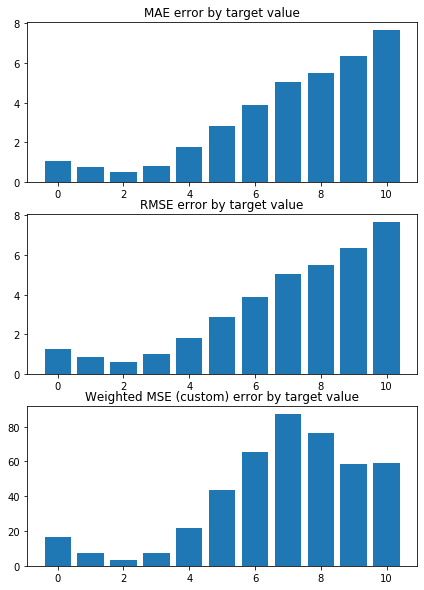

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1331488323983254 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0079416344382806 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


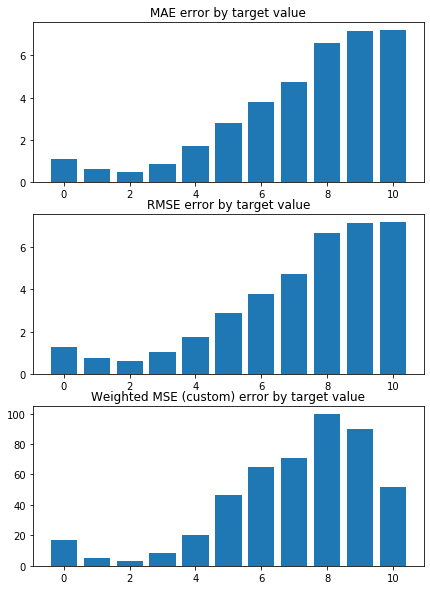

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9209676222300622 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0316063299735274 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


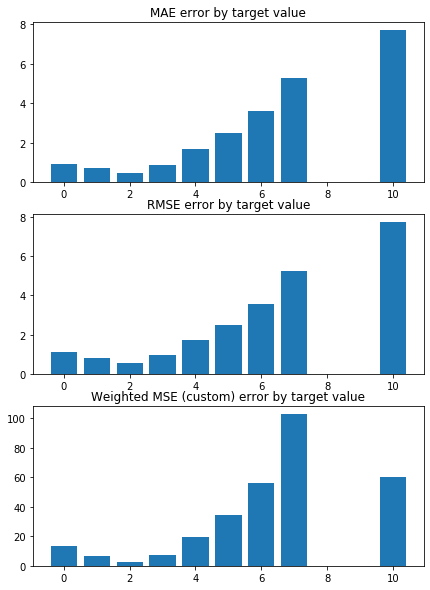

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.190811131485085 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1949614433312687 

Root of MSE on Test: 1.01 
 1.4815402267003313 

Variance score on Test: 0.06 
 r2_test: 0.25957976561033347 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 2.19
MSE_test 2.19
MAE_train 0.99
MAE_test 0.95
r2_test 0.26
    H3K4me1  H3K36me3       GAF      CTCF     Chriz   H3K4me2   H3K4me3  \
0 -0.105412 -0.104816 -0.095977 -0.082965 -0.081463 -0.074066 -0.071426   
1 -0.107869 -0.104933 -0.093403 -0.082659 -0.078260 -0.077897 -0.073148   
2 -0.107166 -0.105405 -0.102876 -0.081703 -0.079618 -0.076890 -0.073149   
3 -0.108988 -0.104850 -0.091737 -0.084037 -0.079426 -0.075549 -0.070581   
4 -0.104977 -0.105269 -0.095376 -0.083488 -0.081868 -0.074005 -0.070833   
5 -0.105211 -0.106327 -0.092679 -0.083116 -0.082426 -0.074730 -0.070655   
6 -0.107958 -0.104844 -0.092693 -0.083290 -0.078948 -0.076797 -0.073219   
7 -0.107326 -0.105028 -0.094553 -0

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


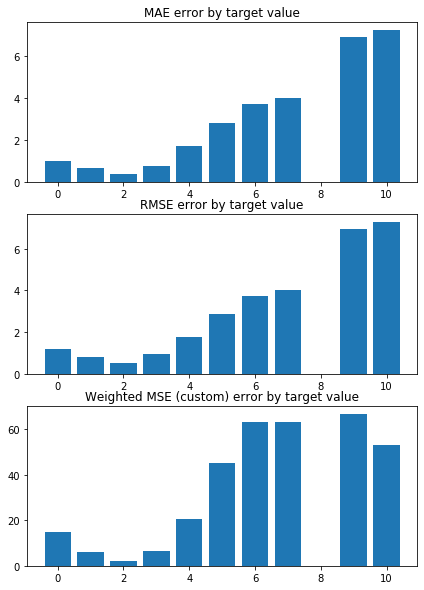

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9725437606167456 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0352278858584223 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


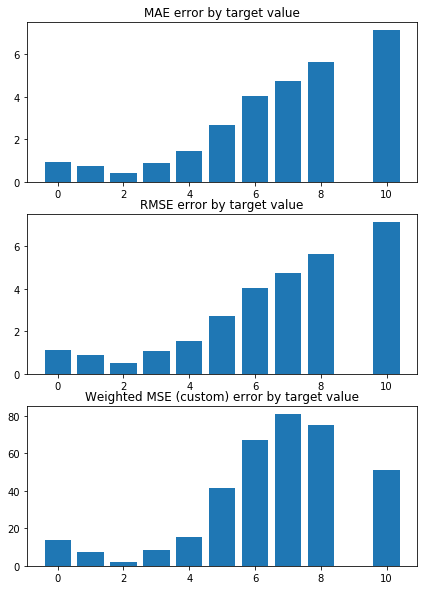

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9877605921347011 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0282504696999686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


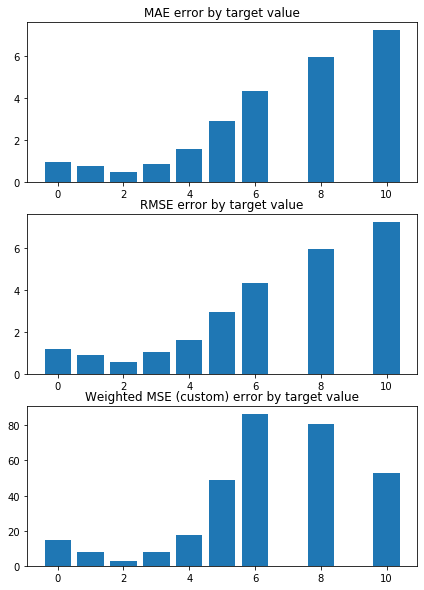

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.062591411963546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0163974910183404 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


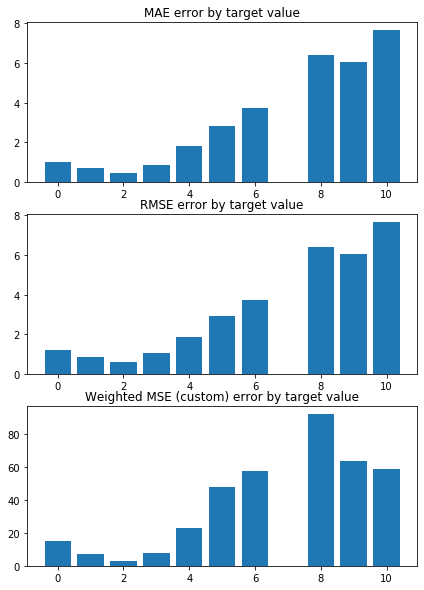

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0120652794042024 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0265756012239982 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


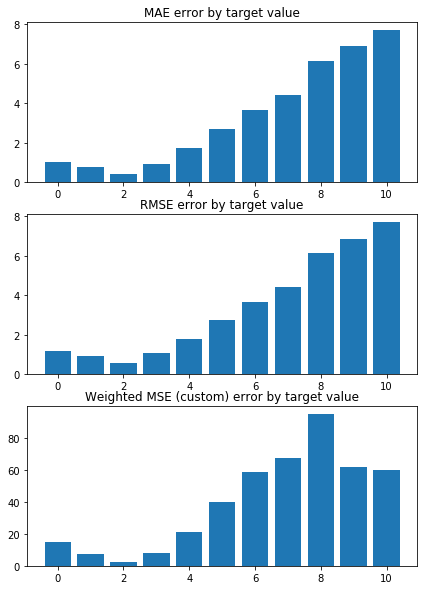

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0776914611754478 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0194603346858988 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


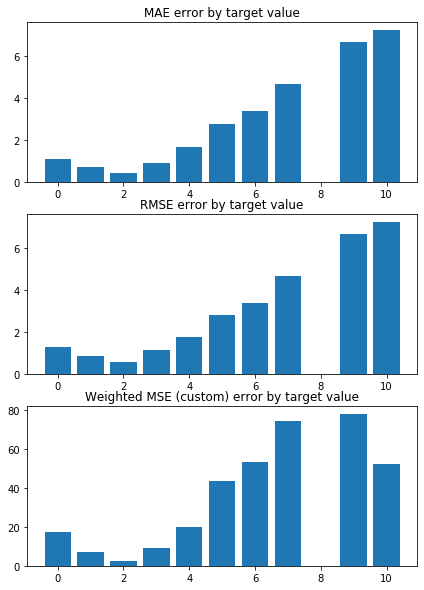

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0115223455672 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0273407302481183 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


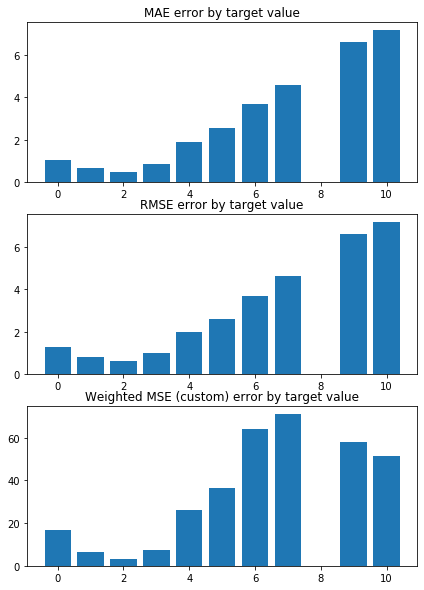

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1000890487750619 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0174728635939454 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


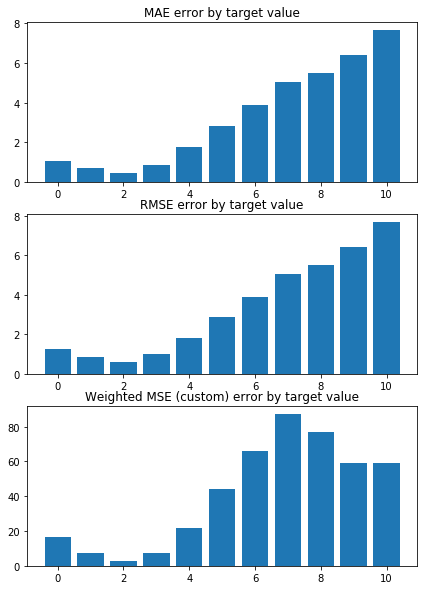

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1361160138179385 


 TRAIN PREDICTION Error
weighted_mse_train: 1.010429019514812 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


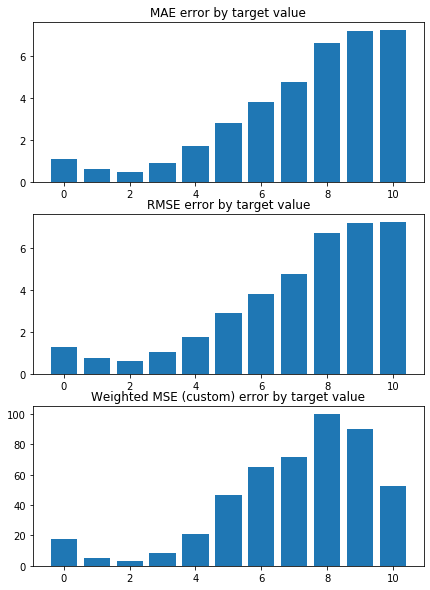

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9239186590222491 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0341914121928883 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


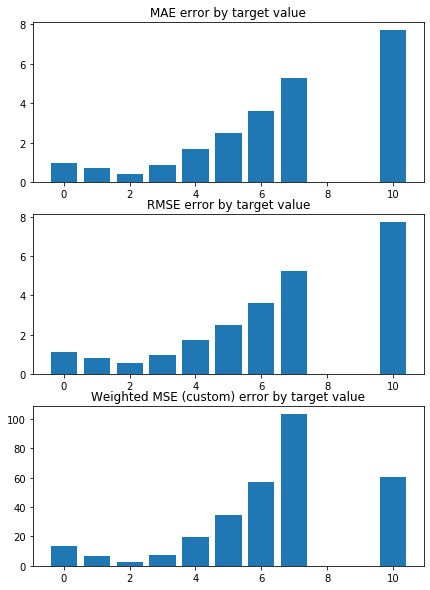

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.1982802098806196 

Mean squared error on Test: 1.03 
 MSE mean test:  2.2021822228625845 

Root of MSE on Test: 1.01 
 1.483975142265727 

Variance score on Test: 0.06 
 r2_test: 0.257120842514429 

wMSE_train 1.02
wMSE_test 1.03
MSE_train 2.2
MSE_test 2.2
MAE_train 0.99
MAE_test 0.95
r2_test 0.26
    H3K4me1  H3K36me3       GAF      CTCF     Chriz   H3K4me2   H3K4me3  \
0 -0.100583 -0.098685 -0.090051 -0.080630 -0.079168 -0.073366 -0.070493   
1 -0.102963 -0.098646 -0.087802 -0.080303 -0.076215 -0.076853 -0.072002   
2 -0.102344 -0.099160 -0.096515 -0.079608 -0.077525 -0.076000 -0.072098   
3 -0.103935 -0.098791 -0.086165 -0.081714 -0.077387 -0.074823 -0.069853   
4 -0.100353 -0.099059 -0.089512 -0.081168 -0.079517 -0.073382 -0.069980   
5 -0.100498 -0.100092 -0.086951 -0.080830 -0.080061 -0.074062 -0.069886   
6 -0.103071 -0.098678 -0.087078 -0.080974 -0.076926 -0.075908 -0.072106   
7 -0.102411 -0.098932 -0.088671 -0.080

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


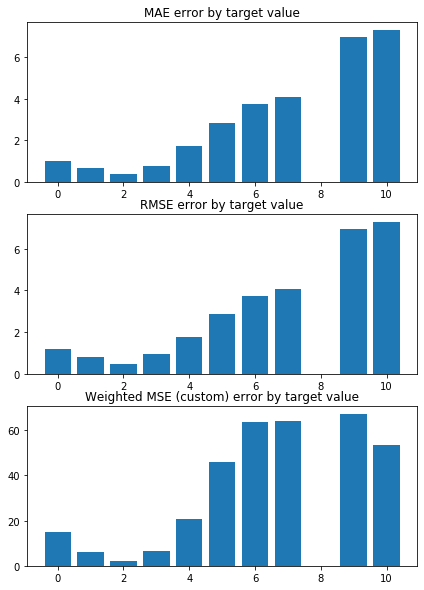

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9756539094631492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0378019241710872 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


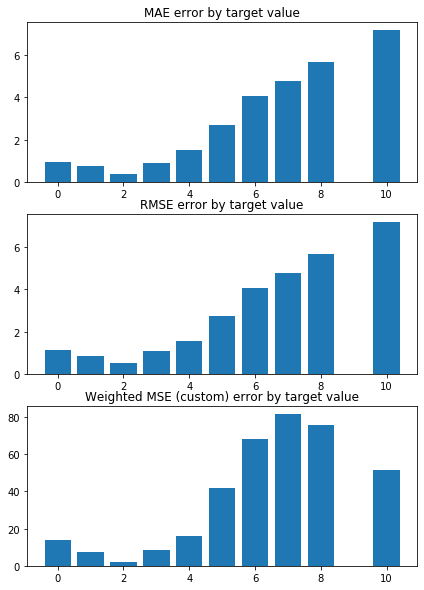

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9886397945025966 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0309334438237376 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


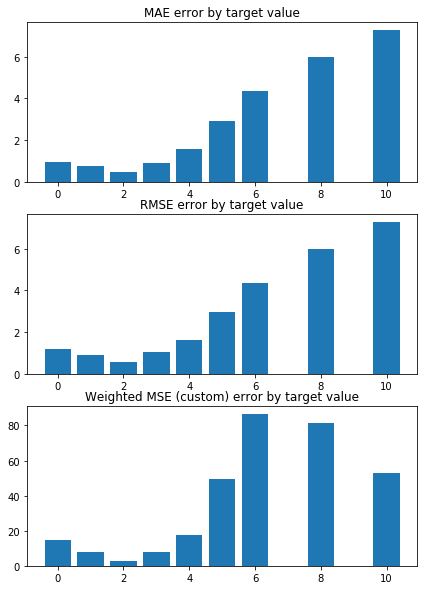

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0641682462179534 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0188698650657035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


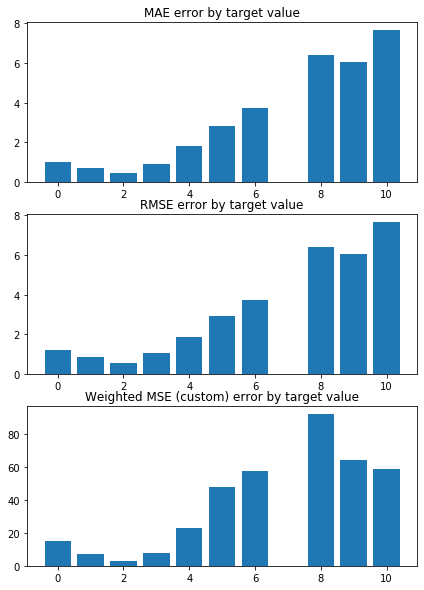

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0155950862597598 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0290621213028386 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


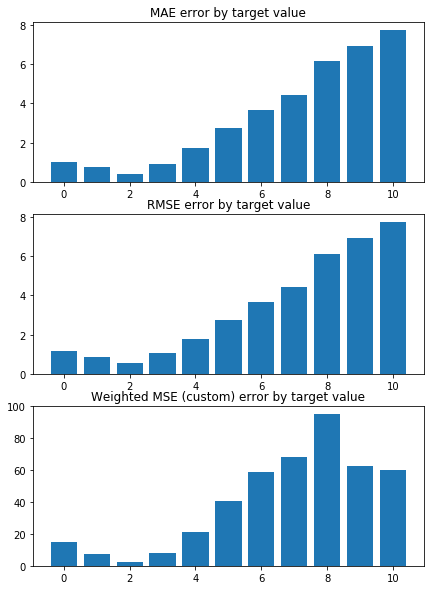

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.078595185335537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0221459590860227 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


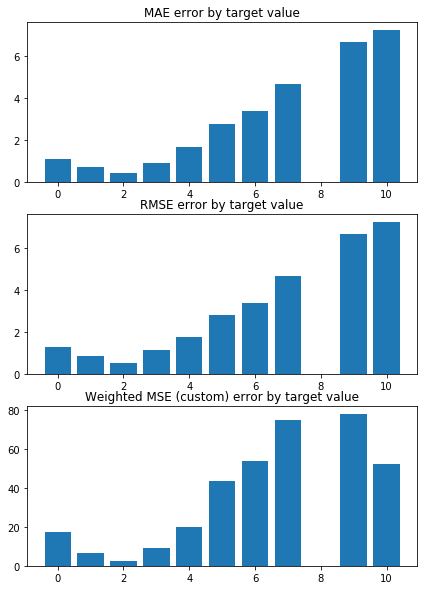

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0132101272692302 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0299464977740873 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


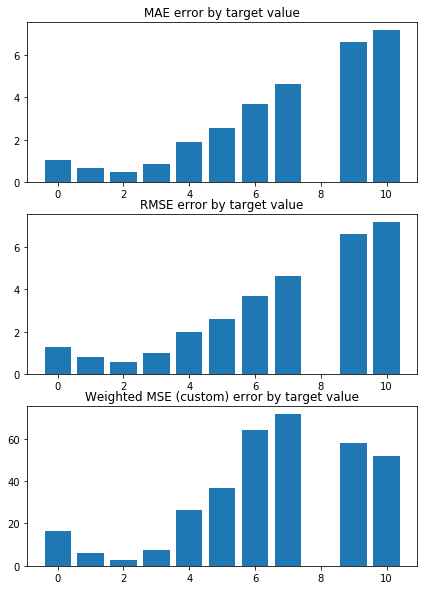

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.1028980658850287 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0199940477046991 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


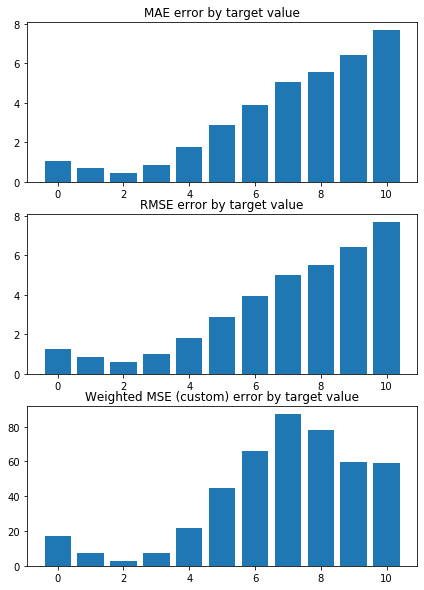

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1389570872196382 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0128957897885131 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


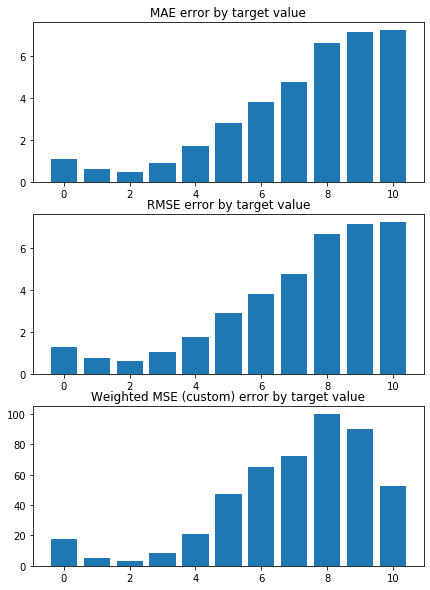

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9269528215871147 


 TRAIN PREDICTION Error
weighted_mse_train: 1.036730946826871 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


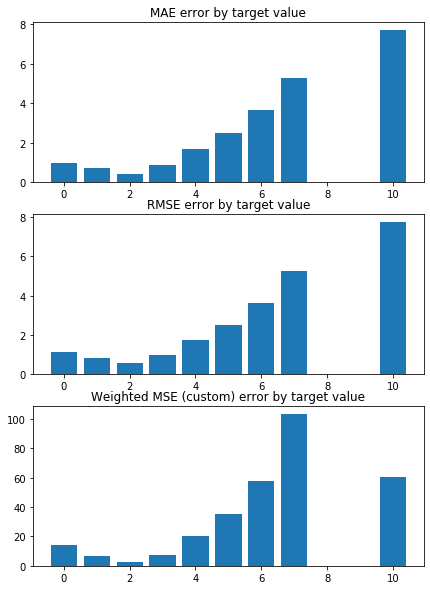

Weighted Mean squared error on Train: 1.03 
 MSE mean train: 2.20532258982625 

Mean squared error on Test: 1.03 
 MSE mean test:  2.209013548833965 

Root of MSE on Test: 1.01 
 1.4862750582694864 

Variance score on Test: 0.06 
 r2_test: 0.2547932300926995 

wMSE_train 1.03
wMSE_test 1.03
MSE_train 2.21
MSE_test 2.21
MAE_train 1.0
MAE_test 0.96
r2_test 0.25
    H3K4me1  H3K36me3       GAF      CTCF     Chriz   H3K4me2   H3K4me3  \
0 -0.096442 -0.093650 -0.085049 -0.078503 -0.077080 -0.072545 -0.069502   
1 -0.098742 -0.093503 -0.083055 -0.078163 -0.074333 -0.075751 -0.070842   
2 -0.098190 -0.094047 -0.091135 -0.077672 -0.075604 -0.075021 -0.071014   
3 -0.099608 -0.093820 -0.081461 -0.079600 -0.075515 -0.073984 -0.069031   
4 -0.096364 -0.093969 -0.084564 -0.079055 -0.077391 -0.072621 -0.069057   
5 -0.096446 -0.094973 -0.082130 -0.078743 -0.077918 -0.073266 -0.069026   
6 -0.098872 -0.093622 -0.082339 -0.078863 -0.075061 -0.074933 -0.070975   
7 -0.098195 -0.093925 -0.083715 -0.078

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.120658,0.282077,2.112345,0.030816,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3291707550677708, 0.3360826028625874, 0.264...",1.001215,0.062523,0.997839,0.007430
1,2.142389,0.283863,2.135602,0.031132,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3194598537822644, 0.32861264494364295, 0.26...",1.007421,0.063334,1.004701,0.007526
2,2.157325,0.284529,2.151431,0.031314,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3127544808171704, 0.3230281519835312, 0.257...",1.011888,0.063509,1.009534,0.007595
3,2.168935,0.284772,2.163658,0.031435,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30746631461880636, 0.318543288322953, 0.254...",1.015387,0.063459,1.013279,0.007649
4,2.178655,0.284806,2.173842,0.031522,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30298434733942115, 0.314711288502302, 0.252...",1.018370,0.063303,1.016443,0.007692
5,2.187199,0.284720,2.182751,0.031590,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29901374806731174, 0.3112915834224469, 0.25...",1.021075,0.063091,1.019290,0.007729
6,2.194961,0.284559,2.190811,0.031644,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29539178124624876, 0.30814614381958283, 0.2...",1.023637,0.062847,1.021966,0.007760
7,2.202182,0.284346,2.198280,0.031688,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29202041244294186, 0.30519104432693467, 0.2...",1.026133,0.062584,1.024556,0.007788
8,2.209014,0.284099,2.205323,0.031725,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2888368773180078, 0.30237290909332704, 0.24...",1.028610,0.062311,1.027113,0.007813


In [99]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(1000, 10000, 1000)
# Create linear regression object



model_name = 'LR+L2_grid10000'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

In [100]:
results_pd_gr

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.120658,0.282077,2.112345,0.030816,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3291707550677708, 0.3360826028625874, 0.264...",1.001215,0.062523,0.997839,0.007430
1,2.142389,0.283863,2.135602,0.031132,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3194598537822644, 0.32861264494364295, 0.26...",1.007421,0.063334,1.004701,0.007526
2,2.157325,0.284529,2.151431,0.031314,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.3127544808171704, 0.3230281519835312, 0.257...",1.011888,0.063509,1.009534,0.007595
3,2.168935,0.284772,2.163658,0.031435,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30746631461880636, 0.318543288322953, 0.254...",1.015387,0.063459,1.013279,0.007649
4,2.178655,0.284806,2.173842,0.031522,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.30298434733942115, 0.314711288502302, 0.252...",1.018370,0.063303,1.016443,0.007692
5,2.187199,0.284720,2.182751,0.031590,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29901374806731174, 0.3112915834224469, 0.25...",1.021075,0.063091,1.019290,0.007729
6,2.194961,0.284559,2.190811,0.031644,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29539178124624876, 0.30814614381958283, 0.2...",1.023637,0.062847,1.021966,0.007760
7,2.202182,0.284346,2.198280,0.031688,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.29202041244294186, 0.30519104432693467, 0.2...",1.026133,0.062584,1.024556,0.007788
8,2.209014,0.284099,2.205323,0.031725,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2888368773180078, 0.30237290909332704, 0.24...",1.028610,0.062311,1.027113,0.007813


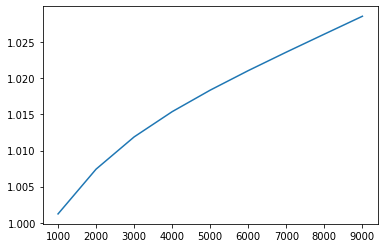

In [101]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9502539618044549 


 TRAIN PREDICTION Error
weighted_mse_train: 1.015350660689337 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


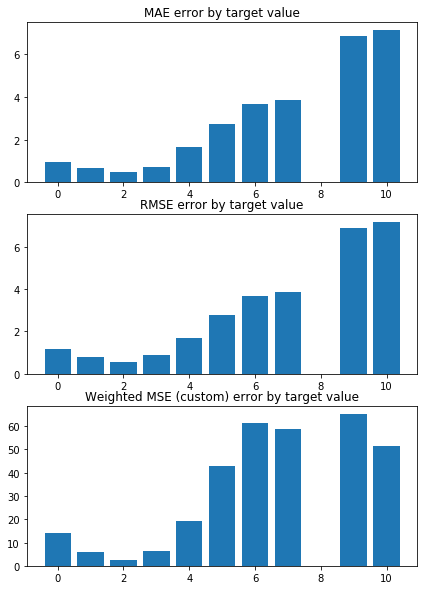

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9555549990038551 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0201907803364554 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


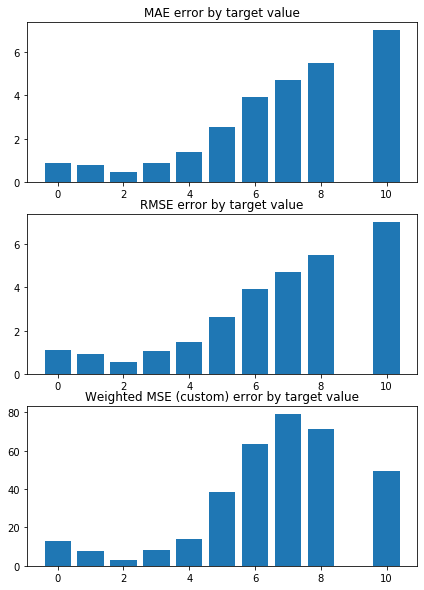

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9843856419699286 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0124435318386762 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


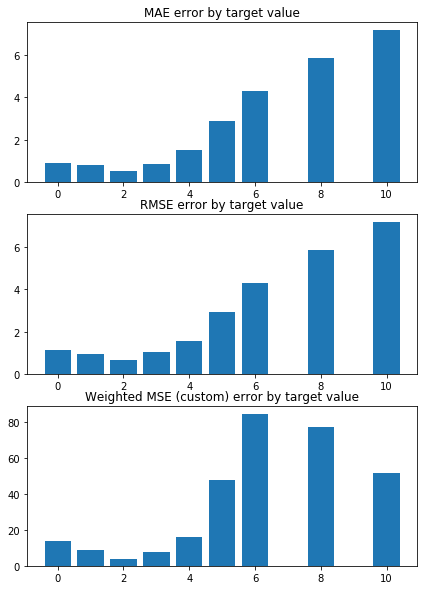

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0529353379601567 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0018388244180871 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


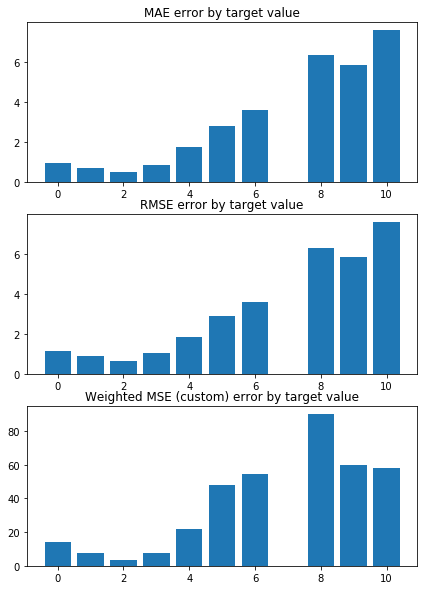

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.991460012988327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0118715903425601 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


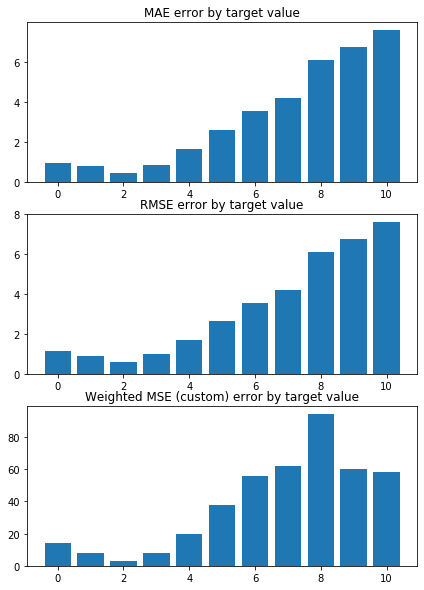

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0743495870530873 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0034963227047782 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


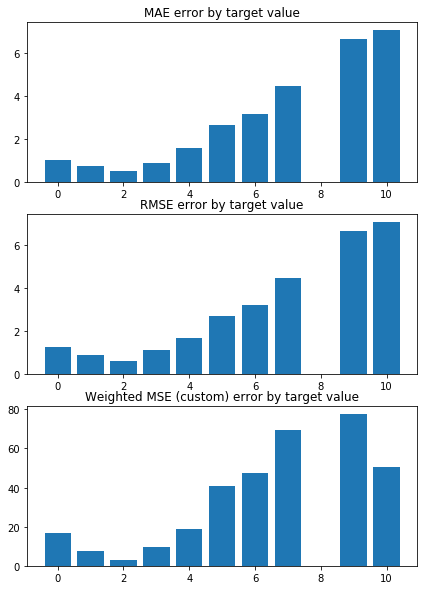

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.999451096212552 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0122186847955494 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


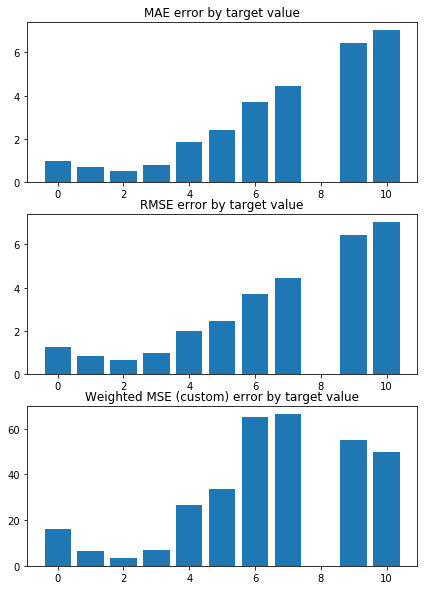

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0828722464645235 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0027492902253483 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


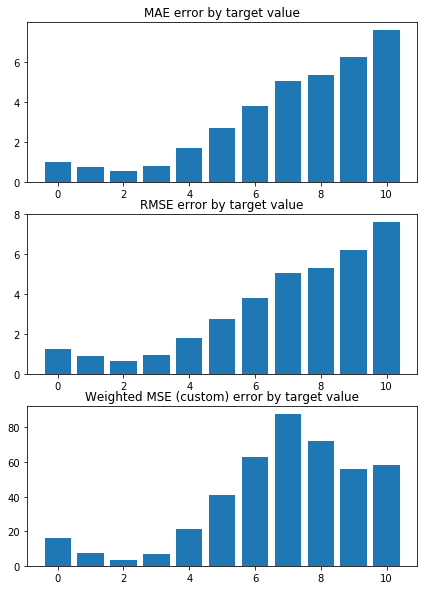

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1172489659400453 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9962060105297035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


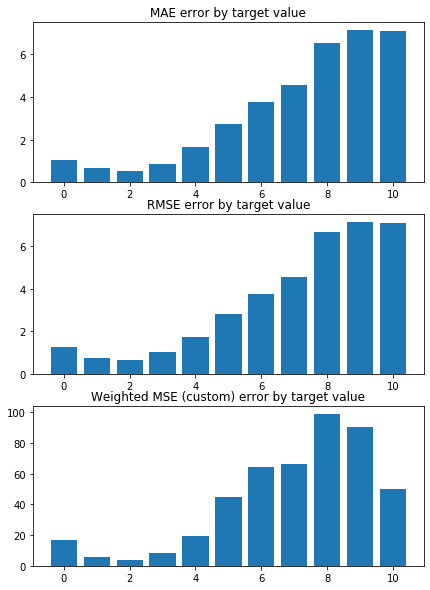

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9103653757017264 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0189697122716808 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


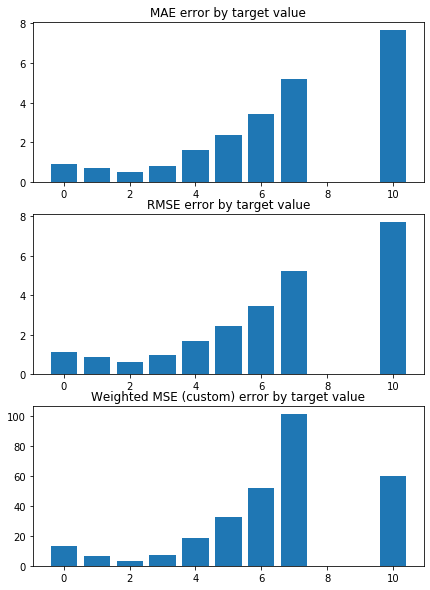

Weighted Mean squared error on Train: 1.01 
 MSE mean train: 2.151430986098384 

Mean squared error on Test: 1.01 
 MSE mean test:  2.157325028782266 

Root of MSE on Test: 1.01 
 1.468783520054016 

Variance score on Test: 0.06 
 r2_test: 0.272366731919226 

wMSE_train 1.01
wMSE_test 1.01
MSE_train 2.15
MSE_test 2.16
MAE_train 0.98
MAE_test 0.94
r2_test 0.27
   H3K36me3   H3K4me1       GAF      CTCF     Chriz  H3K36me1  H3K27me3  \
0 -0.157415 -0.140156 -0.139456 -0.095960 -0.094285 -0.084316 -0.083188   
1 -0.159610 -0.142564 -0.133878 -0.095967 -0.089044 -0.092604 -0.088258   
2 -0.159543 -0.141009 -0.149099 -0.092538 -0.090821 -0.094709 -0.088437   
3 -0.157216 -0.145518 -0.132590 -0.097177 -0.090455 -0.086068 -0.088138   
4 -0.158997 -0.137332 -0.138523 -0.096403 -0.095477 -0.091098 -0.090830   
5 -0.159771 -0.138722 -0.135237 -0.095701 -0.095849 -0.088958 -0.084479   
6 -0.158005 -0.142744 -0.134029 -0.096181 -0.089359 -0.083360 -0.086158   
7 -0.157214 -0.142632 -0.138065 -0.095

In [102]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=3000)


model_name = 'LR+L2_alf=3000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)



wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [103]:
coefs_argsort, np.sort(coefs)

(array([[15,  6,  5,  1,  0, 14, 13,  2,  8,  7, 17,  3, 10,  9,  4, 12,
         16, 11],
        [15,  6,  5,  1, 14,  0, 13,  7,  8,  2, 17,  3, 10,  9,  4, 12,
         16, 11],
        [15,  5,  6, 14,  1,  0, 13,  7,  8, 17,  2,  3, 10,  9,  4, 12,
         16, 11],
        [15,  6,  5,  1,  0, 13, 14,  2,  7,  8, 17,  3, 10,  9,  4, 12,
         11, 16],
        [15,  5,  6,  1,  0, 14, 13,  2,  7,  8, 17,  3, 10,  9,  4, 12,
         11, 16],
        [15,  6,  5,  0,  1, 14,  2, 13,  7,  8, 17,  3,  9, 10,  4, 12,
         16, 11],
        [15,  6,  5,  1,  0, 13, 14,  2,  7,  8, 17,  3,  9, 10,  4, 12,
         16, 11],
        [15,  6,  5,  1,  0, 13, 14,  2,  8,  7, 17,  3, 10,  9,  4, 12,
         11, 16],
        [15,  6,  5,  1,  0, 13, 14,  7,  8,  2, 17,  3, 10,  9,  4, 12,
         16, 11],
        [15,  6,  5,  1,  0, 13, 14,  2,  8,  7, 17,  3,  9, 10,  4, 12,
         11, 16]]), array([[-1.57415346e-01, -1.40156097e-01, -1.39456391e-01,
         -9.59604738e-02, -9.

In [104]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K36me3', 'H3K4me1', 'GAF', 'CTCF', 'Chriz', 'H3K36me1', 'H3K27me3',
       'Su(Hw)', 'H3K4me3', 'H3K4me2', 'RNA-polymerase-II', 'BEAF-32',
       'H3K9me3', 'H3K9me2', 'CP190', 'H3K27me1', 'H4K16ac', 'H3K27ac'],
      dtype='object')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS  + L2

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9419128146611855 


 TRAIN PREDICTION Error
weighted_mse_train: 1.01059367056502 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


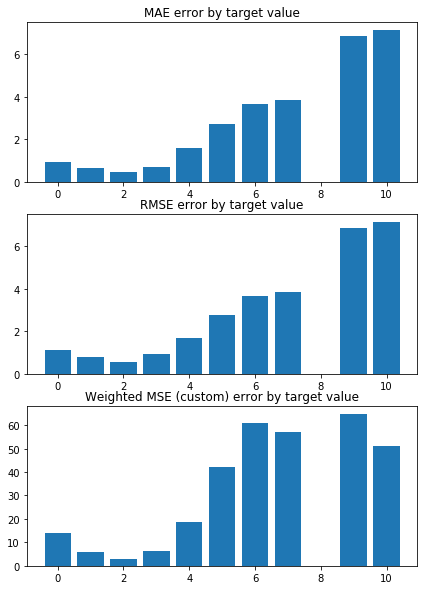

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9507349283251577 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0153413019764712 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


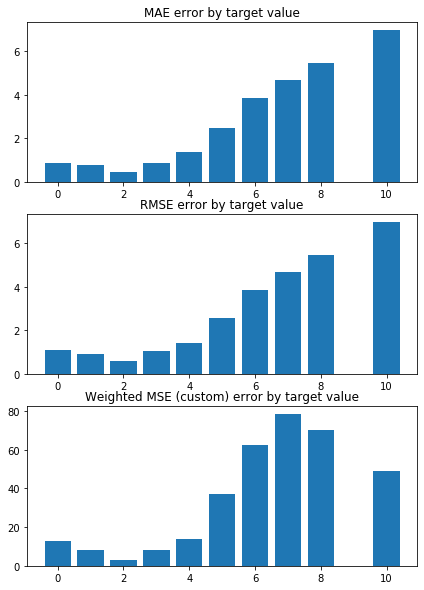

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9831199559474335 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0073939157160898 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


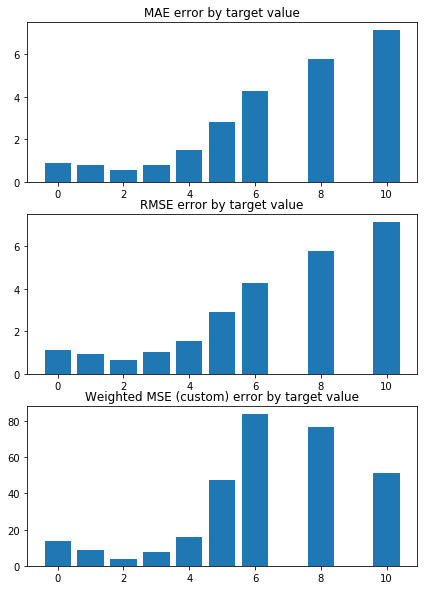

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0496876248149176 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9970196473047153 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


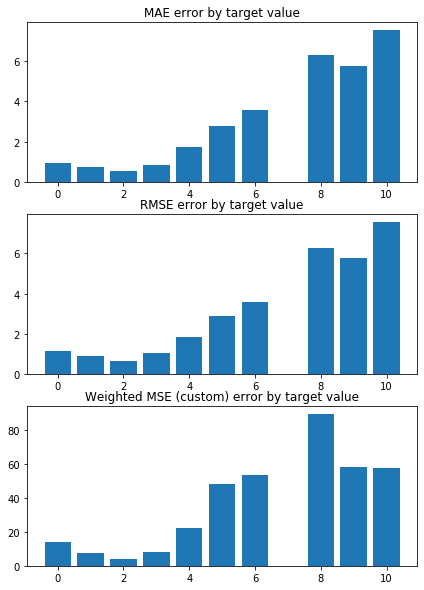

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9852553303307036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0070829707192048 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


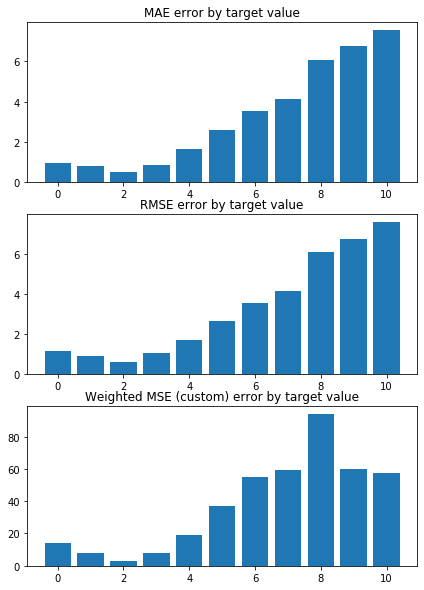

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073506050992366 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9983878947384167 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


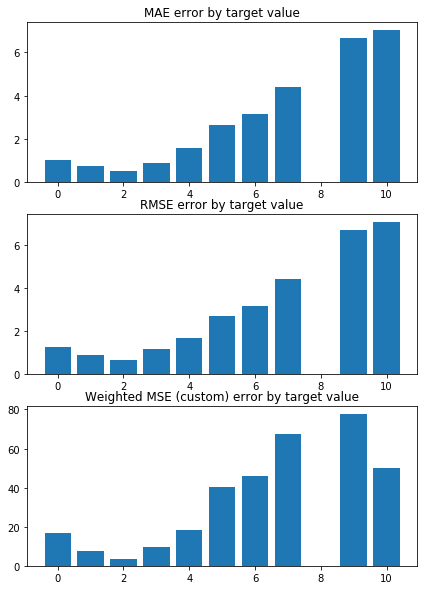

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9941224291649259 


 TRAIN PREDICTION Error
weighted_mse_train: 1.007438321901315 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


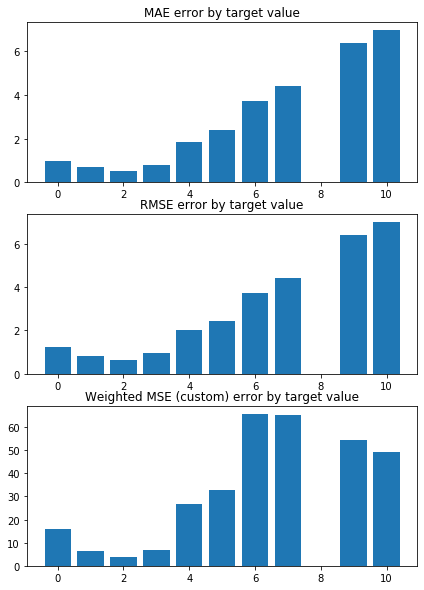

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0771528496496454 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9980536786748413 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


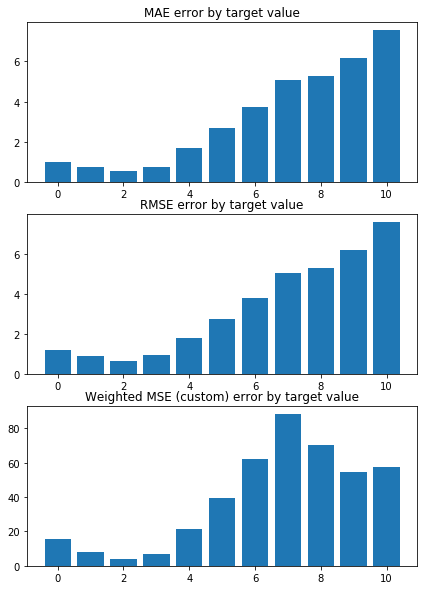

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1101675013642216 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9917114886541935 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


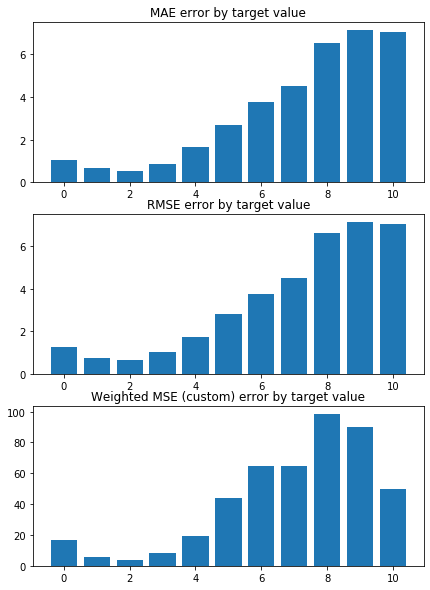

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9085510655450768 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0139862650901406 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


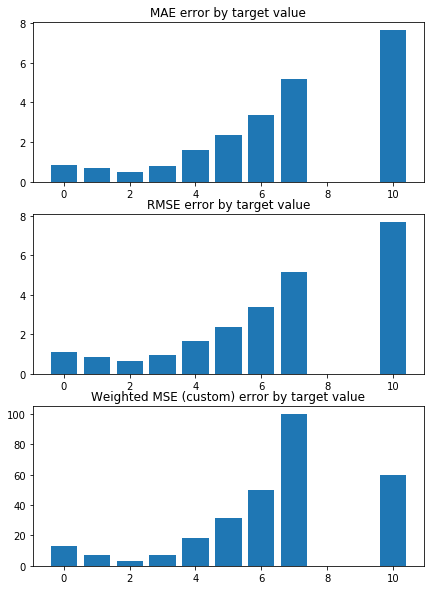

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.1356017010965713 

Mean squared error on Test: 1.01 
 MSE mean test:  2.142389267232855 

Root of MSE on Test: 1.00 
 1.4636902907489873 

Variance score on Test: 0.06 
 r2_test: 0.2774242170867092 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.14
MSE_test 2.14
MAE_train 0.98
MAE_test 0.94
r2_test 0.28
   H3K36me3       GAF   H3K4me1  H3K27me3      CTCF     Chriz  H3K36me1  \
0 -0.192662 -0.162756 -0.159681 -0.103120 -0.101094 -0.099394 -0.098007   
1 -0.196729 -0.155241 -0.161619 -0.109110 -0.101353 -0.092838 -0.107784   
2 -0.196107 -0.173659 -0.159415 -0.109639 -0.096243 -0.094877 -0.110732   
3 -0.192706 -0.154437 -0.166186 -0.108985 -0.102568 -0.094660 -0.099281   
4 -0.195361 -0.161757 -0.154905 -0.112353 -0.101506 -0.101266 -0.106434   
5 -0.195462 -0.158400 -0.157313 -0.104944 -0.100580 -0.101260 -0.103374   
6 -0.193805 -0.156364 -0.162041 -0.107102 -0.101264 -0.092728 -0.095788   
7 -0.192081 -0.161615 -0.162457 -0.1

In [105]:
%%time
n_splits=10
random_state=16

X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=2000)

model_name = 'LR+L2_alf=2000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_test.append(np.mean(weighted_mse_test_all))
wmse_train.append(np.mean(weighted_mse_train_all))


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [106]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."


In [107]:
wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.0047009155340407 1.0074210550795635


In [108]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K36me3', 'GAF', 'H3K4me1', 'H3K27me3', 'CTCF', 'Chriz', 'H3K36me1',
       'Su(Hw)', 'H3K4me3', 'H3K4me2', 'BEAF-32', 'RNA-polymerase-II',
       'H3K9me3', 'H4K16ac', 'H3K9me2', 'CP190', 'H3K27me1', 'H3K27ac'],
      dtype='object')

In [109]:
su_drsc.columns[2:], coefs

(Index(['Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190', 'GAF', 'H3K4me1',
        'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac', 'H3K27me1',
        'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac', 'RNA-polymerase-II'],
       dtype='object'),
 array([[-9.93944357e-02, -1.01094061e-01,  9.15089389e-02,
         -5.87624151e-02, -1.84567721e-02, -1.62755794e-01,
         -1.59680731e-01, -6.88914948e-02, -7.12300118e-02,
         -2.19401191e-02, -2.75841473e-02, -6.20833063e-05,
         -5.31963451e-03, -1.03120130e-01, -9.80067216e-02,
         -1.92662123e-01,  2.41094352e-02, -5.82883878e-02],
        [-9.28378778e-02, -1.01353193e-01,  8.20659910e-02,
         -6.86567116e-02, -1.80736271e-02, -1.55241020e-01,
         -1.61618964e-01, -7.76281706e-02, -7.61917411e-02,
         -1.41219440e-02, -2.24878930e-02, -2.04855689e-03,
         -8.09696670e-03, -1.09109779e-01, -1.07783798e-01,
         -1.96729078e-01,  2.89242809e-02, -6.19555380e-02],
        [-9.48769931e-02, -9.

In [110]:
coefs_argsort

array([[15,  5,  6, 13,  1,  0, 14,  2,  8,  7,  3, 17, 10, 16,  9,  4,
        12, 11],
       [15,  6,  5, 13, 14,  1,  0,  2,  7,  8,  3, 17, 16, 10,  4,  9,
        12, 11],
       [15,  5,  6, 14, 13,  1,  0,  2,  8,  7, 17,  3, 16, 10,  4,  9,
        12, 11],
       [15,  6,  5, 13,  1, 14,  0,  2,  7,  8,  3, 17, 10, 16,  9,  4,
        12, 11],
       [15,  5,  6, 13, 14,  1,  0,  2,  8,  3,  7, 17, 10, 16,  9,  4,
        12, 11],
       [15,  5,  6, 13, 14,  0,  1,  2,  7,  8, 17,  3,  9,  4, 10, 16,
        12, 11],
       [15,  6,  5, 13,  1,  2, 14,  0,  8,  7,  3, 17, 16, 10,  9, 12,
         4, 11],
       [15,  6,  5, 13,  2,  1, 14,  0,  8,  7,  3, 17, 10, 16,  9,  4,
        12, 11],
       [15,  6,  5, 13,  1, 14,  0,  2,  8,  7,  3, 17, 10, 16,  9,  4,
        12, 11],
       [15,  5,  6, 13, 14,  1,  2,  0,  8,  7,  3, 17, 16,  9, 10,  4,
        12, 11]])

In [111]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K36me3', 'GAF', 'H3K4me1', 'H3K27me3', 'CTCF', 'Chriz', 'H3K36me1',
       'Su(Hw)', 'H3K4me3', 'H3K4me2', 'BEAF-32', 'RNA-polymerase-II',
       'H3K9me3', 'H4K16ac', 'H3K9me2', 'CP190', 'H3K27me1', 'H3K27ac'],
      dtype='object')

In [112]:
coefs

array([[-9.93944357e-02, -1.01094061e-01,  9.15089389e-02,
        -5.87624151e-02, -1.84567721e-02, -1.62755794e-01,
        -1.59680731e-01, -6.88914948e-02, -7.12300118e-02,
        -2.19401191e-02, -2.75841473e-02, -6.20833063e-05,
        -5.31963451e-03, -1.03120130e-01, -9.80067216e-02,
        -1.92662123e-01,  2.41094352e-02, -5.82883878e-02],
       [-9.28378778e-02, -1.01353193e-01,  8.20659910e-02,
        -6.86567116e-02, -1.80736271e-02, -1.55241020e-01,
        -1.61618964e-01, -7.76281706e-02, -7.61917411e-02,
        -1.41219440e-02, -2.24878930e-02, -2.04855689e-03,
        -8.09696670e-03, -1.09109779e-01, -1.07783798e-01,
        -1.96729078e-01,  2.89242809e-02, -6.19555380e-02],
       [-9.48769931e-02, -9.62427771e-02,  7.90339995e-02,
        -6.44121092e-02, -1.84133022e-02, -1.73658913e-01,
        -1.59414806e-01, -7.41861967e-02, -7.52147410e-02,
        -1.73457058e-02, -2.36792571e-02,  2.48175568e-03,
        -9.83487453e-03, -1.09638936e-01, -1.10732030e

In [113]:
coefs_argsort, su_drsc.columns[2:][coefs_argsort[0]], np.sort(coefs)

(array([[15,  5,  6, 13,  1,  0, 14,  2,  8,  7,  3, 17, 10, 16,  9,  4,
         12, 11],
        [15,  6,  5, 13, 14,  1,  0,  2,  7,  8,  3, 17, 16, 10,  4,  9,
         12, 11],
        [15,  5,  6, 14, 13,  1,  0,  2,  8,  7, 17,  3, 16, 10,  4,  9,
         12, 11],
        [15,  6,  5, 13,  1, 14,  0,  2,  7,  8,  3, 17, 10, 16,  9,  4,
         12, 11],
        [15,  5,  6, 13, 14,  1,  0,  2,  8,  3,  7, 17, 10, 16,  9,  4,
         12, 11],
        [15,  5,  6, 13, 14,  0,  1,  2,  7,  8, 17,  3,  9,  4, 10, 16,
         12, 11],
        [15,  6,  5, 13,  1,  2, 14,  0,  8,  7,  3, 17, 16, 10,  9, 12,
          4, 11],
        [15,  6,  5, 13,  2,  1, 14,  0,  8,  7,  3, 17, 10, 16,  9,  4,
         12, 11],
        [15,  6,  5, 13,  1, 14,  0,  2,  8,  7,  3, 17, 10, 16,  9,  4,
         12, 11],
        [15,  5,  6, 13, 14,  1,  2,  0,  8,  7,  3, 17, 16,  9, 10,  4,
         12, 11]]),
 Index(['H3K36me3', 'GAF', 'H3K4me1', 'H3K27me3', 'CTCF', 'Chriz', 'H3K36me1',
        '

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L1  + L2/1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2578485026798416 


 TRAIN PREDICTION Error
weighted_mse_train: 1.250443550044382 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


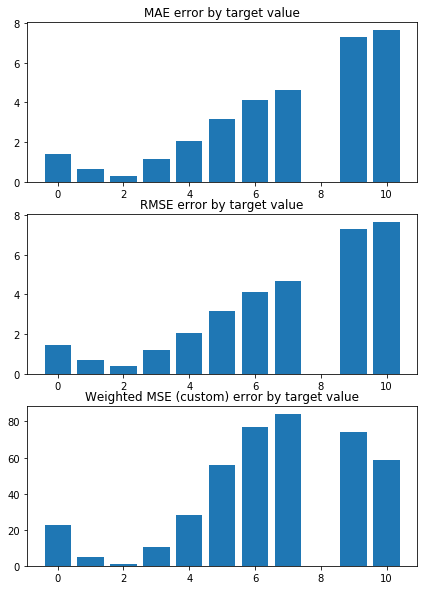

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2425268236855547 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2574573606750803 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


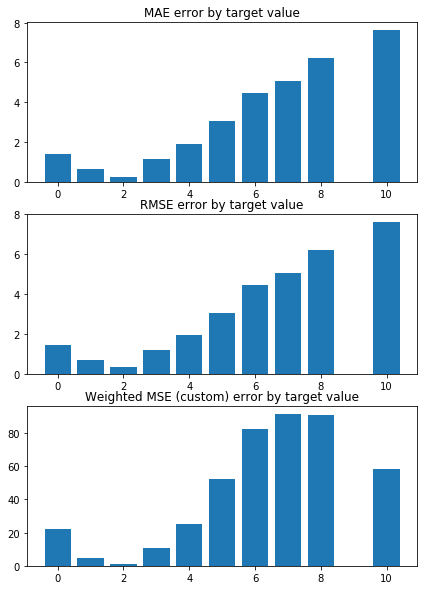

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1672138810373098 


 TRAIN PREDICTION Error
weighted_mse_train: 1.252311040646215 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


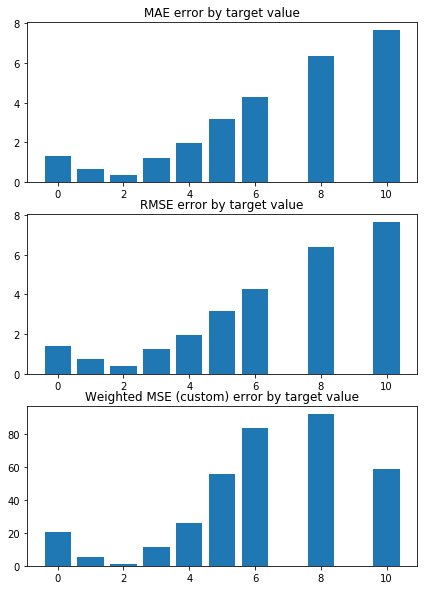

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2360241271345982 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2324939972440039 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


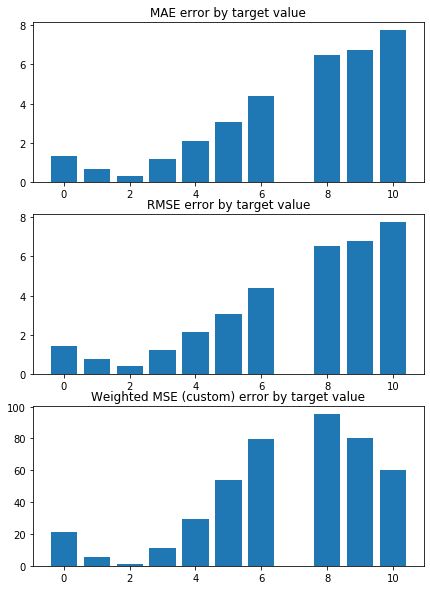

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2640817471097123 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2438872556423541 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


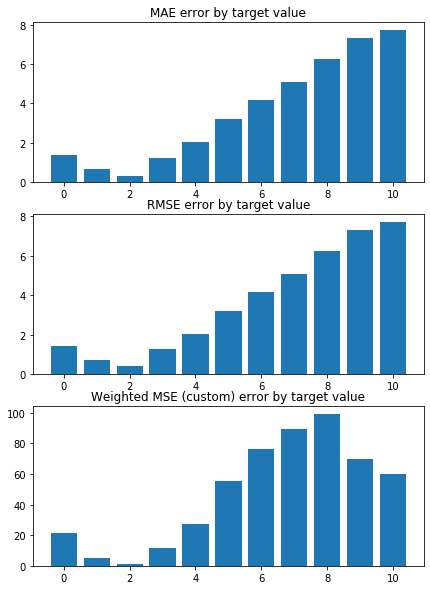

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.235059042012715 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2416850752022814 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


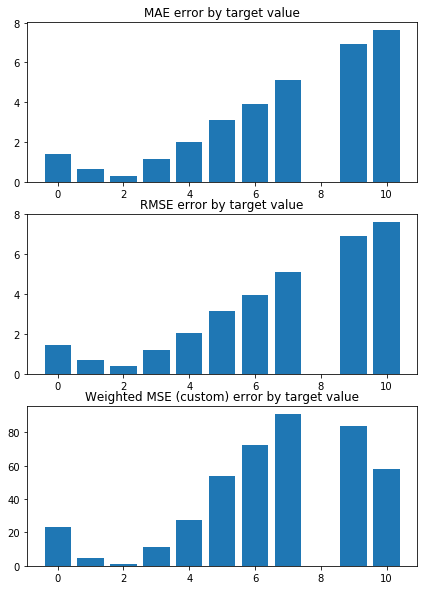

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1964506899871203 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2513217401891465 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


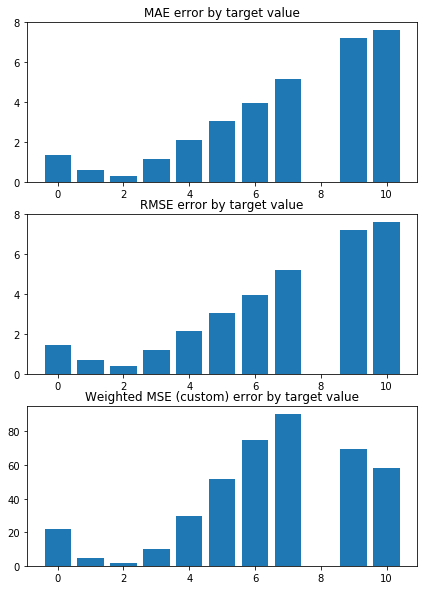

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.328467543719822 


 TRAIN PREDICTION Error
weighted_mse_train: 1.236885539016078 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


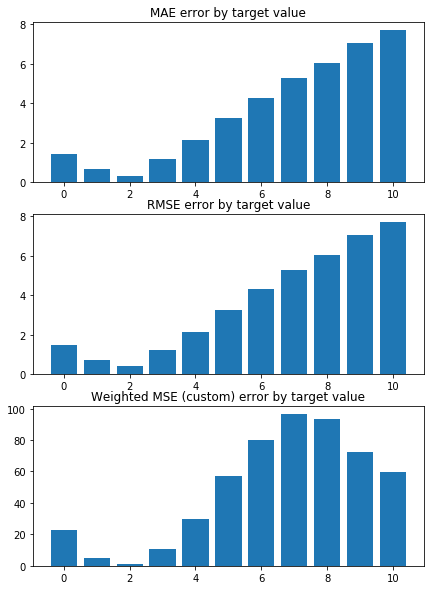

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3481964425902395 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2267220200894189 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


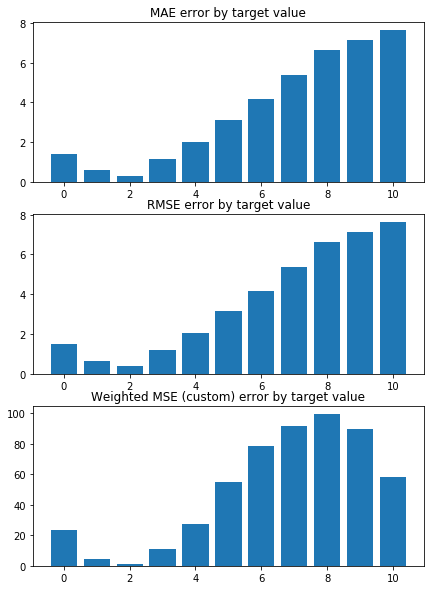

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.180884611843036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2500264581523999 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


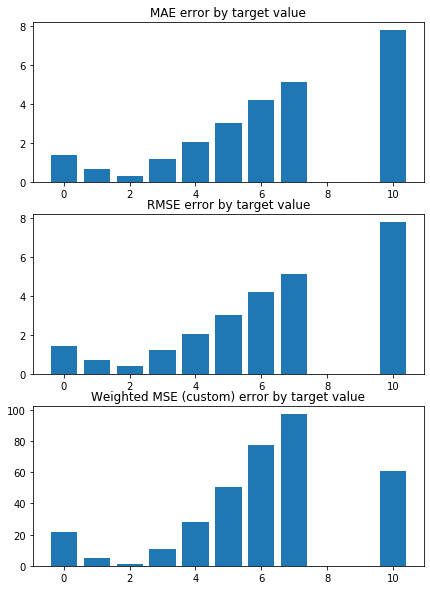

Weighted Mean squared error on Train: 1.24 
 MSE mean train: 2.559190169496129 

Mean squared error on Test: 1.25 
 MSE mean test:  2.561263705860604 

Root of MSE on Test: 1.12 
 1.600394859358341 

Variance score on Test: 0.06 
 r2_test: 0.13436935638650194 

wMSE_train 1.24
wMSE_test 1.25
MSE_train 2.56
MSE_test 2.56
MAE_train 1.14
MAE_test 1.12
r2_test 0.13
    H3K4me2   H3K4me1  RNA-polymerase-II      CTCF  H3K36me3     Chriz  \
0 -0.084967 -0.068528          -0.057183 -0.028644 -0.021555 -0.017474   
1 -0.095073 -0.073497          -0.062458 -0.024525 -0.017717 -0.003782   
2 -0.089982 -0.070025          -0.064584 -0.028223 -0.020988 -0.009446   
3 -0.089793 -0.075725          -0.062070 -0.036068 -0.023726 -0.010564   
4 -0.086618 -0.071233          -0.058857 -0.034060 -0.021037 -0.016909   
5 -0.089147 -0.068392          -0.065934 -0.029546 -0.023659 -0.016707   
6 -0.091468 -0.076735          -0.062760 -0.030131 -0.017956 -0.008643   
7 -0.087604 -0.073587          -0.058993 -0.

In [114]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.ElasticNet()

model_name = 'LR+L1+L2'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [115]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."


In [116]:
weighted_mse_train_all, weighted_mse_test_all

(array([1.25044355, 1.25745736, 1.25231104, 1.232494  , 1.24388726,
        1.24168508, 1.25132174, 1.23688554, 1.22672202, 1.25002646]),
 array([1.2578485 , 1.24252682, 1.16721388, 1.23602413, 1.26408175,
        1.23505904, 1.19645069, 1.32846754, 1.34819644, 1.18088461]))

In [117]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


wmse_mean_train, wmse_mean_test = 1.2443234036901358 1.245675341179995


KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9764887450565142 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0233306004245073 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


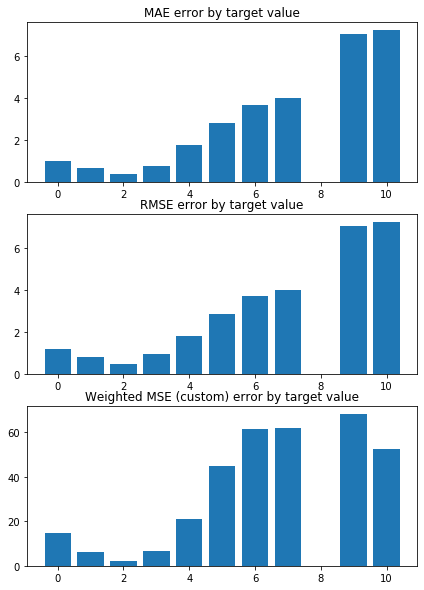

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.966341900507572 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0306541737981716 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


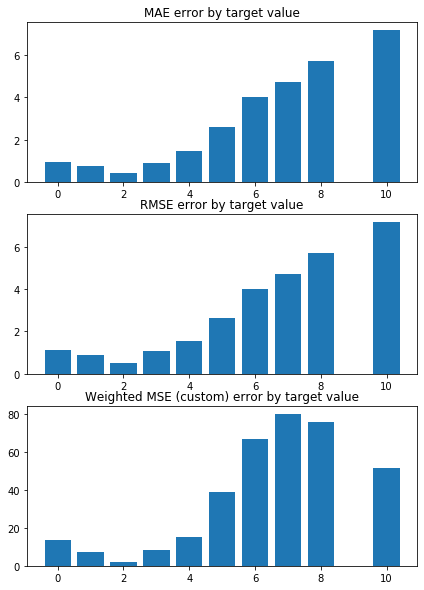

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9823603310205093 


 TRAIN PREDICTION Error
weighted_mse_train: 1.022451256561581 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


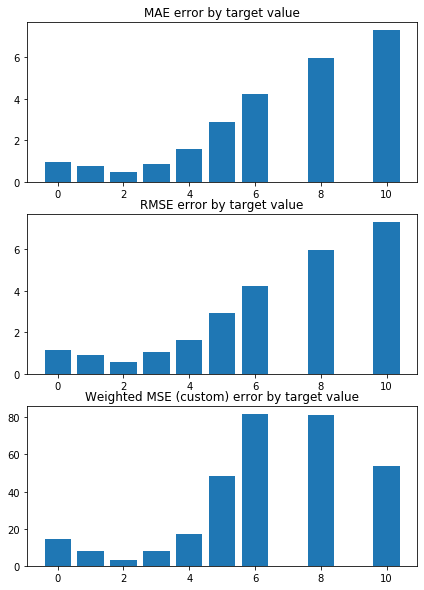

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0684493156261154 


 TRAIN PREDICTION Error
weighted_mse_train: 1.009999879241158 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


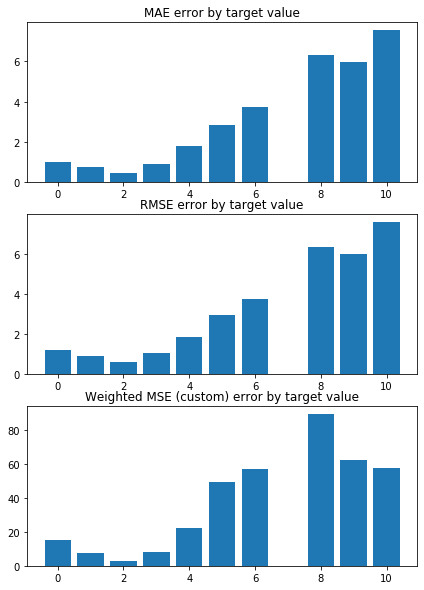

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0020742404272516 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0202000518502183 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


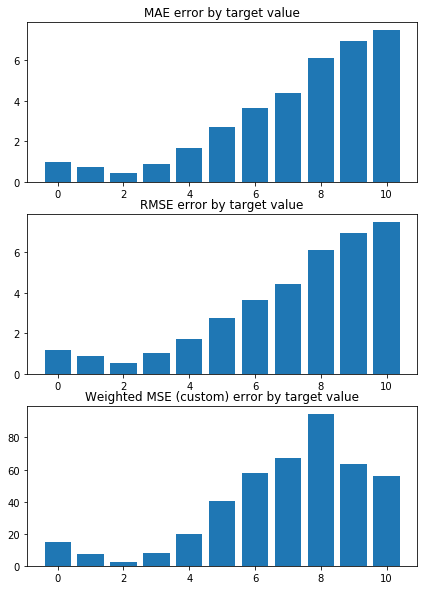

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0720125881951932 


 TRAIN PREDICTION Error
weighted_mse_train: 1.011640449867362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


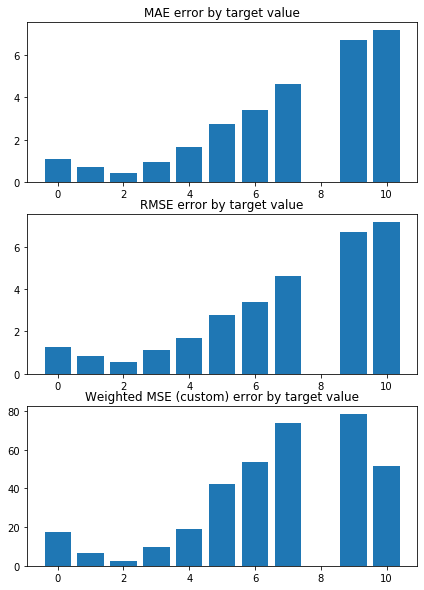

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0025430927461692 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0213759850457491 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


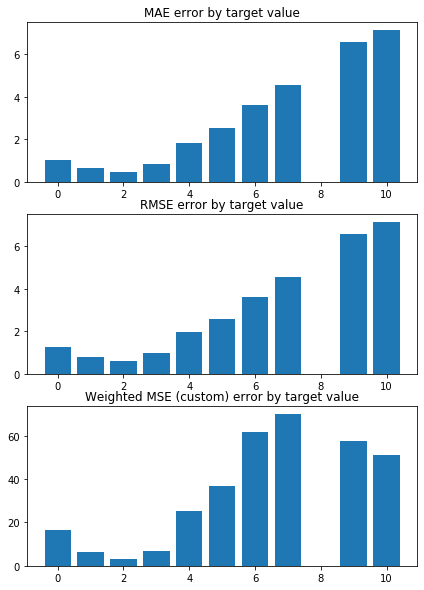

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.0923623456590597 


 TRAIN PREDICTION Error
weighted_mse_train: 1.010818300283312 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


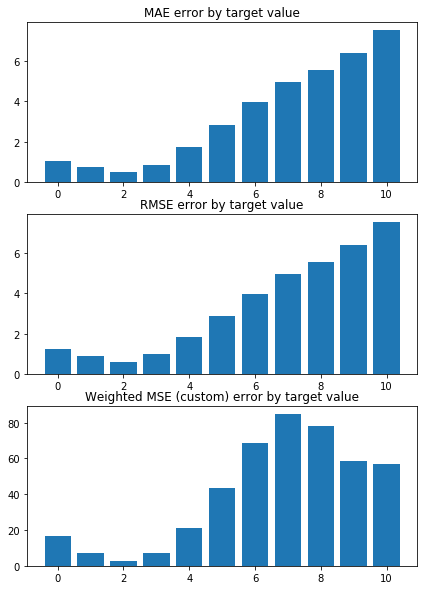

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.127024587977927 


 TRAIN PREDICTION Error
weighted_mse_train: 1.006227453976715 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


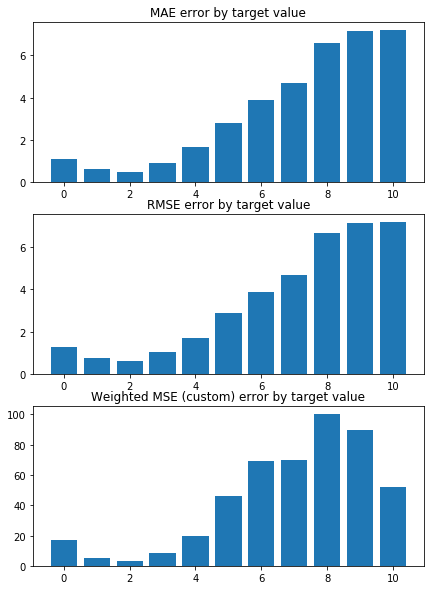

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9218407824032201 


 TRAIN PREDICTION Error
weighted_mse_train: 1.026351306734122 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


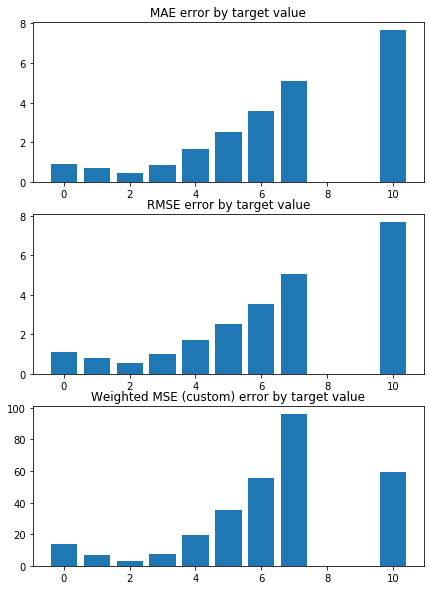

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 2.1775170398638157 

Mean squared error on Test: 1.02 
 MSE mean test:  2.1838257295859953 

Root of MSE on Test: 1.01 
 1.4777772936359508 

Variance score on Test: 0.06 
 r2_test: 0.26337866127199605 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 2.18
MSE_test 2.18
MAE_train 0.99
MAE_test 0.95
r2_test 0.26
    H3K4me1  H3K36me3      CTCF       GAF     Chriz   H3K4me2  \
0 -0.304902 -0.209493 -0.095829 -0.095754 -0.088649 -0.050730   
1 -0.301283 -0.209709 -0.094788 -0.084821 -0.069912 -0.065844   
2 -0.298047 -0.212596 -0.085425 -0.108034 -0.075010 -0.055876   
3 -0.319617 -0.213670 -0.103418 -0.083610 -0.074805 -0.057630   
4 -0.296258 -0.216145 -0.097418 -0.092728 -0.091781 -0.046294   
5 -0.297927 -0.210841 -0.094866 -0.090861 -0.091693 -0.055107   
6 -0.306836 -0.213220 -0.094754 -0.089298 -0.068972 -0.059114   
7 -0.310454 -0.213308 -0.093137 -0.096752 -0.081549 -0.053629   
8 -0.313243 -0.204361 -0.091204 -0.082485 -0.082

In [118]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object

alpha =  0.2 # 3000 + 0.2
l1_ratio = 0.5 # 0.000066 # 0.2 / (3000 + 0.2)

model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, fit_intercept=True, normalize=False, precompute=False, max_iter=1000, 
                                copy_X=True, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')


model_name = 'LR+L2_alf=.2_rat=.5'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [119]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.021150,0.061790,1.018305,0.007668,-,test_params = testtest,2.183826,0.283302,2.177517,0.031699,"[0.2962556507310605, 0.3084550915489469, 0.247...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."


In [120]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.0183049457782896 1.0211497929619533


In [121]:
coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:][coefs_argsort][0])
coefs_pd.round(2)

,H3K4me1,H3K36me3,CTCF,GAF,Chriz,H3K4me2,RNA-polymerase-II,Su(Hw),H3K4me3,BEAF-32,H3K36me1,H4K16ac,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,CP190
0,-0.09,-0.10,0.02,-0.01,-0.0,-0.10,-0.30,-0.05,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.00,-0.21,-0.0,-0.02
1,-0.07,-0.09,0.01,-0.03,-0.0,-0.08,-0.30,-0.07,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.02,-0.21,-0.0,-0.02
2,-0.08,-0.09,0.00,-0.02,-0.0,-0.11,-0.30,-0.06,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.02,-0.21,-0.0,-0.03
3,-0.07,-0.10,0.02,-0.02,-0.0,-0.08,-0.32,-0.06,-0.01,-0.0,-0.01,0.0,-0.0,-0.0,-0.00,-0.21,-0.0,-0.03
4,-0.09,-0.10,0.02,-0.03,-0.0,-0.09,-0.30,-0.05,-0.01,-0.0,-0.00,0.0,-0.0,-0.0,-0.02,-0.22,-0.0,-0.02
5,-0.09,-0.09,0.03,-0.01,-0.0,-0.09,-0.30,-0.06,-0.00,-0.0,-0.00,0.0,-0.0,-0.0,-0.01,-0.21,-0.0,-0.03
6,-0.07,-0.09,0.02,-0.03,-0.0,-0.09,-0.31,-0.06,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.00,-0.21,-0.0,-0.03
7,-0.08,-0.09,0.03,-0.02,-0.0,-0.10,-0.31,-0.05,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.01,-0.21,-0.0,-0.02
8,-0.08,-0.09,0.01,-0.01,-0.0,-0.08,-0.31,-0.06,-0.03,-0.0,-0.00,0.0,-0.0,-0.0,-0.00,-0.20,-0.0,-0.02
9,-0.08,-0.09,0.03,-0.01,-0.0,-0.11,-0.31,-0.05,-0.02,-0.0,-0.00,0.0,-0.0,-0.0,-0.01,-0.21,-0.0,-0.02


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9207946942169912 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0052947139709658 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


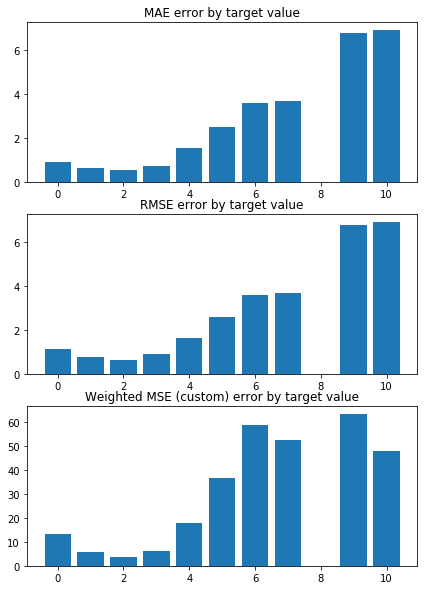

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9636326385605609 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0099787415727306 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


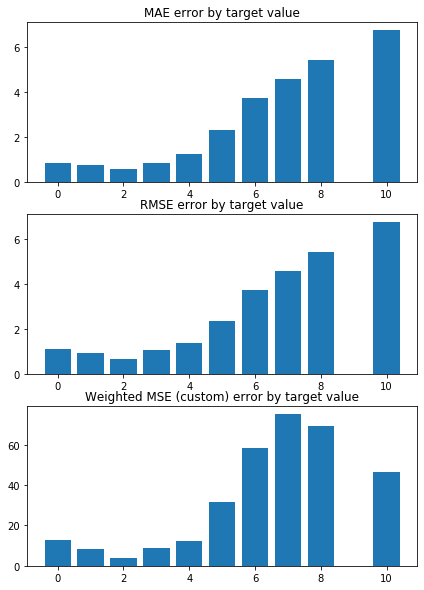

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9899108643765019 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0028070877586606 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


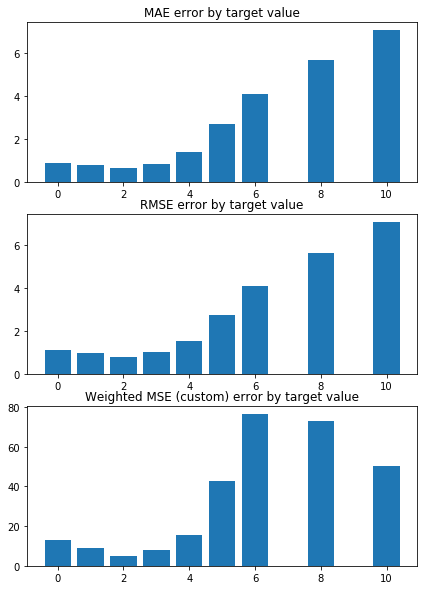

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0598734779663286 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9903170991439469 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


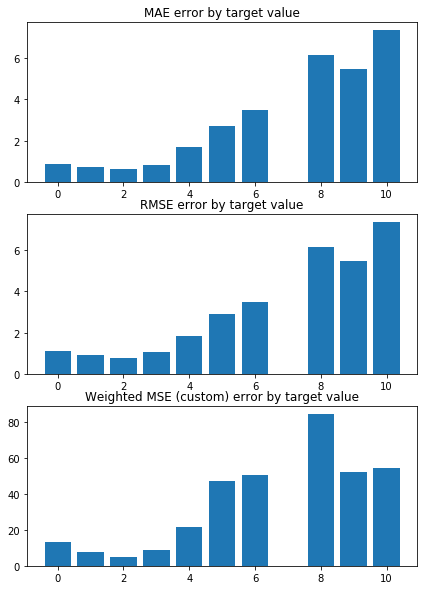

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9824384756272402 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0024322848366243 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


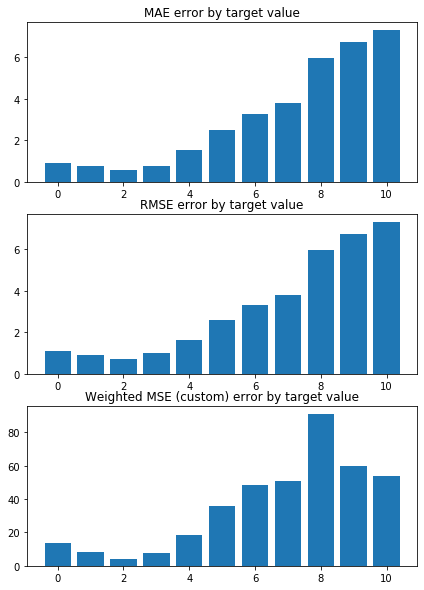

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.074025435929587 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9922696897590534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


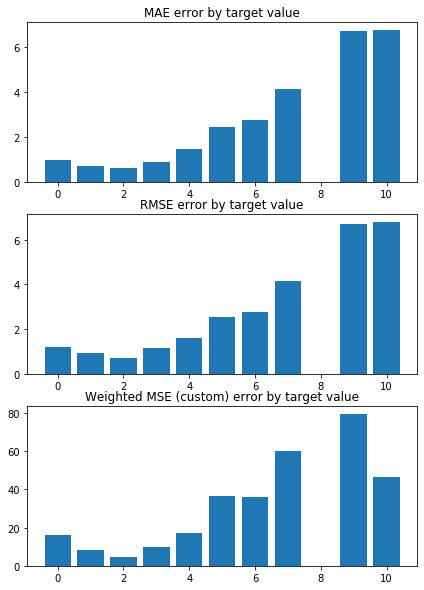

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.979877132949369 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0031022329965757 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


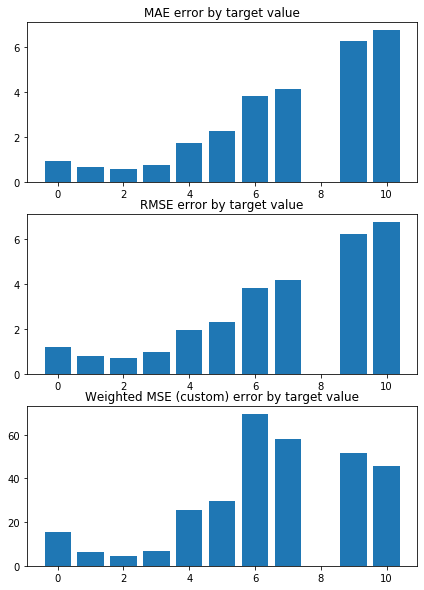

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.065803028248132 


 TRAIN PREDICTION Error
weighted_mse_train: 0.994112850950795 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


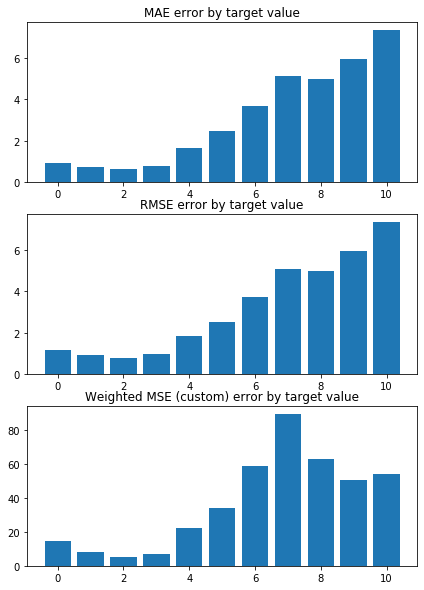

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0846201555666768 


 TRAIN PREDICTION Error
weighted_mse_train: 0.9875771971304794 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


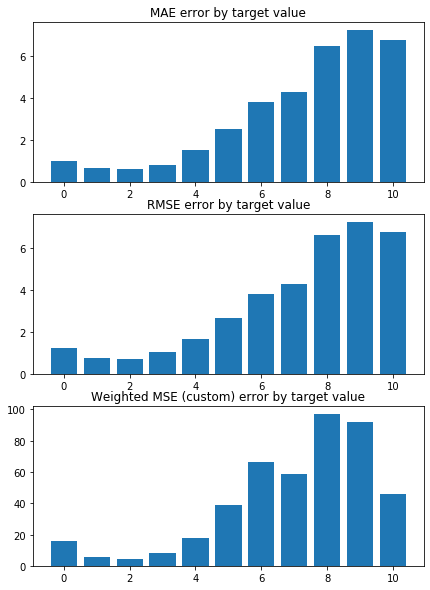

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 0.9338448457395163 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0081880474286722 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


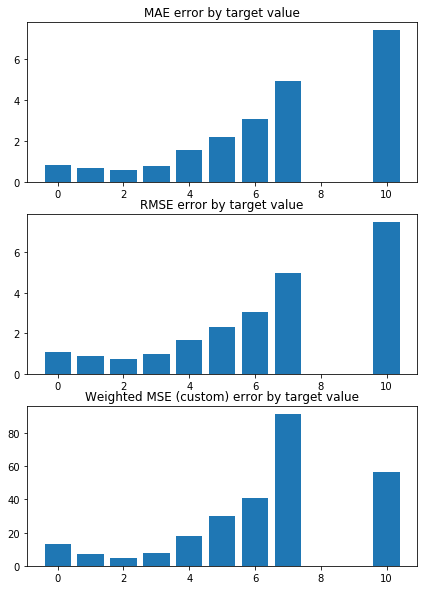

Weighted Mean squared error on Train: 1.00 
 MSE mean train: 2.076784477052019 

Mean squared error on Test: 1.01 
 MSE mean test:  2.0900530792800955 

Root of MSE on Test: 1.00 
 1.4457015872164267 

Variance score on Test: 0.06 
 r2_test: 0.294871896774198 

wMSE_train 1.0
wMSE_test 1.01
MSE_train 2.08
MSE_test 2.09
MAE_train 0.97
MAE_test 0.93
r2_test 0.29
   H3K36me3   H4K16ac   H3K4me1       GAF  H3K36me1    Su(Hw)   H3K4me3  \
0 -0.577725  0.383409 -0.359466 -0.290118 -0.286989  0.168162 -0.164325   
1 -0.616361  0.419153 -0.336181 -0.275444 -0.314071  0.151599 -0.146317   
2 -0.597374  0.407324 -0.344197 -0.311805 -0.323021  0.160319 -0.197146   
3 -0.594079  0.389974 -0.376728 -0.274175 -0.282688  0.161526 -0.129869   
4 -0.612782  0.394975 -0.323170 -0.292868 -0.313231  0.168017 -0.127444   
5 -0.580190  0.362782 -0.338988 -0.290572 -0.292281  0.184178 -0.127902   
6 -0.589758  0.401186 -0.357072 -0.285514 -0.280753  0.178384 -0.190846   
7 -0.567009  0.402720 -0.371730 -0.29

In [122]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression()

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)



In [123]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.021150,0.061790,1.018305,0.007668,-,test_params = testtest,2.183826,0.283302,2.177517,0.031699,"[0.2962556507310605, 0.3084550915489469, 0.247...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [124]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.095829,0.0,-0.088649,-0.014123,-0.000000,-0.050730,-0.015003,-0.0,-0.0,-0.0,-0.0,0.018201,-0.304902,-0.095754,-0.0,-0.209493,-0.004034,-0.022998
1,-0.094788,0.0,-0.069912,-0.027034,-0.000000,-0.065844,-0.023445,-0.0,-0.0,-0.0,-0.0,0.005533,-0.301283,-0.084821,-0.0,-0.209709,-0.015307,-0.023937
2,-0.085425,0.0,-0.075010,-0.020475,-0.000000,-0.055876,-0.024189,-0.0,-0.0,-0.0,-0.0,0.001121,-0.298047,-0.108034,-0.0,-0.212596,-0.022074,-0.033908
3,-0.103418,0.0,-0.074805,-0.016021,-0.009998,-0.057630,-0.010226,-0.0,-0.0,-0.0,-0.0,0.017064,-0.319617,-0.083610,-0.0,-0.213670,-0.002395,-0.027715
4,-0.097418,0.0,-0.091781,-0.029149,-0.000000,-0.046294,-0.010518,-0.0,-0.0,-0.0,-0.0,0.015601,-0.296258,-0.092728,-0.0,-0.216145,-0.017381,-0.021289
5,-0.094866,0.0,-0.091693,-0.014896,-0.000000,-0.055107,-0.004832,-0.0,-0.0,-0.0,-0.0,0.027379,-0.297927,-0.090861,-0.0,-0.210841,-0.014970,-0.034705
6,-0.094754,0.0,-0.068972,-0.030654,-0.000000,-0.059114,-0.022663,-0.0,-0.0,-0.0,-0.0,0.022697,-0.306836,-0.089298,-0.0,-0.213220,-0.002171,-0.027495
7,-0.093137,0.0,-0.081549,-0.018326,-0.000000,-0.053629,-0.022522,-0.0,-0.0,-0.0,-0.0,0.030352,-0.310454,-0.096752,-0.0,-0.213308,-0.005052,-0.019583
8,-0.091204,0.0,-0.082599,-0.013728,-0.000000,-0.064991,-0.028075,-0.0,-0.0,-0.0,-0.0,0.014017,-0.313243,-0.082485,-0.0,-0.204361,-0.004256,-0.023275
9,-0.093425,0.0,-0.080628,-0.010509,-0.000000,-0.052893,-0.024447,-0.0,-0.0,-0.0,-0.0,0.033319,-0.313453,-0.105299,-0.0,-0.207574,-0.008985,-0.018941


In [125]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0]

H3K36me3            -0.095829
H4K16ac              0.000000
H3K4me1             -0.088649
GAF                 -0.014123
H3K36me1            -0.000000
Su(Hw)              -0.050730
H3K4me3             -0.015003
H3K9me2             -0.000000
H3K27me3            -0.000000
Chriz               -0.000000
BEAF-32             -0.000000
CTCF                 0.018201
RNA-polymerase-II   -0.304902
H3K4me2             -0.095754
H3K9me3             -0.000000
H3K27me1            -0.209493
H3K27ac             -0.004034
CP190               -0.022998
Name: 0, dtype: float64

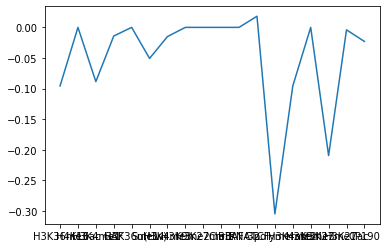

In [126]:
plt.plot(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0])

# !! одинаковая приоритизация 

In [127]:
np.sort(coefs[0])

array([-0.57772547, -0.3594663 , -0.29011816, -0.28698932, -0.16432497,
       -0.12695634, -0.12604734, -0.11142785, -0.10631542, -0.04853069,
       -0.00581899,  0.00597696,  0.04184823,  0.08478518,  0.10269672,
        0.15758958,  0.16816176,  0.38340929])

In [128]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,15,16,6,5,14,2,8,9,13,0,3,1,17,7,10,12,11,4
1,15,16,6,14,5,9,2,8,3,13,0,1,17,12,10,7,4,11
2,15,16,6,14,5,8,9,2,13,3,0,7,1,17,10,12,11,4
3,15,16,6,14,5,9,2,13,8,0,3,1,10,17,7,12,11,4
4,15,16,6,14,5,9,2,3,13,0,8,17,1,10,7,12,11,4
5,15,16,6,14,5,2,9,13,8,0,3,1,17,7,12,10,4,11
6,15,16,6,5,14,8,2,9,3,13,1,0,7,17,10,12,4,11
7,15,16,6,14,5,8,2,9,13,0,3,17,1,7,10,12,4,11
8,15,16,6,14,5,8,9,2,13,0,3,17,1,7,10,12,4,11
9,15,16,6,5,14,8,2,9,13,1,3,0,17,7,12,10,11,4


In [129]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['H3K36me3', 'H4K16ac', 'H3K4me1', 'GAF', 'H3K36me1', 'Su(Hw)',
       'H3K4me3', 'H3K9me2', 'H3K27me3', 'Chriz', 'BEAF-32', 'CTCF',
       'RNA-polymerase-II', 'H3K4me2', 'H3K9me3', 'H3K27me1', 'H3K27ac',
       'CP190'],
      dtype='object')

In [130]:
coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.577725,0.383409,-0.359466,-0.290118,-0.286989,0.168162,-0.164325,0.157590,-0.126956,-0.126047,-0.111428,-0.106315,0.102697,0.084785,-0.048531,0.041848,0.005977,-0.005819
1,-0.616361,0.419153,-0.336181,-0.275444,-0.314071,0.151599,-0.146317,0.183563,-0.139808,-0.110239,-0.144172,-0.106539,0.101943,0.014864,-0.041599,0.043259,-0.003246,0.005672
2,-0.597374,0.407324,-0.344197,-0.311805,-0.323021,0.160319,-0.197146,0.175827,-0.139477,-0.100911,-0.125101,-0.090360,0.072795,0.092363,-0.046445,0.035474,0.006935,0.004224
3,-0.594079,0.389974,-0.376728,-0.274175,-0.282688,0.161526,-0.129869,0.199568,-0.136894,-0.118621,-0.112343,-0.112245,0.091703,0.062607,-0.101839,0.026565,0.011618,-0.001554
4,-0.612782,0.394975,-0.323170,-0.292868,-0.313231,0.168017,-0.127444,0.185523,-0.145600,-0.140220,-0.146874,-0.105784,0.109111,0.060639,-0.061646,0.032289,0.009138,0.002598
5,-0.580190,0.362782,-0.338988,-0.290572,-0.292281,0.184178,-0.127902,0.145957,-0.134386,-0.127128,-0.108312,-0.106077,0.093980,0.049138,-0.025174,0.042408,0.008234,-0.009561
6,-0.589758,0.401186,-0.357072,-0.285514,-0.280753,0.178384,-0.190846,0.161715,-0.135340,-0.086946,-0.139071,-0.107558,0.078616,0.080258,-0.034095,0.022273,-0.000030,0.012057
7,-0.567009,0.402720,-0.371730,-0.294125,-0.295265,0.186193,-0.208134,0.150177,-0.131305,-0.118448,-0.109952,-0.098798,0.109829,0.095248,-0.050422,0.023658,-0.001231,-0.008355
8,-0.584696,0.380863,-0.369880,-0.273000,-0.283013,0.161267,-0.180824,0.173619,-0.137036,-0.123465,-0.121625,-0.091437,0.103464,0.069830,-0.055366,0.035833,-0.000031,0.002601
9,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,0.190189,-0.202178,0.142900,-0.141352,-0.104730,-0.104920,-0.107661,0.090605,0.087855,-0.029209,0.033101,0.002291,0.000570


In [131]:
coefs_df.round(2)

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.58,0.38,-0.36,-0.29,-0.29,0.17,-0.16,0.16,-0.13,-0.13,-0.11,-0.11,0.10,0.08,-0.05,0.04,0.01,-0.01
1,-0.62,0.42,-0.34,-0.28,-0.31,0.15,-0.15,0.18,-0.14,-0.11,-0.14,-0.11,0.10,0.01,-0.04,0.04,-0.00,0.01
2,-0.60,0.41,-0.34,-0.31,-0.32,0.16,-0.20,0.18,-0.14,-0.10,-0.13,-0.09,0.07,0.09,-0.05,0.04,0.01,0.00
3,-0.59,0.39,-0.38,-0.27,-0.28,0.16,-0.13,0.20,-0.14,-0.12,-0.11,-0.11,0.09,0.06,-0.10,0.03,0.01,-0.00
4,-0.61,0.39,-0.32,-0.29,-0.31,0.17,-0.13,0.19,-0.15,-0.14,-0.15,-0.11,0.11,0.06,-0.06,0.03,0.01,0.00
5,-0.58,0.36,-0.34,-0.29,-0.29,0.18,-0.13,0.15,-0.13,-0.13,-0.11,-0.11,0.09,0.05,-0.03,0.04,0.01,-0.01
6,-0.59,0.40,-0.36,-0.29,-0.28,0.18,-0.19,0.16,-0.14,-0.09,-0.14,-0.11,0.08,0.08,-0.03,0.02,-0.00,0.01
7,-0.57,0.40,-0.37,-0.29,-0.30,0.19,-0.21,0.15,-0.13,-0.12,-0.11,-0.10,0.11,0.10,-0.05,0.02,-0.00,-0.01
8,-0.58,0.38,-0.37,-0.27,-0.28,0.16,-0.18,0.17,-0.14,-0.12,-0.12,-0.09,0.10,0.07,-0.06,0.04,-0.00,0.00
9,-0.57,0.41,-0.37,-0.31,-0.30,0.19,-0.20,0.14,-0.14,-0.10,-0.10,-0.11,0.09,0.09,-0.03,0.03,0.00,0.00


In [132]:
# !! одинаковая приоритизация 

np.sort(coefs[0])

coefs

coefs_argsort[0]

pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

su_drsc.columns[2:], su_drsc.columns[2:][coefs_argsort[0]]

coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

coefs_df.round(2)

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.58,0.38,-0.36,-0.29,-0.29,0.17,-0.16,0.16,-0.13,-0.13,-0.11,-0.11,0.10,0.08,-0.05,0.04,0.01,-0.01
1,-0.62,0.42,-0.34,-0.28,-0.31,0.15,-0.15,0.18,-0.14,-0.11,-0.14,-0.11,0.10,0.01,-0.04,0.04,-0.00,0.01
2,-0.60,0.41,-0.34,-0.31,-0.32,0.16,-0.20,0.18,-0.14,-0.10,-0.13,-0.09,0.07,0.09,-0.05,0.04,0.01,0.00
3,-0.59,0.39,-0.38,-0.27,-0.28,0.16,-0.13,0.20,-0.14,-0.12,-0.11,-0.11,0.09,0.06,-0.10,0.03,0.01,-0.00
4,-0.61,0.39,-0.32,-0.29,-0.31,0.17,-0.13,0.19,-0.15,-0.14,-0.15,-0.11,0.11,0.06,-0.06,0.03,0.01,0.00
5,-0.58,0.36,-0.34,-0.29,-0.29,0.18,-0.13,0.15,-0.13,-0.13,-0.11,-0.11,0.09,0.05,-0.03,0.04,0.01,-0.01
6,-0.59,0.40,-0.36,-0.29,-0.28,0.18,-0.19,0.16,-0.14,-0.09,-0.14,-0.11,0.08,0.08,-0.03,0.02,-0.00,0.01
7,-0.57,0.40,-0.37,-0.29,-0.30,0.19,-0.21,0.15,-0.13,-0.12,-0.11,-0.10,0.11,0.10,-0.05,0.02,-0.00,-0.01
8,-0.58,0.38,-0.37,-0.27,-0.28,0.16,-0.18,0.17,-0.14,-0.12,-0.12,-0.09,0.10,0.07,-0.06,0.04,-0.00,0.00
9,-0.57,0.41,-0.37,-0.31,-0.30,0.19,-0.20,0.14,-0.14,-0.10,-0.10,-0.11,0.09,0.09,-0.03,0.03,0.00,0.00


In [133]:
coefs_df

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.577725,0.383409,-0.359466,-0.290118,-0.286989,0.168162,-0.164325,0.157590,-0.126956,-0.126047,-0.111428,-0.106315,0.102697,0.084785,-0.048531,0.041848,0.005977,-0.005819
1,-0.616361,0.419153,-0.336181,-0.275444,-0.314071,0.151599,-0.146317,0.183563,-0.139808,-0.110239,-0.144172,-0.106539,0.101943,0.014864,-0.041599,0.043259,-0.003246,0.005672
2,-0.597374,0.407324,-0.344197,-0.311805,-0.323021,0.160319,-0.197146,0.175827,-0.139477,-0.100911,-0.125101,-0.090360,0.072795,0.092363,-0.046445,0.035474,0.006935,0.004224
3,-0.594079,0.389974,-0.376728,-0.274175,-0.282688,0.161526,-0.129869,0.199568,-0.136894,-0.118621,-0.112343,-0.112245,0.091703,0.062607,-0.101839,0.026565,0.011618,-0.001554
4,-0.612782,0.394975,-0.323170,-0.292868,-0.313231,0.168017,-0.127444,0.185523,-0.145600,-0.140220,-0.146874,-0.105784,0.109111,0.060639,-0.061646,0.032289,0.009138,0.002598
5,-0.580190,0.362782,-0.338988,-0.290572,-0.292281,0.184178,-0.127902,0.145957,-0.134386,-0.127128,-0.108312,-0.106077,0.093980,0.049138,-0.025174,0.042408,0.008234,-0.009561
6,-0.589758,0.401186,-0.357072,-0.285514,-0.280753,0.178384,-0.190846,0.161715,-0.135340,-0.086946,-0.139071,-0.107558,0.078616,0.080258,-0.034095,0.022273,-0.000030,0.012057
7,-0.567009,0.402720,-0.371730,-0.294125,-0.295265,0.186193,-0.208134,0.150177,-0.131305,-0.118448,-0.109952,-0.098798,0.109829,0.095248,-0.050422,0.023658,-0.001231,-0.008355
8,-0.584696,0.380863,-0.369880,-0.273000,-0.283013,0.161267,-0.180824,0.173619,-0.137036,-0.123465,-0.121625,-0.091437,0.103464,0.069830,-0.055366,0.035833,-0.000031,0.002601
9,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,0.190189,-0.202178,0.142900,-0.141352,-0.104730,-0.104920,-0.107661,0.090605,0.087855,-0.029209,0.033101,0.002291,0.000570


In [134]:
coefs_df_2 = coefs_df.round(2)
coefs_df_2

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.58,0.38,-0.36,-0.29,-0.29,0.17,-0.16,0.16,-0.13,-0.13,-0.11,-0.11,0.10,0.08,-0.05,0.04,0.01,-0.01
1,-0.62,0.42,-0.34,-0.28,-0.31,0.15,-0.15,0.18,-0.14,-0.11,-0.14,-0.11,0.10,0.01,-0.04,0.04,-0.00,0.01
2,-0.60,0.41,-0.34,-0.31,-0.32,0.16,-0.20,0.18,-0.14,-0.10,-0.13,-0.09,0.07,0.09,-0.05,0.04,0.01,0.00
3,-0.59,0.39,-0.38,-0.27,-0.28,0.16,-0.13,0.20,-0.14,-0.12,-0.11,-0.11,0.09,0.06,-0.10,0.03,0.01,-0.00
4,-0.61,0.39,-0.32,-0.29,-0.31,0.17,-0.13,0.19,-0.15,-0.14,-0.15,-0.11,0.11,0.06,-0.06,0.03,0.01,0.00
5,-0.58,0.36,-0.34,-0.29,-0.29,0.18,-0.13,0.15,-0.13,-0.13,-0.11,-0.11,0.09,0.05,-0.03,0.04,0.01,-0.01
6,-0.59,0.40,-0.36,-0.29,-0.28,0.18,-0.19,0.16,-0.14,-0.09,-0.14,-0.11,0.08,0.08,-0.03,0.02,-0.00,0.01
7,-0.57,0.40,-0.37,-0.29,-0.30,0.19,-0.21,0.15,-0.13,-0.12,-0.11,-0.10,0.11,0.10,-0.05,0.02,-0.00,-0.01
8,-0.58,0.38,-0.37,-0.27,-0.28,0.16,-0.18,0.17,-0.14,-0.12,-0.12,-0.09,0.10,0.07,-0.06,0.04,-0.00,0.00
9,-0.57,0.41,-0.37,-0.31,-0.30,0.19,-0.20,0.14,-0.14,-0.10,-0.10,-0.11,0.09,0.09,-0.03,0.03,0.00,0.00


In [135]:
coefs_means = pd.DataFrame ( coefs_df.mean() )
coefs_means.round(2)# .values, coefs_means.values

,0
H3K36me3,-0.59
H4K16ac,0.39
H3K4me1,-0.35
GAF,-0.29
H3K36me1,-0.30
Su(Hw),0.17
H3K4me3,-0.17
H3K9me2,0.17
H3K27me3,-0.14
Chriz,-0.12


In [136]:
coefs_std = pd.DataFrame (coefs_df.std())

coefs_std.round(4)

,0
H3K36me3,0.0170
H4K16ac,0.0161
H3K4me1,0.0180
GAF,0.0134
H3K36me1,0.0150
Su(Hw),0.0130
H3K4me3,0.0325
H3K9me2,0.0189
H3K27me3,0.0053
Chriz,0.0153


In [137]:
order_df = np.argsort(np.abs(coefs_means))
priority_order = order_df.index.values

priority_order


array(['H3K36me3', 'H4K16ac', 'H3K4me1', 'GAF', 'H3K36me1', 'Su(Hw)',
       'H3K4me3', 'H3K9me2', 'H3K27me3', 'Chriz', 'BEAF-32', 'CTCF',
       'RNA-polymerase-II', 'H3K4me2', 'H3K9me3', 'H3K27me1', 'H3K27ac',
       'CP190'], dtype=object)

In [138]:
coefs_df_2[priority_order]

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,Su(Hw),H3K4me3,H3K9me2,H3K27me3,Chriz,BEAF-32,CTCF,RNA-polymerase-II,H3K4me2,H3K9me3,H3K27me1,H3K27ac,CP190
0,-0.58,0.38,-0.36,-0.29,-0.29,0.17,-0.16,0.16,-0.13,-0.13,-0.11,-0.11,0.10,0.08,-0.05,0.04,0.01,-0.01
1,-0.62,0.42,-0.34,-0.28,-0.31,0.15,-0.15,0.18,-0.14,-0.11,-0.14,-0.11,0.10,0.01,-0.04,0.04,-0.00,0.01
2,-0.60,0.41,-0.34,-0.31,-0.32,0.16,-0.20,0.18,-0.14,-0.10,-0.13,-0.09,0.07,0.09,-0.05,0.04,0.01,0.00
3,-0.59,0.39,-0.38,-0.27,-0.28,0.16,-0.13,0.20,-0.14,-0.12,-0.11,-0.11,0.09,0.06,-0.10,0.03,0.01,-0.00
4,-0.61,0.39,-0.32,-0.29,-0.31,0.17,-0.13,0.19,-0.15,-0.14,-0.15,-0.11,0.11,0.06,-0.06,0.03,0.01,0.00
5,-0.58,0.36,-0.34,-0.29,-0.29,0.18,-0.13,0.15,-0.13,-0.13,-0.11,-0.11,0.09,0.05,-0.03,0.04,0.01,-0.01
6,-0.59,0.40,-0.36,-0.29,-0.28,0.18,-0.19,0.16,-0.14,-0.09,-0.14,-0.11,0.08,0.08,-0.03,0.02,-0.00,0.01
7,-0.57,0.40,-0.37,-0.29,-0.30,0.19,-0.21,0.15,-0.13,-0.12,-0.11,-0.10,0.11,0.10,-0.05,0.02,-0.00,-0.01
8,-0.58,0.38,-0.37,-0.27,-0.28,0.16,-0.18,0.17,-0.14,-0.12,-0.12,-0.09,0.10,0.07,-0.06,0.04,-0.00,0.00
9,-0.57,0.41,-0.37,-0.31,-0.30,0.19,-0.20,0.14,-0.14,-0.10,-0.10,-0.11,0.09,0.09,-0.03,0.03,0.00,0.00


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

In [139]:
def getConfIdxFrequencies(coefs_argsort, feature_names, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(feature_names[key], value)) # (feature_names[key], value))
        
    return featur_freq_dict

In [140]:
feature_names = su_drsc.columns[2:]
feature_names

Index(['Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190', 'GAF', 'H3K4me1',
       'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac', 'H3K27me1',
       'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac', 'RNA-polymerase-II'],
      dtype='object')

In [141]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 0)

H3K4me1: 20
H3K36me3: 20
H4K16ac: 20
Chriz: 10
CTCF: 10
Su(Hw): 10
BEAF-32: 10
CP190: 10
GAF: 10
H3K4me2: 10
H3K4me3: 10
H3K9me2: 10
H3K9me3: 10
H3K27ac: 10
H3K27me1: 10
H3K27me3: 10
H3K36me1: 10
RNA-polymerase-II: 10


In [142]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 5, max_lim = 0)

GAF: 20
H3K4me1: 20
H3K36me1: 20
H3K36me3: 20
H4K16ac: 20
Chriz: 10
CTCF: 10
Su(Hw): 10
BEAF-32: 10
CP190: 10
H3K4me2: 10
H3K4me3: 10
H3K9me2: 10
H3K9me3: 10
H3K27ac: 10
H3K27me1: 10
H3K27me3: 10
RNA-polymerase-II: 10


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONST pred

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONSTANT pred Error:

In [176]:

print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5332379669573635
weighted_mse_test_const:  1.496247603284074


In [177]:

def train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )


        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5332379669573635
weighted_mse_test_const:  1.496247603284074


In [178]:
#  weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

In [179]:
# weighted_mse_test_all, weighted_mse_train_all

In [180]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")
# # Explained variance score: 1 is perfect prediction
# print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error CONST std on Train : 0.86 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.98 
 wmst CONST std test 0.07 



In [181]:
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )

 CONSTANT pred Error:
weighted_mse_train_const:  1.5332379669573635
weighted_mse_test_const:  1.496247603284074


In [182]:
def train_test_KFold_const(X, y, n_splits=5, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )
        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5332379669573635
weighted_mse_test_const:  1.496247603284074


In [183]:
weighted_mse_test_all, \
weighted_mse_train_all  =  train_test_KFold_const(X, 
                                                 y,
                                                 n_splits=5, 
                                                 random_state=16,
                                                 shuffle=True)


KFold(n_splits=5, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5267977315485752
weighted_mse_test_const:  1.5671122842180352
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5376470986636548
weighted_mse_test_const:  1.4643681310579366
train_index= [   1    4    5 ... 5944 5945 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5289366815751748
weighted_mse_test_const:  1.5193424102054733
train_index= [   0    1    2 ... 5946 5947 5948]
 CONSTANT pred Error:
weighted_mse_train_const:  1.532506020189629
weighted_mse_test_const:  1.5520022975693186
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5215012849816822
weighted_mse_test_const:  1.5469370823910027
Weighted Mean squared error on Train: 1.53 
 [1.52679773 1.5376471  1.52893668 1.53250602 1.52150128] 

Weighted Mean squared error on Test: 1

In [184]:
 weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5233751150317654
weighted_mse_test_const:  1.5729131802711864
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5332283816329182
weighted_mse_test_const:  1.555598172469537
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5376290480141426
weighted_mse_test_const:  1.4484520826241511
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5286165420930318
weighted_mse_test_const:  1.4871218475178962
train_index= [   0    1    2 ... 5946 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5246067463854969
weighted_mse_test_const:  1.5691848499209409
train_index= [   1    4    5 ... 5945 5947 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5339147139949958
weighted_mse_test_const:

In [185]:
# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      weighted_mse_train_all, "\n")

# The mean squared error
print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      weighted_mse_test_all, "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error on Train: 1.53 
 [1.52337512 1.53322838 1.53762905 1.52861654 1.52460675 1.53391471
 1.53959795 1.52207601 1.51866253 1.53323797] 

Weighted Mean squared error on Test: 1.53 
 [1.57291318 1.55559817 1.44845208 1.48712185 1.56918485 1.4719829
 1.46985772 1.62580947 1.60073481 1.4962476 ] 

Variance score on Test: 0.06 
 [1.57291318 1.55559817 1.44845208 1.48712185 1.56918485 1.4719829
 1.46985772 1.62580947 1.60073481 1.4962476 ] 



In [186]:
%%time

for train_index, test_index in kf.split(X):
    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    #         # Train the model using the training sets
    #         model.fit(X_train, y_train)

    #         # Make predictions using the train set
    #         y_pred_train = model.predict(X_train)

    #         # Make predictions using the testing set
    #         y_pred = model.predict(X_test)


    print(" CONSTANT pred Error:" )

    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )
    const_pred_train = np.array([const_pred] * len(y_train) )


    y_pred_train = const_pred_train
    y_pred = const_pred_test
    
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    print("Mean squared error on Train: %.2f"
          % mean_squared_error(y_train, y_pred_train))

    # The mean squared error
    print("Mean squared error on Test: %.2f"
          % mean_squared_error(y_test, y_pred))

    # The mean squared error
    print("Root of Mean squared error: %.2f"
          % np.sqrt(mean_squared_error(y_test, y_pred)))

    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.2f' % r2_score(y_test, y_pred))


    print("MAE on Train: %.2f"
          % mae_cout(y_train, y_pred_train))

    # The mean squared error
    print("MAE on Test: %.2f"
          %  mae_cout(y_test, y_pred))


train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.52
wMean squared error on Test: 1.57
Mean squared error on Train: 2.94
Mean squared error on Test: 3.09
Root of Mean squared error: 1.76
Variance score: -0.00
MAE on Train: 1.26
MAE on Test: 1.28
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.53
wMean squared error on Test: 1.56
Mean squared error on Train: 2.98
Mean squared error on Test: 2.76
Root of Mean squared error: 1.66
Variance score: -0.00
MAE on Train: 1.27
MAE on Test: 1.25
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.54
wMean squared error on Test: 1.45
Mean squared error on Train: 2.95
Mean squared error on Test: 2.98
Root of Mean squared error: 1.73
Variance score: -0.00
MAE on Train: 1.27
MAE on Test: 1.26
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.

In [187]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 1.53 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.53 
 wmst CONST std test 0.06 



In [188]:
res_dict = {
        'model_name': 'const_pred',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.021150,0.061790,1.018305,0.007668,-,test_params = testtest,2.183826,0.283302,2.177517,0.031699,"[0.2962556507310605, 0.3084550915489469, 0.247...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.979702,0.067315,0.862994,0.007828,-,test_params = testtest,2.025571,0.290527,1.731170,0.029075,"[0.3484217503353917, 0.3816153874190983, 0.294...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# L1 Lasso regulization

In [155]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.2)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

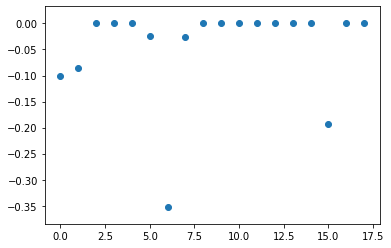

In [156]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [157]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index(['Chriz', 'CTCF', 'GAF', 'H3K4me1', 'H3K4me2', 'H3K36me3'], dtype='object')

In [158]:
lin_reg_l1.coef_

array([-0.10074271, -0.08480758,  0.        , -0.        , -0.        ,
       -0.02389782, -0.35196781, -0.02563836, -0.        , -0.        ,
       -0.        ,  0.        , -0.        , -0.        , -0.        ,
       -0.19332538, -0.        , -0.        ])

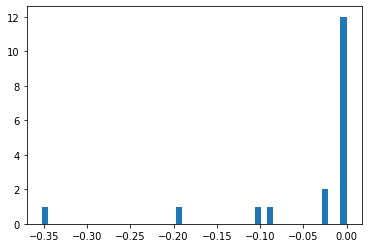

In [159]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [160]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.8)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

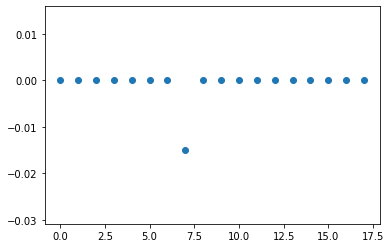

In [161]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [162]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index(['H3K4me2'], dtype='object')

In [163]:
lin_reg_l1.coef_

array([-0.        , -0.        ,  0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.01491769, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        ])

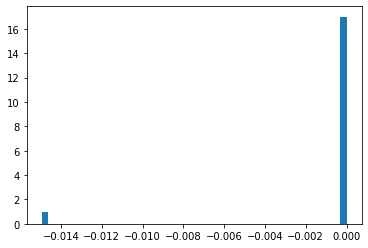

In [164]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

# Gradient Boosting Regressor

In [165]:
%%time

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

from sklearn import ensemble

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.88
wMean squared error on Test: 0.88
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 0.97
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.85
wMean squared error on Test: 1.06
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 0.95
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 1.03
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.95
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.86
wMean squared error on Test: 1.02
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [166]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.86 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.98 
 wmst CONST std test 0.07 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [167]:
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    
#     y_pred_train = const_pred_train
#     y_pred = const_pred_test

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))

    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))

    
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.98
wMean squared error on Test: 1.01
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 1.00
wMean squared error on Test: 0.98
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.99
wMean squared error on Test: 1.00
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.97
wMean squared error on Test: 1.08
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.98
wMean squared error on Test: 1.04
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.98
wMean squared error on Test: 1.05
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.99
wMean squared error on Test: 1.00
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.97
wMean squared error on Test: 1.09
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

,H3K36me3,H4K16ac,H3K4me1,GAF,H3K36me1,H3K4me3,Su(Hw),H3K9me2,H3K27me3,CTCF,BEAF-32,Chriz,RNA-polymerase-II,H3K4me2,H3K27me1,H3K9me3,H3K27ac,CP190
0,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
1,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
2,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
3,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
4,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
5,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
6,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
7,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
8,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057
9,-0.567082,0.405173,-0.368541,-0.308399,-0.297538,-0.202178,0.190189,0.1429,-0.141352,-0.107661,-0.10492,-0.10473,0.090605,0.087855,0.033101,-0.029209,0.002291,0.00057


In [168]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 0.98 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.04 
 wmst CONST std test 0.06 



In [172]:
%%time

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.93
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.88
wMean squared error on Test: 0.88
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 0.97
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.85
wMean squared error on Test: 1.06
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 0.95
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.86
wMean squared error on Test: 1.03
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.87
wMean squared error on Test: 0.95
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.86
wMean squared error on Test: 1.02
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [173]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.86 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 0.98 
 wmst CONST std test 0.07 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [174]:
res_dict = {
        'model_name': 'GB_250',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.021150,0.061790,1.018305,0.007668,-,test_params = testtest,2.183826,0.283302,2.177517,0.031699,"[0.2962556507310605, 0.3084550915489469, 0.247...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.979702,0.067315,0.862994,0.007828,-,test_params = testtest,2.025571,0.290527,1.731170,0.029075,"[0.3484217503353917, 0.3816153874190983, 0.294...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# Results

In [175]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,0.882082,0.040723,0.876603,0.012100,-,test_params = testtest,1.266081,0.083519,1.258338,0.020777,"[0.3472149517480847, 0.34455933626229596, 0.34...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.041412,0.060445,1.039063,0.007542,-,test_params = testtest,2.227075,0.281908,2.222527,0.032013,"[0.2764647094864522, 0.2894195516690937, 0.243...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.011888,0.063509,1.009534,0.007595,-,test_params = testtest,2.157325,0.284529,2.151431,0.031314,"[0.3127544808171704, 0.3230281519835312, 0.257...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.007421,0.063334,1.004701,0.007526,-,test_params = testtest,2.142389,0.283863,2.135602,0.031132,"[0.3194598537822644, 0.32861264494364295, 0.26...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.245675,0.055538,1.244323,0.009314,-,test_params = testtest,2.561264,0.263388,2.559190,0.033201,"[0.14360256879856093, 0.14899218675661052, 0.1...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.021150,0.061790,1.018305,0.007668,-,test_params = testtest,2.183826,0.283302,2.177517,0.031699,"[0.2962556507310605, 0.3084550915489469, 0.247...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.005482,0.057482,0.999608,0.007477,-,test_params = testtest,2.090053,0.273496,2.076784,0.030222,"[0.34664723078072357, 0.3388569208172696, 0.26...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,0.979702,0.067315,0.862994,0.007828,-,test_params = testtest,2.025571,0.290527,1.731170,0.029075,"[0.3484217503353917, 0.3816153874190983, 0.294...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [171]:
data.columns.shape, data.columns

((18,), Index(['Chriz', 'CTCF', 'Su(Hw)', 'BEAF-32', 'CP190', 'GAF', 'H3K4me1',
        'H3K4me2', 'H3K4me3', 'H3K9me2', 'H3K9me3', 'H3K27ac', 'H3K27me1',
        'H3K27me3', 'H3K36me1', 'H3K36me3', 'H4K16ac', 'RNA-polymerase-II'],
       dtype='object'))